<a href="https://colab.research.google.com/github/Atom-101/PokeGAN/blob/master/PokeGAN_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#@title
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse

from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass

!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}


E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package libfuse2:amd64.
(Reading database ... 22298 files and directories currently installed.)
Preparing to unpack .../libfuse2_2.9.7-1ubuntu1_amd64.deb ...
Unpacking libfuse2:amd64 (2.9.7-1ubuntu1) ...
Selecting previously unselected package fuse.
Preparing to unpack .../fuse_2.9.7-1ubuntu1_amd64.deb ...
Unpacking fuse (2.9.7-1ubuntu1) ...
Selecting previously unselected package google-drive-ocamlfuse.
Preparing to unpack .../google-drive-ocamlfuse_0.7.0-0ubuntu1~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.0-0ubuntu1~ubuntu18.04.1) ...
Setting up libfuse2:amd64 (2.9.7-1ubuntu1) ...
Processing triggers for libc-bin (2.27-3ubuntu1) ...
Setting up fuse (2.9.7-1ubuntu1) ...
Setting up google-drive-ocamlfuse (0.7.0-0ubuntu1~ubuntu18.04.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleus

In [0]:
!mkdir -p drive
!google-drive-ocamlfuse drive

import os

In [0]:
import tensorflow as tf
tf.test.gpu_device_name()


'/device:GPU:0'

In [0]:
!apt-get -qq install -y libsm6 libxext6 && pip install -q -U opencv-python
import cv2

import os
from random import shuffle
import glob
import numpy as np
import h5py
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [0]:
def show_images(images):

  image = images[0]
  image += 1
  image /= 2.0
  #image = np.ceil(image)
  
  plt.axis('off')
  plt.imshow(image)

#Load

In [0]:
dat = h5py.File('drive/Pokemon/Dataset/HDF5/Pokemon_Fire_Dataset.h5', 'r')
img_array = dat['Pokemon']

print(img_array.shape)

img_array = np.asarray(img_array, dtype = np.float16)

(37962, 96, 96, 3)


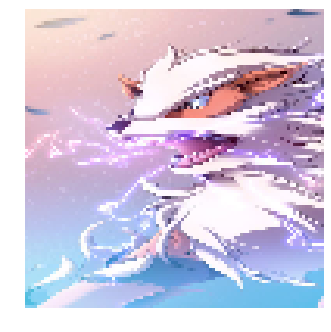

In [0]:
show_images(np.asarray(img_array[3119:3200], dtype = np.float32))
plt.show()

#Discriminator

In [0]:
def discriminator(x,isTrain,keep_prob):
  
    with tf.variable_scope("discriminator"):
        
        
        print(x.shape)
        #print([-1,tf.sqrt(tf.cast(x.shape[1],tf.float32)),tf.sqrt(tf.cast(x.shape[1],tf.float32)),1])
        #x = tf.reshape(x,[-1,(int)((int)(x.shape[1])**.5),(int)((int)(x.shape[1])**.5),1])
        
        x = tf.reshape(x,[-1,96,96,3])
        
        print(x.shape)
        
        logits = tf.layers.conv2d(x,128,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,256,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,512,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,1024,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.flatten(logits)
        
        logits = tf.layers.dense(logits, 1, name = 'discriminator_out', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        
        return logits


# Generator

In [0]:
def generator(z,isTrain,keep_prob):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    with tf.variable_scope("generator"):
        # TODO: implement architecture
        
        #print(z.shape)     
        
        img = tf.layers.dense(z, 6*6*1024, activation = tf.nn.leaky_relu, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        img = tf.layers.batch_normalization(img, training = isTrain)
        '''
        img = tf.layers.dense(img, 32*16*16, activation = tf.nn.relu, kernel_initializer=tf.random_normal_initializer(dtype=tf.float16) )
        img = tf.layers.batch_normalization(img, training = isTrain)
        '''
        img = tf.reshape(img,[-1,6,6,1024])
        
        img = tf.layers.conv2d_transpose(img, 512, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 256, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 128, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 3, 3, strides = 2, padding ='same', name = 'generator_out', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        img = tf.nn.tanh(img)
        
        print(img.shape)
        
        #img  = tf.layers.flatten(img)
        
        pass
        return img

In [0]:
def get_solvers(learning_rate=1e-4, beta1=0, beta2=0.9):

    D_solver = None
    G_solver = None
    
    D_solver = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1, beta2=beta2, name = 'D_solver_adam')
    G_solver = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1, beta2=beta2, name = 'G_solver_adam')
    
    pass
    return D_solver, G_solver

In [0]:
def wgan_loss(logits_real, logits_fake, real_data, fake_data,keep_prob,isTrain, batch_size = 32):

  lambd = 10
  G_loss = -tf.reduce_mean(logits_fake)
  D_loss = tf.reduce_mean(logits_fake) - tf.reduce_mean(logits_real) 
  
  #Implement gradient penalty
  epsilon = tf.random_uniform([batch_size,1,1,1], minval = 0, maxval = 1)
  #interpolates = tf.multiply((1-epsilon),real_data)+tf.multiply(epsilon,fake_data) #introduce randomness using epsilon
  interpolates = (1-epsilon)*real_data + epsilon* fake_data
  with tf.variable_scope('', reuse =True):
      grads = tf.gradients(discriminator(interpolates,isTrain,keep_prob), [interpolates])[0] #why is this zero used?
  
  slopes = tf.sqrt(tf.reduce_sum(tf.square(grads))) #L2-norm
  grad_penalty = tf.reduce_mean((slopes-1.)**2)#penalty is a scalar
  
  D_loss += lambd*grad_penalty
    
  pass
  return D_loss, G_loss

In [0]:
tf.reset_default_graph()

batch_size = 32
# our noise dimension
noise_dim = 100

# placeholders for images from the training dataset
x = tf.placeholder(tf.float32, [None, 96, 96, 3])
isTrain = tf.placeholder(tf.bool, shape=(), name = 'isTrain')
keep_prob = tf.placeholder_with_default(1.0, shape=())

z = tf.random_uniform([batch_size,noise_dim],minval = -1, maxval = 1)
# generated images

G_sample = generator(z,isTrain,keep_prob)

#Variable to store D_loss of each epoch
d_losses = []

#Run when D_loss and G_loss are called
with tf.variable_scope("") as scope:
    logits_real = discriminator(x,isTrain,keep_prob)
    fake_data = G_sample
    scope.reuse_variables()
    logits_fake = discriminator(fake_data,isTrain,keep_prob)

# Get the list of variables for the discriminator and generator
D_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,'discriminator')
G_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,'generator') 


D_solver,G_solver = get_solvers()
D_loss, G_loss = wgan_loss(logits_real, logits_fake, x, fake_data,keep_prob,isTrain, batch_size = batch_size)




#Update extra variables like batch_norm gamma and beta
D_extra_step = tf.get_collection(tf.GraphKeys.UPDATE_OPS,'discriminator')
G_extra_step = tf.get_collection(tf.GraphKeys.UPDATE_OPS,'generator')


with tf.control_dependencies(D_extra_step):
  D_train_step = D_solver.minimize(D_loss, var_list=D_vars)

with tf.control_dependencies(G_extra_step):
  G_train_step = G_solver.minimize(G_loss, var_list=G_vars)


(32, 96, 96, 3)
(?, 96, 96, 3)
(?, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)


In [0]:
def minibatches(inputs, batchsize):
    indices = np.arange(inputs.shape[0])
    np.random.shuffle(indices)
    x = []
    for i in range(batchsize):
        x.append(inputs[indices[i]])
    return np.asarray(x)

In [0]:
def run_a_gan(sess, G_train_step, G_loss, D_train_step, D_loss, G_extra_step, D_extra_step, saver,
                     show_every=20, print_every=1, batch_size=32, num_epoch=10):
   
   
    for epoch in range(0,num_epoch):
        prob = 1 - 0.4**epoch #ranges from 0.6 to 1
        #X = minibatches(img_array,batch_size)
        # every so often, show a sample result
        if (epoch % show_every == 0):
            samples = sess.run(G_sample, feed_dict={isTrain:False})
            fig = show_images(samples[:4])
            plt.show()
            #Save image samples generated while training
            
            print()
        
        _, G_loss_curr = sess.run([G_train_step, G_loss], feed_dict={isTrain:True,keep_prob:prob})
           
        #Train critic 5 times per epoch
        for _ in range(5):
          X = minibatches(img_array,batch_size)
          _, D_loss_curr = sess.run([D_train_step, D_loss], feed_dict={x: X, isTrain:True,keep_prob:prob})
          

        #Various displays
        if (epoch % print_every == 0):
            print('Epoch: {}, D: {:.4}, G: {:.4}'.format(epoch,D_loss_curr,G_loss_curr))
        
        #Save stuff every 400 epochs
        if (epoch % 400 == 399):    
          try: 
            saver.save(sess, 'drive/Pokemon_Fire/Final_Checkpoints/Model_'+str(epoch)+'.ckpt')
            np.save('drive/Pokemon_Fire/Final_Discriminator_loss.npy', np.asarray(d_losses))
          except:
            pass
          
          
        d_losses.append(D_loss_curr)
          
        if(epoch%500 == 0):  
          try:
            if(epoch>=1000):
                 with h5py.File('drive/Pokemon_Fire/Final_gen_while_training.h5','a') as file:
                     file.create_dataset('Samples'+str(epoch),samples.shape, np.float32)
                     file['Samples'+str(epoch)][...] = np.asarray(samples, dtype = np.float32)
          except:
            pass

    
    saver.save(sess, 'drive/Pokemon_Fire/Final_Checkpoint_Complete/model.ckpt')
    
    print('Final images')
    samples = sess.run(G_sample, feed_dict={isTrain:False})
    fig = show_images(samples1[:4])
    plt.show()

Initialization done!


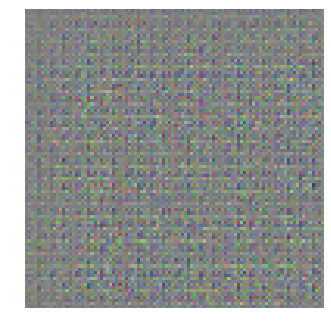


Epoch: 0, D: 20.53, G: 1.248
Epoch: 1, D: 10.01, G: 14.13
Epoch: 2, D: 8.182, G: 4.745
Epoch: 3, D: -2.429, G: 27.54
Epoch: 4, D: -0.2637, G: 10.16
Epoch: 5, D: 0.4118, G: 26.08
Epoch: 6, D: 8.345, G: 19.65
Epoch: 7, D: -6.007, G: 12.43
Epoch: 8, D: -0.6602, G: 30.52
Epoch: 9, D: 1.488, G: 11.15
Epoch: 10, D: -5.58, G: 31.14
Epoch: 11, D: -16.33, G: 6.843
Epoch: 12, D: -9.53, G: 23.53
Epoch: 13, D: -10.67, G: 5.634
Epoch: 14, D: -9.681, G: 26.81
Epoch: 15, D: -16.84, G: 15.55
Epoch: 16, D: -10.86, G: 22.41
Epoch: 17, D: -20.25, G: 29.55
Epoch: 18, D: -14.29, G: 11.97
Epoch: 19, D: -8.688, G: 27.35


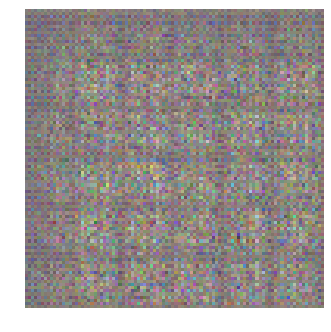


Epoch: 20, D: -20.74, G: 25.23
Epoch: 21, D: -18.84, G: 8.331
Epoch: 22, D: -20.76, G: 31.21
Epoch: 23, D: -19.27, G: 4.211
Epoch: 24, D: -21.94, G: 21.71
Epoch: 25, D: -19.04, G: 30.63
Epoch: 26, D: -17.22, G: 15.82
Epoch: 27, D: -18.79, G: 28.6
Epoch: 28, D: -22.42, G: 6.931
Epoch: 29, D: -17.95, G: 24.75
Epoch: 30, D: -19.11, G: 26.83
Epoch: 31, D: -18.15, G: 7.92
Epoch: 32, D: -16.37, G: 32.18
Epoch: 33, D: -14.88, G: 13.0
Epoch: 34, D: -20.69, G: 25.37
Epoch: 35, D: -18.77, G: 12.72
Epoch: 36, D: -18.9, G: 28.82
Epoch: 37, D: -17.49, G: 7.905
Epoch: 38, D: -14.2, G: 21.9
Epoch: 39, D: -14.99, G: 23.23


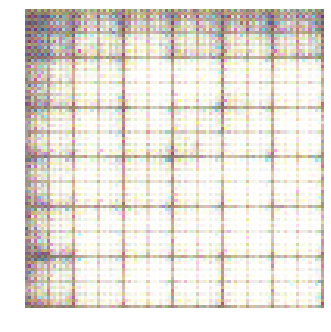


Epoch: 40, D: -14.88, G: 9.474
Epoch: 41, D: -13.65, G: 18.5
Epoch: 42, D: -13.0, G: 16.96
Epoch: 43, D: -10.06, G: 10.76
Epoch: 44, D: -11.39, G: 21.76
Epoch: 45, D: -15.11, G: 12.29
Epoch: 46, D: -10.58, G: 19.59
Epoch: 47, D: -11.43, G: 24.61
Epoch: 48, D: -12.5, G: 10.94
Epoch: 49, D: -10.84, G: 16.55
Epoch: 50, D: -10.73, G: 13.69
Epoch: 51, D: -11.03, G: 19.65
Epoch: 52, D: -9.268, G: 8.804
Epoch: 53, D: -11.58, G: 19.78
Epoch: 54, D: -9.092, G: 7.928
Epoch: 55, D: -12.17, G: 18.8
Epoch: 56, D: -10.99, G: 12.21
Epoch: 57, D: -10.15, G: 23.55
Epoch: 58, D: -10.03, G: 16.06
Epoch: 59, D: -11.15, G: 9.366


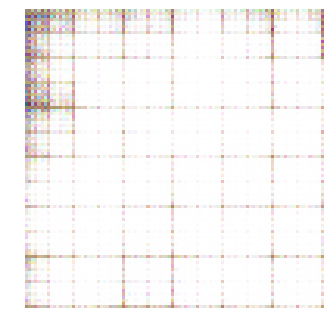


Epoch: 60, D: -10.87, G: 17.31
Epoch: 61, D: -9.199, G: 11.46
Epoch: 62, D: -9.205, G: 19.85
Epoch: 63, D: -9.537, G: 5.701
Epoch: 64, D: -10.85, G: 13.12
Epoch: 65, D: -10.17, G: 26.48
Epoch: 66, D: -9.051, G: 18.3
Epoch: 67, D: -10.06, G: 4.775
Epoch: 68, D: -10.66, G: 19.45
Epoch: 69, D: -10.32, G: 16.0
Epoch: 70, D: -11.06, G: 23.88
Epoch: 71, D: -10.14, G: 17.53
Epoch: 72, D: -7.624, G: 14.24
Epoch: 73, D: -9.304, G: 12.31
Epoch: 74, D: -9.756, G: 20.55
Epoch: 75, D: -10.71, G: 16.2
Epoch: 76, D: -8.753, G: 13.45
Epoch: 77, D: -10.03, G: 15.59
Epoch: 78, D: -9.121, G: 19.56
Epoch: 79, D: -10.8, G: 4.68


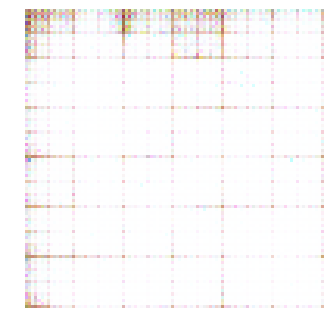


Epoch: 80, D: -8.166, G: 24.19
Epoch: 81, D: -10.78, G: 18.19
Epoch: 82, D: -9.537, G: 19.32
Epoch: 83, D: -9.616, G: 15.5
Epoch: 84, D: -10.72, G: 18.72
Epoch: 85, D: -8.862, G: 6.484
Epoch: 86, D: -9.787, G: 18.56
Epoch: 87, D: -9.785, G: 9.009
Epoch: 88, D: -9.988, G: 14.01
Epoch: 89, D: -11.7, G: 19.84
Epoch: 90, D: -8.287, G: 9.846
Epoch: 91, D: -8.958, G: 15.1
Epoch: 92, D: -10.09, G: 16.14
Epoch: 93, D: -9.515, G: 14.77
Epoch: 94, D: -8.808, G: 16.51
Epoch: 95, D: -7.959, G: 19.82
Epoch: 96, D: -9.289, G: 9.018
Epoch: 97, D: -10.65, G: 20.69
Epoch: 98, D: -8.25, G: 12.69
Epoch: 99, D: -12.76, G: 19.19


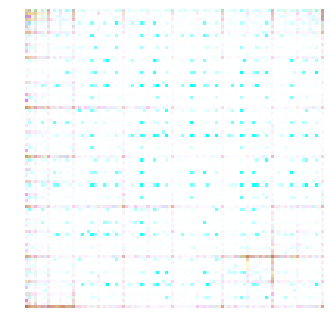


Epoch: 100, D: -9.014, G: 13.31
Epoch: 101, D: -8.184, G: 20.16
Epoch: 102, D: -7.408, G: 13.1
Epoch: 103, D: -10.86, G: 12.97
Epoch: 104, D: -9.436, G: 16.35
Epoch: 105, D: -8.866, G: 9.101
Epoch: 106, D: -10.75, G: 16.59
Epoch: 107, D: -12.0, G: 17.55
Epoch: 108, D: -9.687, G: 18.03
Epoch: 109, D: -9.604, G: 20.85
Epoch: 110, D: -8.424, G: 14.56
Epoch: 111, D: -7.346, G: 17.65
Epoch: 112, D: -11.46, G: 6.63
Epoch: 113, D: -8.777, G: 8.555
Epoch: 114, D: -7.159, G: 14.9
Epoch: 115, D: -9.866, G: 17.43
Epoch: 116, D: -9.22, G: 4.037
Epoch: 117, D: -8.299, G: 11.47
Epoch: 118, D: -7.586, G: 15.4
Epoch: 119, D: -6.772, G: 11.53


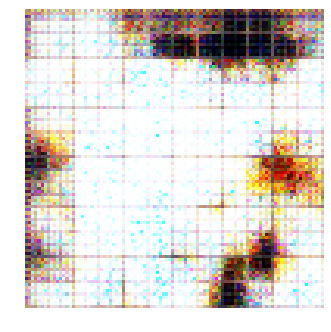


Epoch: 120, D: -9.394, G: 10.64
Epoch: 121, D: -9.487, G: 14.83
Epoch: 122, D: -10.96, G: 17.19
Epoch: 123, D: -8.69, G: 10.56
Epoch: 124, D: -10.55, G: 18.16
Epoch: 125, D: -8.483, G: 12.31
Epoch: 126, D: -8.622, G: 16.19
Epoch: 127, D: -10.92, G: 16.83
Epoch: 128, D: -9.913, G: 15.16
Epoch: 129, D: -7.734, G: 11.13
Epoch: 130, D: -10.91, G: 13.58
Epoch: 131, D: -8.511, G: 7.571
Epoch: 132, D: -9.261, G: 17.47
Epoch: 133, D: -7.979, G: 19.75
Epoch: 134, D: -6.822, G: 17.73
Epoch: 135, D: -8.873, G: 11.76
Epoch: 136, D: -7.423, G: 11.04
Epoch: 137, D: -8.976, G: 9.881
Epoch: 138, D: -7.146, G: 15.57
Epoch: 139, D: -9.03, G: 15.03


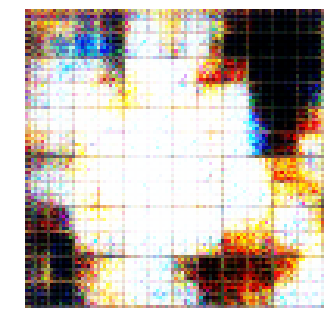


Epoch: 140, D: -6.882, G: 12.53
Epoch: 141, D: -7.675, G: 13.01
Epoch: 142, D: -8.622, G: 15.66
Epoch: 143, D: -7.397, G: 16.78
Epoch: 144, D: -9.01, G: 12.93
Epoch: 145, D: -7.948, G: 14.99
Epoch: 146, D: -9.608, G: 7.355
Epoch: 147, D: -7.201, G: 16.85
Epoch: 148, D: -6.279, G: 11.04
Epoch: 149, D: -7.637, G: 8.727
Epoch: 150, D: -8.478, G: 13.58
Epoch: 151, D: -7.035, G: 9.416
Epoch: 152, D: -8.897, G: 19.0
Epoch: 153, D: -8.85, G: 11.33
Epoch: 154, D: -8.927, G: 17.23
Epoch: 155, D: -10.66, G: 5.747
Epoch: 156, D: -7.638, G: 8.995
Epoch: 157, D: -8.754, G: 12.47
Epoch: 158, D: -11.56, G: 18.64
Epoch: 159, D: -7.872, G: 11.31


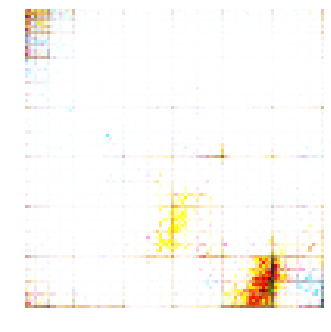


Epoch: 160, D: -7.779, G: 1.874
Epoch: 161, D: -7.783, G: 3.778
Epoch: 162, D: -8.744, G: 11.72
Epoch: 163, D: -7.287, G: 12.37
Epoch: 164, D: -7.292, G: 14.41
Epoch: 165, D: -8.638, G: 10.1
Epoch: 166, D: -7.022, G: 13.37
Epoch: 167, D: -9.037, G: 18.28
Epoch: 168, D: -7.446, G: 8.961
Epoch: 169, D: -9.567, G: 19.55
Epoch: 170, D: -9.523, G: 9.835
Epoch: 171, D: -9.335, G: 10.55
Epoch: 172, D: -8.811, G: 14.27
Epoch: 173, D: -9.018, G: 18.29
Epoch: 174, D: -7.581, G: 11.71
Epoch: 175, D: -8.809, G: 6.049
Epoch: 176, D: -8.023, G: 9.394
Epoch: 177, D: -8.341, G: 9.105
Epoch: 178, D: -7.151, G: 13.59
Epoch: 179, D: -6.58, G: 12.1


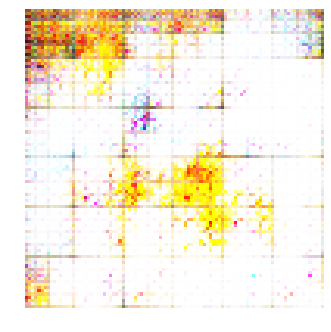


Epoch: 180, D: -8.119, G: 14.49
Epoch: 181, D: -7.251, G: 8.321
Epoch: 182, D: -7.142, G: 12.32
Epoch: 183, D: -7.737, G: 16.89
Epoch: 184, D: -9.004, G: 12.01
Epoch: 185, D: -7.9, G: 4.833
Epoch: 186, D: -8.525, G: 11.32
Epoch: 187, D: -4.86, G: 14.79
Epoch: 188, D: -9.217, G: 9.05
Epoch: 189, D: -9.105, G: 8.534
Epoch: 190, D: -7.058, G: 17.97
Epoch: 191, D: -8.134, G: 16.14
Epoch: 192, D: -8.588, G: 10.56
Epoch: 193, D: -8.541, G: 10.72
Epoch: 194, D: -7.072, G: 12.93
Epoch: 195, D: -5.983, G: 8.196
Epoch: 196, D: -9.681, G: 16.33
Epoch: 197, D: -9.401, G: 10.78
Epoch: 198, D: -8.403, G: 6.186
Epoch: 199, D: -8.293, G: 11.45


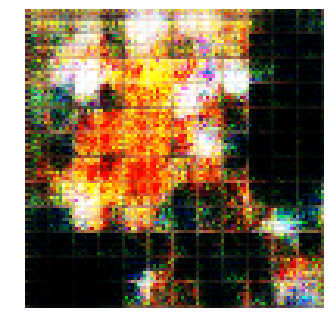


Epoch: 200, D: -7.492, G: 5.334
Epoch: 201, D: -8.895, G: 17.54
Epoch: 202, D: -8.539, G: 9.501
Epoch: 203, D: -7.289, G: 7.086
Epoch: 204, D: -8.671, G: 9.598
Epoch: 205, D: -8.153, G: 9.221
Epoch: 206, D: -8.642, G: 3.411
Epoch: 207, D: -6.735, G: 9.294
Epoch: 208, D: -8.457, G: 9.315
Epoch: 209, D: -9.123, G: 11.4
Epoch: 210, D: -8.174, G: 9.376
Epoch: 211, D: -7.498, G: 5.023
Epoch: 212, D: -6.22, G: 13.73
Epoch: 213, D: -9.116, G: 6.227
Epoch: 214, D: -7.137, G: 8.534
Epoch: 215, D: -7.636, G: 6.989
Epoch: 216, D: -7.777, G: 9.834
Epoch: 217, D: -5.571, G: 6.479
Epoch: 218, D: -9.437, G: 3.129
Epoch: 219, D: -7.304, G: 13.43


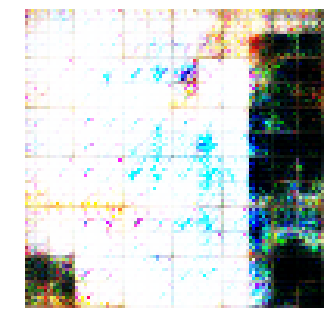


Epoch: 220, D: -7.209, G: 6.34
Epoch: 221, D: -9.225, G: 4.83
Epoch: 222, D: -7.806, G: 7.67
Epoch: 223, D: -7.758, G: 10.96
Epoch: 224, D: -7.622, G: 9.829
Epoch: 225, D: -7.615, G: 7.673
Epoch: 226, D: -9.264, G: 3.531
Epoch: 227, D: -8.654, G: 9.454
Epoch: 228, D: -8.977, G: 14.65
Epoch: 229, D: -9.02, G: 7.256
Epoch: 230, D: -7.184, G: 6.27
Epoch: 231, D: -7.676, G: 12.44
Epoch: 232, D: -6.925, G: 8.6
Epoch: 233, D: -8.261, G: 8.368
Epoch: 234, D: -9.024, G: 3.224
Epoch: 235, D: -8.165, G: 3.965
Epoch: 236, D: -9.269, G: 9.045
Epoch: 237, D: -7.581, G: 8.342
Epoch: 238, D: -7.49, G: 9.329
Epoch: 239, D: -7.17, G: 5.331


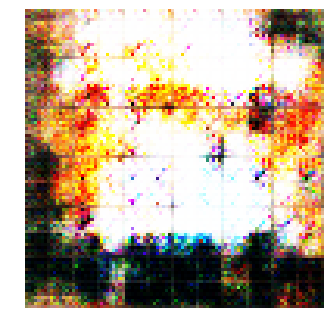


Epoch: 240, D: -8.457, G: 8.616
Epoch: 241, D: -8.957, G: 6.422
Epoch: 242, D: -7.63, G: 6.583
Epoch: 243, D: -6.066, G: 9.657
Epoch: 244, D: -9.038, G: 9.234
Epoch: 245, D: -7.88, G: 6.558
Epoch: 246, D: -7.698, G: 1.559
Epoch: 247, D: -8.613, G: 8.337
Epoch: 248, D: -8.773, G: 2.755
Epoch: 249, D: -8.012, G: 7.45
Epoch: 250, D: -6.783, G: 5.578
Epoch: 251, D: -5.96, G: 5.675
Epoch: 252, D: -8.332, G: 8.102
Epoch: 253, D: -7.81, G: 6.884
Epoch: 254, D: -6.825, G: 8.59
Epoch: 255, D: -8.228, G: -0.2517
Epoch: 256, D: -7.199, G: 4.123
Epoch: 257, D: -9.054, G: 6.122
Epoch: 258, D: -8.328, G: 9.39
Epoch: 259, D: -6.995, G: 3.843


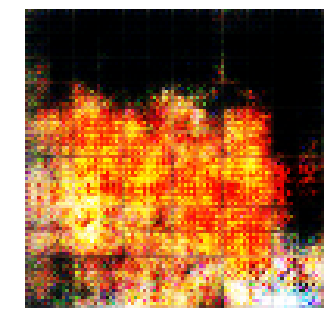


Epoch: 260, D: -8.074, G: 10.12
Epoch: 261, D: -6.053, G: -4.352
Epoch: 262, D: -8.431, G: 1.624
Epoch: 263, D: -8.755, G: -1.318
Epoch: 264, D: -7.063, G: 8.283
Epoch: 265, D: -8.213, G: 5.447
Epoch: 266, D: -8.304, G: 4.681
Epoch: 267, D: -7.758, G: 2.578
Epoch: 268, D: -7.508, G: 7.972
Epoch: 269, D: -7.774, G: 5.64
Epoch: 270, D: -7.473, G: 4.392
Epoch: 271, D: -7.091, G: 4.062
Epoch: 272, D: -7.6, G: 2.424
Epoch: 273, D: -9.755, G: 1.767
Epoch: 274, D: -6.951, G: 0.6817
Epoch: 275, D: -8.551, G: 3.337
Epoch: 276, D: -8.489, G: 6.353
Epoch: 277, D: -7.462, G: 2.708
Epoch: 278, D: -8.292, G: 9.62
Epoch: 279, D: -8.221, G: 5.063


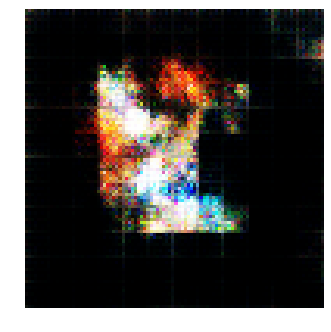


Epoch: 280, D: -6.828, G: 6.563
Epoch: 281, D: -8.187, G: 7.333
Epoch: 282, D: -7.12, G: 5.901
Epoch: 283, D: -7.444, G: 1.97
Epoch: 284, D: -7.426, G: 3.467
Epoch: 285, D: -5.832, G: 4.002
Epoch: 286, D: -8.311, G: 2.412
Epoch: 287, D: -7.847, G: -1.47
Epoch: 288, D: -5.978, G: 5.838
Epoch: 289, D: -8.034, G: 5.889
Epoch: 290, D: -9.393, G: 9.207
Epoch: 291, D: -7.77, G: 3.018
Epoch: 292, D: -8.276, G: 5.988
Epoch: 293, D: -10.02, G: -1.525
Epoch: 294, D: -6.596, G: -1.337
Epoch: 295, D: -7.747, G: 1.674
Epoch: 296, D: -7.21, G: 3.829
Epoch: 297, D: -7.716, G: 10.42
Epoch: 298, D: -7.483, G: 3.135
Epoch: 299, D: -7.688, G: 5.079


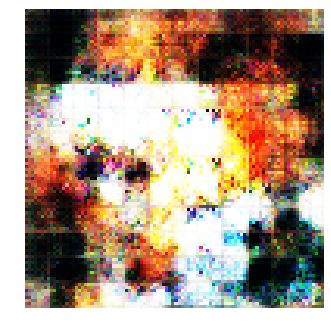


Epoch: 300, D: -7.457, G: 2.457
Epoch: 301, D: -8.158, G: 5.426
Epoch: 302, D: -7.265, G: 3.134
Epoch: 303, D: -8.38, G: 2.709
Epoch: 304, D: -6.037, G: 1.477
Epoch: 305, D: -8.42, G: 10.67
Epoch: 306, D: -8.039, G: 3.467
Epoch: 307, D: -6.54, G: -0.6455
Epoch: 308, D: -6.275, G: 1.926
Epoch: 309, D: -7.77, G: 4.532
Epoch: 310, D: -9.5, G: 2.95
Epoch: 311, D: -6.982, G: 2.579
Epoch: 312, D: -6.979, G: 5.141
Epoch: 313, D: -6.771, G: 4.407
Epoch: 314, D: -7.977, G: 2.125
Epoch: 315, D: -8.333, G: 2.54
Epoch: 316, D: -8.599, G: 0.0203
Epoch: 317, D: -8.045, G: -0.4726
Epoch: 318, D: -6.931, G: 2.006
Epoch: 319, D: -5.928, G: 8.994


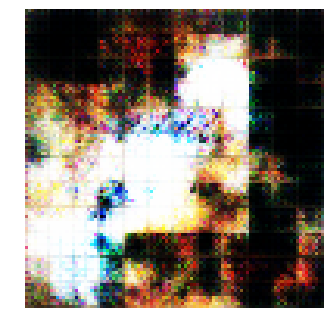


Epoch: 320, D: -8.559, G: 2.619
Epoch: 321, D: -5.958, G: 0.8977
Epoch: 322, D: -7.0, G: 6.379
Epoch: 323, D: -8.647, G: 4.783
Epoch: 324, D: -8.103, G: 3.063
Epoch: 325, D: -6.875, G: -1.05
Epoch: 326, D: -8.444, G: 3.202
Epoch: 327, D: -8.683, G: 3.391
Epoch: 328, D: -7.025, G: 5.364
Epoch: 329, D: -8.022, G: 4.581
Epoch: 330, D: -8.184, G: 2.535
Epoch: 331, D: -9.079, G: 0.5378
Epoch: 332, D: -6.62, G: 2.237
Epoch: 333, D: -6.605, G: 0.5827
Epoch: 334, D: -6.794, G: 7.678
Epoch: 335, D: -8.534, G: 3.874
Epoch: 336, D: -4.853, G: 1.091
Epoch: 337, D: -4.947, G: 1.095
Epoch: 338, D: -7.548, G: 6.257
Epoch: 339, D: -7.866, G: 4.289


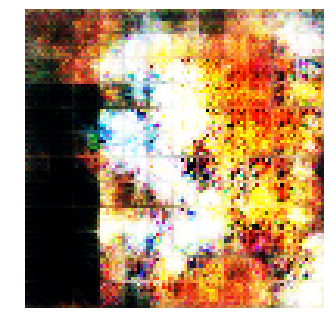


Epoch: 340, D: -6.496, G: 0.5372
Epoch: 341, D: -7.389, G: 8.159
Epoch: 342, D: -6.792, G: 0.6424
Epoch: 343, D: -7.632, G: -2.661
Epoch: 344, D: -7.065, G: 4.096
Epoch: 345, D: -6.685, G: 3.505
Epoch: 346, D: -6.87, G: 5.198
Epoch: 347, D: -6.008, G: 4.655
Epoch: 348, D: -6.67, G: 6.377
Epoch: 349, D: -6.627, G: 0.5101
Epoch: 350, D: -8.637, G: 3.103
Epoch: 351, D: -6.805, G: 3.451
Epoch: 352, D: -6.127, G: 3.811
Epoch: 353, D: -7.933, G: 2.334
Epoch: 354, D: -8.303, G: 5.169
Epoch: 355, D: -7.562, G: 2.611
Epoch: 356, D: -5.325, G: 3.222
Epoch: 357, D: -7.999, G: 5.299
Epoch: 358, D: -10.4, G: -4.323
Epoch: 359, D: -7.218, G: -3.93


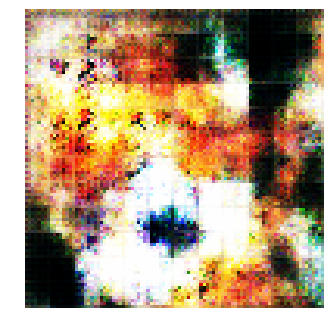


Epoch: 360, D: -7.371, G: 3.65
Epoch: 361, D: -7.522, G: 2.164
Epoch: 362, D: -7.614, G: 3.449
Epoch: 363, D: -6.676, G: 3.059
Epoch: 364, D: -6.369, G: 5.796
Epoch: 365, D: -6.976, G: 1.778
Epoch: 366, D: -8.372, G: 4.163
Epoch: 367, D: -7.012, G: 2.74
Epoch: 368, D: -7.881, G: 3.714
Epoch: 369, D: -8.571, G: 0.8005
Epoch: 370, D: -6.334, G: 4.725
Epoch: 371, D: -5.094, G: 4.261
Epoch: 372, D: -9.726, G: 7.291
Epoch: 373, D: -7.374, G: -2.107
Epoch: 374, D: -7.284, G: 3.092
Epoch: 375, D: -7.852, G: 0.03128
Epoch: 376, D: -6.335, G: 0.4223
Epoch: 377, D: -7.204, G: 5.358
Epoch: 378, D: -7.692, G: -1.906
Epoch: 379, D: -8.688, G: 3.36


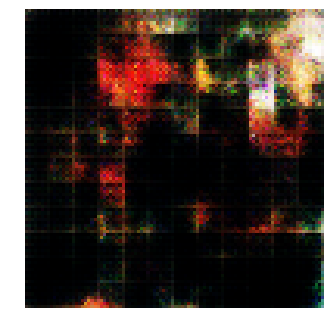


Epoch: 380, D: -7.709, G: -3.098
Epoch: 381, D: -5.55, G: 2.385
Epoch: 382, D: -5.919, G: 3.325
Epoch: 383, D: -7.847, G: 6.496
Epoch: 384, D: -7.602, G: 7.337
Epoch: 385, D: -6.685, G: 6.835
Epoch: 386, D: -7.392, G: 3.724
Epoch: 387, D: -7.436, G: -0.7408
Epoch: 388, D: -6.925, G: 2.88
Epoch: 389, D: -8.896, G: 5.777
Epoch: 390, D: -7.659, G: 1.122
Epoch: 391, D: -6.271, G: 0.702
Epoch: 392, D: -7.173, G: -2.366
Epoch: 393, D: -7.47, G: 5.363
Epoch: 394, D: -4.98, G: 0.2952
Epoch: 395, D: -7.322, G: 4.814
Epoch: 396, D: -7.471, G: 1.242
Epoch: 397, D: -7.936, G: 2.5
Epoch: 398, D: -7.847, G: 4.338
Epoch: 399, D: -8.55, G: 0.8795


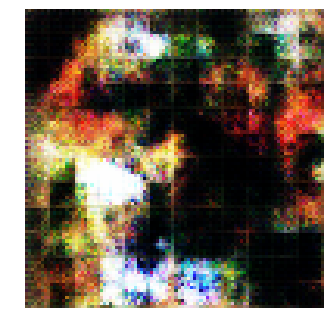


Epoch: 400, D: -7.051, G: 0.8393
Epoch: 401, D: -6.775, G: 1.749
Epoch: 402, D: -6.703, G: 2.285
Epoch: 403, D: -6.904, G: -2.38
Epoch: 404, D: -5.841, G: 6.946
Epoch: 405, D: -8.335, G: 1.177
Epoch: 406, D: -7.966, G: 0.7486
Epoch: 407, D: -7.691, G: 0.2292
Epoch: 408, D: -5.616, G: 0.3957
Epoch: 409, D: -7.149, G: -4.129
Epoch: 410, D: -7.909, G: 2.234
Epoch: 411, D: -8.288, G: 0.6608
Epoch: 412, D: -8.895, G: 3.045
Epoch: 413, D: -6.399, G: 1.704
Epoch: 414, D: -6.935, G: 1.614
Epoch: 415, D: -9.185, G: 5.821
Epoch: 416, D: -8.036, G: 1.497
Epoch: 417, D: -5.919, G: 2.65
Epoch: 418, D: -8.26, G: 3.901
Epoch: 419, D: -7.158, G: 0.7452


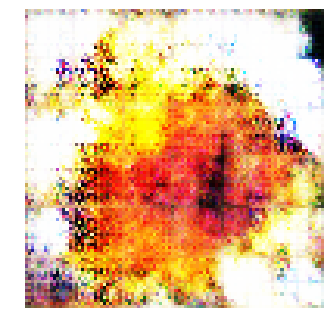


Epoch: 420, D: -7.48, G: -1.195
Epoch: 421, D: -7.357, G: 2.524
Epoch: 422, D: -6.023, G: 1.184
Epoch: 423, D: -6.889, G: 2.721
Epoch: 424, D: -7.85, G: 0.3868
Epoch: 425, D: -7.363, G: 1.382
Epoch: 426, D: -5.911, G: 2.533
Epoch: 427, D: -4.666, G: 3.802
Epoch: 428, D: 49.86, G: 8.999
Epoch: 429, D: -5.438, G: 3.822
Epoch: 430, D: -7.119, G: 4.408
Epoch: 431, D: -7.512, G: 1.311
Epoch: 432, D: -4.338, G: 0.5621
Epoch: 433, D: -6.378, G: 7.622
Epoch: 434, D: -4.825, G: -1.351
Epoch: 435, D: -7.813, G: 0.7075
Epoch: 436, D: -4.295, G: 0.3067
Epoch: 437, D: -8.179, G: -1.305
Epoch: 438, D: -6.026, G: 0.5097
Epoch: 439, D: -0.8932, G: 4.543


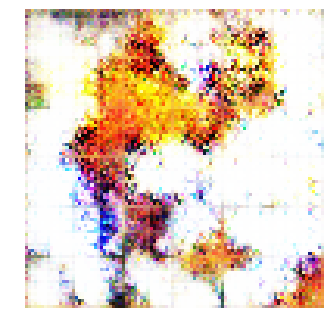


Epoch: 440, D: -5.612, G: 6.76
Epoch: 441, D: -7.144, G: -8.805
Epoch: 442, D: -7.324, G: 0.1346
Epoch: 443, D: -5.951, G: 0.6725
Epoch: 444, D: -7.466, G: 4.354
Epoch: 445, D: -7.091, G: 2.561
Epoch: 446, D: -6.761, G: 2.224
Epoch: 447, D: -7.049, G: -0.6984
Epoch: 448, D: -8.227, G: 3.237
Epoch: 449, D: -6.422, G: -0.6717
Epoch: 450, D: -6.187, G: 0.9599
Epoch: 451, D: -6.357, G: 5.022
Epoch: 452, D: -6.36, G: 1.851
Epoch: 453, D: -8.551, G: -4.499
Epoch: 454, D: -6.754, G: -3.44
Epoch: 455, D: -4.802, G: 4.372
Epoch: 456, D: -4.783, G: 8.108
Epoch: 457, D: -7.111, G: 3.241
Epoch: 458, D: -5.533, G: 1.118
Epoch: 459, D: -6.246, G: -0.873


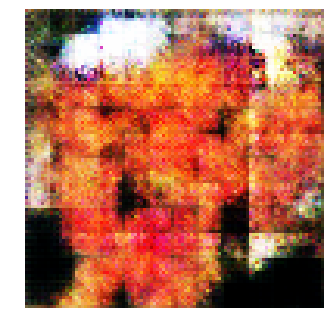


Epoch: 460, D: -7.747, G: 4.566
Epoch: 461, D: -7.179, G: 1.315
Epoch: 462, D: -6.971, G: 1.295
Epoch: 463, D: -7.077, G: -3.726
Epoch: 464, D: -7.199, G: 2.226
Epoch: 465, D: -7.118, G: -3.233
Epoch: 466, D: -5.667, G: -0.8185
Epoch: 467, D: -5.155, G: 2.298
Epoch: 468, D: -6.275, G: 5.251
Epoch: 469, D: -7.892, G: 2.301
Epoch: 470, D: -6.603, G: -0.06286
Epoch: 471, D: -6.455, G: -0.1716
Epoch: 472, D: -6.46, G: -5.57
Epoch: 473, D: -6.912, G: 0.271
Epoch: 474, D: -7.964, G: 1.501
Epoch: 475, D: -5.925, G: 2.637
Epoch: 476, D: -9.248, G: 2.443
Epoch: 477, D: -8.203, G: 0.3003
Epoch: 478, D: -7.303, G: 6.068
Epoch: 479, D: -8.872, G: 4.336


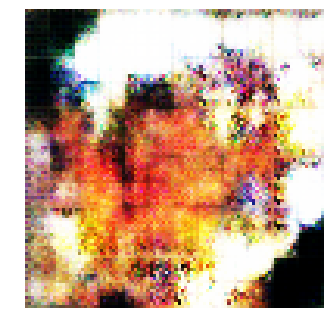


Epoch: 480, D: -6.621, G: 1.148
Epoch: 481, D: -7.864, G: -3.492
Epoch: 482, D: -8.523, G: -1.874
Epoch: 483, D: -4.303, G: 2.473
Epoch: 484, D: -7.416, G: -3.445
Epoch: 485, D: -7.597, G: 3.526
Epoch: 486, D: -6.939, G: -1.41
Epoch: 487, D: -5.939, G: 2.28
Epoch: 488, D: -8.401, G: 2.087
Epoch: 489, D: -7.449, G: 2.216
Epoch: 490, D: -7.04, G: 6.585
Epoch: 491, D: -5.995, G: 2.157
Epoch: 492, D: -8.436, G: 5.318
Epoch: 493, D: -6.761, G: 3.557
Epoch: 494, D: -6.96, G: -3.338
Epoch: 495, D: -7.359, G: 4.649
Epoch: 496, D: -7.175, G: 2.083
Epoch: 497, D: -8.4, G: 2.795
Epoch: 498, D: -6.212, G: 3.641
Epoch: 499, D: -6.84, G: 2.107


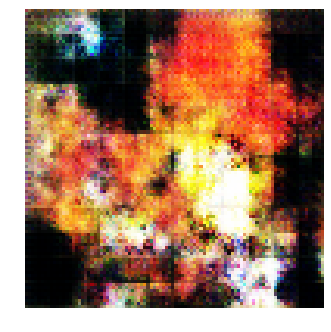


Epoch: 500, D: -7.908, G: -0.6889
Epoch: 501, D: -7.751, G: 6.103
Epoch: 502, D: -6.607, G: 2.48
Epoch: 503, D: -8.029, G: 4.787
Epoch: 504, D: -4.924, G: 1.709
Epoch: 505, D: -6.724, G: 6.962
Epoch: 506, D: -7.132, G: -0.4797
Epoch: 507, D: -6.116, G: 3.662
Epoch: 508, D: -6.542, G: 1.431
Epoch: 509, D: -7.189, G: 2.84
Epoch: 510, D: -6.553, G: 4.55
Epoch: 511, D: -7.705, G: 6.404
Epoch: 512, D: -7.056, G: 1.563
Epoch: 513, D: -6.52, G: 0.2176
Epoch: 514, D: -6.562, G: 6.379
Epoch: 515, D: -8.698, G: -0.0887
Epoch: 516, D: -5.791, G: -0.006074
Epoch: 517, D: -6.292, G: 0.793
Epoch: 518, D: -7.679, G: 3.765
Epoch: 519, D: -8.825, G: 0.3756


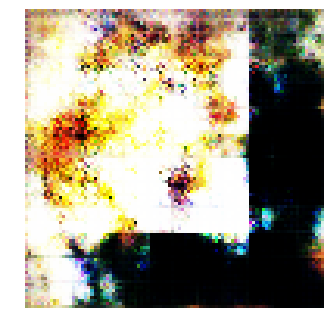


Epoch: 520, D: -7.929, G: -1.483
Epoch: 521, D: -8.231, G: 2.175
Epoch: 522, D: -8.061, G: -2.107
Epoch: 523, D: -6.913, G: 0.1968
Epoch: 524, D: -8.467, G: 3.399
Epoch: 525, D: -5.7, G: 0.8612
Epoch: 526, D: -7.006, G: 2.376
Epoch: 527, D: -5.625, G: -0.01442
Epoch: 528, D: -7.583, G: 2.3
Epoch: 529, D: -8.412, G: 0.8278
Epoch: 530, D: -6.952, G: 3.995
Epoch: 531, D: -5.343, G: 3.213
Epoch: 532, D: -8.442, G: 6.35
Epoch: 533, D: -6.521, G: 0.1126
Epoch: 534, D: -7.814, G: 2.046
Epoch: 535, D: -6.835, G: 0.0854
Epoch: 536, D: -8.042, G: -1.203
Epoch: 537, D: -9.386, G: 2.927
Epoch: 538, D: -5.655, G: 3.312
Epoch: 539, D: -8.321, G: 2.94


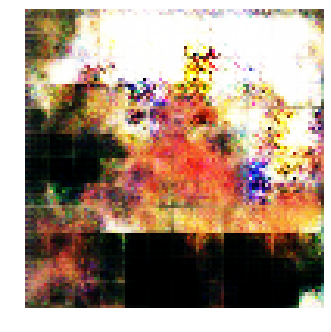


Epoch: 540, D: -6.143, G: -1.258
Epoch: 541, D: -7.933, G: 2.766
Epoch: 542, D: -7.617, G: 1.375
Epoch: 543, D: -10.27, G: 0.8455
Epoch: 544, D: -7.507, G: 3.386
Epoch: 545, D: -7.112, G: 1.987
Epoch: 546, D: -6.969, G: 3.586
Epoch: 547, D: -8.522, G: 4.787
Epoch: 548, D: -7.528, G: -0.8854
Epoch: 549, D: -6.059, G: 1.451
Epoch: 550, D: -7.172, G: -0.6726
Epoch: 551, D: -8.091, G: 2.608
Epoch: 552, D: -8.371, G: -0.04631
Epoch: 553, D: -7.567, G: 2.308
Epoch: 554, D: -7.77, G: 4.199
Epoch: 555, D: -7.611, G: -1.526
Epoch: 556, D: -8.703, G: 1.9
Epoch: 557, D: -6.712, G: 0.3295
Epoch: 558, D: -8.2, G: 2.731
Epoch: 559, D: -8.232, G: 1.039


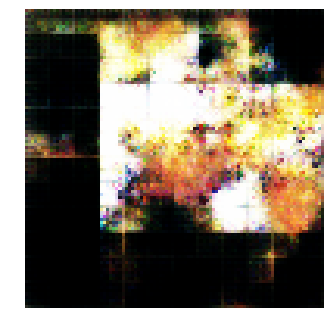


Epoch: 560, D: -7.633, G: 0.9964
Epoch: 561, D: -7.877, G: 5.335
Epoch: 562, D: -7.057, G: 4.626
Epoch: 563, D: -7.414, G: -2.029
Epoch: 564, D: -7.425, G: 2.188
Epoch: 565, D: -8.598, G: 6.415
Epoch: 566, D: -9.546, G: 1.524
Epoch: 567, D: -7.112, G: 0.7524
Epoch: 568, D: -8.372, G: 7.8
Epoch: 569, D: -7.936, G: 5.332
Epoch: 570, D: -6.952, G: 2.23
Epoch: 571, D: -7.821, G: 3.847
Epoch: 572, D: -6.542, G: 0.3782
Epoch: 573, D: -5.772, G: 7.29
Epoch: 574, D: -5.788, G: 2.802
Epoch: 575, D: -5.605, G: 2.841
Epoch: 576, D: -7.221, G: 0.4441
Epoch: 577, D: -8.059, G: 5.359
Epoch: 578, D: -7.492, G: -0.3529
Epoch: 579, D: -7.708, G: -2.258


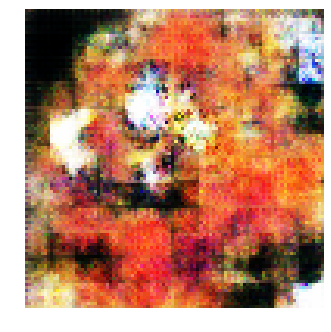


Epoch: 580, D: -7.667, G: 0.2452
Epoch: 581, D: -6.518, G: 3.835
Epoch: 582, D: -7.309, G: 2.571
Epoch: 583, D: -7.718, G: 0.5146
Epoch: 584, D: -6.539, G: 1.746
Epoch: 585, D: -5.59, G: -0.1019
Epoch: 586, D: -9.169, G: 6.613
Epoch: 587, D: -8.456, G: 3.269
Epoch: 588, D: -6.709, G: 2.171
Epoch: 589, D: -7.34, G: 2.366
Epoch: 590, D: -8.074, G: 3.731
Epoch: 591, D: -5.519, G: 0.2053
Epoch: 592, D: -7.351, G: 4.771
Epoch: 593, D: -7.833, G: 3.281
Epoch: 594, D: -8.883, G: 5.166
Epoch: 595, D: -7.473, G: 1.925
Epoch: 596, D: -7.736, G: 0.8483
Epoch: 597, D: -9.12, G: 2.129
Epoch: 598, D: -8.004, G: -1.04
Epoch: 599, D: -6.155, G: -0.1841


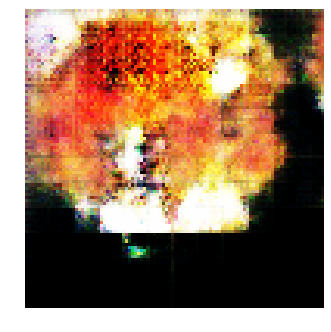


Epoch: 600, D: -7.663, G: 3.68
Epoch: 601, D: -6.167, G: -3.913
Epoch: 602, D: -7.682, G: 2.491
Epoch: 603, D: -9.567, G: -0.05589
Epoch: 604, D: -7.515, G: -0.6655
Epoch: 605, D: -7.47, G: -0.5491
Epoch: 606, D: -7.114, G: -2.132
Epoch: 607, D: -6.765, G: 0.3538
Epoch: 608, D: -7.931, G: 2.76
Epoch: 609, D: -6.271, G: -2.392
Epoch: 610, D: -7.16, G: 7.644
Epoch: 611, D: -5.762, G: 8.051
Epoch: 612, D: -6.627, G: 6.398
Epoch: 613, D: -7.102, G: 5.05
Epoch: 614, D: -6.617, G: 0.0601
Epoch: 615, D: -8.002, G: 2.776
Epoch: 616, D: -8.338, G: 2.256
Epoch: 617, D: -7.15, G: -2.947
Epoch: 618, D: -6.649, G: 4.772
Epoch: 619, D: -7.348, G: 3.423


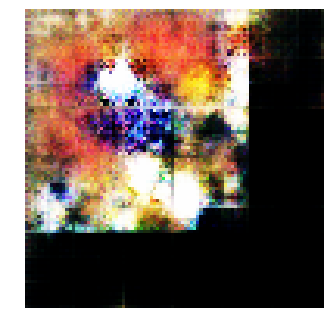


Epoch: 620, D: -6.825, G: 0.8428
Epoch: 621, D: -6.027, G: 2.4
Epoch: 622, D: -8.016, G: 1.049
Epoch: 623, D: -6.546, G: 3.538
Epoch: 624, D: -8.87, G: 4.062
Epoch: 625, D: -9.183, G: 4.449
Epoch: 626, D: -7.939, G: 1.53
Epoch: 627, D: -8.121, G: 1.104
Epoch: 628, D: -4.948, G: 1.255
Epoch: 629, D: -7.361, G: 0.8849
Epoch: 630, D: -5.852, G: 0.1182
Epoch: 631, D: -8.06, G: 0.2854
Epoch: 632, D: -9.804, G: -0.204
Epoch: 633, D: -5.443, G: 2.89
Epoch: 634, D: -7.46, G: 1.948
Epoch: 635, D: -8.215, G: 2.955
Epoch: 636, D: -10.22, G: 5.9
Epoch: 637, D: -7.431, G: -0.5786
Epoch: 638, D: -7.098, G: 3.221
Epoch: 639, D: -7.453, G: 3.262


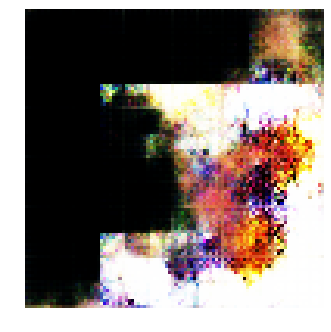


Epoch: 640, D: -6.349, G: 2.91
Epoch: 641, D: -6.998, G: -0.6366
Epoch: 642, D: -7.627, G: 2.16
Epoch: 643, D: -7.848, G: 0.5964
Epoch: 644, D: -10.61, G: 2.207
Epoch: 645, D: -7.575, G: -1.81
Epoch: 646, D: -8.513, G: -0.8798
Epoch: 647, D: -6.545, G: -0.01815
Epoch: 648, D: -6.196, G: 3.078
Epoch: 649, D: -6.35, G: 6.108
Epoch: 650, D: -9.574, G: 0.9827
Epoch: 651, D: -7.284, G: 0.05338
Epoch: 652, D: -5.411, G: 3.168
Epoch: 653, D: -5.604, G: 3.784
Epoch: 654, D: -7.457, G: 0.6325
Epoch: 655, D: -7.463, G: 3.449
Epoch: 656, D: -5.564, G: 0.4503
Epoch: 657, D: -7.129, G: 3.226
Epoch: 658, D: -7.397, G: 2.652
Epoch: 659, D: -8.111, G: 4.165


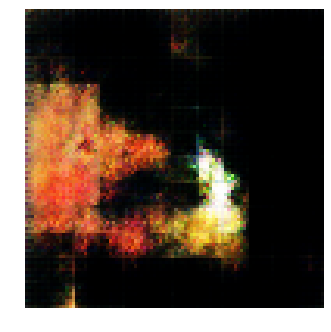


Epoch: 660, D: -7.684, G: -1.716
Epoch: 661, D: -5.564, G: 2.55
Epoch: 662, D: -8.553, G: 2.009
Epoch: 663, D: -7.417, G: 2.236
Epoch: 664, D: -6.331, G: 2.259
Epoch: 665, D: -7.295, G: 1.871
Epoch: 666, D: -7.177, G: 2.395
Epoch: 667, D: -5.84, G: 1.002
Epoch: 668, D: -7.413, G: 3.146
Epoch: 669, D: -8.396, G: 6.272
Epoch: 670, D: -8.785, G: 1.449
Epoch: 671, D: -7.87, G: 1.836
Epoch: 672, D: -7.306, G: -0.3462
Epoch: 673, D: -5.846, G: 3.316
Epoch: 674, D: -8.145, G: 1.059
Epoch: 675, D: -7.892, G: -0.2584
Epoch: 676, D: -7.6, G: 3.944
Epoch: 677, D: -6.865, G: 4.684
Epoch: 678, D: -6.824, G: 2.889
Epoch: 679, D: -7.865, G: 0.7913


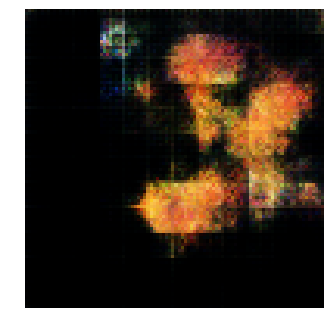


Epoch: 680, D: -7.78, G: -0.8857
Epoch: 681, D: -7.941, G: 1.329
Epoch: 682, D: -6.25, G: 0.4619
Epoch: 683, D: -9.999, G: 3.627
Epoch: 684, D: -7.916, G: -0.719
Epoch: 685, D: -7.969, G: 6.037
Epoch: 686, D: -6.69, G: 0.6195
Epoch: 687, D: -7.675, G: 2.896
Epoch: 688, D: -6.754, G: 0.3604
Epoch: 689, D: -7.937, G: 2.095
Epoch: 690, D: -7.372, G: 0.3017
Epoch: 691, D: -8.792, G: 1.21
Epoch: 692, D: -5.546, G: 2.374
Epoch: 693, D: -8.548, G: -1.591
Epoch: 694, D: -10.8, G: -0.1858
Epoch: 695, D: -7.964, G: 0.7959
Epoch: 696, D: -10.48, G: 3.138
Epoch: 697, D: -5.882, G: -1.421
Epoch: 698, D: -6.396, G: 3.568
Epoch: 699, D: -8.953, G: 0.04061


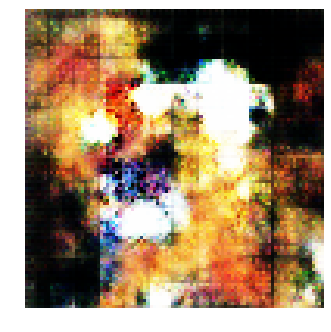


Epoch: 700, D: -7.73, G: 2.029
Epoch: 701, D: -8.008, G: 0.6381
Epoch: 702, D: -6.73, G: 0.9876
Epoch: 703, D: -6.7, G: 4.098
Epoch: 704, D: -8.372, G: 2.737
Epoch: 705, D: -7.803, G: 2.825
Epoch: 706, D: -8.394, G: 3.728
Epoch: 707, D: -8.498, G: 1.671
Epoch: 708, D: -6.596, G: -0.8752
Epoch: 709, D: -7.036, G: 1.541
Epoch: 710, D: -7.832, G: 3.054
Epoch: 711, D: -6.995, G: -2.281
Epoch: 712, D: -8.475, G: 1.994
Epoch: 713, D: -6.782, G: 3.082
Epoch: 714, D: -5.89, G: 1.21
Epoch: 715, D: -8.33, G: 2.877
Epoch: 716, D: -6.222, G: -1.407
Epoch: 717, D: -7.81, G: 2.201
Epoch: 718, D: -7.777, G: 0.9563
Epoch: 719, D: -8.036, G: 1.885


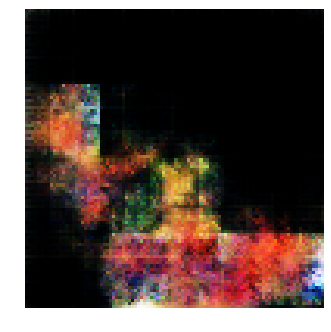


Epoch: 720, D: -6.525, G: 0.6461
Epoch: 721, D: -7.281, G: 2.941
Epoch: 722, D: -6.397, G: -0.1751
Epoch: 723, D: -7.907, G: -3.669
Epoch: 724, D: -7.544, G: -1.628
Epoch: 725, D: -6.163, G: 2.566
Epoch: 726, D: -8.019, G: 5.359
Epoch: 727, D: -7.032, G: 3.554
Epoch: 728, D: -8.531, G: -0.4602
Epoch: 729, D: -9.002, G: 2.485
Epoch: 730, D: -7.023, G: 0.4239
Epoch: 731, D: -7.191, G: 5.707
Epoch: 732, D: -8.829, G: 3.204
Epoch: 733, D: -7.318, G: 0.6468
Epoch: 734, D: -8.293, G: 2.614
Epoch: 735, D: -6.404, G: 2.279
Epoch: 736, D: -9.138, G: 2.071
Epoch: 737, D: -7.139, G: 1.046
Epoch: 738, D: -7.754, G: -1.177
Epoch: 739, D: -8.127, G: 2.308


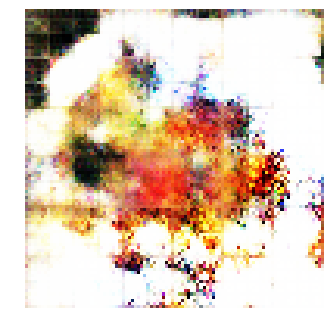


Epoch: 740, D: -8.45, G: 3.4
Epoch: 741, D: -7.773, G: 4.529
Epoch: 742, D: -8.512, G: 3.745
Epoch: 743, D: -9.047, G: 2.706
Epoch: 744, D: -7.575, G: 1.955
Epoch: 745, D: -8.487, G: 4.146
Epoch: 746, D: -6.897, G: 1.387
Epoch: 747, D: -6.091, G: 1.439
Epoch: 748, D: -8.362, G: 0.05429
Epoch: 749, D: -7.733, G: 0.7239
Epoch: 750, D: -7.534, G: 1.19
Epoch: 751, D: -7.682, G: 4.572
Epoch: 752, D: -8.407, G: 0.05285
Epoch: 753, D: -6.608, G: -2.318
Epoch: 754, D: -8.639, G: 5.531
Epoch: 755, D: -7.937, G: 0.1215
Epoch: 756, D: -8.166, G: 2.495
Epoch: 757, D: -4.699, G: -0.03864
Epoch: 758, D: -9.977, G: 3.847
Epoch: 759, D: -7.418, G: 2.671


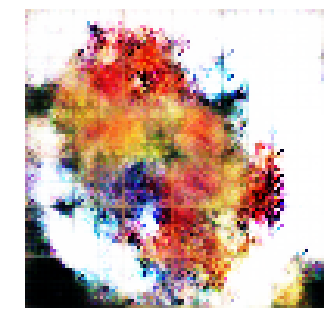


Epoch: 760, D: -8.831, G: 3.064
Epoch: 761, D: -9.297, G: 1.532
Epoch: 762, D: -7.763, G: -4.026
Epoch: 763, D: -7.623, G: 3.362
Epoch: 764, D: -7.225, G: 1.708
Epoch: 765, D: -7.125, G: 2.281
Epoch: 766, D: -7.033, G: 3.943
Epoch: 767, D: -7.825, G: 2.963
Epoch: 768, D: -7.792, G: 3.028
Epoch: 769, D: -9.032, G: 1.417
Epoch: 770, D: -8.143, G: 8.401
Epoch: 771, D: -6.881, G: 2.914
Epoch: 772, D: -7.282, G: 2.742
Epoch: 773, D: -6.939, G: 3.662
Epoch: 774, D: -8.25, G: -2.786
Epoch: 775, D: -8.605, G: 1.623
Epoch: 776, D: -6.404, G: 2.054
Epoch: 777, D: -6.615, G: 2.975
Epoch: 778, D: -6.753, G: 4.397
Epoch: 779, D: -7.927, G: 1.506


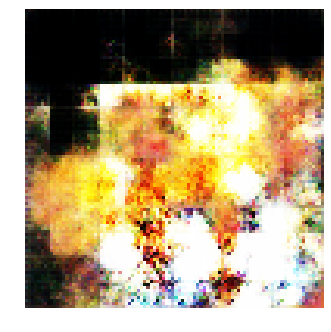


Epoch: 780, D: -7.617, G: 0.8561
Epoch: 781, D: -10.55, G: 4.342
Epoch: 782, D: -7.617, G: -2.046
Epoch: 783, D: -6.869, G: 5.021
Epoch: 784, D: -7.948, G: 1.412
Epoch: 785, D: -7.087, G: -2.14
Epoch: 786, D: -4.706, G: 2.864
Epoch: 787, D: -7.994, G: 3.313
Epoch: 788, D: -7.858, G: 1.8
Epoch: 789, D: -7.808, G: 1.258
Epoch: 790, D: -7.812, G: 1.334
Epoch: 791, D: -5.453, G: -3.493
Epoch: 792, D: -7.209, G: 5.927
Epoch: 793, D: -8.501, G: -1.363
Epoch: 794, D: -6.892, G: 1.194
Epoch: 795, D: -8.16, G: 1.585
Epoch: 796, D: -6.868, G: -0.8292
Epoch: 797, D: -7.364, G: 0.4397
Epoch: 798, D: -7.877, G: 4.572
Epoch: 799, D: -7.787, G: 2.696


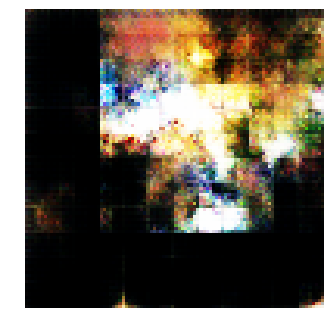


Epoch: 800, D: -7.971, G: 1.644
Epoch: 801, D: -8.249, G: 3.863
Epoch: 802, D: -7.799, G: 2.16
Epoch: 803, D: -8.107, G: -0.06504
Epoch: 804, D: -7.196, G: -0.5147
Epoch: 805, D: -8.001, G: 2.581
Epoch: 806, D: -9.33, G: 1.782
Epoch: 807, D: -6.796, G: 2.135
Epoch: 808, D: -7.573, G: 3.784
Epoch: 809, D: -6.65, G: 0.2432
Epoch: 810, D: -8.312, G: 3.084
Epoch: 811, D: -7.191, G: 2.991
Epoch: 812, D: -7.734, G: 0.958
Epoch: 813, D: -8.414, G: 4.839
Epoch: 814, D: -7.226, G: 2.651
Epoch: 815, D: -6.889, G: -1.94
Epoch: 816, D: -9.061, G: 0.7079
Epoch: 817, D: -7.004, G: 2.583
Epoch: 818, D: -8.817, G: 1.416
Epoch: 819, D: -8.019, G: 1.008


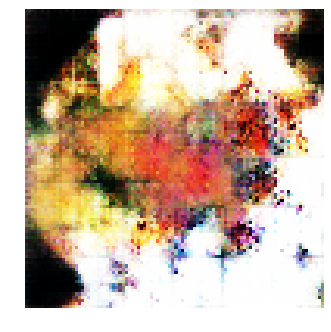


Epoch: 820, D: -6.82, G: -0.3833
Epoch: 821, D: -6.871, G: 2.177
Epoch: 822, D: -9.732, G: 1.194
Epoch: 823, D: -8.187, G: -1.398
Epoch: 824, D: -7.606, G: 2.195
Epoch: 825, D: -7.396, G: 1.677
Epoch: 826, D: -8.308, G: 0.4704
Epoch: 827, D: -4.771, G: 3.107
Epoch: 828, D: -7.445, G: -5.144
Epoch: 829, D: -7.839, G: -2.811
Epoch: 830, D: -6.544, G: 3.685
Epoch: 831, D: -6.362, G: 1.984
Epoch: 832, D: -5.281, G: 3.296
Epoch: 833, D: -7.954, G: 4.16
Epoch: 834, D: -6.79, G: 5.144
Epoch: 835, D: -6.462, G: 0.2181
Epoch: 836, D: -7.375, G: 3.665
Epoch: 837, D: -6.37, G: -0.3667
Epoch: 838, D: -7.116, G: 3.582
Epoch: 839, D: -4.603, G: -0.2843


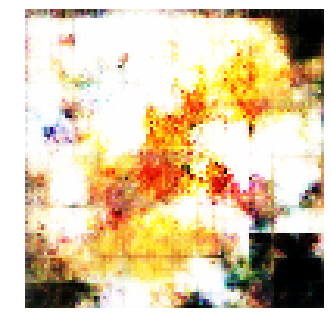


Epoch: 840, D: -6.347, G: 3.387
Epoch: 841, D: -7.218, G: -5.664
Epoch: 842, D: -6.348, G: 2.075
Epoch: 843, D: -6.528, G: 2.846
Epoch: 844, D: -9.535, G: 0.8959
Epoch: 845, D: -7.244, G: -0.9635
Epoch: 846, D: -7.327, G: 0.3221
Epoch: 847, D: -7.733, G: -0.8229
Epoch: 848, D: -7.126, G: -3.583
Epoch: 849, D: -7.093, G: 2.492
Epoch: 850, D: -8.507, G: 4.518
Epoch: 851, D: -6.74, G: -2.638
Epoch: 852, D: -7.33, G: 0.9554
Epoch: 853, D: -8.915, G: 1.023
Epoch: 854, D: -5.523, G: 2.605
Epoch: 855, D: -7.776, G: -2.06
Epoch: 856, D: -6.639, G: 2.179
Epoch: 857, D: -6.621, G: 2.315
Epoch: 858, D: -8.966, G: 5.528
Epoch: 859, D: -6.278, G: 1.023


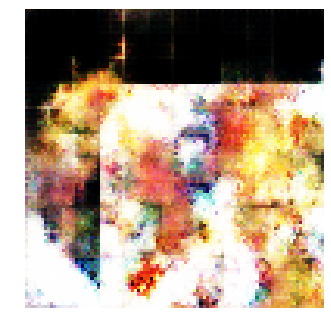


Epoch: 860, D: -5.829, G: 4.629
Epoch: 861, D: -8.018, G: 5.466
Epoch: 862, D: -6.356, G: -1.434
Epoch: 863, D: -8.126, G: -0.1922
Epoch: 864, D: -8.653, G: 0.2013
Epoch: 865, D: -7.416, G: -0.1096
Epoch: 866, D: -7.252, G: 0.4384
Epoch: 867, D: -7.969, G: 1.104
Epoch: 868, D: -7.009, G: 2.082
Epoch: 869, D: -6.546, G: 4.091
Epoch: 870, D: -6.811, G: 0.8435
Epoch: 871, D: -6.087, G: 1.953
Epoch: 872, D: -7.13, G: 2.144
Epoch: 873, D: -8.691, G: 1.244
Epoch: 874, D: -8.727, G: -0.2587
Epoch: 875, D: -7.431, G: 1.003
Epoch: 876, D: -6.279, G: -3.166
Epoch: 877, D: -6.32, G: 2.248
Epoch: 878, D: -6.348, G: 5.086
Epoch: 879, D: -8.395, G: 6.095


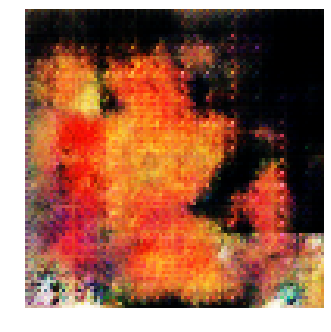


Epoch: 880, D: -7.29, G: -1.231
Epoch: 881, D: -7.374, G: 0.9059
Epoch: 882, D: -7.779, G: 6.263
Epoch: 883, D: -8.358, G: 0.4392
Epoch: 884, D: -6.631, G: 1.376
Epoch: 885, D: -9.641, G: -0.02346
Epoch: 886, D: -7.51, G: 0.1381
Epoch: 887, D: -5.679, G: 2.116
Epoch: 888, D: -7.641, G: 5.269
Epoch: 889, D: -8.61, G: -0.07239
Epoch: 890, D: -9.131, G: 5.915
Epoch: 891, D: -7.974, G: 3.45
Epoch: 892, D: -7.591, G: 3.267
Epoch: 893, D: -8.243, G: 3.661
Epoch: 894, D: -7.452, G: -0.01792
Epoch: 895, D: -7.088, G: 1.56
Epoch: 896, D: -7.96, G: 2.971
Epoch: 897, D: -3.922, G: -1.469
Epoch: 898, D: -6.314, G: 3.83
Epoch: 899, D: -8.148, G: 0.5982


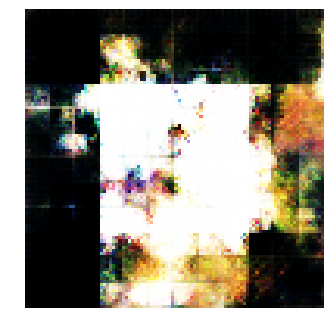


Epoch: 900, D: -8.186, G: 2.162
Epoch: 901, D: -7.488, G: 5.477
Epoch: 902, D: -6.336, G: 3.601
Epoch: 903, D: -6.787, G: 0.1399
Epoch: 904, D: -8.45, G: -0.8011
Epoch: 905, D: -6.84, G: 1.997
Epoch: 906, D: -6.157, G: 4.373
Epoch: 907, D: -5.821, G: 0.841
Epoch: 908, D: -7.927, G: 3.491
Epoch: 909, D: -9.286, G: 0.5891
Epoch: 910, D: -6.029, G: 0.2055
Epoch: 911, D: -7.062, G: 0.5554
Epoch: 912, D: -7.522, G: -2.993
Epoch: 913, D: -7.007, G: 3.593
Epoch: 914, D: -8.764, G: 4.361
Epoch: 915, D: -7.082, G: 6.537
Epoch: 916, D: -6.553, G: -1.974
Epoch: 917, D: -6.07, G: 4.83
Epoch: 918, D: -9.146, G: 4.399
Epoch: 919, D: -8.241, G: 3.192


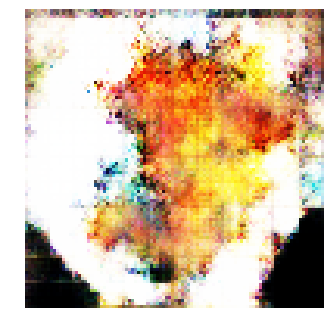


Epoch: 920, D: -9.02, G: 1.364
Epoch: 921, D: -6.138, G: 0.01836
Epoch: 922, D: -6.772, G: 2.609
Epoch: 923, D: -10.26, G: 0.5825
Epoch: 924, D: -8.388, G: -0.504
Epoch: 925, D: -7.542, G: 2.449
Epoch: 926, D: -9.517, G: -0.3743
Epoch: 927, D: -8.041, G: -0.2967
Epoch: 928, D: -7.187, G: 4.031
Epoch: 929, D: -7.706, G: 1.581
Epoch: 930, D: -8.705, G: 1.336
Epoch: 931, D: -7.384, G: 0.5134
Epoch: 932, D: -6.717, G: 2.525
Epoch: 933, D: -7.981, G: 1.631
Epoch: 934, D: -7.34, G: 6.064
Epoch: 935, D: -6.301, G: 1.992
Epoch: 936, D: -7.321, G: 0.7606
Epoch: 937, D: -5.911, G: 1.392
Epoch: 938, D: -8.331, G: 1.965
Epoch: 939, D: -9.229, G: 1.351


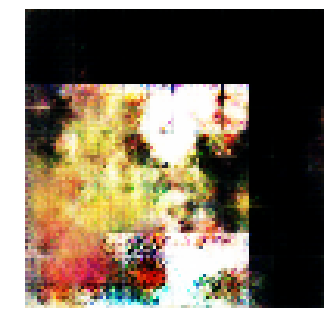


Epoch: 940, D: -10.53, G: 0.4528
Epoch: 941, D: -8.305, G: 0.2978
Epoch: 942, D: -8.617, G: -1.217
Epoch: 943, D: -9.737, G: 3.64
Epoch: 944, D: -7.336, G: -0.2922
Epoch: 945, D: -5.573, G: 1.177
Epoch: 946, D: -8.757, G: 2.528
Epoch: 947, D: -8.699, G: 1.345
Epoch: 948, D: -7.083, G: 5.916
Epoch: 949, D: -8.384, G: 4.148
Epoch: 950, D: -8.44, G: 4.332
Epoch: 951, D: -9.638, G: 0.3378
Epoch: 952, D: -5.823, G: 0.5777
Epoch: 953, D: -7.601, G: 2.525
Epoch: 954, D: -7.187, G: -1.281
Epoch: 955, D: -8.482, G: 4.916
Epoch: 956, D: -7.302, G: 2.741
Epoch: 957, D: -8.021, G: 1.576
Epoch: 958, D: -6.972, G: 4.921
Epoch: 959, D: -9.442, G: 2.596


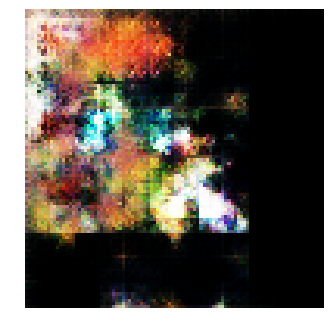


Epoch: 960, D: -9.133, G: 1.837
Epoch: 961, D: -6.824, G: 2.705
Epoch: 962, D: -7.955, G: 3.015
Epoch: 963, D: -7.477, G: 1.917
Epoch: 964, D: -6.669, G: 0.9746
Epoch: 965, D: -7.893, G: 5.252
Epoch: 966, D: -9.77, G: 1.96
Epoch: 967, D: -7.701, G: -0.1102
Epoch: 968, D: -7.663, G: 4.114
Epoch: 969, D: -8.779, G: 1.141
Epoch: 970, D: -8.721, G: -0.2954
Epoch: 971, D: -7.797, G: -0.2461
Epoch: 972, D: -6.257, G: -0.2755
Epoch: 973, D: -9.148, G: 1.448
Epoch: 974, D: -7.584, G: 1.277
Epoch: 975, D: -8.762, G: 5.249
Epoch: 976, D: -6.915, G: 5.683
Epoch: 977, D: -8.974, G: 2.853
Epoch: 978, D: -8.16, G: 0.5374
Epoch: 979, D: -8.42, G: -2.063


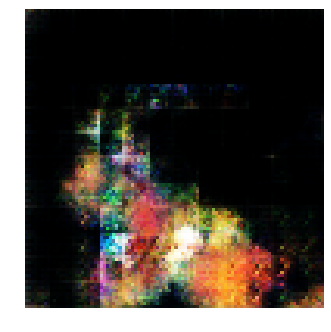


Epoch: 980, D: -7.767, G: 3.545
Epoch: 981, D: -6.582, G: 3.037
Epoch: 982, D: -8.646, G: 1.933
Epoch: 983, D: -6.099, G: 2.378
Epoch: 984, D: -7.178, G: 4.785
Epoch: 985, D: -9.256, G: -0.18
Epoch: 986, D: -6.929, G: 0.2449
Epoch: 987, D: -7.913, G: 1.673
Epoch: 988, D: -8.214, G: 3.829
Epoch: 989, D: -8.81, G: 1.082
Epoch: 990, D: -7.824, G: -0.702
Epoch: 991, D: -8.048, G: 2.138
Epoch: 992, D: -8.309, G: 2.923
Epoch: 993, D: -7.47, G: -1.152
Epoch: 994, D: -9.394, G: 4.271
Epoch: 995, D: -7.947, G: 0.6499
Epoch: 996, D: -7.081, G: -0.5663
Epoch: 997, D: -8.1, G: 2.394
Epoch: 998, D: -8.063, G: 0.4732
Epoch: 999, D: -9.95, G: 4.17


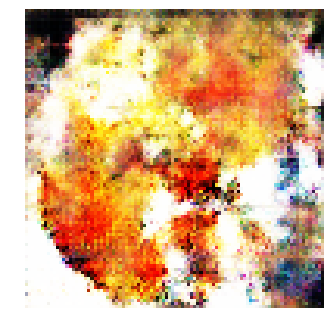


Epoch: 1000, D: -6.402, G: -0.04647
Epoch: 1001, D: -8.488, G: 0.1858
Epoch: 1002, D: -8.137, G: -0.02141
Epoch: 1003, D: -8.389, G: 5.365
Epoch: 1004, D: -5.881, G: 0.1853
Epoch: 1005, D: -8.927, G: 2.654
Epoch: 1006, D: -7.033, G: 3.245
Epoch: 1007, D: -7.57, G: 2.088
Epoch: 1008, D: -8.728, G: 1.965
Epoch: 1009, D: -6.437, G: 3.051
Epoch: 1010, D: -8.898, G: 6.363
Epoch: 1011, D: -7.606, G: -1.403
Epoch: 1012, D: -6.746, G: 1.088
Epoch: 1013, D: -6.636, G: 0.3211
Epoch: 1014, D: -7.198, G: 3.426
Epoch: 1015, D: -6.576, G: 0.7804
Epoch: 1016, D: -8.48, G: 2.756
Epoch: 1017, D: -8.483, G: 4.053
Epoch: 1018, D: -8.991, G: -0.6091
Epoch: 1019, D: -7.713, G: 3.106


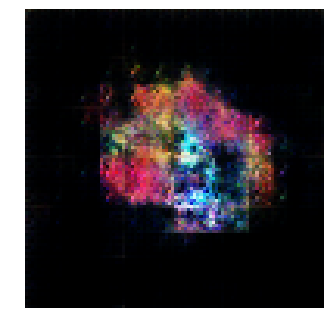


Epoch: 1020, D: -6.047, G: 5.47
Epoch: 1021, D: -7.566, G: 2.979
Epoch: 1022, D: -6.283, G: 3.995
Epoch: 1023, D: -6.942, G: 2.489
Epoch: 1024, D: -8.697, G: 3.407
Epoch: 1025, D: -6.325, G: 5.101
Epoch: 1026, D: -6.951, G: 2.798
Epoch: 1027, D: -7.948, G: 3.751
Epoch: 1028, D: -7.655, G: 1.771
Epoch: 1029, D: -7.787, G: -0.06761
Epoch: 1030, D: -6.81, G: 1.573
Epoch: 1031, D: -7.723, G: 5.433
Epoch: 1032, D: -6.514, G: 1.419
Epoch: 1033, D: -7.3, G: 0.9902
Epoch: 1034, D: -8.347, G: 0.341
Epoch: 1035, D: -6.774, G: 1.224
Epoch: 1036, D: -5.969, G: 4.706
Epoch: 1037, D: -6.692, G: -0.1509
Epoch: 1038, D: -8.245, G: -0.4273
Epoch: 1039, D: -6.859, G: -0.09919


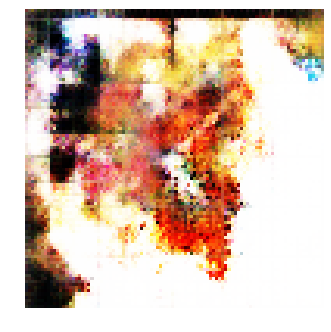


Epoch: 1040, D: -8.524, G: 1.848
Epoch: 1041, D: -8.205, G: 0.7428
Epoch: 1042, D: -8.064, G: 1.046
Epoch: 1043, D: -9.479, G: 2.311
Epoch: 1044, D: -9.359, G: 0.004709
Epoch: 1045, D: -9.007, G: 3.058
Epoch: 1046, D: -8.212, G: 1.476
Epoch: 1047, D: -8.017, G: 3.174
Epoch: 1048, D: -8.597, G: -0.6111
Epoch: 1049, D: -7.211, G: 2.394
Epoch: 1050, D: -10.29, G: 4.252
Epoch: 1051, D: -6.087, G: 2.318
Epoch: 1052, D: -9.345, G: 7.377
Epoch: 1053, D: -7.059, G: 1.841
Epoch: 1054, D: -8.975, G: 4.016
Epoch: 1055, D: -8.367, G: 0.7507
Epoch: 1056, D: -7.36, G: 2.001
Epoch: 1057, D: -9.745, G: 0.3235
Epoch: 1058, D: -8.626, G: 0.5194
Epoch: 1059, D: -8.583, G: 2.353


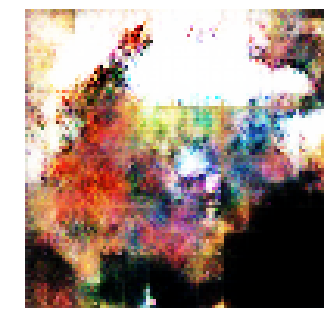


Epoch: 1060, D: -6.263, G: 0.05254
Epoch: 1061, D: -7.268, G: 6.103
Epoch: 1062, D: -7.834, G: 4.087
Epoch: 1063, D: -8.975, G: 2.054
Epoch: 1064, D: -7.775, G: 3.385
Epoch: 1065, D: -8.807, G: 2.314
Epoch: 1066, D: -9.78, G: 3.464
Epoch: 1067, D: -6.52, G: 1.423
Epoch: 1068, D: -7.041, G: 1.475
Epoch: 1069, D: -7.145, G: 4.779
Epoch: 1070, D: -8.434, G: 4.095
Epoch: 1071, D: -6.753, G: 2.572
Epoch: 1072, D: -6.719, G: -0.6778
Epoch: 1073, D: -8.075, G: 2.236
Epoch: 1074, D: -7.989, G: 4.279
Epoch: 1075, D: -8.576, G: 4.028
Epoch: 1076, D: -10.54, G: 3.841
Epoch: 1077, D: -8.184, G: 0.7245
Epoch: 1078, D: -7.834, G: -1.45
Epoch: 1079, D: -8.647, G: 0.8622


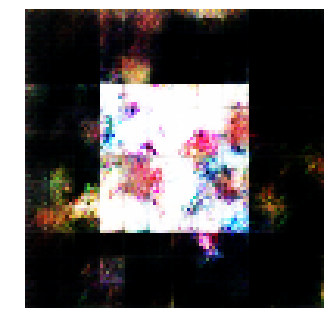


Epoch: 1080, D: -6.948, G: 2.108
Epoch: 1081, D: -8.074, G: 4.185
Epoch: 1082, D: -6.823, G: 1.178
Epoch: 1083, D: -6.473, G: 1.921
Epoch: 1084, D: -9.265, G: 5.483
Epoch: 1085, D: -8.619, G: 2.319
Epoch: 1086, D: -8.66, G: 1.799
Epoch: 1087, D: -6.494, G: 1.001
Epoch: 1088, D: -8.547, G: 2.511
Epoch: 1089, D: -8.034, G: 1.277
Epoch: 1090, D: -9.428, G: 2.302
Epoch: 1091, D: -7.882, G: 1.232
Epoch: 1092, D: -6.051, G: 1.26
Epoch: 1093, D: -7.253, G: 1.903
Epoch: 1094, D: -6.615, G: 1.592
Epoch: 1095, D: -7.201, G: 6.096
Epoch: 1096, D: -7.961, G: 4.218
Epoch: 1097, D: -7.893, G: 4.647
Epoch: 1098, D: -8.033, G: 2.7
Epoch: 1099, D: -9.081, G: -1.006


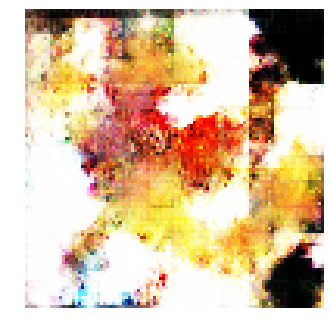


Epoch: 1100, D: -7.511, G: 2.335
Epoch: 1101, D: -6.761, G: 5.826
Epoch: 1102, D: -8.396, G: 3.693
Epoch: 1103, D: -7.814, G: 2.833
Epoch: 1104, D: -8.678, G: 4.717
Epoch: 1105, D: -6.639, G: -1.371
Epoch: 1106, D: -8.076, G: 5.19
Epoch: 1107, D: -5.309, G: -0.2993
Epoch: 1108, D: -10.18, G: 3.242
Epoch: 1109, D: -8.129, G: -2.474
Epoch: 1110, D: -6.979, G: 3.824
Epoch: 1111, D: -8.823, G: -0.262
Epoch: 1112, D: -6.975, G: 4.688
Epoch: 1113, D: -6.286, G: 4.497
Epoch: 1114, D: -8.896, G: 0.3067
Epoch: 1115, D: -9.225, G: 1.168
Epoch: 1116, D: -6.267, G: -0.4427
Epoch: 1117, D: -7.591, G: 0.8514
Epoch: 1118, D: -8.395, G: 5.586
Epoch: 1119, D: -7.322, G: 4.347


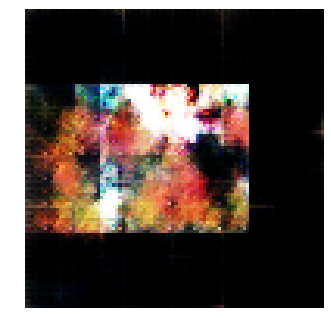


Epoch: 1120, D: -9.415, G: -1.292
Epoch: 1121, D: -7.85, G: 0.4917
Epoch: 1122, D: -8.8, G: 4.44
Epoch: 1123, D: -7.704, G: 0.3679
Epoch: 1124, D: -7.277, G: 1.733
Epoch: 1125, D: -9.385, G: 2.139
Epoch: 1126, D: -7.171, G: 4.903
Epoch: 1127, D: -6.806, G: 3.375
Epoch: 1128, D: -6.894, G: 1.214
Epoch: 1129, D: -6.393, G: 2.58
Epoch: 1130, D: -7.853, G: 7.222
Epoch: 1131, D: -6.134, G: 2.301
Epoch: 1132, D: -8.566, G: 2.586
Epoch: 1133, D: -8.17, G: 0.4982
Epoch: 1134, D: -6.936, G: 3.855
Epoch: 1135, D: -10.33, G: 1.012
Epoch: 1136, D: -9.423, G: 1.144
Epoch: 1137, D: -7.288, G: 2.376
Epoch: 1138, D: -7.645, G: 3.368
Epoch: 1139, D: -6.87, G: 2.82


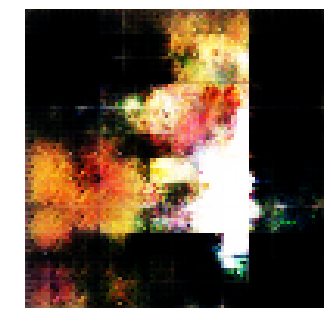


Epoch: 1140, D: -8.442, G: 1.174
Epoch: 1141, D: -8.332, G: 2.623
Epoch: 1142, D: -8.642, G: 6.097
Epoch: 1143, D: -9.798, G: 2.21
Epoch: 1144, D: -8.775, G: 2.002
Epoch: 1145, D: -5.926, G: -0.5614
Epoch: 1146, D: -6.595, G: 1.161
Epoch: 1147, D: -7.696, G: 4.8
Epoch: 1148, D: -8.425, G: 1.098
Epoch: 1149, D: -9.186, G: 1.886
Epoch: 1150, D: -6.823, G: 3.811
Epoch: 1151, D: -8.739, G: 1.823
Epoch: 1152, D: -9.093, G: 1.392
Epoch: 1153, D: -8.161, G: 0.7687
Epoch: 1154, D: -8.141, G: 2.049
Epoch: 1155, D: -6.56, G: 2.366
Epoch: 1156, D: -9.42, G: 3.493
Epoch: 1157, D: -7.174, G: 1.689
Epoch: 1158, D: -7.589, G: 5.048
Epoch: 1159, D: -8.566, G: 4.54


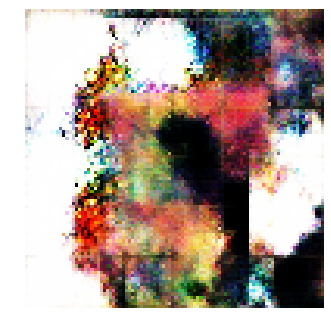


Epoch: 1160, D: -4.302, G: -0.07048
Epoch: 1161, D: -7.513, G: 1.965
Epoch: 1162, D: -8.378, G: 1.505
Epoch: 1163, D: -7.048, G: 2.964
Epoch: 1164, D: -8.561, G: 2.21
Epoch: 1165, D: -7.785, G: 2.188
Epoch: 1166, D: -7.094, G: 1.929
Epoch: 1167, D: -7.244, G: 2.188
Epoch: 1168, D: -9.38, G: 5.156
Epoch: 1169, D: -7.508, G: 0.5076
Epoch: 1170, D: -5.845, G: 5.111
Epoch: 1171, D: -7.799, G: 6.306
Epoch: 1172, D: -7.895, G: 2.292
Epoch: 1173, D: -7.994, G: 2.777
Epoch: 1174, D: -7.952, G: 1.263
Epoch: 1175, D: -9.005, G: 1.687
Epoch: 1176, D: -5.574, G: 1.68
Epoch: 1177, D: -6.709, G: 1.703
Epoch: 1178, D: -6.481, G: 3.011
Epoch: 1179, D: -8.551, G: 4.622


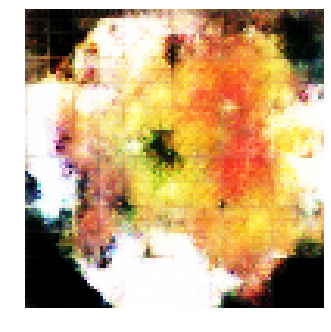


Epoch: 1180, D: -9.166, G: 4.913
Epoch: 1181, D: -7.051, G: 1.624
Epoch: 1182, D: -8.16, G: 5.458
Epoch: 1183, D: -6.932, G: 3.737
Epoch: 1184, D: -7.785, G: 3.089
Epoch: 1185, D: -7.09, G: 2.587
Epoch: 1186, D: -7.805, G: 1.932
Epoch: 1187, D: -7.518, G: -0.9863
Epoch: 1188, D: -8.7, G: 0.3395
Epoch: 1189, D: -8.544, G: 1.946
Epoch: 1190, D: -6.71, G: 2.575
Epoch: 1191, D: -7.772, G: -1.556
Epoch: 1192, D: -8.799, G: 0.8464
Epoch: 1193, D: -7.536, G: 1.647
Epoch: 1194, D: -7.86, G: 2.15
Epoch: 1195, D: -7.839, G: 3.956
Epoch: 1196, D: -6.929, G: 0.6476
Epoch: 1197, D: -6.778, G: 1.626
Epoch: 1198, D: -6.961, G: 3.812
Epoch: 1199, D: -9.684, G: 3.51


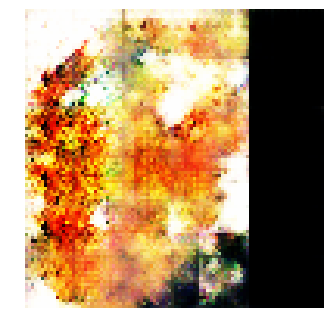


Epoch: 1200, D: -7.965, G: 2.099
Epoch: 1201, D: -8.812, G: 0.3975
Epoch: 1202, D: -8.151, G: -0.3035
Epoch: 1203, D: -8.381, G: -0.3834
Epoch: 1204, D: -7.069, G: 3.464
Epoch: 1205, D: -9.361, G: 2.172
Epoch: 1206, D: -8.171, G: 3.965
Epoch: 1207, D: -7.46, G: 2.949
Epoch: 1208, D: -6.66, G: 3.019
Epoch: 1209, D: -8.68, G: 2.77
Epoch: 1210, D: -8.243, G: 3.822
Epoch: 1211, D: -8.546, G: 2.779
Epoch: 1212, D: -8.609, G: -0.1337
Epoch: 1213, D: -8.503, G: 0.6292
Epoch: 1214, D: -8.853, G: 0.9382
Epoch: 1215, D: -9.088, G: 3.672
Epoch: 1216, D: -8.783, G: -0.3061
Epoch: 1217, D: -8.619, G: 1.949
Epoch: 1218, D: -8.128, G: 2.22
Epoch: 1219, D: -7.503, G: 3.457


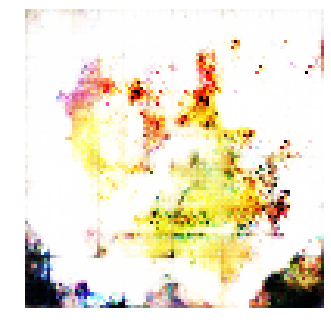


Epoch: 1220, D: -8.692, G: 7.271
Epoch: 1221, D: -7.42, G: 0.7308
Epoch: 1222, D: -8.438, G: 3.989
Epoch: 1223, D: -7.278, G: 3.131
Epoch: 1224, D: -8.269, G: 1.683
Epoch: 1225, D: -9.338, G: 1.179
Epoch: 1226, D: -7.967, G: 1.948
Epoch: 1227, D: -8.38, G: -0.805
Epoch: 1228, D: -7.99, G: 2.823
Epoch: 1229, D: -7.704, G: 4.574
Epoch: 1230, D: -7.41, G: 3.294
Epoch: 1231, D: -7.041, G: 5.478
Epoch: 1232, D: -7.775, G: 2.814
Epoch: 1233, D: -8.862, G: 1.655
Epoch: 1234, D: -8.297, G: 2.118
Epoch: 1235, D: -8.555, G: 2.606
Epoch: 1236, D: -8.25, G: -0.5573
Epoch: 1237, D: -9.387, G: -0.2262
Epoch: 1238, D: -6.417, G: 3.332
Epoch: 1239, D: -7.768, G: 5.107


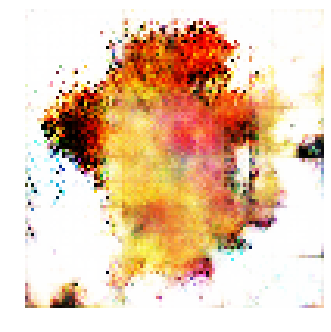


Epoch: 1240, D: -6.957, G: 1.137
Epoch: 1241, D: -6.397, G: 3.943
Epoch: 1242, D: -6.773, G: 2.542
Epoch: 1243, D: -7.469, G: 1.792
Epoch: 1244, D: -9.29, G: 0.7169
Epoch: 1245, D: -7.396, G: -0.5324
Epoch: 1246, D: -8.023, G: 3.462
Epoch: 1247, D: -8.11, G: 0.4927
Epoch: 1248, D: -6.928, G: 2.797
Epoch: 1249, D: -7.246, G: 1.421
Epoch: 1250, D: -6.441, G: 1.545
Epoch: 1251, D: -6.419, G: 2.617
Epoch: 1252, D: -7.16, G: 2.37
Epoch: 1253, D: -5.606, G: 3.894
Epoch: 1254, D: -7.49, G: 2.413
Epoch: 1255, D: -5.166, G: 2.511
Epoch: 1256, D: -8.525, G: 2.921
Epoch: 1257, D: -7.127, G: 0.6881
Epoch: 1258, D: -7.023, G: 2.491
Epoch: 1259, D: -5.895, G: 5.923


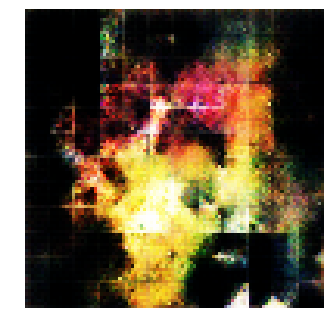


Epoch: 1260, D: -7.608, G: 4.128
Epoch: 1261, D: -9.208, G: -0.5546
Epoch: 1262, D: -8.259, G: 4.701
Epoch: 1263, D: -5.547, G: 2.335
Epoch: 1264, D: -9.197, G: 3.47
Epoch: 1265, D: -7.387, G: 3.695
Epoch: 1266, D: -8.424, G: 1.808
Epoch: 1267, D: -7.948, G: 4.649
Epoch: 1268, D: -7.727, G: 1.059
Epoch: 1269, D: -8.077, G: 2.267
Epoch: 1270, D: -7.621, G: -0.991
Epoch: 1271, D: -7.336, G: 4.048
Epoch: 1272, D: -8.29, G: -0.4556
Epoch: 1273, D: -7.243, G: 1.602
Epoch: 1274, D: -7.148, G: 3.178
Epoch: 1275, D: -6.767, G: 1.292
Epoch: 1276, D: -7.833, G: 2.652
Epoch: 1277, D: -8.427, G: 1.288
Epoch: 1278, D: -7.971, G: 4.734
Epoch: 1279, D: -8.053, G: 3.037


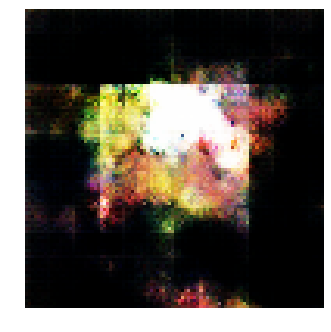


Epoch: 1280, D: -9.163, G: 2.125
Epoch: 1281, D: -9.542, G: 5.181
Epoch: 1282, D: -7.545, G: 1.74
Epoch: 1283, D: -8.688, G: 3.994
Epoch: 1284, D: -8.096, G: -2.087
Epoch: 1285, D: -7.039, G: 3.614
Epoch: 1286, D: -7.373, G: -1.772
Epoch: 1287, D: -8.317, G: 4.892
Epoch: 1288, D: -6.916, G: 3.973
Epoch: 1289, D: -7.649, G: 3.045
Epoch: 1290, D: -8.241, G: -1.159
Epoch: 1291, D: -7.096, G: 4.046
Epoch: 1292, D: -6.679, G: 4.271
Epoch: 1293, D: -9.116, G: 1.962
Epoch: 1294, D: -8.752, G: 3.275
Epoch: 1295, D: -7.318, G: 2.562
Epoch: 1296, D: -7.835, G: 0.2696
Epoch: 1297, D: -7.876, G: 2.185
Epoch: 1298, D: -8.233, G: 4.634
Epoch: 1299, D: -5.637, G: -0.8311


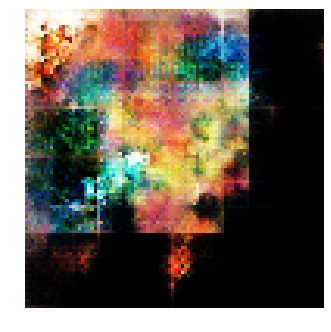


Epoch: 1300, D: -7.311, G: 3.92
Epoch: 1301, D: -6.764, G: 3.231
Epoch: 1302, D: -5.88, G: 5.982
Epoch: 1303, D: -8.278, G: 1.768
Epoch: 1304, D: -9.036, G: -0.03838
Epoch: 1305, D: -8.452, G: -1.949
Epoch: 1306, D: -8.737, G: 0.9903
Epoch: 1307, D: -7.889, G: 2.535
Epoch: 1308, D: -7.088, G: 2.231
Epoch: 1309, D: -9.173, G: 3.329
Epoch: 1310, D: -10.67, G: 0.6966
Epoch: 1311, D: -8.085, G: 0.8889
Epoch: 1312, D: -8.166, G: 6.562
Epoch: 1313, D: -8.397, G: 0.6838
Epoch: 1314, D: -8.197, G: 2.791
Epoch: 1315, D: -7.801, G: 2.701
Epoch: 1316, D: -6.69, G: 2.393
Epoch: 1317, D: -6.437, G: 0.09471
Epoch: 1318, D: -7.852, G: 1.358
Epoch: 1319, D: -5.389, G: 4.501


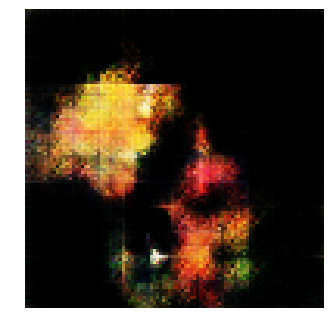


Epoch: 1320, D: -6.64, G: 2.624
Epoch: 1321, D: -9.754, G: 2.95
Epoch: 1322, D: -7.708, G: 0.3666
Epoch: 1323, D: -10.14, G: -2.73
Epoch: 1324, D: -6.26, G: 2.777
Epoch: 1325, D: -8.602, G: 3.833
Epoch: 1326, D: -9.269, G: 3.141
Epoch: 1327, D: -8.046, G: 1.734
Epoch: 1328, D: -7.454, G: 3.112
Epoch: 1329, D: -7.026, G: 2.396
Epoch: 1330, D: -5.982, G: 4.586
Epoch: 1331, D: -6.737, G: 1.163
Epoch: 1332, D: -8.645, G: 1.579
Epoch: 1333, D: -7.388, G: 2.745
Epoch: 1334, D: -7.38, G: 0.2454
Epoch: 1335, D: -7.183, G: 3.614
Epoch: 1336, D: -7.906, G: 3.616
Epoch: 1337, D: -7.136, G: 2.789
Epoch: 1338, D: -7.37, G: 0.4909
Epoch: 1339, D: -7.92, G: 3.702


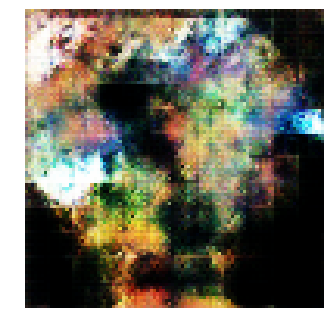


Epoch: 1340, D: -7.003, G: 1.675
Epoch: 1341, D: -5.049, G: 0.502
Epoch: 1342, D: -10.32, G: 1.979
Epoch: 1343, D: -6.537, G: 0.1818
Epoch: 1344, D: -6.739, G: 4.636
Epoch: 1345, D: -8.341, G: 1.072
Epoch: 1346, D: -7.0, G: 0.7324
Epoch: 1347, D: -7.574, G: 4.71
Epoch: 1348, D: -6.975, G: -0.294
Epoch: 1349, D: -6.626, G: 2.51
Epoch: 1350, D: -6.277, G: -0.02291
Epoch: 1351, D: -8.675, G: 1.701
Epoch: 1352, D: -7.342, G: 4.397
Epoch: 1353, D: -7.075, G: 3.152
Epoch: 1354, D: -9.163, G: 3.474
Epoch: 1355, D: -6.555, G: 0.2453
Epoch: 1356, D: -8.369, G: 4.5
Epoch: 1357, D: -7.437, G: 4.459
Epoch: 1358, D: -5.835, G: 0.05188
Epoch: 1359, D: -8.62, G: -0.06684


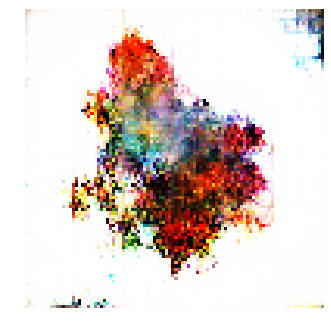


Epoch: 1360, D: -8.138, G: 4.867
Epoch: 1361, D: -7.547, G: 2.183
Epoch: 1362, D: -7.567, G: 2.674
Epoch: 1363, D: -5.834, G: 4.045
Epoch: 1364, D: -7.201, G: 3.63
Epoch: 1365, D: -5.941, G: 1.689
Epoch: 1366, D: -8.65, G: 1.911
Epoch: 1367, D: -6.697, G: 6.366
Epoch: 1368, D: -6.016, G: 0.5329
Epoch: 1369, D: -8.498, G: 2.548
Epoch: 1370, D: -7.812, G: 3.632
Epoch: 1371, D: -5.984, G: 3.722
Epoch: 1372, D: -7.391, G: 3.045
Epoch: 1373, D: -8.203, G: -0.03008
Epoch: 1374, D: -8.389, G: 0.6387
Epoch: 1375, D: -8.138, G: 2.631
Epoch: 1376, D: -6.546, G: 1.355
Epoch: 1377, D: -6.53, G: 3.162
Epoch: 1378, D: -6.395, G: 2.502
Epoch: 1379, D: -7.827, G: 3.179


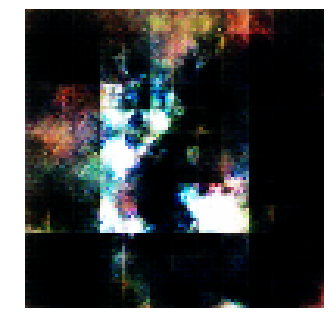


Epoch: 1380, D: -8.976, G: 1.298
Epoch: 1381, D: -7.961, G: -0.01627
Epoch: 1382, D: -8.648, G: 5.105
Epoch: 1383, D: -9.026, G: 2.163
Epoch: 1384, D: -5.651, G: 0.4377
Epoch: 1385, D: -8.156, G: 2.696
Epoch: 1386, D: -9.259, G: 3.493
Epoch: 1387, D: -4.601, G: 0.1875
Epoch: 1388, D: -10.24, G: 4.226
Epoch: 1389, D: -7.396, G: -0.2021
Epoch: 1390, D: -8.081, G: 5.302
Epoch: 1391, D: -5.481, G: 4.982
Epoch: 1392, D: -7.328, G: 4.021
Epoch: 1393, D: -7.164, G: 2.221
Epoch: 1394, D: -6.673, G: 6.169
Epoch: 1395, D: -8.197, G: 3.19
Epoch: 1396, D: -8.351, G: 0.3518
Epoch: 1397, D: -8.394, G: 1.581
Epoch: 1398, D: -7.651, G: 1.642
Epoch: 1399, D: -8.166, G: 2.972


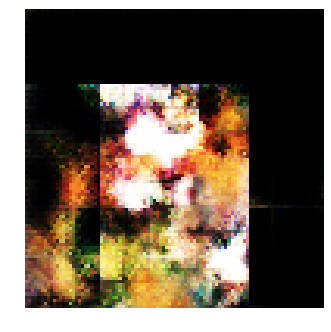


Epoch: 1400, D: -5.906, G: 4.798
Epoch: 1401, D: -7.553, G: 3.95
Epoch: 1402, D: -8.426, G: 3.732
Epoch: 1403, D: -8.139, G: 0.5723
Epoch: 1404, D: -6.985, G: 3.568
Epoch: 1405, D: -6.756, G: 3.542
Epoch: 1406, D: -6.001, G: 4.152
Epoch: 1407, D: -4.799, G: 6.565
Epoch: 1408, D: -8.711, G: 2.399
Epoch: 1409, D: -8.381, G: 6.007
Epoch: 1410, D: -7.68, G: 3.534
Epoch: 1411, D: -7.213, G: 3.94
Epoch: 1412, D: -7.783, G: 2.423
Epoch: 1413, D: -7.79, G: -0.5341
Epoch: 1414, D: -8.49, G: 1.399
Epoch: 1415, D: -8.711, G: 1.101
Epoch: 1416, D: -8.738, G: 2.473
Epoch: 1417, D: -8.45, G: 2.004
Epoch: 1418, D: -6.477, G: 6.609
Epoch: 1419, D: -7.667, G: 4.143


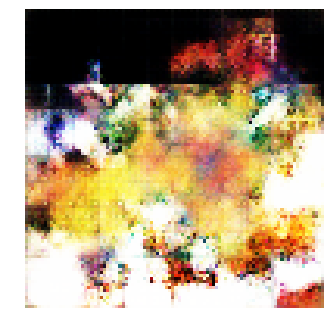


Epoch: 1420, D: -8.786, G: 4.785
Epoch: 1421, D: -9.921, G: 1.256
Epoch: 1422, D: -7.491, G: 3.513
Epoch: 1423, D: -9.392, G: 2.395
Epoch: 1424, D: -8.514, G: -1.03
Epoch: 1425, D: -7.422, G: 4.929
Epoch: 1426, D: -8.98, G: 1.174
Epoch: 1427, D: -8.374, G: 4.286
Epoch: 1428, D: -7.991, G: 3.543
Epoch: 1429, D: -8.137, G: 3.052
Epoch: 1430, D: -8.558, G: 1.142
Epoch: 1431, D: -7.064, G: 2.173
Epoch: 1432, D: -7.244, G: 2.217
Epoch: 1433, D: -9.962, G: -0.737
Epoch: 1434, D: -8.119, G: 0.3129
Epoch: 1435, D: -6.754, G: 2.417
Epoch: 1436, D: -7.743, G: 3.31
Epoch: 1437, D: -7.13, G: 5.222
Epoch: 1438, D: -9.306, G: 4.374
Epoch: 1439, D: -9.078, G: 2.456


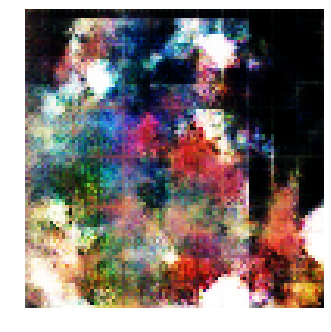


Epoch: 1440, D: -8.748, G: 2.356
Epoch: 1441, D: -6.999, G: 2.564
Epoch: 1442, D: -7.74, G: 1.066
Epoch: 1443, D: -7.504, G: 0.2755
Epoch: 1444, D: -7.408, G: 0.9753
Epoch: 1445, D: -7.796, G: -0.4094
Epoch: 1446, D: -9.252, G: 3.308
Epoch: 1447, D: -6.722, G: 4.643
Epoch: 1448, D: -8.622, G: 0.7667
Epoch: 1449, D: -9.339, G: 1.039
Epoch: 1450, D: -7.639, G: 3.252
Epoch: 1451, D: -7.23, G: 4.046
Epoch: 1452, D: -7.378, G: 2.533
Epoch: 1453, D: -9.001, G: 6.022
Epoch: 1454, D: -7.443, G: -0.3205
Epoch: 1455, D: -6.628, G: 1.855
Epoch: 1456, D: -6.586, G: 3.167
Epoch: 1457, D: -9.208, G: 4.019
Epoch: 1458, D: -7.55, G: 4.011
Epoch: 1459, D: -7.701, G: 1.151


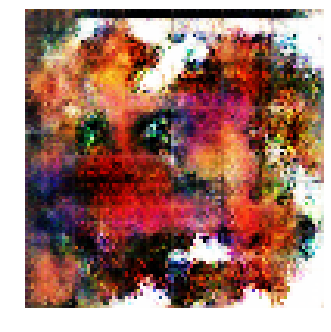


Epoch: 1460, D: -7.474, G: 3.095
Epoch: 1461, D: -8.394, G: -1.526
Epoch: 1462, D: -8.778, G: 1.867
Epoch: 1463, D: -8.323, G: 3.987
Epoch: 1464, D: -7.315, G: -0.7304
Epoch: 1465, D: -8.75, G: 2.814
Epoch: 1466, D: -8.381, G: 2.173
Epoch: 1467, D: -8.785, G: 2.458
Epoch: 1468, D: -6.687, G: 1.81
Epoch: 1469, D: -8.383, G: 4.308
Epoch: 1470, D: -9.464, G: 4.419
Epoch: 1471, D: -8.519, G: 3.013
Epoch: 1472, D: -7.158, G: 0.4788
Epoch: 1473, D: -5.136, G: -1.679
Epoch: 1474, D: -7.042, G: 3.726
Epoch: 1475, D: -7.312, G: 3.387
Epoch: 1476, D: -8.056, G: 4.432
Epoch: 1477, D: -7.478, G: 3.262
Epoch: 1478, D: -8.349, G: 5.202
Epoch: 1479, D: -4.88, G: 2.266


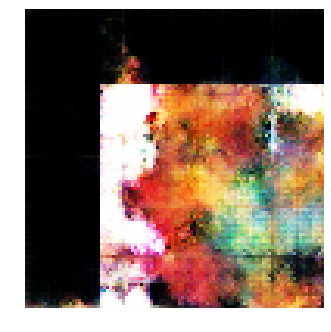


Epoch: 1480, D: -7.12, G: 3.999
Epoch: 1481, D: -6.731, G: 0.8448
Epoch: 1482, D: -8.15, G: 4.154
Epoch: 1483, D: -7.718, G: 3.468
Epoch: 1484, D: -7.43, G: 2.712
Epoch: 1485, D: -6.638, G: 1.265
Epoch: 1486, D: -7.934, G: 2.114
Epoch: 1487, D: -8.948, G: 8.381
Epoch: 1488, D: -8.1, G: 4.171
Epoch: 1489, D: -8.14, G: 2.532
Epoch: 1490, D: -8.253, G: 0.77
Epoch: 1491, D: -8.303, G: 4.445
Epoch: 1492, D: -7.956, G: 2.331
Epoch: 1493, D: -7.655, G: 1.494
Epoch: 1494, D: -6.98, G: 3.142
Epoch: 1495, D: -7.71, G: 2.764
Epoch: 1496, D: -7.812, G: 2.793
Epoch: 1497, D: -5.822, G: -1.995
Epoch: 1498, D: -7.824, G: 5.394
Epoch: 1499, D: -6.567, G: 6.188


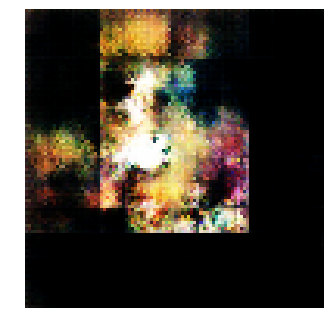


Epoch: 1500, D: -7.878, G: -0.2216
Epoch: 1501, D: -6.394, G: 3.487
Epoch: 1502, D: -6.263, G: 3.758
Epoch: 1503, D: -7.983, G: 5.902
Epoch: 1504, D: -6.802, G: 2.879
Epoch: 1505, D: -7.499, G: 1.131
Epoch: 1506, D: -8.858, G: 3.577
Epoch: 1507, D: -8.144, G: -0.4721
Epoch: 1508, D: -8.603, G: 3.8
Epoch: 1509, D: -9.294, G: -0.4115
Epoch: 1510, D: -7.488, G: 1.854
Epoch: 1511, D: -6.886, G: 3.443
Epoch: 1512, D: -9.829, G: 4.232
Epoch: 1513, D: -6.765, G: 3.485
Epoch: 1514, D: -8.158, G: 2.067
Epoch: 1515, D: -8.051, G: 3.486
Epoch: 1516, D: -6.233, G: 0.0554
Epoch: 1517, D: -9.211, G: 0.8274
Epoch: 1518, D: -7.526, G: 3.784
Epoch: 1519, D: -8.598, G: 0.8912


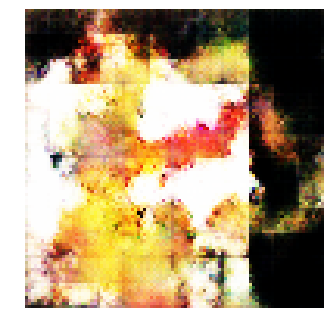


Epoch: 1520, D: -8.292, G: 0.8361
Epoch: 1521, D: -8.442, G: 3.591
Epoch: 1522, D: -8.764, G: 3.244
Epoch: 1523, D: -6.477, G: 4.038
Epoch: 1524, D: -7.152, G: 4.832
Epoch: 1525, D: -8.223, G: 0.2417
Epoch: 1526, D: -7.4, G: 2.723
Epoch: 1527, D: -9.772, G: 1.317
Epoch: 1528, D: -8.616, G: 5.708
Epoch: 1529, D: -4.741, G: 2.292
Epoch: 1530, D: -8.108, G: 3.525
Epoch: 1531, D: -7.284, G: 1.073
Epoch: 1532, D: -8.827, G: 3.173
Epoch: 1533, D: -9.831, G: 3.341
Epoch: 1534, D: -8.206, G: 2.291
Epoch: 1535, D: -7.318, G: 3.95
Epoch: 1536, D: -8.799, G: 4.479
Epoch: 1537, D: -6.481, G: 0.3463
Epoch: 1538, D: -7.052, G: 1.379
Epoch: 1539, D: -8.342, G: 0.4816


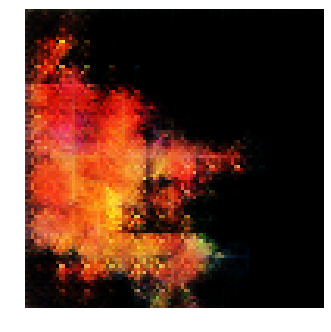


Epoch: 1540, D: -7.698, G: 8.531
Epoch: 1541, D: -6.782, G: 3.195
Epoch: 1542, D: -7.939, G: 1.335
Epoch: 1543, D: -7.01, G: 7.683
Epoch: 1544, D: -9.24, G: 5.027
Epoch: 1545, D: -8.646, G: 0.8763
Epoch: 1546, D: -8.373, G: -0.7005
Epoch: 1547, D: -9.649, G: 3.762
Epoch: 1548, D: -8.96, G: 1.201
Epoch: 1549, D: -8.561, G: 3.98
Epoch: 1550, D: -8.072, G: 1.584
Epoch: 1551, D: -6.553, G: 1.634
Epoch: 1552, D: -8.656, G: 1.931
Epoch: 1553, D: -7.514, G: 4.161
Epoch: 1554, D: -5.513, G: 3.676
Epoch: 1555, D: -7.348, G: 4.833
Epoch: 1556, D: -9.041, G: 4.742
Epoch: 1557, D: -7.998, G: 4.503
Epoch: 1558, D: -9.095, G: 3.102
Epoch: 1559, D: -7.384, G: -1.144


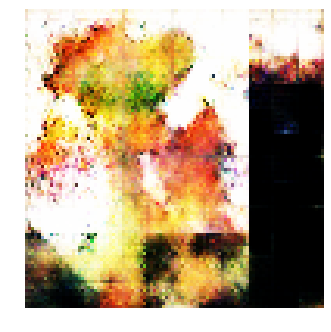


Epoch: 1560, D: -7.25, G: 1.336
Epoch: 1561, D: -8.001, G: 2.029
Epoch: 1562, D: -7.115, G: 2.545
Epoch: 1563, D: -7.537, G: 2.575
Epoch: 1564, D: -6.635, G: 2.828
Epoch: 1565, D: -5.462, G: 2.245
Epoch: 1566, D: -7.275, G: 2.929
Epoch: 1567, D: -7.794, G: 5.752
Epoch: 1568, D: -7.484, G: 0.5001
Epoch: 1569, D: -7.469, G: 4.152
Epoch: 1570, D: -8.352, G: 4.195
Epoch: 1571, D: -7.422, G: 0.2607
Epoch: 1572, D: -5.377, G: 2.487
Epoch: 1573, D: -8.946, G: 2.549
Epoch: 1574, D: -7.034, G: 1.571
Epoch: 1575, D: -9.281, G: 1.967
Epoch: 1576, D: -8.391, G: -0.1294
Epoch: 1577, D: -8.141, G: 0.8517
Epoch: 1578, D: -8.449, G: 2.582
Epoch: 1579, D: -7.999, G: 0.9606


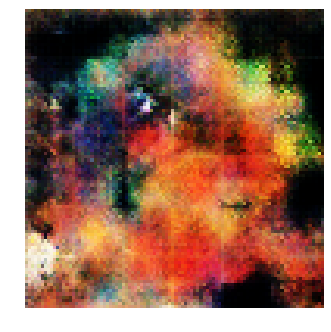


Epoch: 1580, D: -7.41, G: 1.216
Epoch: 1581, D: -7.24, G: 2.357
Epoch: 1582, D: -5.275, G: 5.556
Epoch: 1583, D: -6.879, G: 4.276
Epoch: 1584, D: -9.992, G: 2.106
Epoch: 1585, D: -8.928, G: 0.1999
Epoch: 1586, D: -8.089, G: 2.223
Epoch: 1587, D: -8.408, G: 0.5634
Epoch: 1588, D: -8.109, G: 0.4192
Epoch: 1589, D: -6.784, G: 3.23
Epoch: 1590, D: -7.073, G: 2.845
Epoch: 1591, D: -6.291, G: 3.126
Epoch: 1592, D: -9.165, G: 5.343
Epoch: 1593, D: -7.181, G: -1.433
Epoch: 1594, D: -7.202, G: 0.5086
Epoch: 1595, D: -6.777, G: 1.64
Epoch: 1596, D: -6.715, G: 3.862
Epoch: 1597, D: -8.787, G: 1.005
Epoch: 1598, D: -8.231, G: 3.39
Epoch: 1599, D: -7.556, G: 1.841


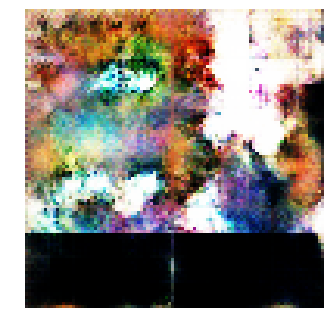


Epoch: 1600, D: -8.77, G: 0.9765
Epoch: 1601, D: -8.678, G: 2.619
Epoch: 1602, D: -7.228, G: 1.736
Epoch: 1603, D: -8.289, G: 2.691
Epoch: 1604, D: -7.71, G: 2.261
Epoch: 1605, D: -6.204, G: 3.116
Epoch: 1606, D: -8.79, G: 2.821
Epoch: 1607, D: -9.25, G: 6.4
Epoch: 1608, D: -7.33, G: 6.271
Epoch: 1609, D: -7.903, G: 4.428
Epoch: 1610, D: -8.735, G: 0.3564
Epoch: 1611, D: -8.016, G: 3.598
Epoch: 1612, D: -6.088, G: 3.828
Epoch: 1613, D: -6.456, G: 5.538
Epoch: 1614, D: -7.567, G: 1.631
Epoch: 1615, D: -7.653, G: 3.92
Epoch: 1616, D: -10.19, G: 0.6292
Epoch: 1617, D: -8.765, G: 1.552
Epoch: 1618, D: -8.758, G: 0.9089
Epoch: 1619, D: -7.791, G: 2.131


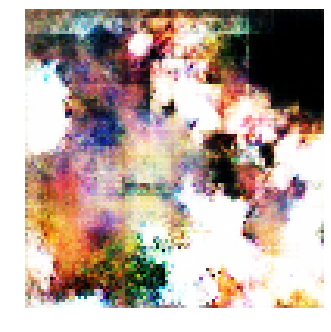


Epoch: 1620, D: -5.943, G: 3.135
Epoch: 1621, D: -7.869, G: 3.415
Epoch: 1622, D: -7.779, G: 3.715
Epoch: 1623, D: -8.769, G: 2.847
Epoch: 1624, D: -8.609, G: 1.693
Epoch: 1625, D: -8.103, G: 0.8022
Epoch: 1626, D: -7.88, G: 3.312
Epoch: 1627, D: -7.261, G: 1.25
Epoch: 1628, D: -8.124, G: 4.36
Epoch: 1629, D: -7.95, G: 4.478
Epoch: 1630, D: -6.74, G: 7.078
Epoch: 1631, D: -9.215, G: 3.009
Epoch: 1632, D: -6.399, G: 0.1468
Epoch: 1633, D: -6.466, G: 3.257
Epoch: 1634, D: -5.783, G: 3.643
Epoch: 1635, D: -8.813, G: 4.069
Epoch: 1636, D: -5.672, G: 2.944
Epoch: 1637, D: -9.047, G: 1.017
Epoch: 1638, D: -4.994, G: 4.009
Epoch: 1639, D: -6.909, G: 4.685


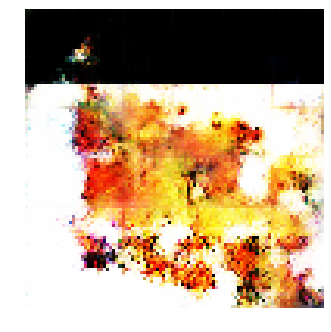


Epoch: 1640, D: -7.068, G: 0.6935
Epoch: 1641, D: -8.897, G: 3.379
Epoch: 1642, D: -10.02, G: 1.262
Epoch: 1643, D: -9.797, G: -3.343
Epoch: 1644, D: -6.538, G: 3.724
Epoch: 1645, D: -8.712, G: 4.045
Epoch: 1646, D: -8.372, G: 3.169
Epoch: 1647, D: -6.977, G: 2.016
Epoch: 1648, D: -8.171, G: 1.89
Epoch: 1649, D: -7.785, G: 3.573
Epoch: 1650, D: -8.491, G: 0.3604
Epoch: 1651, D: -7.476, G: 1.975
Epoch: 1652, D: -6.54, G: 1.478
Epoch: 1653, D: -8.208, G: -0.8897
Epoch: 1654, D: -5.583, G: 2.768
Epoch: 1655, D: -7.427, G: 4.053
Epoch: 1656, D: -7.468, G: 3.23
Epoch: 1657, D: -7.632, G: 6.82
Epoch: 1658, D: -8.219, G: 2.798
Epoch: 1659, D: -7.238, G: 3.257


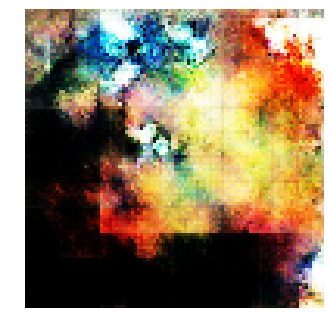


Epoch: 1660, D: -8.058, G: 2.553
Epoch: 1661, D: -7.271, G: 4.068
Epoch: 1662, D: -8.504, G: -2.176
Epoch: 1663, D: -5.961, G: 0.5504
Epoch: 1664, D: -9.038, G: 5.199
Epoch: 1665, D: -5.761, G: -0.04362
Epoch: 1666, D: -8.285, G: 1.659
Epoch: 1667, D: -7.625, G: 1.262
Epoch: 1668, D: -9.915, G: 0.9357
Epoch: 1669, D: -8.209, G: 1.754
Epoch: 1670, D: -7.26, G: 4.013
Epoch: 1671, D: -8.1, G: 3.838
Epoch: 1672, D: -7.993, G: 1.698
Epoch: 1673, D: -7.95, G: 5.232
Epoch: 1674, D: -7.323, G: 0.9554
Epoch: 1675, D: -9.713, G: 4.321
Epoch: 1676, D: -7.055, G: 4.822
Epoch: 1677, D: -8.345, G: 3.025
Epoch: 1678, D: -6.711, G: 0.2754
Epoch: 1679, D: -9.033, G: 6.332


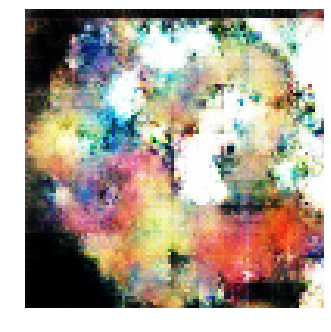


Epoch: 1680, D: -7.737, G: 1.803
Epoch: 1681, D: -9.213, G: 2.045
Epoch: 1682, D: -6.525, G: 0.7356
Epoch: 1683, D: -7.961, G: 4.384
Epoch: 1684, D: -5.557, G: 1.906
Epoch: 1685, D: -8.917, G: 1.532
Epoch: 1686, D: -8.32, G: 1.82
Epoch: 1687, D: -6.333, G: 0.9807
Epoch: 1688, D: -8.254, G: 3.296
Epoch: 1689, D: -8.583, G: 1.77
Epoch: 1690, D: -8.794, G: 0.9451
Epoch: 1691, D: -9.465, G: 1.826
Epoch: 1692, D: -7.574, G: 3.327
Epoch: 1693, D: -7.635, G: 2.993
Epoch: 1694, D: -7.964, G: 2.232
Epoch: 1695, D: -6.477, G: 2.245
Epoch: 1696, D: -8.387, G: 1.85
Epoch: 1697, D: -8.565, G: 5.13
Epoch: 1698, D: -8.447, G: 2.158
Epoch: 1699, D: -7.621, G: -2.749


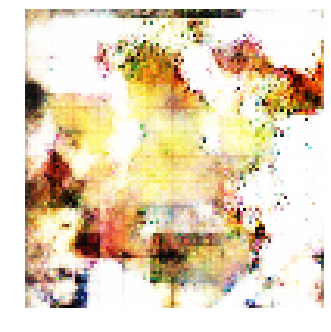


Epoch: 1700, D: -7.153, G: -0.2355
Epoch: 1701, D: -7.895, G: 0.9958
Epoch: 1702, D: -6.699, G: 2.079
Epoch: 1703, D: -8.843, G: 4.787
Epoch: 1704, D: -8.193, G: 3.499
Epoch: 1705, D: -7.759, G: 3.359
Epoch: 1706, D: -6.125, G: 2.491
Epoch: 1707, D: -7.319, G: 4.334
Epoch: 1708, D: -7.413, G: 4.011
Epoch: 1709, D: -9.324, G: 5.644
Epoch: 1710, D: -7.989, G: 2.595
Epoch: 1711, D: -7.451, G: 1.902
Epoch: 1712, D: -7.913, G: 5.388
Epoch: 1713, D: -8.302, G: 1.986
Epoch: 1714, D: -7.628, G: 0.5115
Epoch: 1715, D: -8.741, G: 4.743
Epoch: 1716, D: -4.073, G: 4.275
Epoch: 1717, D: -7.651, G: 4.263
Epoch: 1718, D: -7.564, G: 1.529
Epoch: 1719, D: -7.996, G: 3.765


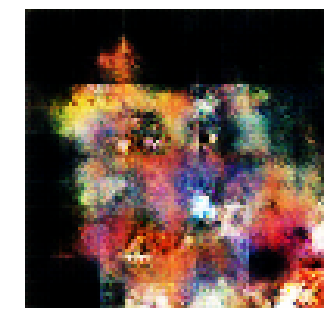


Epoch: 1720, D: -8.572, G: 4.569
Epoch: 1721, D: -8.521, G: 3.742
Epoch: 1722, D: -7.903, G: -0.8144
Epoch: 1723, D: -5.965, G: 4.68
Epoch: 1724, D: -8.174, G: 5.369
Epoch: 1725, D: -7.281, G: 1.41
Epoch: 1726, D: -9.68, G: 5.627
Epoch: 1727, D: -6.244, G: 4.37
Epoch: 1728, D: -6.694, G: 0.3481
Epoch: 1729, D: -7.756, G: 1.468
Epoch: 1730, D: -7.865, G: 0.2982
Epoch: 1731, D: -7.822, G: 3.856
Epoch: 1732, D: -8.394, G: 2.026
Epoch: 1733, D: -6.859, G: 0.9718
Epoch: 1734, D: -9.92, G: 6.652
Epoch: 1735, D: -7.759, G: 0.002334
Epoch: 1736, D: -8.629, G: 2.538
Epoch: 1737, D: -8.767, G: 3.134
Epoch: 1738, D: -8.365, G: 6.285
Epoch: 1739, D: -6.138, G: 2.882


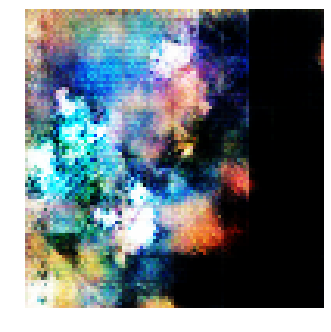


Epoch: 1740, D: -7.886, G: 8.417
Epoch: 1741, D: -6.434, G: 2.319
Epoch: 1742, D: -7.606, G: 5.039
Epoch: 1743, D: -8.086, G: 3.12
Epoch: 1744, D: -6.741, G: 0.003968
Epoch: 1745, D: -10.02, G: 3.035
Epoch: 1746, D: -7.21, G: 2.209
Epoch: 1747, D: -8.51, G: 4.818
Epoch: 1748, D: -6.497, G: 3.319
Epoch: 1749, D: -7.176, G: 4.047
Epoch: 1750, D: -9.248, G: 2.178
Epoch: 1751, D: -8.467, G: -0.402
Epoch: 1752, D: -8.172, G: 0.5593
Epoch: 1753, D: -7.57, G: 0.8437
Epoch: 1754, D: -7.985, G: 4.525
Epoch: 1755, D: -7.258, G: 5.753
Epoch: 1756, D: -7.057, G: 3.921
Epoch: 1757, D: -4.708, G: 2.988
Epoch: 1758, D: -9.829, G: 5.435
Epoch: 1759, D: -7.751, G: -0.3589


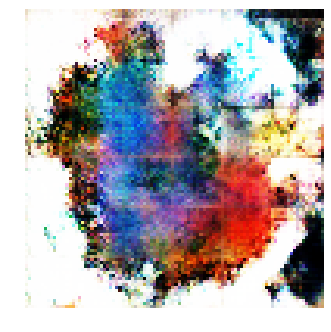


Epoch: 1760, D: -9.009, G: -1.627
Epoch: 1761, D: -7.909, G: 1.584
Epoch: 1762, D: -7.744, G: 6.409
Epoch: 1763, D: -7.113, G: 3.993
Epoch: 1764, D: -9.604, G: 3.411
Epoch: 1765, D: -7.76, G: 2.121
Epoch: 1766, D: -8.233, G: 2.214
Epoch: 1767, D: -8.039, G: 2.964
Epoch: 1768, D: -8.254, G: 3.933
Epoch: 1769, D: -8.998, G: 1.32
Epoch: 1770, D: -7.224, G: 1.301
Epoch: 1771, D: -8.088, G: 4.076
Epoch: 1772, D: -8.074, G: 6.175
Epoch: 1773, D: -8.416, G: 1.728
Epoch: 1774, D: -9.974, G: 5.172
Epoch: 1775, D: -7.845, G: 3.033
Epoch: 1776, D: -7.559, G: 4.004
Epoch: 1777, D: -7.685, G: 4.626
Epoch: 1778, D: -6.86, G: 1.152
Epoch: 1779, D: -9.445, G: 4.681


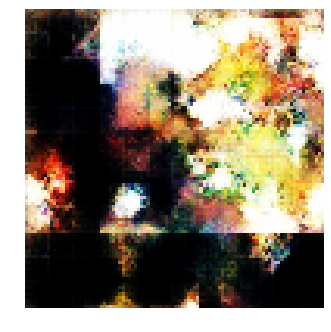


Epoch: 1780, D: -8.259, G: 1.468
Epoch: 1781, D: -8.675, G: -0.6609
Epoch: 1782, D: -8.502, G: 1.49
Epoch: 1783, D: -7.154, G: 3.553
Epoch: 1784, D: -6.287, G: 0.4438
Epoch: 1785, D: -7.483, G: 0.2647
Epoch: 1786, D: -7.305, G: 4.623
Epoch: 1787, D: -5.719, G: 2.591
Epoch: 1788, D: -9.565, G: 4.749
Epoch: 1789, D: -8.04, G: 1.889
Epoch: 1790, D: -9.857, G: 2.542
Epoch: 1791, D: -7.134, G: -1.08
Epoch: 1792, D: -9.154, G: 3.488
Epoch: 1793, D: -4.757, G: 2.105
Epoch: 1794, D: -10.3, G: 2.645
Epoch: 1795, D: -7.118, G: -0.1959
Epoch: 1796, D: -6.037, G: 3.956
Epoch: 1797, D: -7.937, G: 2.503
Epoch: 1798, D: -8.002, G: 3.19
Epoch: 1799, D: -6.621, G: 4.044


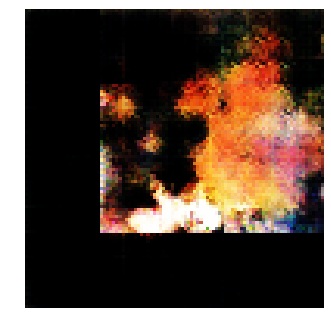


Epoch: 1800, D: -9.24, G: 4.349
Epoch: 1801, D: -5.704, G: 3.586
Epoch: 1802, D: -7.723, G: 2.463
Epoch: 1803, D: -7.17, G: 4.619
Epoch: 1804, D: -7.244, G: 1.148
Epoch: 1805, D: -7.145, G: 3.787
Epoch: 1806, D: -7.594, G: 2.119
Epoch: 1807, D: -6.381, G: 5.43
Epoch: 1808, D: -8.013, G: 5.117
Epoch: 1809, D: -8.465, G: 3.175
Epoch: 1810, D: -9.872, G: 1.749
Epoch: 1811, D: -10.2, G: 4.055
Epoch: 1812, D: -7.304, G: -0.5484
Epoch: 1813, D: -6.911, G: 3.037
Epoch: 1814, D: -7.843, G: 4.194
Epoch: 1815, D: -8.146, G: 4.186
Epoch: 1816, D: -9.878, G: 4.895
Epoch: 1817, D: -6.625, G: 1.464
Epoch: 1818, D: -7.249, G: 0.4119
Epoch: 1819, D: -7.198, G: 2.775


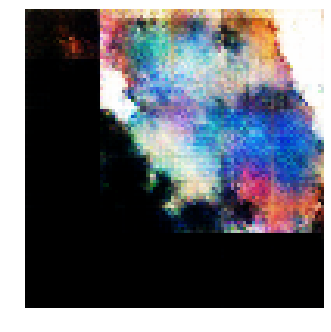


Epoch: 1820, D: -7.63, G: 4.384
Epoch: 1821, D: -8.041, G: 5.116
Epoch: 1822, D: -8.722, G: 2.777
Epoch: 1823, D: -10.13, G: 5.275
Epoch: 1824, D: -7.468, G: 1.691
Epoch: 1825, D: -7.852, G: 1.896
Epoch: 1826, D: -9.713, G: 4.25
Epoch: 1827, D: -6.911, G: 2.995
Epoch: 1828, D: -8.084, G: 6.763
Epoch: 1829, D: -7.436, G: 4.053
Epoch: 1830, D: -8.208, G: 0.2705
Epoch: 1831, D: -6.821, G: 1.166
Epoch: 1832, D: -8.865, G: 3.869
Epoch: 1833, D: -8.638, G: 1.116
Epoch: 1834, D: -9.049, G: 3.479
Epoch: 1835, D: -7.56, G: 2.823
Epoch: 1836, D: -8.984, G: -1.395
Epoch: 1837, D: -9.794, G: 4.788
Epoch: 1838, D: -6.368, G: 1.95
Epoch: 1839, D: -8.233, G: 2.108


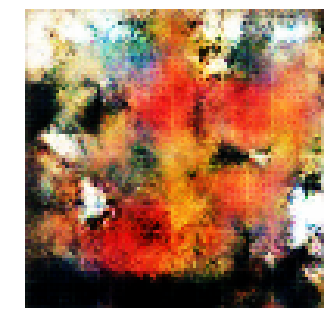


Epoch: 1840, D: -9.844, G: 3.722
Epoch: 1841, D: -7.039, G: 1.441
Epoch: 1842, D: -7.506, G: 6.901
Epoch: 1843, D: -8.199, G: 2.986
Epoch: 1844, D: -7.659, G: 2.841
Epoch: 1845, D: -6.993, G: 3.09
Epoch: 1846, D: -8.092, G: 4.188
Epoch: 1847, D: -6.337, G: 2.337
Epoch: 1848, D: -8.502, G: 4.145
Epoch: 1849, D: -6.338, G: 0.5096
Epoch: 1850, D: -7.73, G: 5.179
Epoch: 1851, D: -8.478, G: 3.694
Epoch: 1852, D: -7.037, G: 0.0892
Epoch: 1853, D: -9.912, G: 3.219
Epoch: 1854, D: -8.382, G: 5.432
Epoch: 1855, D: -8.128, G: -3.45
Epoch: 1856, D: -8.642, G: 0.8274
Epoch: 1857, D: -7.973, G: 3.683
Epoch: 1858, D: -7.901, G: 1.24
Epoch: 1859, D: -7.09, G: 3.501


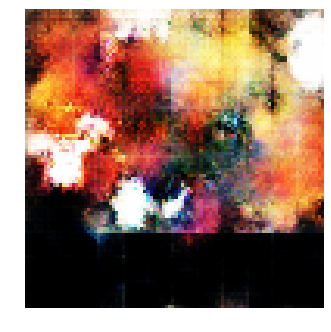


Epoch: 1860, D: -7.048, G: 8.257
Epoch: 1861, D: -6.905, G: 3.089
Epoch: 1862, D: -7.336, G: 4.793
Epoch: 1863, D: -7.496, G: 4.325
Epoch: 1864, D: -7.218, G: 4.313
Epoch: 1865, D: -8.086, G: 4.78
Epoch: 1866, D: -9.475, G: -0.2987
Epoch: 1867, D: -9.19, G: 0.5929
Epoch: 1868, D: -8.213, G: -1.3
Epoch: 1869, D: -8.435, G: 2.903
Epoch: 1870, D: -6.442, G: 5.006
Epoch: 1871, D: -10.0, G: 3.969
Epoch: 1872, D: -7.569, G: 2.148
Epoch: 1873, D: -8.284, G: 1.754
Epoch: 1874, D: -7.31, G: 3.742
Epoch: 1875, D: -7.015, G: 4.312
Epoch: 1876, D: -8.05, G: 3.504
Epoch: 1877, D: -7.188, G: 8.491
Epoch: 1878, D: -7.586, G: 2.714
Epoch: 1879, D: -9.361, G: 3.45


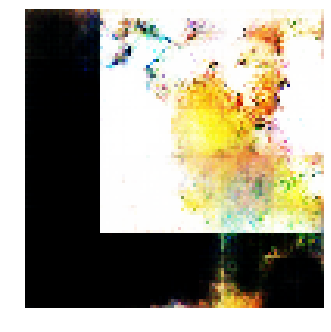


Epoch: 1880, D: -6.888, G: 0.803
Epoch: 1881, D: -7.872, G: 5.977
Epoch: 1882, D: -8.528, G: 2.655
Epoch: 1883, D: -7.844, G: 1.588
Epoch: 1884, D: -6.94, G: 5.899
Epoch: 1885, D: -8.335, G: 3.001
Epoch: 1886, D: -6.958, G: 2.913
Epoch: 1887, D: -6.967, G: 3.526
Epoch: 1888, D: -9.753, G: 4.443
Epoch: 1889, D: -7.146, G: 2.136
Epoch: 1890, D: -7.124, G: 5.871
Epoch: 1891, D: -7.075, G: 4.177
Epoch: 1892, D: -6.678, G: -0.2055
Epoch: 1893, D: -7.771, G: 5.622
Epoch: 1894, D: -6.392, G: -1.825
Epoch: 1895, D: -7.197, G: 1.682
Epoch: 1896, D: -8.126, G: 5.677
Epoch: 1897, D: -6.826, G: 3.323
Epoch: 1898, D: -10.43, G: 5.266
Epoch: 1899, D: -7.516, G: 0.4725


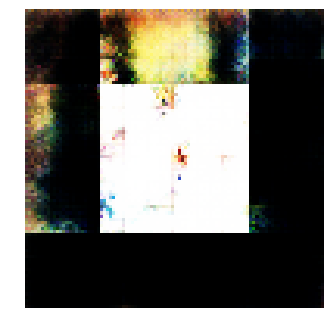


Epoch: 1900, D: -8.138, G: 3.1
Epoch: 1901, D: -7.982, G: 4.655
Epoch: 1902, D: -7.567, G: 3.192
Epoch: 1903, D: -6.864, G: 2.597
Epoch: 1904, D: -7.975, G: 1.765
Epoch: 1905, D: -6.356, G: 2.792
Epoch: 1906, D: -6.459, G: 3.605
Epoch: 1907, D: -8.676, G: 1.955
Epoch: 1908, D: -6.423, G: 6.269
Epoch: 1909, D: -9.724, G: 3.565
Epoch: 1910, D: -7.024, G: 3.48
Epoch: 1911, D: -8.449, G: 4.978
Epoch: 1912, D: -9.125, G: 4.312
Epoch: 1913, D: -6.107, G: 1.841
Epoch: 1914, D: -8.129, G: 6.369
Epoch: 1915, D: -7.813, G: 5.124
Epoch: 1916, D: -6.682, G: 2.529
Epoch: 1917, D: -7.851, G: 5.619
Epoch: 1918, D: -8.708, G: 2.277
Epoch: 1919, D: -8.036, G: 1.287


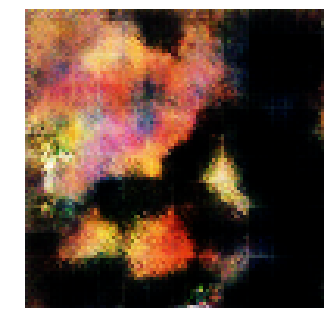


Epoch: 1920, D: -9.239, G: 2.832
Epoch: 1921, D: -5.387, G: 0.1177
Epoch: 1922, D: -8.432, G: 5.556
Epoch: 1923, D: -8.305, G: 1.999
Epoch: 1924, D: -9.142, G: 4.985
Epoch: 1925, D: -8.253, G: 1.851
Epoch: 1926, D: -7.012, G: 3.592
Epoch: 1927, D: -9.279, G: 1.138
Epoch: 1928, D: -8.742, G: 2.698
Epoch: 1929, D: -7.257, G: 0.7026
Epoch: 1930, D: -9.192, G: 2.342
Epoch: 1931, D: -8.283, G: 3.56
Epoch: 1932, D: -7.26, G: 1.473
Epoch: 1933, D: -6.072, G: 0.3469
Epoch: 1934, D: -7.562, G: 1.353
Epoch: 1935, D: -8.89, G: 3.257
Epoch: 1936, D: -7.008, G: -0.7908
Epoch: 1937, D: -5.803, G: 0.05123
Epoch: 1938, D: -7.048, G: 5.264
Epoch: 1939, D: -8.197, G: 2.433


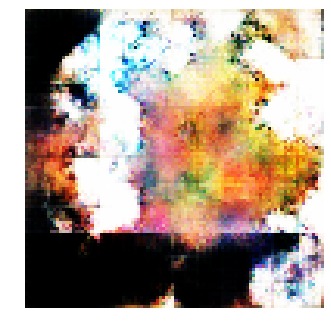


Epoch: 1940, D: -9.624, G: 7.119
Epoch: 1941, D: -8.372, G: 2.552
Epoch: 1942, D: -7.172, G: 5.166
Epoch: 1943, D: -6.349, G: 4.47
Epoch: 1944, D: -7.869, G: 3.176
Epoch: 1945, D: -8.019, G: 4.183
Epoch: 1946, D: -7.51, G: 3.116
Epoch: 1947, D: -8.323, G: 4.94
Epoch: 1948, D: -6.461, G: -0.8001
Epoch: 1949, D: -9.075, G: 2.93
Epoch: 1950, D: -8.212, G: 2.734
Epoch: 1951, D: -6.61, G: 3.721
Epoch: 1952, D: -7.615, G: 2.844
Epoch: 1953, D: -6.427, G: 3.229
Epoch: 1954, D: -7.227, G: 3.129
Epoch: 1955, D: -9.902, G: 4.469
Epoch: 1956, D: -8.576, G: 0.8525
Epoch: 1957, D: -6.531, G: 3.545
Epoch: 1958, D: -7.623, G: 4.772
Epoch: 1959, D: -5.431, G: 1.731


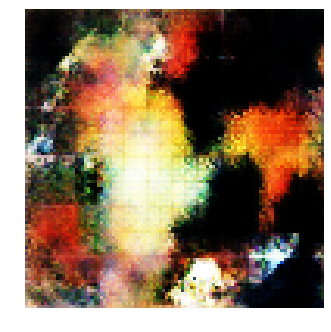


Epoch: 1960, D: -6.822, G: 4.471
Epoch: 1961, D: -6.448, G: 6.756
Epoch: 1962, D: -6.268, G: 3.781
Epoch: 1963, D: -7.929, G: 2.745
Epoch: 1964, D: -6.465, G: 4.523
Epoch: 1965, D: -6.175, G: 0.007675
Epoch: 1966, D: -8.297, G: 4.235
Epoch: 1967, D: -8.291, G: 4.604
Epoch: 1968, D: -7.513, G: 4.397
Epoch: 1969, D: -7.959, G: 0.6416
Epoch: 1970, D: -6.672, G: 3.616
Epoch: 1971, D: -8.561, G: 3.796
Epoch: 1972, D: -6.687, G: 0.9678
Epoch: 1973, D: -9.786, G: 1.905
Epoch: 1974, D: -9.529, G: 2.434
Epoch: 1975, D: -7.049, G: 2.645
Epoch: 1976, D: -7.533, G: 2.586
Epoch: 1977, D: -7.16, G: 5.635
Epoch: 1978, D: -7.878, G: 6.93
Epoch: 1979, D: -6.365, G: 2.855


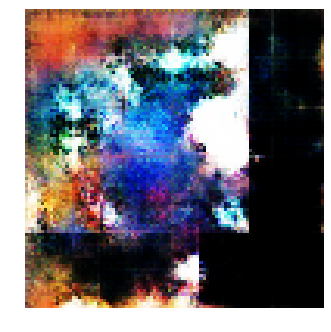


Epoch: 1980, D: 1.187, G: 5.095
Epoch: 1981, D: -7.7, G: 3.794
Epoch: 1982, D: -5.145, G: 1.28
Epoch: 1983, D: -6.444, G: 4.87
Epoch: 1984, D: -6.62, G: -4.271
Epoch: 1985, D: -7.634, G: 3.149
Epoch: 1986, D: -8.644, G: -0.2228
Epoch: 1987, D: -6.214, G: -0.1541
Epoch: 1988, D: -8.86, G: 1.971
Epoch: 1989, D: -6.031, G: 0.9637
Epoch: 1990, D: -8.053, G: -0.5628
Epoch: 1991, D: -10.76, G: 0.7726
Epoch: 1992, D: -5.908, G: -2.56
Epoch: 1993, D: -6.62, G: 2.311
Epoch: 1994, D: -8.324, G: 4.559
Epoch: 1995, D: -7.702, G: 3.413
Epoch: 1996, D: -6.415, G: -0.6477
Epoch: 1997, D: -8.485, G: 0.7433
Epoch: 1998, D: -7.38, G: 5.571
Epoch: 1999, D: -8.073, G: 1.675


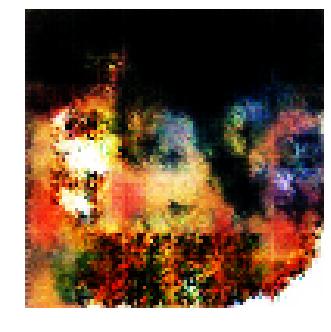


Epoch: 2000, D: -8.428, G: 2.593
Epoch: 2001, D: -9.199, G: 4.016
Epoch: 2002, D: -6.656, G: 2.427
Epoch: 2003, D: -6.166, G: 5.374
Epoch: 2004, D: -6.314, G: 1.298
Epoch: 2005, D: -6.933, G: 5.445
Epoch: 2006, D: -5.867, G: 1.816
Epoch: 2007, D: -5.116, G: 4.982
Epoch: 2008, D: -8.57, G: 4.871
Epoch: 2009, D: -9.482, G: 4.149
Epoch: 2010, D: -7.329, G: 1.316
Epoch: 2011, D: -7.531, G: 1.949
Epoch: 2012, D: -7.66, G: 2.085
Epoch: 2013, D: -4.951, G: 2.855
Epoch: 2014, D: -9.301, G: 1.232
Epoch: 2015, D: -8.528, G: 2.831
Epoch: 2016, D: -8.778, G: -1.239
Epoch: 2017, D: -6.162, G: 0.1746
Epoch: 2018, D: -6.949, G: 2.294
Epoch: 2019, D: -7.669, G: 4.201


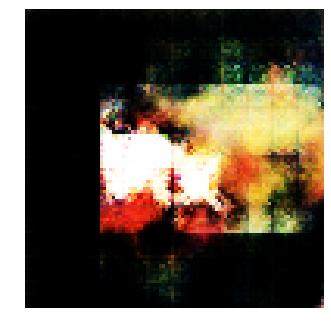


Epoch: 2020, D: -9.155, G: 2.043
Epoch: 2021, D: -8.859, G: -1.933
Epoch: 2022, D: -7.393, G: 1.579
Epoch: 2023, D: -7.836, G: 0.7562
Epoch: 2024, D: -8.858, G: 1.433
Epoch: 2025, D: -10.29, G: 0.6147
Epoch: 2026, D: -8.729, G: 1.9
Epoch: 2027, D: -7.345, G: 2.443
Epoch: 2028, D: -7.295, G: 4.403
Epoch: 2029, D: -9.407, G: 2.519
Epoch: 2030, D: -8.515, G: -1.095
Epoch: 2031, D: -6.852, G: 1.655
Epoch: 2032, D: -8.465, G: 5.279
Epoch: 2033, D: -7.168, G: 1.365
Epoch: 2034, D: -7.293, G: 1.256
Epoch: 2035, D: -8.054, G: 4.692
Epoch: 2036, D: -8.228, G: -0.9025
Epoch: 2037, D: -8.032, G: 3.259
Epoch: 2038, D: -6.922, G: 3.534
Epoch: 2039, D: -7.503, G: 4.965


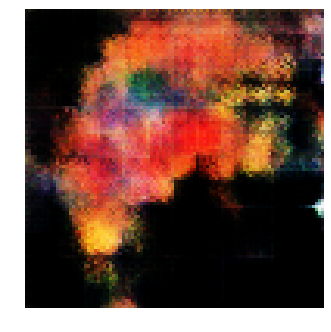


Epoch: 2040, D: -8.633, G: 3.975
Epoch: 2041, D: -8.515, G: 1.153
Epoch: 2042, D: -7.676, G: 2.725
Epoch: 2043, D: -7.914, G: 1.689
Epoch: 2044, D: -9.127, G: 2.351
Epoch: 2045, D: -8.396, G: 3.326
Epoch: 2046, D: -8.427, G: 4.496
Epoch: 2047, D: -9.304, G: 3.6
Epoch: 2048, D: -6.901, G: 3.334
Epoch: 2049, D: -8.418, G: 2.721
Epoch: 2050, D: -6.812, G: 0.2992
Epoch: 2051, D: -6.816, G: 2.538
Epoch: 2052, D: -8.039, G: 3.891
Epoch: 2053, D: -8.195, G: 0.5223
Epoch: 2054, D: -8.801, G: 2.749
Epoch: 2055, D: -6.64, G: 1.068
Epoch: 2056, D: -9.517, G: 0.6898
Epoch: 2057, D: -7.574, G: 1.646
Epoch: 2058, D: -7.669, G: 5.312
Epoch: 2059, D: -7.922, G: 2.27


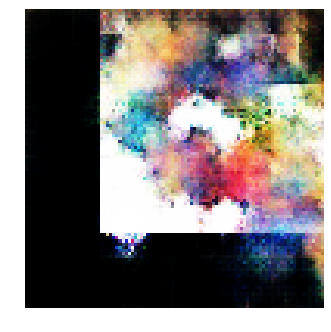


Epoch: 2060, D: -6.895, G: 3.44
Epoch: 2061, D: -8.207, G: 3.485
Epoch: 2062, D: -7.539, G: 2.595
Epoch: 2063, D: -9.668, G: 1.363
Epoch: 2064, D: -9.386, G: 4.639
Epoch: 2065, D: -7.995, G: 0.15
Epoch: 2066, D: -7.442, G: 3.07
Epoch: 2067, D: -8.175, G: 1.742
Epoch: 2068, D: -5.976, G: 1.497
Epoch: 2069, D: -8.244, G: 4.381
Epoch: 2070, D: -8.773, G: 4.812
Epoch: 2071, D: -9.384, G: 3.669
Epoch: 2072, D: -7.649, G: 2.254
Epoch: 2073, D: -7.652, G: 1.054
Epoch: 2074, D: -7.202, G: 6.186
Epoch: 2075, D: -5.664, G: 2.723
Epoch: 2076, D: -7.405, G: 4.995
Epoch: 2077, D: -6.0, G: 3.133
Epoch: 2078, D: -7.527, G: 4.395
Epoch: 2079, D: -7.845, G: 2.263


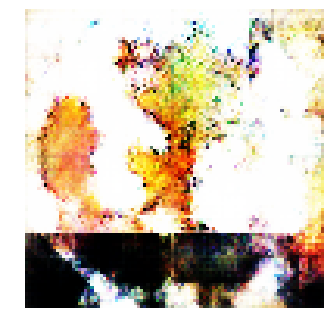


Epoch: 2080, D: -5.946, G: 2.428
Epoch: 2081, D: -6.839, G: 6.888
Epoch: 2082, D: -6.961, G: 3.688
Epoch: 2083, D: -7.416, G: 1.45
Epoch: 2084, D: -7.767, G: 2.277
Epoch: 2085, D: -7.597, G: 2.555
Epoch: 2086, D: -6.963, G: 4.002
Epoch: 2087, D: -8.172, G: 4.387
Epoch: 2088, D: -8.309, G: 0.0465
Epoch: 2089, D: -7.501, G: 3.262
Epoch: 2090, D: -5.905, G: 5.474
Epoch: 2091, D: -8.294, G: 3.384
Epoch: 2092, D: -9.041, G: 1.982
Epoch: 2093, D: -9.051, G: 3.298
Epoch: 2094, D: -7.39, G: 4.709
Epoch: 2095, D: -8.257, G: 2.468
Epoch: 2096, D: -8.787, G: 2.881
Epoch: 2097, D: -8.555, G: 3.568
Epoch: 2098, D: -7.046, G: -0.4982
Epoch: 2099, D: -7.112, G: 4.44


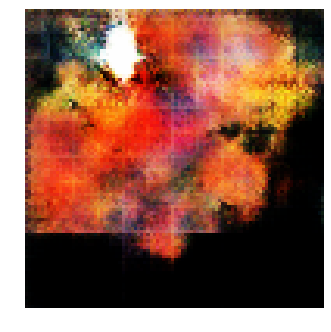


Epoch: 2100, D: -6.411, G: 1.774
Epoch: 2101, D: -6.938, G: 1.754
Epoch: 2102, D: -7.889, G: 8.119
Epoch: 2103, D: -6.924, G: 2.376
Epoch: 2104, D: -8.626, G: 3.318
Epoch: 2105, D: -8.532, G: 1.203
Epoch: 2106, D: -7.902, G: 3.906
Epoch: 2107, D: -9.343, G: 2.357
Epoch: 2108, D: -7.37, G: 1.914
Epoch: 2109, D: -8.047, G: 3.888
Epoch: 2110, D: -8.144, G: 2.637
Epoch: 2111, D: -9.331, G: 2.88
Epoch: 2112, D: -7.945, G: 1.148
Epoch: 2113, D: -9.693, G: 4.87
Epoch: 2114, D: -6.858, G: 4.428
Epoch: 2115, D: -8.534, G: 3.931
Epoch: 2116, D: -7.855, G: 3.778
Epoch: 2117, D: -7.502, G: 0.9659
Epoch: 2118, D: -8.441, G: 6.195
Epoch: 2119, D: -7.527, G: 1.026


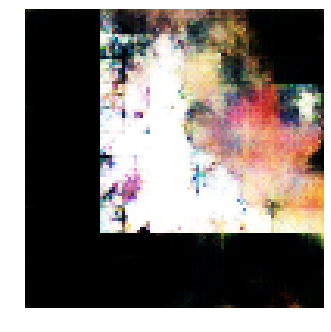


Epoch: 2120, D: -8.746, G: 3.075
Epoch: 2121, D: -6.779, G: 1.705
Epoch: 2122, D: -8.388, G: -0.8969
Epoch: 2123, D: -5.987, G: 5.034
Epoch: 2124, D: -8.992, G: 4.325
Epoch: 2125, D: -7.826, G: 4.103
Epoch: 2126, D: -6.174, G: 5.233
Epoch: 2127, D: -5.641, G: 3.855
Epoch: 2128, D: -8.34, G: 0.5246
Epoch: 2129, D: -9.358, G: 7.328
Epoch: 2130, D: -6.777, G: 3.634
Epoch: 2131, D: -7.111, G: 5.311
Epoch: 2132, D: -7.852, G: 2.183
Epoch: 2133, D: -7.308, G: 0.5546
Epoch: 2134, D: -8.062, G: 3.284
Epoch: 2135, D: -6.922, G: 2.157
Epoch: 2136, D: -8.562, G: 3.008
Epoch: 2137, D: -6.811, G: 2.609
Epoch: 2138, D: -8.629, G: 3.551
Epoch: 2139, D: -7.394, G: 0.7042


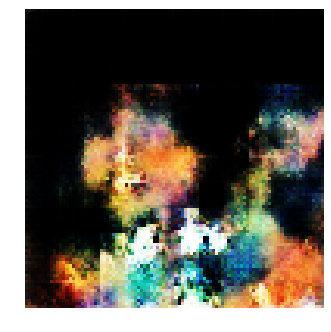


Epoch: 2140, D: -8.802, G: 3.904
Epoch: 2141, D: -6.154, G: 4.631
Epoch: 2142, D: -6.622, G: 3.957
Epoch: 2143, D: -9.195, G: 6.269
Epoch: 2144, D: -7.137, G: -0.6246
Epoch: 2145, D: -7.4, G: 3.515
Epoch: 2146, D: -6.894, G: 3.896
Epoch: 2147, D: -8.562, G: 1.823
Epoch: 2148, D: -8.1, G: 1.032
Epoch: 2149, D: -8.923, G: 2.0
Epoch: 2150, D: -5.958, G: 3.234
Epoch: 2151, D: -10.02, G: 4.106
Epoch: 2152, D: -7.601, G: 1.01
Epoch: 2153, D: -7.193, G: 2.247
Epoch: 2154, D: -7.679, G: 2.624
Epoch: 2155, D: -8.76, G: 1.564
Epoch: 2156, D: -8.593, G: 2.675
Epoch: 2157, D: -7.12, G: 4.69
Epoch: 2158, D: -8.002, G: 1.616
Epoch: 2159, D: -9.273, G: 1.426


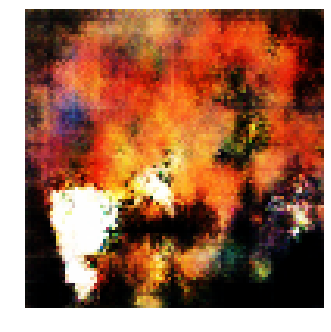


Epoch: 2160, D: -8.009, G: 1.728
Epoch: 2161, D: -8.459, G: 2.453
Epoch: 2162, D: -7.941, G: 2.747
Epoch: 2163, D: -6.757, G: 1.311
Epoch: 2164, D: -7.692, G: -2.142
Epoch: 2165, D: -8.35, G: 2.667
Epoch: 2166, D: -7.595, G: -2.052
Epoch: 2167, D: -7.091, G: 3.587
Epoch: 2168, D: -7.758, G: 4.38
Epoch: 2169, D: -6.662, G: 3.256
Epoch: 2170, D: -7.659, G: 3.745
Epoch: 2171, D: -8.097, G: 5.298
Epoch: 2172, D: -8.162, G: 5.251
Epoch: 2173, D: -5.605, G: 2.896
Epoch: 2174, D: -8.605, G: 0.3913
Epoch: 2175, D: -6.587, G: 1.876
Epoch: 2176, D: -6.616, G: 5.234
Epoch: 2177, D: -6.723, G: 0.4252
Epoch: 2178, D: -8.284, G: 5.903
Epoch: 2179, D: -9.496, G: 3.589


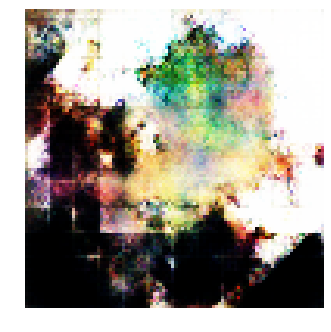


Epoch: 2180, D: -9.057, G: 0.8868
Epoch: 2181, D: -6.346, G: 4.788
Epoch: 2182, D: -8.548, G: 5.229
Epoch: 2183, D: -9.125, G: 4.704
Epoch: 2184, D: -6.151, G: 2.068
Epoch: 2185, D: -7.983, G: 4.44
Epoch: 2186, D: -6.321, G: 2.24
Epoch: 2187, D: -9.943, G: 2.965
Epoch: 2188, D: -7.67, G: 1.31
Epoch: 2189, D: -7.01, G: 3.275
Epoch: 2190, D: -6.874, G: 5.967
Epoch: 2191, D: -6.029, G: 2.142
Epoch: 2192, D: -7.956, G: 1.726
Epoch: 2193, D: -11.24, G: 3.734
Epoch: 2194, D: -7.826, G: 0.2412
Epoch: 2195, D: -8.987, G: 2.953
Epoch: 2196, D: -6.675, G: 1.32
Epoch: 2197, D: -8.282, G: -0.1385
Epoch: 2198, D: -8.519, G: 3.657
Epoch: 2199, D: -8.568, G: -0.2897


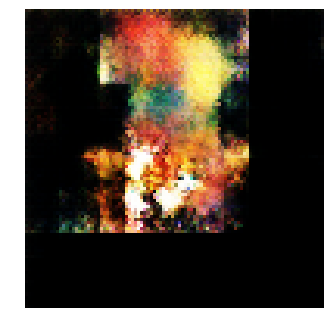


Epoch: 2200, D: -6.007, G: 0.5758
Epoch: 2201, D: -6.6, G: 2.135
Epoch: 2202, D: -8.891, G: 3.729
Epoch: 2203, D: -8.08, G: 4.802
Epoch: 2204, D: -7.749, G: 4.746
Epoch: 2205, D: -8.561, G: 5.227
Epoch: 2206, D: -8.11, G: 4.884
Epoch: 2207, D: -6.502, G: 4.425
Epoch: 2208, D: -7.892, G: 2.119
Epoch: 2209, D: -6.823, G: 1.506
Epoch: 2210, D: -7.62, G: 3.138
Epoch: 2211, D: -8.519, G: 0.3456
Epoch: 2212, D: -8.684, G: 1.002
Epoch: 2213, D: -8.29, G: 4.816
Epoch: 2214, D: -8.72, G: 1.642
Epoch: 2215, D: -8.637, G: 4.993
Epoch: 2216, D: -8.864, G: 3.676
Epoch: 2217, D: -8.392, G: 5.284
Epoch: 2218, D: -8.237, G: 4.834
Epoch: 2219, D: -7.726, G: 0.7541


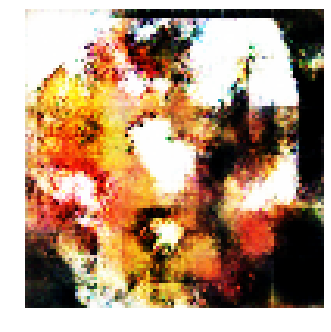


Epoch: 2220, D: -6.762, G: 4.716
Epoch: 2221, D: -7.387, G: 3.959
Epoch: 2222, D: -7.614, G: 1.016
Epoch: 2223, D: -8.035, G: 1.382
Epoch: 2224, D: -5.318, G: 4.465
Epoch: 2225, D: -9.846, G: 4.208
Epoch: 2226, D: -9.354, G: 2.003
Epoch: 2227, D: -5.874, G: 3.855
Epoch: 2228, D: -9.503, G: 4.265
Epoch: 2229, D: -8.594, G: 4.901
Epoch: 2230, D: -6.993, G: 1.307
Epoch: 2231, D: -7.655, G: 7.365
Epoch: 2232, D: -7.436, G: 4.208
Epoch: 2233, D: -8.596, G: 2.315
Epoch: 2234, D: -8.626, G: -0.1422
Epoch: 2235, D: -8.474, G: -0.4221
Epoch: 2236, D: -8.629, G: 0.2051
Epoch: 2237, D: -10.4, G: 2.125
Epoch: 2238, D: -10.1, G: 1.294
Epoch: 2239, D: -6.619, G: 1.125


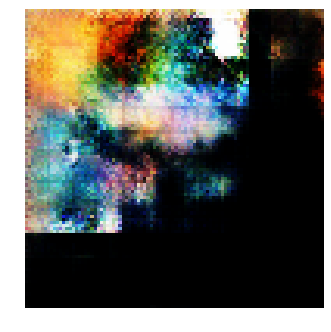


Epoch: 2240, D: -7.256, G: 0.5933
Epoch: 2241, D: -7.469, G: 5.989
Epoch: 2242, D: -8.388, G: 1.963
Epoch: 2243, D: -8.318, G: 0.6845
Epoch: 2244, D: -8.495, G: 4.651
Epoch: 2245, D: -7.148, G: 3.206
Epoch: 2246, D: -5.728, G: 1.915
Epoch: 2247, D: -8.269, G: 3.95
Epoch: 2248, D: -8.39, G: 2.56
Epoch: 2249, D: -8.137, G: 3.478
Epoch: 2250, D: -8.612, G: 3.763
Epoch: 2251, D: -8.01, G: -0.5856
Epoch: 2252, D: -7.712, G: 3.109
Epoch: 2253, D: -8.735, G: 3.933
Epoch: 2254, D: -7.152, G: 2.641
Epoch: 2255, D: -8.253, G: 3.947
Epoch: 2256, D: -7.944, G: 2.702
Epoch: 2257, D: -8.148, G: 2.202
Epoch: 2258, D: -7.269, G: 5.301
Epoch: 2259, D: -8.257, G: 1.989


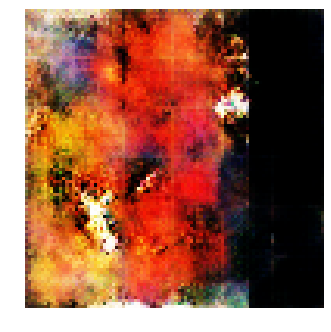


Epoch: 2260, D: -7.051, G: 3.195
Epoch: 2261, D: -7.695, G: 6.404
Epoch: 2262, D: -6.802, G: 2.114
Epoch: 2263, D: -7.803, G: 5.272
Epoch: 2264, D: -8.577, G: 6.362
Epoch: 2265, D: -10.0, G: 3.134
Epoch: 2266, D: -8.671, G: 5.612
Epoch: 2267, D: -6.378, G: -1.544
Epoch: 2268, D: -7.119, G: 4.135
Epoch: 2269, D: -8.213, G: 2.706
Epoch: 2270, D: -6.126, G: 1.788
Epoch: 2271, D: -6.783, G: 2.66
Epoch: 2272, D: -7.379, G: 4.574
Epoch: 2273, D: -9.208, G: 3.742
Epoch: 2274, D: -7.214, G: 2.628
Epoch: 2275, D: -8.124, G: 2.602
Epoch: 2276, D: -5.721, G: 3.05
Epoch: 2277, D: -7.027, G: 5.417
Epoch: 2278, D: -6.142, G: 2.669
Epoch: 2279, D: -8.243, G: 2.886


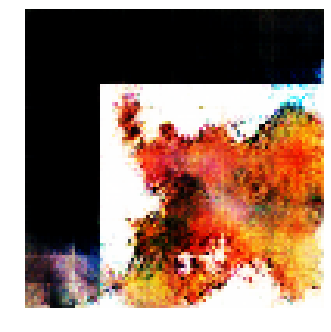


Epoch: 2280, D: -8.382, G: 1.35
Epoch: 2281, D: -7.496, G: 4.534
Epoch: 2282, D: -8.469, G: 1.662
Epoch: 2283, D: -7.546, G: 1.385
Epoch: 2284, D: -7.254, G: 2.857
Epoch: 2285, D: -8.308, G: 0.05549
Epoch: 2286, D: -7.278, G: 0.2309
Epoch: 2287, D: -8.473, G: 7.682
Epoch: 2288, D: -7.531, G: 2.627
Epoch: 2289, D: -7.061, G: 7.018
Epoch: 2290, D: -9.055, G: 2.442
Epoch: 2291, D: -9.013, G: 4.076
Epoch: 2292, D: -8.834, G: -1.955
Epoch: 2293, D: -8.411, G: 2.919
Epoch: 2294, D: -8.494, G: 3.341
Epoch: 2295, D: -5.855, G: 0.3834
Epoch: 2296, D: -6.444, G: 5.532
Epoch: 2297, D: -7.35, G: 3.271
Epoch: 2298, D: -6.042, G: 0.9132
Epoch: 2299, D: -9.431, G: 4.098


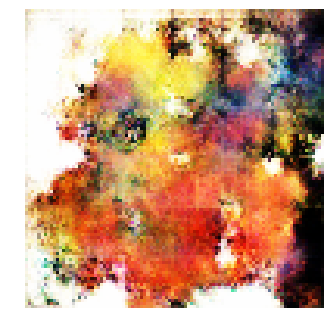


Epoch: 2300, D: -6.836, G: 2.575
Epoch: 2301, D: -8.771, G: 4.667
Epoch: 2302, D: -7.329, G: 3.606
Epoch: 2303, D: -6.681, G: 2.381
Epoch: 2304, D: -7.81, G: 4.094
Epoch: 2305, D: -9.417, G: 4.107
Epoch: 2306, D: -8.999, G: 2.614
Epoch: 2307, D: -10.22, G: 1.277
Epoch: 2308, D: -8.157, G: 1.641
Epoch: 2309, D: -7.081, G: 4.141
Epoch: 2310, D: -8.838, G: 5.228
Epoch: 2311, D: -8.23, G: 3.15
Epoch: 2312, D: -7.745, G: 3.93
Epoch: 2313, D: -7.153, G: 3.734
Epoch: 2314, D: -8.135, G: 3.259
Epoch: 2315, D: -7.113, G: 3.314
Epoch: 2316, D: -7.51, G: 2.07
Epoch: 2317, D: -6.91, G: 6.117
Epoch: 2318, D: -8.161, G: 2.488
Epoch: 2319, D: -8.217, G: 2.173


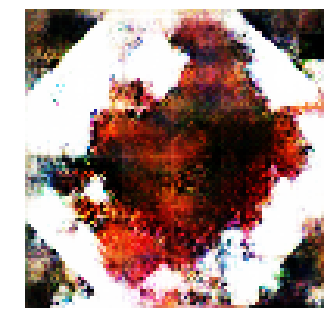


Epoch: 2320, D: -7.032, G: 4.576
Epoch: 2321, D: -8.234, G: 1.559
Epoch: 2322, D: -10.33, G: 2.442
Epoch: 2323, D: -7.67, G: 2.511
Epoch: 2324, D: -6.941, G: 6.289
Epoch: 2325, D: -6.877, G: 5.227
Epoch: 2326, D: -8.993, G: 4.482
Epoch: 2327, D: -7.032, G: 4.488
Epoch: 2328, D: -7.962, G: 2.308
Epoch: 2329, D: -5.071, G: 4.676
Epoch: 2330, D: -7.856, G: 2.058
Epoch: 2331, D: -7.45, G: 3.927
Epoch: 2332, D: -6.686, G: 1.365
Epoch: 2333, D: -9.174, G: 3.277
Epoch: 2334, D: -7.48, G: 3.738
Epoch: 2335, D: -7.77, G: 1.191
Epoch: 2336, D: -8.977, G: 3.294
Epoch: 2337, D: -5.276, G: 2.531
Epoch: 2338, D: -7.338, G: 4.112
Epoch: 2339, D: -8.008, G: 4.121


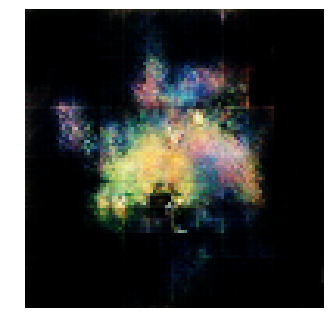


Epoch: 2340, D: -7.972, G: 2.352
Epoch: 2341, D: -8.439, G: 3.812
Epoch: 2342, D: -8.333, G: 4.454
Epoch: 2343, D: -6.567, G: 0.1322
Epoch: 2344, D: -6.684, G: 2.383
Epoch: 2345, D: -8.693, G: 4.736
Epoch: 2346, D: -7.876, G: 0.4467
Epoch: 2347, D: -6.137, G: 1.67
Epoch: 2348, D: -6.9, G: 4.477
Epoch: 2349, D: -6.616, G: 3.995
Epoch: 2350, D: -8.499, G: 1.692
Epoch: 2351, D: -6.273, G: 2.932
Epoch: 2352, D: -8.567, G: 5.848
Epoch: 2353, D: -6.215, G: 1.451
Epoch: 2354, D: -8.174, G: 0.2979
Epoch: 2355, D: -7.484, G: 1.881
Epoch: 2356, D: -8.459, G: 5.543
Epoch: 2357, D: -7.55, G: -0.5035
Epoch: 2358, D: -8.64, G: 4.097
Epoch: 2359, D: -8.478, G: 1.819


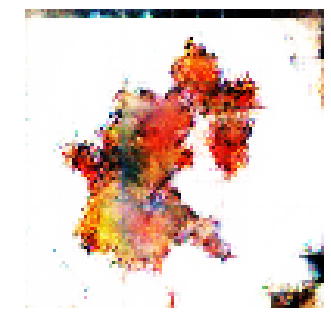


Epoch: 2360, D: -5.708, G: 2.016
Epoch: 2361, D: -6.776, G: 3.759
Epoch: 2362, D: -8.024, G: 3.42
Epoch: 2363, D: -8.815, G: 3.279
Epoch: 2364, D: -6.351, G: 2.61
Epoch: 2365, D: -7.706, G: 2.986
Epoch: 2366, D: -7.444, G: 2.284
Epoch: 2367, D: -9.187, G: 4.232
Epoch: 2368, D: -7.009, G: 2.027
Epoch: 2369, D: -8.807, G: 4.366
Epoch: 2370, D: -6.32, G: 4.501
Epoch: 2371, D: -7.6, G: 3.519
Epoch: 2372, D: -10.44, G: 5.987
Epoch: 2373, D: -8.241, G: 4.569
Epoch: 2374, D: -8.448, G: 5.95
Epoch: 2375, D: -7.602, G: 2.612
Epoch: 2376, D: -8.139, G: 6.004
Epoch: 2377, D: -8.022, G: 1.25
Epoch: 2378, D: -7.879, G: 2.489
Epoch: 2379, D: -7.921, G: 5.298


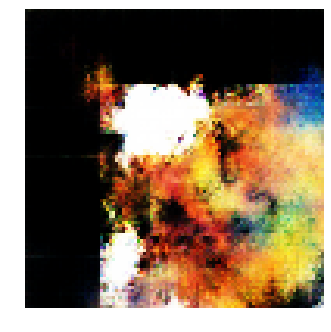


Epoch: 2380, D: -7.299, G: 3.604
Epoch: 2381, D: -8.448, G: 3.385
Epoch: 2382, D: -7.659, G: 2.219
Epoch: 2383, D: -6.565, G: 0.9651
Epoch: 2384, D: -8.566, G: 3.977
Epoch: 2385, D: -7.208, G: 1.094
Epoch: 2386, D: -7.396, G: 4.324
Epoch: 2387, D: -8.351, G: 0.07879
Epoch: 2388, D: -5.868, G: 2.561
Epoch: 2389, D: -10.43, G: 2.235
Epoch: 2390, D: -8.776, G: 3.348
Epoch: 2391, D: -7.979, G: 2.794
Epoch: 2392, D: -7.694, G: 3.762
Epoch: 2393, D: -10.27, G: 1.118
Epoch: 2394, D: -8.84, G: 3.369
Epoch: 2395, D: -8.013, G: 5.336
Epoch: 2396, D: -7.624, G: 2.819
Epoch: 2397, D: -7.779, G: 3.254
Epoch: 2398, D: -7.321, G: 8.448
Epoch: 2399, D: -6.261, G: 2.668


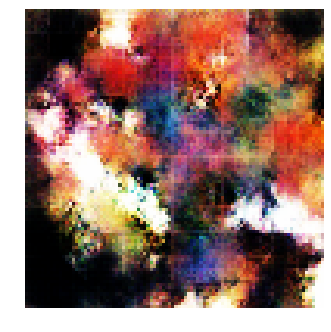


Epoch: 2400, D: -7.355, G: 2.792
Epoch: 2401, D: -7.456, G: 3.448
Epoch: 2402, D: -7.343, G: 3.028
Epoch: 2403, D: -8.488, G: 4.599
Epoch: 2404, D: -7.746, G: -0.6194
Epoch: 2405, D: -8.342, G: 4.55
Epoch: 2406, D: -8.102, G: 4.253
Epoch: 2407, D: -6.637, G: 4.396
Epoch: 2408, D: -8.121, G: 3.125
Epoch: 2409, D: -8.338, G: 1.416
Epoch: 2410, D: -7.403, G: 4.415
Epoch: 2411, D: -7.764, G: 4.108
Epoch: 2412, D: -6.713, G: 2.773
Epoch: 2413, D: -7.683, G: 2.979
Epoch: 2414, D: -6.211, G: 3.138
Epoch: 2415, D: -8.018, G: 1.582
Epoch: 2416, D: -7.452, G: 4.038
Epoch: 2417, D: -8.157, G: 4.238
Epoch: 2418, D: -7.23, G: 2.866
Epoch: 2419, D: -8.162, G: 2.079


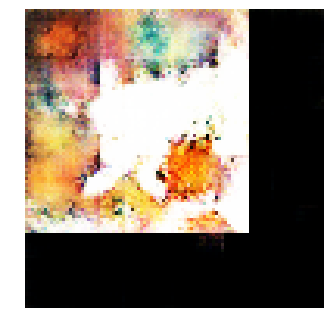


Epoch: 2420, D: -7.11, G: 1.573
Epoch: 2421, D: -7.392, G: 1.843
Epoch: 2422, D: -8.822, G: 3.853
Epoch: 2423, D: -7.954, G: -0.6232
Epoch: 2424, D: -6.156, G: 0.8332
Epoch: 2425, D: -8.129, G: 3.779
Epoch: 2426, D: -7.279, G: 4.794
Epoch: 2427, D: -7.179, G: 2.673
Epoch: 2428, D: -5.482, G: 2.721
Epoch: 2429, D: -9.182, G: 1.336
Epoch: 2430, D: -8.176, G: 2.046
Epoch: 2431, D: -8.516, G: 1.467
Epoch: 2432, D: -9.171, G: 6.028
Epoch: 2433, D: -8.348, G: 2.32
Epoch: 2434, D: -8.231, G: 3.47
Epoch: 2435, D: -7.477, G: 3.701
Epoch: 2436, D: -8.519, G: 2.18
Epoch: 2437, D: -9.174, G: 5.038
Epoch: 2438, D: -8.367, G: 2.557
Epoch: 2439, D: -8.312, G: 1.374


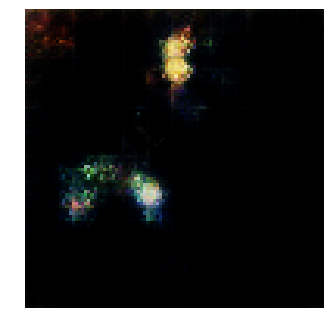


Epoch: 2440, D: -8.259, G: 3.663
Epoch: 2441, D: -8.365, G: 0.8318
Epoch: 2442, D: -5.864, G: 2.811
Epoch: 2443, D: -8.439, G: 4.883
Epoch: 2444, D: -6.529, G: 2.018
Epoch: 2445, D: -7.541, G: 4.283
Epoch: 2446, D: -7.359, G: 2.949
Epoch: 2447, D: -8.745, G: 6.171
Epoch: 2448, D: -6.711, G: 3.794
Epoch: 2449, D: -6.011, G: 4.044
Epoch: 2450, D: -5.583, G: 1.695
Epoch: 2451, D: -8.817, G: 1.838
Epoch: 2452, D: -8.127, G: 5.271
Epoch: 2453, D: -6.382, G: -1.009
Epoch: 2454, D: -7.276, G: 5.536
Epoch: 2455, D: -7.865, G: 2.034
Epoch: 2456, D: -8.03, G: 2.341
Epoch: 2457, D: -8.561, G: 3.25
Epoch: 2458, D: -7.306, G: 1.452
Epoch: 2459, D: -8.551, G: 2.339


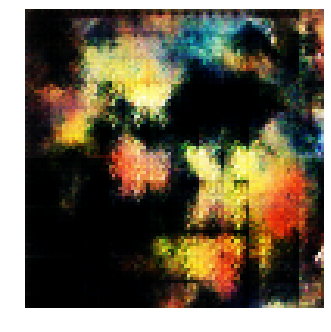


Epoch: 2460, D: -7.211, G: 3.044
Epoch: 2461, D: -7.424, G: 2.263
Epoch: 2462, D: -7.695, G: 2.39
Epoch: 2463, D: -7.424, G: 4.099
Epoch: 2464, D: -7.404, G: 1.922
Epoch: 2465, D: -6.77, G: 4.748
Epoch: 2466, D: -8.865, G: 5.836
Epoch: 2467, D: -5.904, G: 1.73
Epoch: 2468, D: -6.856, G: 2.844
Epoch: 2469, D: -7.733, G: 4.575
Epoch: 2470, D: -6.583, G: 2.344
Epoch: 2471, D: -6.444, G: 7.998
Epoch: 2472, D: -7.009, G: 6.396
Epoch: 2473, D: -6.6, G: 1.929
Epoch: 2474, D: -9.986, G: 4.042
Epoch: 2475, D: -6.879, G: 2.17
Epoch: 2476, D: -6.346, G: 3.935
Epoch: 2477, D: -6.697, G: 2.844
Epoch: 2478, D: -8.822, G: 2.913
Epoch: 2479, D: -7.134, G: 1.777


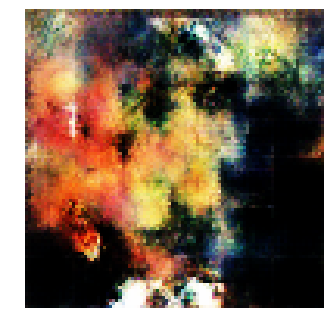


Epoch: 2480, D: -8.076, G: 3.311
Epoch: 2481, D: -8.023, G: 3.546
Epoch: 2482, D: -8.915, G: 6.063
Epoch: 2483, D: -7.778, G: 2.081
Epoch: 2484, D: -8.165, G: 4.718
Epoch: 2485, D: -8.492, G: 3.272
Epoch: 2486, D: -7.483, G: 3.322
Epoch: 2487, D: -10.05, G: 2.083
Epoch: 2488, D: -6.987, G: 4.014
Epoch: 2489, D: -7.251, G: 4.048
Epoch: 2490, D: -9.119, G: 4.559
Epoch: 2491, D: -8.069, G: 4.927
Epoch: 2492, D: -7.086, G: 5.551
Epoch: 2493, D: -9.54, G: 2.131
Epoch: 2494, D: -7.663, G: 3.287
Epoch: 2495, D: -7.659, G: 4.408
Epoch: 2496, D: -7.763, G: 3.36
Epoch: 2497, D: -7.665, G: 3.664
Epoch: 2498, D: -7.225, G: 3.566
Epoch: 2499, D: -7.787, G: 4.238


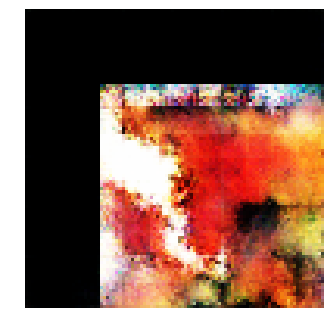


Epoch: 2500, D: -8.273, G: 3.121
Epoch: 2501, D: -8.048, G: 3.37
Epoch: 2502, D: -7.233, G: 0.6631
Epoch: 2503, D: -8.319, G: 3.892
Epoch: 2504, D: -7.133, G: 3.948
Epoch: 2505, D: -6.165, G: 4.059
Epoch: 2506, D: -7.89, G: 2.938
Epoch: 2507, D: -7.68, G: 3.343
Epoch: 2508, D: -7.894, G: 3.105
Epoch: 2509, D: -7.767, G: 7.17
Epoch: 2510, D: -7.783, G: 3.761
Epoch: 2511, D: -7.034, G: 2.205
Epoch: 2512, D: -8.74, G: 6.797
Epoch: 2513, D: -6.665, G: 3.706
Epoch: 2514, D: -8.371, G: 2.496
Epoch: 2515, D: -6.759, G: 4.004
Epoch: 2516, D: -6.176, G: 2.232
Epoch: 2517, D: -8.054, G: 4.002
Epoch: 2518, D: -7.377, G: 2.945
Epoch: 2519, D: -7.956, G: 2.107


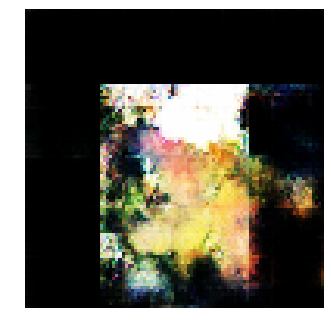


Epoch: 2520, D: -7.599, G: 5.548
Epoch: 2521, D: -9.195, G: 5.028
Epoch: 2522, D: -7.262, G: -2.42
Epoch: 2523, D: -5.974, G: 4.222
Epoch: 2524, D: -6.465, G: 4.181
Epoch: 2525, D: -9.216, G: 1.639
Epoch: 2526, D: -6.335, G: 1.031
Epoch: 2527, D: -8.929, G: 0.8534
Epoch: 2528, D: -10.37, G: -0.0587
Epoch: 2529, D: -8.732, G: -0.0838
Epoch: 2530, D: -6.627, G: 0.6748
Epoch: 2531, D: -7.831, G: 2.542
Epoch: 2532, D: -5.919, G: 2.325
Epoch: 2533, D: -6.403, G: 3.449
Epoch: 2534, D: -7.368, G: 2.576
Epoch: 2535, D: -7.743, G: 3.999
Epoch: 2536, D: -7.731, G: 4.721
Epoch: 2537, D: -7.237, G: 2.693
Epoch: 2538, D: -7.313, G: 1.937
Epoch: 2539, D: -7.771, G: 5.423


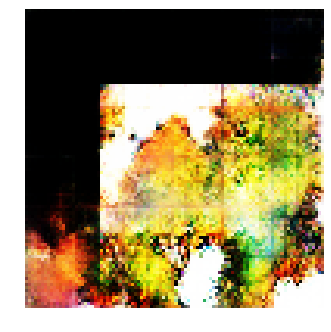


Epoch: 2540, D: -8.153, G: 2.543
Epoch: 2541, D: -8.634, G: 6.355
Epoch: 2542, D: -6.293, G: 0.5139
Epoch: 2543, D: -10.02, G: 4.257
Epoch: 2544, D: -6.875, G: 5.586
Epoch: 2545, D: -6.854, G: 4.581
Epoch: 2546, D: -6.524, G: 5.138
Epoch: 2547, D: -9.685, G: 4.499
Epoch: 2548, D: -7.316, G: 1.148
Epoch: 2549, D: -7.781, G: 3.003
Epoch: 2550, D: -8.1, G: 5.82
Epoch: 2551, D: -7.986, G: 3.494
Epoch: 2552, D: -10.12, G: 5.185
Epoch: 2553, D: -7.889, G: 1.865
Epoch: 2554, D: -7.796, G: 4.091
Epoch: 2555, D: -7.94, G: 5.025
Epoch: 2556, D: -9.436, G: 3.911
Epoch: 2557, D: -6.406, G: 3.651
Epoch: 2558, D: -8.101, G: 4.084
Epoch: 2559, D: -7.849, G: 5.025


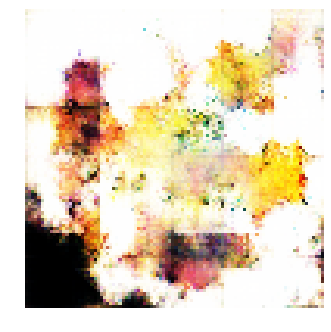


Epoch: 2560, D: -8.35, G: 2.831
Epoch: 2561, D: -8.462, G: 3.059
Epoch: 2562, D: -7.971, G: 3.005
Epoch: 2563, D: -8.226, G: 3.992
Epoch: 2564, D: -7.102, G: 3.725
Epoch: 2565, D: -9.213, G: 5.362
Epoch: 2566, D: -9.483, G: 2.741
Epoch: 2567, D: -7.6, G: 1.96
Epoch: 2568, D: -9.387, G: 6.435
Epoch: 2569, D: -7.418, G: 4.812
Epoch: 2570, D: -7.892, G: 1.743
Epoch: 2571, D: -8.131, G: 6.752
Epoch: 2572, D: -7.867, G: 3.516
Epoch: 2573, D: -6.977, G: 4.152
Epoch: 2574, D: -9.768, G: 4.316
Epoch: 2575, D: -6.579, G: 1.404
Epoch: 2576, D: -8.695, G: 4.138
Epoch: 2577, D: -8.085, G: 5.315
Epoch: 2578, D: -8.312, G: 4.165
Epoch: 2579, D: -8.277, G: 3.973


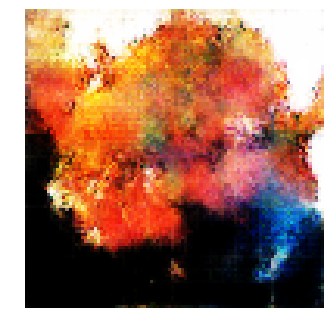


Epoch: 2580, D: -7.145, G: 1.825
Epoch: 2581, D: -8.92, G: 3.69
Epoch: 2582, D: -8.532, G: 4.029
Epoch: 2583, D: -8.775, G: 3.326
Epoch: 2584, D: -6.758, G: 0.111
Epoch: 2585, D: -10.76, G: 2.263
Epoch: 2586, D: -8.129, G: 3.141
Epoch: 2587, D: -8.148, G: 4.523
Epoch: 2588, D: -5.585, G: 6.402
Epoch: 2589, D: -9.285, G: 2.62
Epoch: 2590, D: -8.335, G: 3.866
Epoch: 2591, D: -7.227, G: 5.566
Epoch: 2592, D: -7.689, G: 1.981
Epoch: 2593, D: -8.078, G: 0.9292
Epoch: 2594, D: -9.442, G: 3.884
Epoch: 2595, D: -8.081, G: 2.218
Epoch: 2596, D: -8.07, G: 1.99
Epoch: 2597, D: -7.135, G: 2.987
Epoch: 2598, D: -7.167, G: 0.9584
Epoch: 2599, D: -7.214, G: 1.287


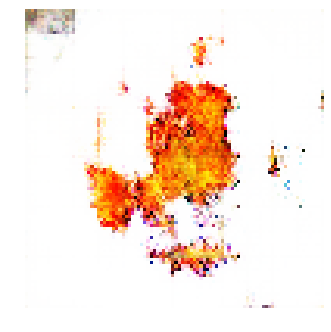


Epoch: 2600, D: -6.61, G: 5.168
Epoch: 2601, D: -8.232, G: 5.097
Epoch: 2602, D: -9.647, G: 0.5021
Epoch: 2603, D: -8.586, G: 5.045
Epoch: 2604, D: -7.688, G: 4.397
Epoch: 2605, D: -7.89, G: 3.889
Epoch: 2606, D: -7.118, G: 2.163
Epoch: 2607, D: -8.267, G: 3.788
Epoch: 2608, D: -7.597, G: 3.394
Epoch: 2609, D: -6.485, G: 5.189
Epoch: 2610, D: -6.372, G: 0.9046
Epoch: 2611, D: -8.273, G: 2.676
Epoch: 2612, D: -10.32, G: 4.917
Epoch: 2613, D: -7.327, G: 0.2017
Epoch: 2614, D: -7.486, G: 1.903
Epoch: 2615, D: -9.778, G: 4.611
Epoch: 2616, D: -10.2, G: 2.708
Epoch: 2617, D: -6.982, G: 2.06
Epoch: 2618, D: -7.532, G: 4.683
Epoch: 2619, D: -8.145, G: 5.547


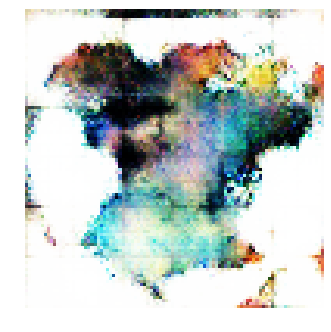


Epoch: 2620, D: -8.063, G: 3.051
Epoch: 2621, D: -6.236, G: 2.779
Epoch: 2622, D: -7.264, G: 4.051
Epoch: 2623, D: -8.683, G: 3.632
Epoch: 2624, D: -7.357, G: 4.238
Epoch: 2625, D: -7.709, G: 1.988
Epoch: 2626, D: -7.534, G: 3.369
Epoch: 2627, D: -7.726, G: 3.292
Epoch: 2628, D: -9.234, G: 3.27
Epoch: 2629, D: -6.731, G: 1.8
Epoch: 2630, D: -8.283, G: 3.124
Epoch: 2631, D: -9.674, G: 4.088
Epoch: 2632, D: -6.802, G: 1.86
Epoch: 2633, D: -7.88, G: 5.655
Epoch: 2634, D: -5.88, G: -0.1969
Epoch: 2635, D: -8.485, G: 4.245
Epoch: 2636, D: -7.475, G: 6.242
Epoch: 2637, D: -7.088, G: 3.254
Epoch: 2638, D: -7.036, G: 3.834
Epoch: 2639, D: -6.021, G: 4.736


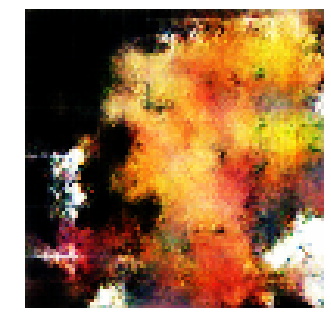


Epoch: 2640, D: -8.178, G: 3.848
Epoch: 2641, D: -8.959, G: 3.434
Epoch: 2642, D: -6.523, G: 1.945
Epoch: 2643, D: -8.453, G: 4.648
Epoch: 2644, D: -8.167, G: 2.919
Epoch: 2645, D: -10.0, G: 4.462
Epoch: 2646, D: -8.161, G: 3.794
Epoch: 2647, D: -6.554, G: 3.012
Epoch: 2648, D: -8.674, G: 4.395
Epoch: 2649, D: -8.42, G: 2.14
Epoch: 2650, D: -7.688, G: 2.606
Epoch: 2651, D: -8.157, G: 3.344
Epoch: 2652, D: -7.887, G: 3.636
Epoch: 2653, D: -7.297, G: 1.766
Epoch: 2654, D: -7.739, G: 4.732
Epoch: 2655, D: -7.881, G: 3.598
Epoch: 2656, D: -7.16, G: 3.545
Epoch: 2657, D: -8.075, G: 1.644
Epoch: 2658, D: -6.573, G: 3.434
Epoch: 2659, D: -7.776, G: 6.631


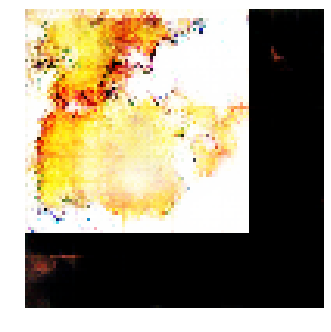


Epoch: 2660, D: -5.833, G: 0.7002
Epoch: 2661, D: -7.593, G: 3.568
Epoch: 2662, D: -6.887, G: 4.949
Epoch: 2663, D: -6.587, G: 4.961
Epoch: 2664, D: -6.076, G: 4.223
Epoch: 2665, D: -7.742, G: 4.012
Epoch: 2666, D: -7.358, G: 1.607
Epoch: 2667, D: -8.119, G: 2.071
Epoch: 2668, D: -7.309, G: 1.603
Epoch: 2669, D: -6.529, G: 1.889
Epoch: 2670, D: -7.552, G: 4.516
Epoch: 2671, D: -7.202, G: 5.436
Epoch: 2672, D: -6.827, G: 5.095
Epoch: 2673, D: -8.323, G: 4.586
Epoch: 2674, D: -7.102, G: 4.417
Epoch: 2675, D: -8.639, G: 6.405
Epoch: 2676, D: -9.736, G: 5.867
Epoch: 2677, D: -8.003, G: 3.257
Epoch: 2678, D: -7.615, G: 3.871
Epoch: 2679, D: -8.604, G: 5.063


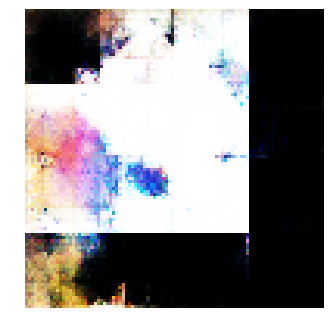


Epoch: 2680, D: -7.933, G: 3.757
Epoch: 2681, D: -6.66, G: 4.669
Epoch: 2682, D: -7.736, G: 1.778
Epoch: 2683, D: -8.068, G: 3.492
Epoch: 2684, D: -7.787, G: 4.889
Epoch: 2685, D: -5.058, G: 3.334
Epoch: 2686, D: -7.215, G: 0.1191
Epoch: 2687, D: -6.432, G: 1.905
Epoch: 2688, D: -9.263, G: 1.988
Epoch: 2689, D: -6.852, G: 5.321
Epoch: 2690, D: -7.357, G: 5.888
Epoch: 2691, D: -7.405, G: 4.554
Epoch: 2692, D: -7.707, G: 2.423
Epoch: 2693, D: -8.583, G: 4.004
Epoch: 2694, D: -6.913, G: 1.625
Epoch: 2695, D: -9.329, G: 5.268
Epoch: 2696, D: -6.923, G: 1.016
Epoch: 2697, D: -8.386, G: 3.636
Epoch: 2698, D: -6.91, G: 3.65
Epoch: 2699, D: -9.27, G: 4.191


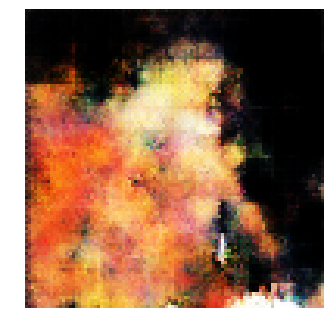


Epoch: 2700, D: -7.971, G: 1.85
Epoch: 2701, D: -8.294, G: 1.943
Epoch: 2702, D: -8.945, G: 1.76
Epoch: 2703, D: -8.993, G: 1.591
Epoch: 2704, D: -8.268, G: 2.888
Epoch: 2705, D: -8.245, G: -0.956
Epoch: 2706, D: -6.65, G: 2.657
Epoch: 2707, D: -8.268, G: 4.969
Epoch: 2708, D: -8.609, G: 3.35
Epoch: 2709, D: -8.023, G: 4.71
Epoch: 2710, D: -8.149, G: 2.375
Epoch: 2711, D: -7.965, G: 4.766
Epoch: 2712, D: -7.492, G: 5.654
Epoch: 2713, D: -8.359, G: 6.002
Epoch: 2714, D: -7.918, G: 3.705
Epoch: 2715, D: -8.513, G: 0.8364
Epoch: 2716, D: -7.747, G: 1.77
Epoch: 2717, D: -6.99, G: 6.792
Epoch: 2718, D: -7.253, G: 1.98
Epoch: 2719, D: -7.771, G: 2.772


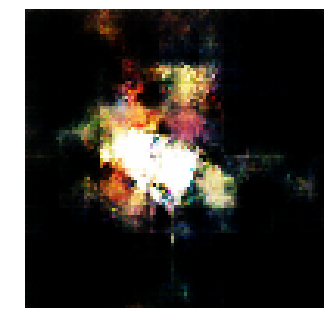


Epoch: 2720, D: -7.014, G: 1.754
Epoch: 2721, D: -7.015, G: 2.713
Epoch: 2722, D: -7.724, G: 2.101
Epoch: 2723, D: -7.613, G: 1.579
Epoch: 2724, D: -8.146, G: 2.441
Epoch: 2725, D: -7.065, G: 3.029
Epoch: 2726, D: -8.258, G: 4.063
Epoch: 2727, D: -7.085, G: 2.154
Epoch: 2728, D: -7.156, G: 4.211
Epoch: 2729, D: -8.846, G: 0.2126
Epoch: 2730, D: -7.875, G: 2.327
Epoch: 2731, D: -7.344, G: 4.127
Epoch: 2732, D: -6.132, G: 3.92
Epoch: 2733, D: -7.953, G: 4.806
Epoch: 2734, D: -8.15, G: 3.448
Epoch: 2735, D: -9.916, G: 1.135
Epoch: 2736, D: -8.676, G: 3.042
Epoch: 2737, D: -8.458, G: 3.087
Epoch: 2738, D: -8.223, G: 0.3023
Epoch: 2739, D: -6.931, G: 2.862


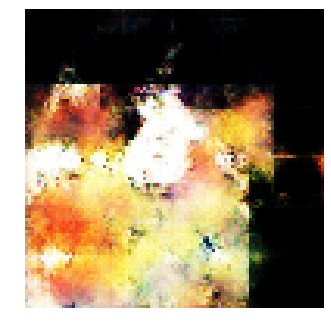


Epoch: 2740, D: -7.112, G: 3.878
Epoch: 2741, D: -9.044, G: 5.347
Epoch: 2742, D: -6.557, G: 2.2
Epoch: 2743, D: -5.811, G: 4.654
Epoch: 2744, D: -6.66, G: 2.933
Epoch: 2745, D: -7.765, G: 2.748
Epoch: 2746, D: -8.585, G: 1.888
Epoch: 2747, D: -8.201, G: 5.329
Epoch: 2748, D: -8.033, G: 3.864
Epoch: 2749, D: -7.168, G: 4.124
Epoch: 2750, D: -6.243, G: 2.439
Epoch: 2751, D: -7.552, G: 3.895
Epoch: 2752, D: -9.917, G: 5.334
Epoch: 2753, D: -5.432, G: 3.851
Epoch: 2754, D: -7.609, G: 2.974
Epoch: 2755, D: -6.787, G: -0.4367
Epoch: 2756, D: -7.053, G: 3.909
Epoch: 2757, D: -6.825, G: 2.841
Epoch: 2758, D: -9.178, G: 7.47
Epoch: 2759, D: -9.472, G: 2.638


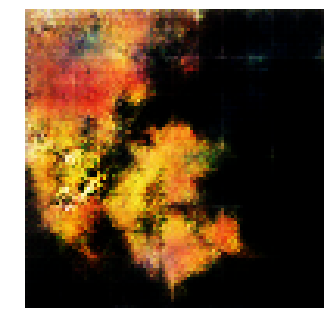


Epoch: 2760, D: -5.317, G: 5.336
Epoch: 2761, D: -6.444, G: 5.303
Epoch: 2762, D: -7.576, G: 3.143
Epoch: 2763, D: -7.229, G: 4.377
Epoch: 2764, D: -7.794, G: 3.329
Epoch: 2765, D: -7.23, G: 2.594
Epoch: 2766, D: -8.866, G: 2.329
Epoch: 2767, D: -7.959, G: 3.588
Epoch: 2768, D: -8.236, G: 3.882
Epoch: 2769, D: -7.386, G: 3.632
Epoch: 2770, D: -6.817, G: 2.619
Epoch: 2771, D: -7.815, G: 5.151
Epoch: 2772, D: -9.574, G: 3.995
Epoch: 2773, D: -8.007, G: 1.994
Epoch: 2774, D: -6.765, G: 2.786
Epoch: 2775, D: -10.02, G: 4.344
Epoch: 2776, D: -6.171, G: -0.9094
Epoch: 2777, D: -8.063, G: 1.863
Epoch: 2778, D: -9.959, G: 2.069
Epoch: 2779, D: -9.542, G: 1.499


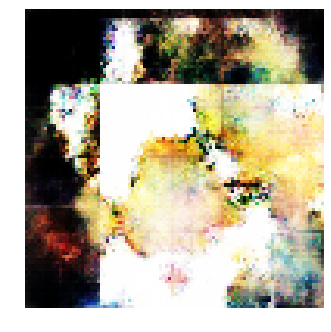


Epoch: 2780, D: -7.593, G: 0.3915
Epoch: 2781, D: -7.305, G: 2.807
Epoch: 2782, D: -6.989, G: 3.552
Epoch: 2783, D: -7.898, G: -0.3985
Epoch: 2784, D: -9.264, G: 3.168
Epoch: 2785, D: -9.42, G: 3.597
Epoch: 2786, D: -6.346, G: 0.9691
Epoch: 2787, D: -7.604, G: 5.268
Epoch: 2788, D: -8.937, G: 3.54
Epoch: 2789, D: -7.352, G: 1.391
Epoch: 2790, D: -6.639, G: 1.487
Epoch: 2791, D: -7.925, G: 3.226
Epoch: 2792, D: -8.77, G: 1.423
Epoch: 2793, D: -7.654, G: 4.747
Epoch: 2794, D: -7.151, G: 3.309
Epoch: 2795, D: -7.722, G: 1.719
Epoch: 2796, D: -7.0, G: 5.586
Epoch: 2797, D: -7.283, G: 5.29
Epoch: 2798, D: -7.544, G: 1.858
Epoch: 2799, D: -6.729, G: 2.142


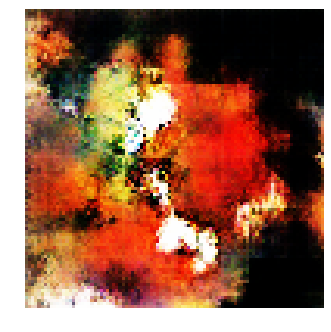


Epoch: 2800, D: -6.03, G: 4.571
Epoch: 2801, D: -8.177, G: 1.943
Epoch: 2802, D: -8.791, G: 4.426
Epoch: 2803, D: -8.019, G: 6.301
Epoch: 2804, D: -7.869, G: 6.359
Epoch: 2805, D: -6.648, G: 3.008
Epoch: 2806, D: -8.153, G: 2.172
Epoch: 2807, D: -6.749, G: 3.693
Epoch: 2808, D: -8.118, G: 2.318
Epoch: 2809, D: -8.278, G: 3.976
Epoch: 2810, D: -8.362, G: 3.71
Epoch: 2811, D: -7.771, G: 1.718
Epoch: 2812, D: -6.973, G: 4.199
Epoch: 2813, D: -9.403, G: 5.706
Epoch: 2814, D: -7.556, G: 3.103
Epoch: 2815, D: -8.304, G: 1.558
Epoch: 2816, D: -9.078, G: 5.663
Epoch: 2817, D: -4.352, G: 3.675
Epoch: 2818, D: -7.256, G: 5.88
Epoch: 2819, D: -7.899, G: 4.133


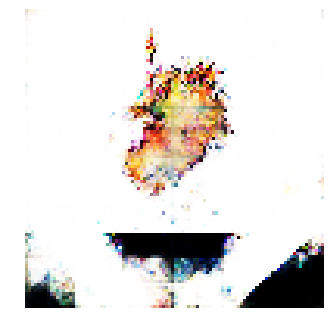


Epoch: 2820, D: -7.062, G: 1.574
Epoch: 2821, D: -6.572, G: 2.326
Epoch: 2822, D: -6.487, G: 3.373
Epoch: 2823, D: -8.14, G: 4.583
Epoch: 2824, D: -7.366, G: 1.066
Epoch: 2825, D: -7.347, G: 2.634
Epoch: 2826, D: -6.632, G: 3.876
Epoch: 2827, D: -7.329, G: 2.535
Epoch: 2828, D: -7.171, G: 2.694
Epoch: 2829, D: -9.898, G: 4.202
Epoch: 2830, D: -8.48, G: 0.1717
Epoch: 2831, D: -5.446, G: 3.09
Epoch: 2832, D: -7.759, G: 5.196
Epoch: 2833, D: -7.222, G: 2.707
Epoch: 2834, D: -6.485, G: 2.278
Epoch: 2835, D: -9.73, G: 3.628
Epoch: 2836, D: -8.445, G: 1.289
Epoch: 2837, D: -8.102, G: 1.229
Epoch: 2838, D: -7.186, G: 2.058
Epoch: 2839, D: -7.91, G: 7.148


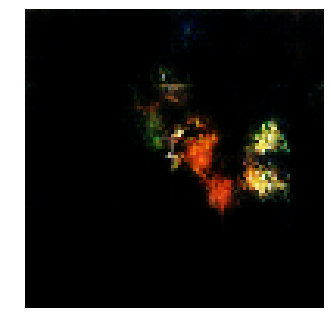


Epoch: 2840, D: -7.311, G: 5.543
Epoch: 2841, D: -8.204, G: 5.106
Epoch: 2842, D: -8.285, G: 4.089
Epoch: 2843, D: -7.066, G: 4.097
Epoch: 2844, D: -6.293, G: 1.502
Epoch: 2845, D: -7.437, G: 2.287
Epoch: 2846, D: -7.778, G: 2.421
Epoch: 2847, D: -5.485, G: 3.824
Epoch: 2848, D: -4.441, G: 6.616
Epoch: 2849, D: -8.562, G: 5.105
Epoch: 2850, D: -9.278, G: 1.087
Epoch: 2851, D: -6.028, G: 2.76
Epoch: 2852, D: -8.535, G: 4.796
Epoch: 2853, D: -9.361, G: 3.184
Epoch: 2854, D: -7.93, G: 2.335
Epoch: 2855, D: -7.543, G: 2.595
Epoch: 2856, D: -6.383, G: 2.794
Epoch: 2857, D: -7.559, G: 6.48
Epoch: 2858, D: -10.16, G: 2.883
Epoch: 2859, D: -8.117, G: 0.9848


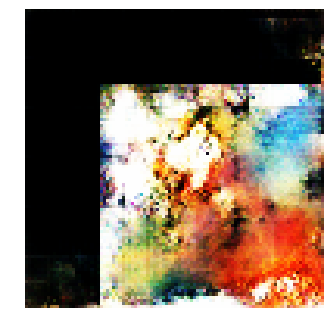


Epoch: 2860, D: -8.24, G: 1.584
Epoch: 2861, D: -9.67, G: 3.51
Epoch: 2862, D: -8.57, G: 2.65
Epoch: 2863, D: -7.274, G: 5.231
Epoch: 2864, D: -7.652, G: 3.647
Epoch: 2865, D: -8.564, G: 2.974
Epoch: 2866, D: -5.387, G: 4.801
Epoch: 2867, D: -7.701, G: 4.673
Epoch: 2868, D: -8.324, G: 5.465
Epoch: 2869, D: -6.293, G: 3.849
Epoch: 2870, D: -7.143, G: 2.805
Epoch: 2871, D: -7.385, G: 3.531
Epoch: 2872, D: -8.376, G: 2.399
Epoch: 2873, D: -10.41, G: 4.058
Epoch: 2874, D: -6.612, G: 1.55
Epoch: 2875, D: -8.341, G: 1.442
Epoch: 2876, D: -7.59, G: 3.463
Epoch: 2877, D: -8.378, G: 2.134
Epoch: 2878, D: -6.248, G: 3.914
Epoch: 2879, D: -8.158, G: 2.817


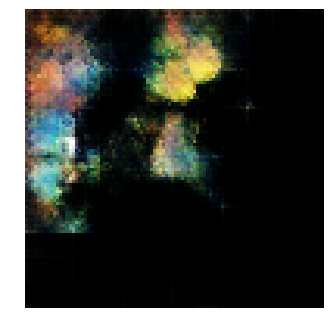


Epoch: 2880, D: -6.641, G: 2.78
Epoch: 2881, D: -6.814, G: 4.557
Epoch: 2882, D: -6.833, G: 1.052
Epoch: 2883, D: -7.776, G: 4.592
Epoch: 2884, D: -9.298, G: 4.902
Epoch: 2885, D: -9.972, G: 3.658
Epoch: 2886, D: -8.401, G: 1.762
Epoch: 2887, D: -6.618, G: 0.5226
Epoch: 2888, D: -9.276, G: 1.725
Epoch: 2889, D: -7.027, G: 2.027
Epoch: 2890, D: -8.111, G: 4.189
Epoch: 2891, D: -6.856, G: 5.848
Epoch: 2892, D: -7.564, G: 5.819
Epoch: 2893, D: -8.854, G: 0.953
Epoch: 2894, D: -7.332, G: 1.164
Epoch: 2895, D: -8.203, G: 2.002
Epoch: 2896, D: -8.663, G: 4.953
Epoch: 2897, D: -7.685, G: 3.891
Epoch: 2898, D: -9.209, G: 3.705
Epoch: 2899, D: -8.107, G: 2.41


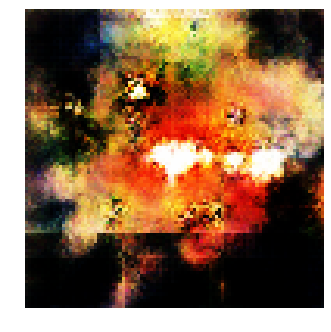


Epoch: 2900, D: -7.843, G: 2.592
Epoch: 2901, D: -7.779, G: 4.651
Epoch: 2902, D: -7.555, G: 4.936
Epoch: 2903, D: -7.808, G: 1.352
Epoch: 2904, D: -9.262, G: 6.11
Epoch: 2905, D: -8.237, G: 1.879
Epoch: 2906, D: -7.216, G: 3.134
Epoch: 2907, D: -8.624, G: 2.389
Epoch: 2908, D: -8.824, G: 5.018
Epoch: 2909, D: -7.741, G: 2.204
Epoch: 2910, D: -7.989, G: 3.769
Epoch: 2911, D: -5.288, G: 1.817
Epoch: 2912, D: -7.223, G: 4.158
Epoch: 2913, D: -8.42, G: 3.023
Epoch: 2914, D: -7.726, G: 1.602
Epoch: 2915, D: -8.591, G: 5.06
Epoch: 2916, D: -8.014, G: 3.017
Epoch: 2917, D: -8.171, G: 4.61
Epoch: 2918, D: -8.443, G: 1.918
Epoch: 2919, D: -8.129, G: 3.02


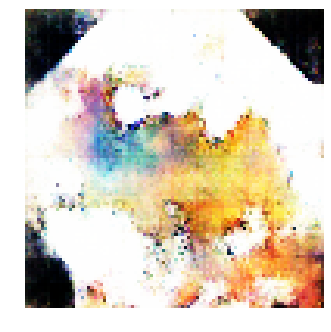


Epoch: 2920, D: -7.394, G: 2.749
Epoch: 2921, D: -7.069, G: 1.825
Epoch: 2922, D: -7.309, G: 4.499
Epoch: 2923, D: -8.271, G: 4.849
Epoch: 2924, D: -8.71, G: 1.088
Epoch: 2925, D: -8.71, G: 3.586
Epoch: 2926, D: -7.114, G: 2.255
Epoch: 2927, D: -9.016, G: 4.258
Epoch: 2928, D: -9.678, G: -0.1409
Epoch: 2929, D: -7.156, G: 6.734
Epoch: 2930, D: -4.622, G: 7.24
Epoch: 2931, D: -8.923, G: 3.693
Epoch: 2932, D: -7.462, G: 2.234
Epoch: 2933, D: -6.909, G: 3.748
Epoch: 2934, D: -7.194, G: 4.062
Epoch: 2935, D: -5.987, G: 3.541
Epoch: 2936, D: -8.003, G: 3.38
Epoch: 2937, D: -8.817, G: 5.211
Epoch: 2938, D: -7.397, G: 2.604
Epoch: 2939, D: -7.634, G: 3.57


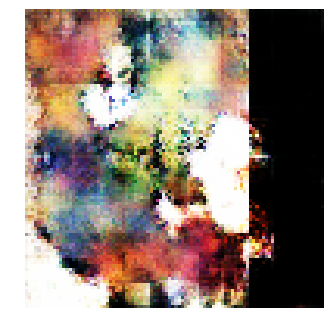


Epoch: 2940, D: -6.64, G: 4.674
Epoch: 2941, D: -8.234, G: 3.154
Epoch: 2942, D: -7.925, G: 1.693
Epoch: 2943, D: -7.127, G: 3.241
Epoch: 2944, D: -6.754, G: 1.215
Epoch: 2945, D: -7.349, G: 5.595
Epoch: 2946, D: -6.289, G: 2.912
Epoch: 2947, D: -6.303, G: 5.41
Epoch: 2948, D: -7.241, G: 4.354
Epoch: 2949, D: -9.648, G: 2.75
Epoch: 2950, D: -7.696, G: 2.933
Epoch: 2951, D: -8.276, G: 2.266
Epoch: 2952, D: -8.309, G: 1.588
Epoch: 2953, D: -8.187, G: 2.427
Epoch: 2954, D: -6.372, G: 1.817
Epoch: 2955, D: -7.698, G: 3.331
Epoch: 2956, D: -6.466, G: 2.974
Epoch: 2957, D: -6.3, G: 3.874
Epoch: 2958, D: -7.765, G: 5.649
Epoch: 2959, D: -9.194, G: 2.512


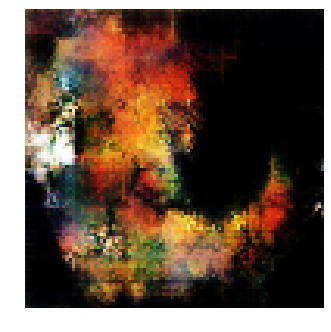


Epoch: 2960, D: -7.419, G: 0.4562
Epoch: 2961, D: -10.85, G: 1.645
Epoch: 2962, D: -8.727, G: 2.368
Epoch: 2963, D: -7.291, G: 5.066
Epoch: 2964, D: -7.486, G: 3.369
Epoch: 2965, D: -7.713, G: 2.861
Epoch: 2966, D: -6.682, G: 4.02
Epoch: 2967, D: -7.881, G: 3.983
Epoch: 2968, D: -5.474, G: 3.938
Epoch: 2969, D: -7.935, G: 1.38
Epoch: 2970, D: -8.053, G: 2.307
Epoch: 2971, D: -6.872, G: 2.333
Epoch: 2972, D: -9.811, G: 3.619
Epoch: 2973, D: -8.495, G: 5.011
Epoch: 2974, D: -7.461, G: 1.949
Epoch: 2975, D: -8.011, G: 4.646
Epoch: 2976, D: -8.097, G: 2.392
Epoch: 2977, D: -7.61, G: 2.935
Epoch: 2978, D: -5.861, G: 4.233
Epoch: 2979, D: -5.979, G: 5.124


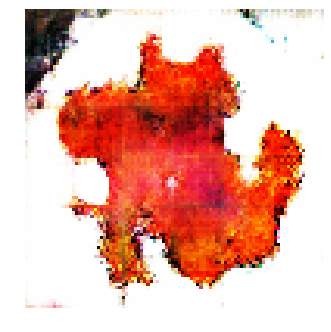


Epoch: 2980, D: -8.044, G: 2.447
Epoch: 2981, D: -9.153, G: 4.277
Epoch: 2982, D: -8.219, G: 1.827
Epoch: 2983, D: -6.507, G: 4.981
Epoch: 2984, D: -7.153, G: 6.995
Epoch: 2985, D: -7.299, G: -0.9662
Epoch: 2986, D: -5.764, G: 1.055
Epoch: 2987, D: -5.524, G: 6.812
Epoch: 2988, D: -7.719, G: 5.64
Epoch: 2989, D: -8.104, G: 7.725
Epoch: 2990, D: -7.071, G: 4.582
Epoch: 2991, D: -9.491, G: 3.665
Epoch: 2992, D: -7.788, G: 4.096
Epoch: 2993, D: -7.784, G: 5.291
Epoch: 2994, D: -7.929, G: 3.268
Epoch: 2995, D: -5.239, G: 5.074
Epoch: 2996, D: -8.194, G: 4.131
Epoch: 2997, D: -7.705, G: 3.633
Epoch: 2998, D: -7.045, G: 4.752
Epoch: 2999, D: -7.583, G: 6.722


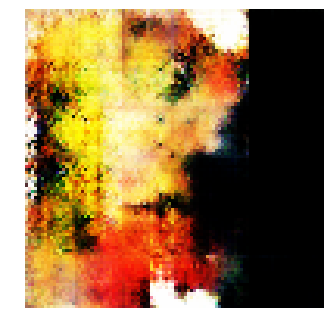


Epoch: 3000, D: -6.879, G: 3.47
Epoch: 3001, D: -8.015, G: 5.601
Epoch: 3002, D: -6.979, G: 3.587
Epoch: 3003, D: -7.681, G: 4.99
Epoch: 3004, D: -7.634, G: 3.779
Epoch: 3005, D: -8.667, G: 5.959
Epoch: 3006, D: -8.292, G: 1.593
Epoch: 3007, D: -6.218, G: 2.5
Epoch: 3008, D: -8.366, G: 4.212
Epoch: 3009, D: -9.17, G: 3.734
Epoch: 3010, D: -7.94, G: 1.999
Epoch: 3011, D: -7.298, G: 2.805
Epoch: 3012, D: -6.816, G: -0.5855
Epoch: 3013, D: -8.568, G: 2.973
Epoch: 3014, D: -7.197, G: 0.9593
Epoch: 3015, D: -7.722, G: 2.918
Epoch: 3016, D: -7.003, G: 3.237
Epoch: 3017, D: -7.514, G: 3.483
Epoch: 3018, D: -8.355, G: -0.7103
Epoch: 3019, D: -7.096, G: 3.017


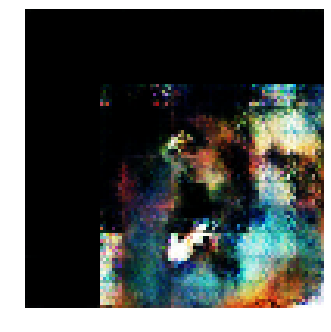


Epoch: 3020, D: -7.918, G: 2.118
Epoch: 3021, D: -7.663, G: 5.779
Epoch: 3022, D: -7.126, G: 4.412
Epoch: 3023, D: -8.115, G: 2.82
Epoch: 3024, D: -7.239, G: 2.334
Epoch: 3025, D: -7.829, G: 4.09
Epoch: 3026, D: -9.641, G: 3.675
Epoch: 3027, D: -7.862, G: 0.7736
Epoch: 3028, D: -7.235, G: 2.69
Epoch: 3029, D: -6.369, G: 3.193
Epoch: 3030, D: -9.085, G: 5.437
Epoch: 3031, D: -7.713, G: 3.43
Epoch: 3032, D: -7.788, G: 2.989
Epoch: 3033, D: -7.683, G: 0.6656
Epoch: 3034, D: -8.194, G: 0.173
Epoch: 3035, D: -6.757, G: 4.64
Epoch: 3036, D: -6.861, G: 4.87
Epoch: 3037, D: -7.045, G: 2.736
Epoch: 3038, D: -7.063, G: 4.543
Epoch: 3039, D: -7.762, G: 2.092


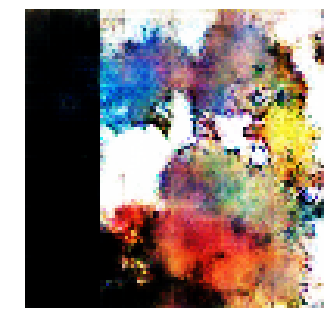


Epoch: 3040, D: -7.862, G: 2.265
Epoch: 3041, D: -7.117, G: 4.93
Epoch: 3042, D: -7.589, G: 3.86
Epoch: 3043, D: -5.976, G: 3.458
Epoch: 3044, D: -9.099, G: 4.345
Epoch: 3045, D: -6.737, G: 3.577
Epoch: 3046, D: -7.647, G: 2.516
Epoch: 3047, D: -7.604, G: 1.173
Epoch: 3048, D: -7.568, G: 4.904
Epoch: 3049, D: -5.829, G: 5.53
Epoch: 3050, D: -6.48, G: 2.499
Epoch: 3051, D: -6.612, G: 3.616
Epoch: 3052, D: -7.113, G: 2.136
Epoch: 3053, D: -7.693, G: 2.948
Epoch: 3054, D: -7.782, G: 1.465
Epoch: 3055, D: -7.558, G: 5.081
Epoch: 3056, D: -7.04, G: 2.775
Epoch: 3057, D: -7.891, G: 4.723
Epoch: 3058, D: -7.439, G: 3.401
Epoch: 3059, D: -8.237, G: 4.063


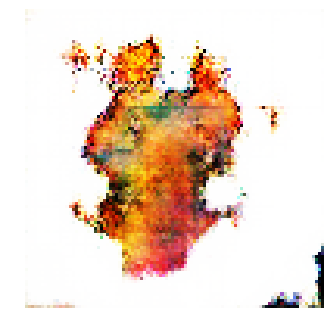


Epoch: 3060, D: -8.712, G: 5.881
Epoch: 3061, D: -7.623, G: -0.2904
Epoch: 3062, D: -9.21, G: 1.218
Epoch: 3063, D: -8.654, G: 3.233
Epoch: 3064, D: -7.164, G: 4.348
Epoch: 3065, D: -7.447, G: 2.078
Epoch: 3066, D: -7.0, G: 3.874
Epoch: 3067, D: -6.941, G: 1.988
Epoch: 3068, D: -7.316, G: 2.616
Epoch: 3069, D: -8.145, G: 1.94
Epoch: 3070, D: -8.672, G: 1.394
Epoch: 3071, D: -6.49, G: 1.388
Epoch: 3072, D: -6.07, G: 2.279
Epoch: 3073, D: -7.11, G: 4.418
Epoch: 3074, D: -7.351, G: 5.703
Epoch: 3075, D: -9.267, G: 4.164
Epoch: 3076, D: -9.01, G: 5.286
Epoch: 3077, D: -6.988, G: -0.3714
Epoch: 3078, D: -6.568, G: 5.149
Epoch: 3079, D: -5.912, G: 6.254


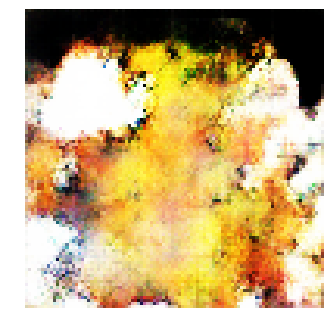


Epoch: 3080, D: -9.358, G: 2.921
Epoch: 3081, D: -7.938, G: 4.832
Epoch: 3082, D: -7.499, G: 3.35
Epoch: 3083, D: -7.059, G: 2.943
Epoch: 3084, D: -9.077, G: 4.236
Epoch: 3085, D: -7.505, G: -0.6844
Epoch: 3086, D: -6.571, G: 1.86
Epoch: 3087, D: -7.891, G: 1.474
Epoch: 3088, D: -7.076, G: 4.511
Epoch: 3089, D: -7.365, G: 3.283
Epoch: 3090, D: -6.786, G: 3.028
Epoch: 3091, D: -7.338, G: 4.027
Epoch: 3092, D: -6.757, G: 3.77
Epoch: 3093, D: -6.442, G: 1.715
Epoch: 3094, D: -6.959, G: 3.077
Epoch: 3095, D: -7.837, G: 6.715
Epoch: 3096, D: -7.171, G: 1.407
Epoch: 3097, D: -6.428, G: 4.65
Epoch: 3098, D: -7.606, G: 2.813
Epoch: 3099, D: -6.531, G: 3.48


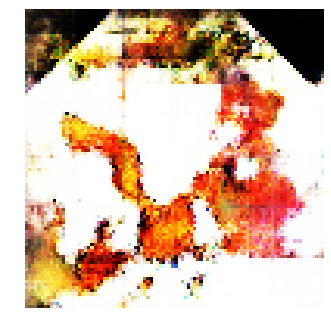


Epoch: 3100, D: -7.541, G: 3.904
Epoch: 3101, D: -8.315, G: -0.3598
Epoch: 3102, D: -9.072, G: 2.58
Epoch: 3103, D: -8.915, G: 1.85
Epoch: 3104, D: -7.309, G: 4.331
Epoch: 3105, D: -8.69, G: 2.432
Epoch: 3106, D: -7.736, G: 2.636
Epoch: 3107, D: -8.693, G: 3.63
Epoch: 3108, D: -6.96, G: 5.98
Epoch: 3109, D: -8.324, G: 3.913
Epoch: 3110, D: -6.234, G: 3.487
Epoch: 3111, D: -8.343, G: 2.81
Epoch: 3112, D: -8.993, G: 3.281
Epoch: 3113, D: -6.921, G: 5.009
Epoch: 3114, D: -7.831, G: 6.215
Epoch: 3115, D: -6.125, G: 6.258
Epoch: 3116, D: -6.835, G: 4.253
Epoch: 3117, D: -8.688, G: 2.859
Epoch: 3118, D: -8.88, G: 2.078
Epoch: 3119, D: -7.041, G: 2.909


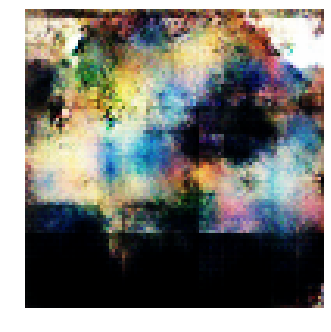


Epoch: 3120, D: -9.678, G: 3.651
Epoch: 3121, D: -6.758, G: 2.194
Epoch: 3122, D: -7.361, G: 5.236
Epoch: 3123, D: -9.157, G: 4.181
Epoch: 3124, D: -9.148, G: 0.1631
Epoch: 3125, D: -7.798, G: 3.537
Epoch: 3126, D: -6.684, G: 3.527
Epoch: 3127, D: -6.271, G: 5.998
Epoch: 3128, D: -6.569, G: 4.002
Epoch: 3129, D: -7.495, G: 7.634
Epoch: 3130, D: -7.685, G: 6.67
Epoch: 3131, D: -8.859, G: 3.096
Epoch: 3132, D: -6.301, G: 1.273
Epoch: 3133, D: -7.141, G: 2.102
Epoch: 3134, D: -7.344, G: 3.105
Epoch: 3135, D: -6.868, G: 9.09
Epoch: 3136, D: -8.139, G: 4.067
Epoch: 3137, D: -7.14, G: 4.605
Epoch: 3138, D: -6.85, G: 0.3478
Epoch: 3139, D: -6.872, G: 3.346


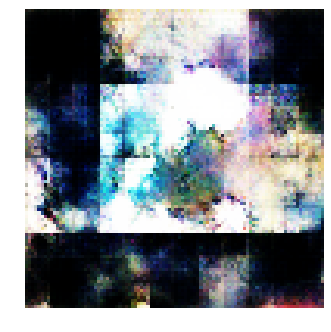


Epoch: 3140, D: -7.791, G: 4.979
Epoch: 3141, D: -7.28, G: 2.4
Epoch: 3142, D: -6.523, G: 2.846
Epoch: 3143, D: -8.612, G: 4.486
Epoch: 3144, D: -7.499, G: 2.361
Epoch: 3145, D: -6.641, G: 2.076
Epoch: 3146, D: -8.635, G: 2.896
Epoch: 3147, D: -8.875, G: 3.396
Epoch: 3148, D: -9.133, G: 3.697
Epoch: 3149, D: -7.945, G: 4.957
Epoch: 3150, D: -7.953, G: 6.088
Epoch: 3151, D: -7.806, G: 3.953
Epoch: 3152, D: -7.792, G: 3.318
Epoch: 3153, D: -6.454, G: 5.216
Epoch: 3154, D: -8.381, G: 5.928
Epoch: 3155, D: -7.901, G: 1.947
Epoch: 3156, D: -7.342, G: 1.841
Epoch: 3157, D: -8.403, G: 1.646
Epoch: 3158, D: -7.045, G: 1.174
Epoch: 3159, D: -8.355, G: 2.687


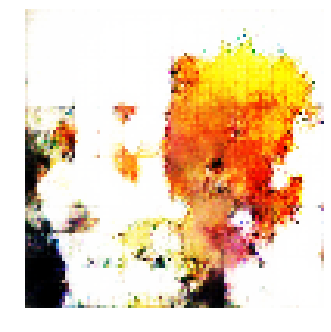


Epoch: 3160, D: -9.061, G: 0.7086
Epoch: 3161, D: -5.568, G: 2.927
Epoch: 3162, D: -7.439, G: 4.778
Epoch: 3163, D: -7.766, G: 4.741
Epoch: 3164, D: -8.372, G: 3.316
Epoch: 3165, D: -8.316, G: 2.316
Epoch: 3166, D: -8.054, G: 2.975
Epoch: 3167, D: -8.571, G: 2.431
Epoch: 3168, D: -9.415, G: 1.839
Epoch: 3169, D: -7.361, G: 1.905
Epoch: 3170, D: -7.523, G: 2.984
Epoch: 3171, D: -7.71, G: 2.923
Epoch: 3172, D: -6.377, G: 2.285
Epoch: 3173, D: -9.551, G: 5.794
Epoch: 3174, D: -7.644, G: 6.455
Epoch: 3175, D: -8.338, G: 5.462
Epoch: 3176, D: -8.832, G: 0.3677
Epoch: 3177, D: -6.993, G: 1.784
Epoch: 3178, D: -7.091, G: 3.886
Epoch: 3179, D: -9.45, G: 4.342


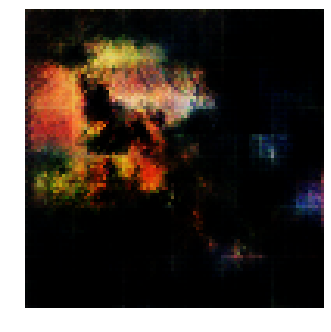


Epoch: 3180, D: -7.04, G: 2.672
Epoch: 3181, D: -6.546, G: 3.678
Epoch: 3182, D: -6.165, G: 3.336
Epoch: 3183, D: -7.452, G: 3.041
Epoch: 3184, D: -8.015, G: 3.917
Epoch: 3185, D: -6.199, G: 0.7219
Epoch: 3186, D: -9.373, G: 4.413
Epoch: 3187, D: -7.881, G: 2.566
Epoch: 3188, D: -7.363, G: 3.259
Epoch: 3189, D: -7.253, G: 5.65
Epoch: 3190, D: -5.409, G: 3.632
Epoch: 3191, D: -7.224, G: 2.773
Epoch: 3192, D: -5.792, G: 3.714
Epoch: 3193, D: -8.48, G: 6.934
Epoch: 3194, D: -6.244, G: 1.741
Epoch: 3195, D: -9.068, G: 3.941
Epoch: 3196, D: -8.336, G: 2.822
Epoch: 3197, D: -10.03, G: 4.11
Epoch: 3198, D: -9.82, G: 5.978
Epoch: 3199, D: -7.389, G: 0.8172


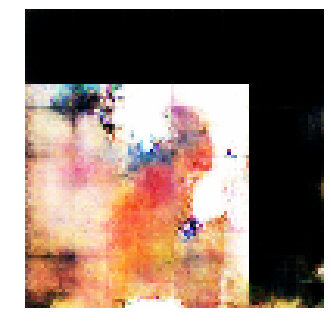


Epoch: 3200, D: -6.277, G: 0.7328
Epoch: 3201, D: -8.838, G: 5.898
Epoch: 3202, D: -7.252, G: 3.056
Epoch: 3203, D: -6.249, G: 1.185
Epoch: 3204, D: -7.487, G: 3.962
Epoch: 3205, D: -5.898, G: 2.797
Epoch: 3206, D: -8.637, G: 7.24
Epoch: 3207, D: -7.153, G: 1.969
Epoch: 3208, D: -6.793, G: 3.132
Epoch: 3209, D: -8.143, G: 1.252
Epoch: 3210, D: -8.05, G: 5.713
Epoch: 3211, D: -5.728, G: 2.889
Epoch: 3212, D: -7.313, G: 4.879
Epoch: 3213, D: -7.331, G: 2.442
Epoch: 3214, D: -7.305, G: 2.273
Epoch: 3215, D: -7.674, G: 5.357
Epoch: 3216, D: -7.19, G: 4.913
Epoch: 3217, D: -7.728, G: 2.511
Epoch: 3218, D: -8.67, G: 1.797
Epoch: 3219, D: -8.782, G: 2.598


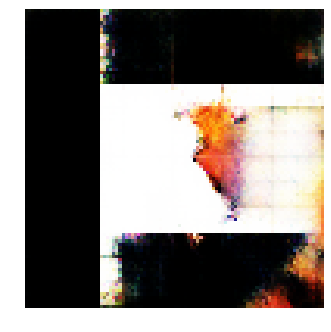


Epoch: 3220, D: -7.841, G: 1.919
Epoch: 3221, D: -6.994, G: 2.189
Epoch: 3222, D: -6.919, G: 6.183
Epoch: 3223, D: -6.716, G: 5.228
Epoch: 3224, D: -7.946, G: 2.435
Epoch: 3225, D: -7.521, G: 0.05188
Epoch: 3226, D: -7.147, G: 4.117
Epoch: 3227, D: -6.57, G: 1.825
Epoch: 3228, D: -7.675, G: 4.724
Epoch: 3229, D: -5.895, G: 6.322
Epoch: 3230, D: -8.223, G: 3.017
Epoch: 3231, D: -5.506, G: 6.487
Epoch: 3232, D: -7.703, G: 2.558
Epoch: 3233, D: -9.569, G: 5.256
Epoch: 3234, D: -7.441, G: 4.212
Epoch: 3235, D: -8.101, G: 5.337
Epoch: 3236, D: -6.613, G: 1.623
Epoch: 3237, D: -7.469, G: 3.062
Epoch: 3238, D: -7.061, G: 3.779
Epoch: 3239, D: -7.108, G: 2.33


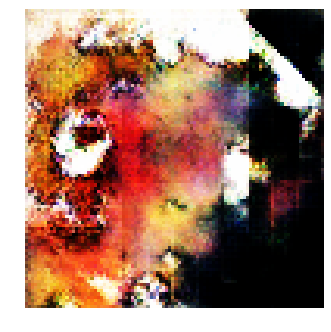


Epoch: 3240, D: -5.793, G: 4.221
Epoch: 3241, D: -4.808, G: 4.775
Epoch: 3242, D: -9.117, G: 4.149
Epoch: 3243, D: -8.036, G: 2.696
Epoch: 3244, D: -6.113, G: 2.853
Epoch: 3245, D: -6.396, G: 4.26
Epoch: 3246, D: -5.321, G: 0.8093
Epoch: 3247, D: -6.957, G: 3.955
Epoch: 3248, D: -8.492, G: 6.144
Epoch: 3249, D: -6.052, G: 2.627
Epoch: 3250, D: -8.182, G: 4.467
Epoch: 3251, D: -6.73, G: 4.142
Epoch: 3252, D: -6.206, G: 3.104
Epoch: 3253, D: -7.387, G: 3.53
Epoch: 3254, D: -6.441, G: 5.417
Epoch: 3255, D: -6.781, G: 4.739
Epoch: 3256, D: -7.672, G: 5.665
Epoch: 3257, D: -7.926, G: 4.164
Epoch: 3258, D: -7.378, G: 3.963
Epoch: 3259, D: -8.14, G: 5.805


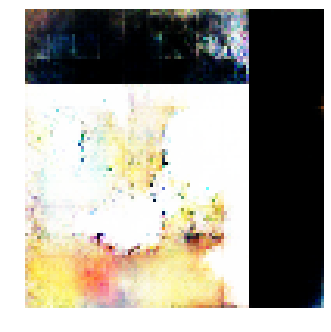


Epoch: 3260, D: -6.786, G: 4.203
Epoch: 3261, D: -8.098, G: 4.733
Epoch: 3262, D: -7.092, G: 1.764
Epoch: 3263, D: -6.924, G: 3.51
Epoch: 3264, D: -6.236, G: 6.462
Epoch: 3265, D: -8.195, G: 3.609
Epoch: 3266, D: -6.857, G: 2.245
Epoch: 3267, D: -8.005, G: 2.336
Epoch: 3268, D: -7.222, G: 2.045
Epoch: 3269, D: -6.89, G: 3.701
Epoch: 3270, D: -8.156, G: 1.087
Epoch: 3271, D: -7.13, G: 4.712
Epoch: 3272, D: -6.966, G: 2.902
Epoch: 3273, D: -7.337, G: 4.496
Epoch: 3274, D: -7.383, G: 2.036
Epoch: 3275, D: -8.224, G: 5.255
Epoch: 3276, D: -7.737, G: 2.765
Epoch: 3277, D: -7.202, G: 2.543
Epoch: 3278, D: -6.374, G: 4.291
Epoch: 3279, D: -8.028, G: 4.959


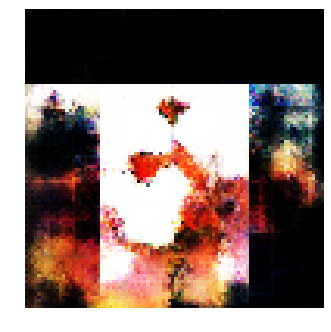


Epoch: 3280, D: -6.669, G: 0.3609
Epoch: 3281, D: -9.825, G: 3.087
Epoch: 3282, D: -7.609, G: 1.713
Epoch: 3283, D: -8.165, G: 2.463
Epoch: 3284, D: -8.278, G: 6.393
Epoch: 3285, D: -7.766, G: 2.268
Epoch: 3286, D: -8.106, G: 4.231
Epoch: 3287, D: -7.565, G: 5.523
Epoch: 3288, D: -8.879, G: 4.335
Epoch: 3289, D: -6.564, G: 1.38
Epoch: 3290, D: -8.655, G: 3.155
Epoch: 3291, D: -8.956, G: 3.719
Epoch: 3292, D: -6.363, G: 2.073
Epoch: 3293, D: -7.911, G: 5.053
Epoch: 3294, D: -7.305, G: 4.537
Epoch: 3295, D: -7.159, G: 5.171
Epoch: 3296, D: -7.585, G: 4.597
Epoch: 3297, D: -7.531, G: 4.034
Epoch: 3298, D: -7.8, G: 5.405
Epoch: 3299, D: -8.301, G: 1.825


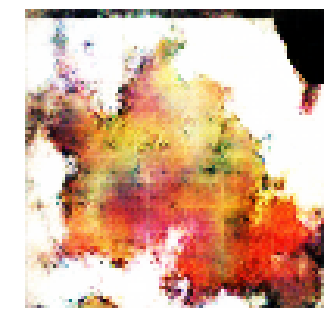


Epoch: 3300, D: -7.69, G: 8.456
Epoch: 3301, D: -6.019, G: 3.216
Epoch: 3302, D: -9.003, G: 5.754
Epoch: 3303, D: -7.235, G: 1.221
Epoch: 3304, D: -7.695, G: 5.468
Epoch: 3305, D: -7.809, G: 3.596
Epoch: 3306, D: -8.041, G: 3.743
Epoch: 3307, D: -8.04, G: 3.459
Epoch: 3308, D: -6.421, G: 5.134
Epoch: 3309, D: -8.162, G: 3.915
Epoch: 3310, D: -8.836, G: 4.58
Epoch: 3311, D: -7.343, G: 1.886
Epoch: 3312, D: -7.17, G: 5.355
Epoch: 3313, D: -7.932, G: 2.268
Epoch: 3314, D: -7.282, G: 0.1767
Epoch: 3315, D: -6.97, G: 5.956
Epoch: 3316, D: -8.091, G: 2.556
Epoch: 3317, D: -6.856, G: 2.454
Epoch: 3318, D: -8.158, G: 4.32
Epoch: 3319, D: -7.181, G: 1.557


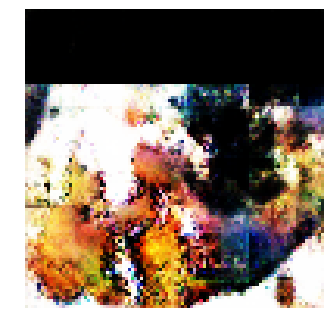


Epoch: 3320, D: -7.237, G: 0.0471
Epoch: 3321, D: -7.26, G: 4.935
Epoch: 3322, D: -8.162, G: 4.337
Epoch: 3323, D: -6.375, G: 2.017
Epoch: 3324, D: -9.708, G: 4.23
Epoch: 3325, D: -7.743, G: 1.59
Epoch: 3326, D: -7.736, G: 4.287
Epoch: 3327, D: -9.945, G: 2.312
Epoch: 3328, D: -8.175, G: 2.581
Epoch: 3329, D: -7.064, G: 2.668
Epoch: 3330, D: -7.092, G: 2.564
Epoch: 3331, D: -6.417, G: 0.5032
Epoch: 3332, D: -8.057, G: 6.469
Epoch: 3333, D: -5.004, G: 3.428
Epoch: 3334, D: -6.655, G: 6.834
Epoch: 3335, D: -7.579, G: 3.456
Epoch: 3336, D: -6.827, G: 3.373
Epoch: 3337, D: -5.942, G: 3.442
Epoch: 3338, D: -8.003, G: 4.115
Epoch: 3339, D: -8.1, G: 6.889


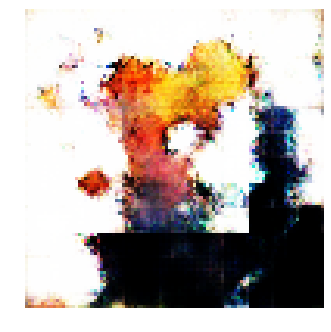


Epoch: 3340, D: -7.129, G: 2.849
Epoch: 3341, D: -7.625, G: 2.426
Epoch: 3342, D: -6.967, G: 3.624
Epoch: 3343, D: -7.642, G: 4.533
Epoch: 3344, D: -9.282, G: 4.791
Epoch: 3345, D: -8.495, G: 1.939
Epoch: 3346, D: -7.113, G: 4.0
Epoch: 3347, D: -8.031, G: 3.974
Epoch: 3348, D: -8.272, G: 4.449
Epoch: 3349, D: -8.369, G: -1.099
Epoch: 3350, D: -7.814, G: 2.163
Epoch: 3351, D: -7.522, G: 3.584
Epoch: 3352, D: -7.194, G: 2.376
Epoch: 3353, D: -6.793, G: 1.793
Epoch: 3354, D: -6.953, G: 2.356
Epoch: 3355, D: -8.372, G: 3.152
Epoch: 3356, D: -7.896, G: 1.651
Epoch: 3357, D: -7.418, G: 4.328
Epoch: 3358, D: -7.18, G: 2.491
Epoch: 3359, D: -7.651, G: 7.157


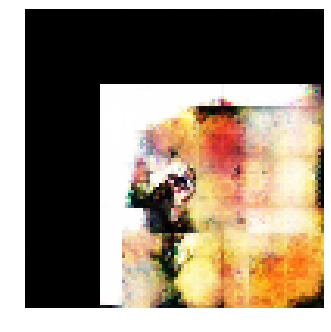


Epoch: 3360, D: -7.438, G: 5.985
Epoch: 3361, D: -7.515, G: 3.708
Epoch: 3362, D: -9.161, G: 1.726
Epoch: 3363, D: -7.273, G: 2.967
Epoch: 3364, D: -8.184, G: 4.641
Epoch: 3365, D: -8.864, G: 5.016
Epoch: 3366, D: -7.589, G: 1.443
Epoch: 3367, D: -6.803, G: 2.529
Epoch: 3368, D: -7.241, G: 2.487
Epoch: 3369, D: -6.592, G: 1.457
Epoch: 3370, D: -8.833, G: 3.696
Epoch: 3371, D: -6.185, G: 2.498
Epoch: 3372, D: -6.781, G: 4.164
Epoch: 3373, D: -7.287, G: 4.685
Epoch: 3374, D: -7.81, G: 4.51
Epoch: 3375, D: -6.1, G: 2.559
Epoch: 3376, D: -7.698, G: 9.958
Epoch: 3377, D: -7.895, G: 0.4427
Epoch: 3378, D: -7.22, G: 4.989
Epoch: 3379, D: -7.471, G: 1.748


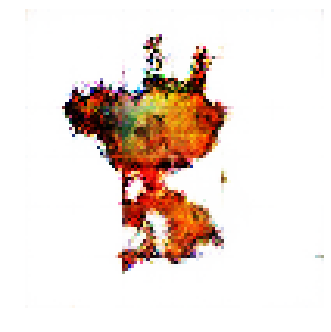


Epoch: 3380, D: -8.201, G: 4.422
Epoch: 3381, D: -7.371, G: 5.855
Epoch: 3382, D: -7.33, G: 4.643
Epoch: 3383, D: -9.106, G: 1.632
Epoch: 3384, D: -5.604, G: 1.626
Epoch: 3385, D: -8.028, G: 1.339
Epoch: 3386, D: -8.057, G: 7.132
Epoch: 3387, D: -7.869, G: 3.624
Epoch: 3388, D: -6.729, G: 5.14
Epoch: 3389, D: -6.869, G: 3.075
Epoch: 3390, D: -8.691, G: 3.249
Epoch: 3391, D: -7.715, G: 6.518
Epoch: 3392, D: -8.69, G: 3.137
Epoch: 3393, D: -7.812, G: 3.815
Epoch: 3394, D: -7.007, G: 1.954
Epoch: 3395, D: -7.676, G: 0.1045
Epoch: 3396, D: -8.89, G: 1.724
Epoch: 3397, D: -5.884, G: 3.189
Epoch: 3398, D: -6.627, G: 6.822
Epoch: 3399, D: -8.359, G: 5.125


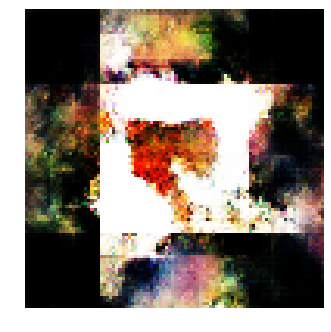


Epoch: 3400, D: -7.542, G: 3.437
Epoch: 3401, D: -6.718, G: 1.935
Epoch: 3402, D: -8.253, G: 2.488
Epoch: 3403, D: -7.937, G: 1.164
Epoch: 3404, D: -8.668, G: 2.904
Epoch: 3405, D: -7.743, G: 4.438
Epoch: 3406, D: -7.544, G: 3.677
Epoch: 3407, D: -8.512, G: 3.019
Epoch: 3408, D: -7.926, G: -0.2314
Epoch: 3409, D: -6.888, G: 5.085
Epoch: 3410, D: -6.938, G: 6.229
Epoch: 3411, D: -7.618, G: 2.739
Epoch: 3412, D: -7.805, G: 3.7
Epoch: 3413, D: -9.122, G: 5.079
Epoch: 3414, D: -8.048, G: 0.9276
Epoch: 3415, D: -7.728, G: 2.168
Epoch: 3416, D: -10.79, G: 3.02
Epoch: 3417, D: -4.857, G: 0.6259
Epoch: 3418, D: -7.874, G: 6.214
Epoch: 3419, D: -7.229, G: 3.949


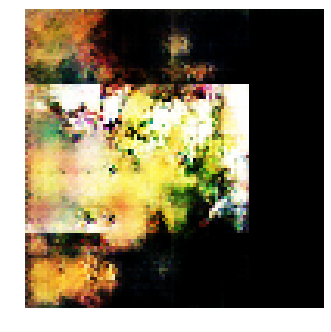


Epoch: 3420, D: -5.471, G: 5.191
Epoch: 3421, D: -9.82, G: 4.911
Epoch: 3422, D: -8.234, G: 1.009
Epoch: 3423, D: -6.815, G: 1.848
Epoch: 3424, D: -8.159, G: 2.529
Epoch: 3425, D: -5.061, G: 5.061
Epoch: 3426, D: -6.164, G: 5.767
Epoch: 3427, D: -8.232, G: 3.262
Epoch: 3428, D: -6.264, G: 4.925
Epoch: 3429, D: -6.774, G: 5.258
Epoch: 3430, D: -6.246, G: 1.658
Epoch: 3431, D: -7.336, G: 5.482
Epoch: 3432, D: -5.067, G: 3.484
Epoch: 3433, D: -8.991, G: 1.633
Epoch: 3434, D: -7.685, G: 1.499
Epoch: 3435, D: -8.127, G: 2.503
Epoch: 3436, D: -5.157, G: 2.31
Epoch: 3437, D: -5.478, G: 2.966
Epoch: 3438, D: -8.802, G: 3.215
Epoch: 3439, D: -6.964, G: 0.7415


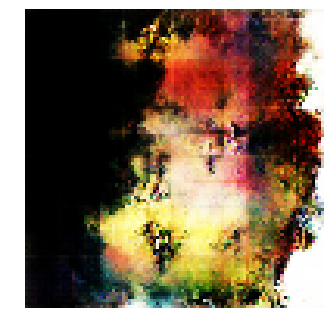


Epoch: 3440, D: -7.478, G: 3.225
Epoch: 3441, D: -6.287, G: 5.77
Epoch: 3442, D: -5.572, G: 4.891
Epoch: 3443, D: -8.169, G: 5.432
Epoch: 3444, D: -6.891, G: 5.908
Epoch: 3445, D: -7.915, G: 2.591
Epoch: 3446, D: -7.859, G: 2.73
Epoch: 3447, D: -7.13, G: 4.321
Epoch: 3448, D: -7.33, G: 4.925
Epoch: 3449, D: -6.478, G: 3.272
Epoch: 3450, D: -5.925, G: 1.429
Epoch: 3451, D: -8.136, G: 3.579
Epoch: 3452, D: -6.636, G: 3.339
Epoch: 3453, D: -8.466, G: 5.116
Epoch: 3454, D: -6.842, G: 2.726
Epoch: 3455, D: -9.467, G: 6.047
Epoch: 3456, D: -8.141, G: 0.4076
Epoch: 3457, D: -6.951, G: 4.519
Epoch: 3458, D: -7.802, G: 4.741
Epoch: 3459, D: -8.345, G: 4.545


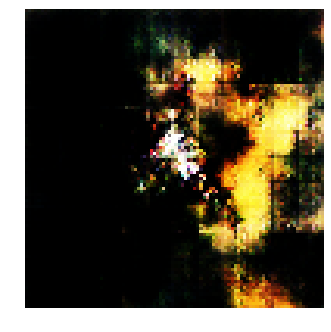


Epoch: 3460, D: -9.002, G: 3.44
Epoch: 3461, D: -9.017, G: 2.925
Epoch: 3462, D: -5.521, G: 2.595
Epoch: 3463, D: -6.28, G: 6.493
Epoch: 3464, D: -8.653, G: 4.684
Epoch: 3465, D: -8.634, G: 3.055
Epoch: 3466, D: -7.962, G: 4.482
Epoch: 3467, D: -8.676, G: 3.112
Epoch: 3468, D: -8.87, G: 4.166
Epoch: 3469, D: -7.8, G: 3.734
Epoch: 3470, D: -6.278, G: 6.377
Epoch: 3471, D: -8.953, G: 0.6984
Epoch: 3472, D: -7.08, G: 2.069
Epoch: 3473, D: -8.154, G: 7.104
Epoch: 3474, D: -7.425, G: 4.791
Epoch: 3475, D: -7.212, G: 2.3
Epoch: 3476, D: -9.576, G: 1.474
Epoch: 3477, D: -8.73, G: 3.006
Epoch: 3478, D: -6.195, G: 1.932
Epoch: 3479, D: -7.422, G: 5.047


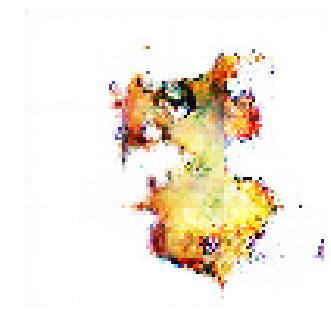


Epoch: 3480, D: -8.61, G: 4.752
Epoch: 3481, D: -6.056, G: 3.25
Epoch: 3482, D: -8.338, G: 5.345
Epoch: 3483, D: -7.874, G: 2.649
Epoch: 3484, D: -8.807, G: 4.193
Epoch: 3485, D: -7.652, G: 2.18
Epoch: 3486, D: -7.476, G: 2.717
Epoch: 3487, D: -7.059, G: 4.13
Epoch: 3488, D: -6.531, G: 1.428
Epoch: 3489, D: -6.925, G: 3.533
Epoch: 3490, D: -8.213, G: 2.861
Epoch: 3491, D: -7.439, G: 2.932
Epoch: 3492, D: -7.826, G: 2.422
Epoch: 3493, D: -7.07, G: 4.654
Epoch: 3494, D: -7.975, G: 4.183
Epoch: 3495, D: -8.813, G: 0.6081
Epoch: 3496, D: -7.653, G: 3.788
Epoch: 3497, D: -9.282, G: 4.342
Epoch: 3498, D: -6.154, G: 3.164
Epoch: 3499, D: -6.787, G: 4.401


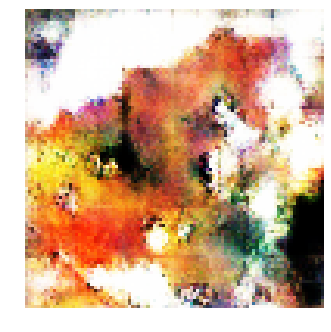


Epoch: 3500, D: -7.173, G: 7.29
Epoch: 3501, D: -8.649, G: 3.061
Epoch: 3502, D: -7.485, G: 1.049
Epoch: 3503, D: -6.411, G: 4.802
Epoch: 3504, D: -6.064, G: 1.925
Epoch: 3505, D: -7.565, G: 4.851
Epoch: 3506, D: -7.409, G: 2.652
Epoch: 3507, D: -7.726, G: 4.722
Epoch: 3508, D: -7.308, G: 7.234
Epoch: 3509, D: -8.339, G: 4.701
Epoch: 3510, D: -8.344, G: 3.811
Epoch: 3511, D: -7.042, G: 2.495
Epoch: 3512, D: -7.946, G: 6.375
Epoch: 3513, D: -7.783, G: 3.032
Epoch: 3514, D: -10.31, G: 2.841
Epoch: 3515, D: -6.052, G: 2.419
Epoch: 3516, D: -6.837, G: 3.823
Epoch: 3517, D: -7.553, G: 4.965
Epoch: 3518, D: -6.337, G: 3.571
Epoch: 3519, D: -8.383, G: 2.561


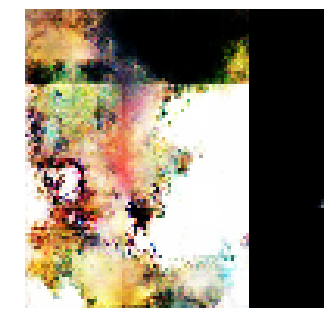


Epoch: 3520, D: -7.779, G: 6.121
Epoch: 3521, D: -7.411, G: 5.326
Epoch: 3522, D: -7.964, G: 7.387
Epoch: 3523, D: -9.605, G: 2.026
Epoch: 3524, D: -7.663, G: 2.168
Epoch: 3525, D: -6.965, G: 5.931
Epoch: 3526, D: -7.614, G: 5.614
Epoch: 3527, D: -8.611, G: 6.247
Epoch: 3528, D: -6.616, G: 3.4
Epoch: 3529, D: -5.74, G: 1.376
Epoch: 3530, D: -8.969, G: 3.668
Epoch: 3531, D: -7.696, G: 4.621
Epoch: 3532, D: -7.358, G: 4.162
Epoch: 3533, D: -8.688, G: 3.99
Epoch: 3534, D: -7.024, G: 2.5
Epoch: 3535, D: -7.93, G: 2.915
Epoch: 3536, D: -7.218, G: 1.338
Epoch: 3537, D: -8.836, G: 4.612
Epoch: 3538, D: -8.596, G: 3.156
Epoch: 3539, D: -6.834, G: 2.619


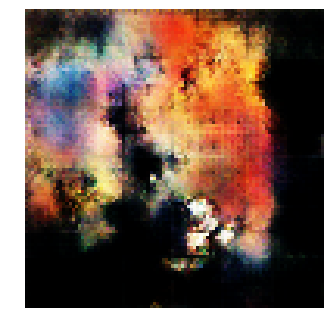


Epoch: 3540, D: -7.608, G: 6.228
Epoch: 3541, D: -8.62, G: 5.007
Epoch: 3542, D: -8.705, G: 4.622
Epoch: 3543, D: -8.596, G: 5.193
Epoch: 3544, D: -5.861, G: 3.525
Epoch: 3545, D: -7.972, G: 3.956
Epoch: 3546, D: -7.165, G: 3.085
Epoch: 3547, D: -7.616, G: 6.56
Epoch: 3548, D: -8.601, G: 3.363
Epoch: 3549, D: -5.595, G: 2.52
Epoch: 3550, D: -8.94, G: 6.127
Epoch: 3551, D: -8.559, G: 4.208
Epoch: 3552, D: -7.049, G: 2.756
Epoch: 3553, D: -7.581, G: 3.321
Epoch: 3554, D: -8.92, G: 6.411
Epoch: 3555, D: -8.513, G: 1.944
Epoch: 3556, D: -7.75, G: 2.128
Epoch: 3557, D: -6.69, G: 0.7955
Epoch: 3558, D: -8.353, G: 4.404
Epoch: 3559, D: -7.487, G: 4.643


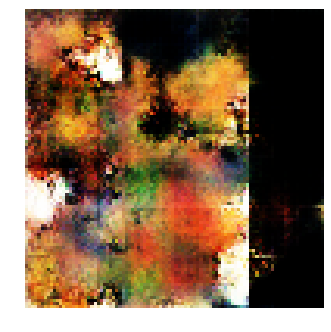


Epoch: 3560, D: -7.094, G: 2.346
Epoch: 3561, D: -7.289, G: 4.128
Epoch: 3562, D: -7.481, G: 3.211
Epoch: 3563, D: -7.394, G: 1.173
Epoch: 3564, D: -7.68, G: 3.444
Epoch: 3565, D: -8.221, G: 2.284
Epoch: 3566, D: -10.33, G: 4.573
Epoch: 3567, D: -6.497, G: 5.719
Epoch: 3568, D: -8.793, G: 3.825
Epoch: 3569, D: -7.705, G: 3.815
Epoch: 3570, D: -8.262, G: 4.52
Epoch: 3571, D: -7.732, G: 1.033
Epoch: 3572, D: -7.43, G: 3.232
Epoch: 3573, D: -7.878, G: 1.886
Epoch: 3574, D: -7.804, G: 2.129
Epoch: 3575, D: -7.965, G: 2.637
Epoch: 3576, D: -6.694, G: 4.856
Epoch: 3577, D: -7.938, G: 4.508
Epoch: 3578, D: -6.436, G: 3.316
Epoch: 3579, D: -8.972, G: 1.797


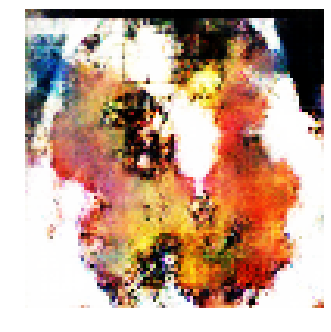


Epoch: 3580, D: -9.038, G: 1.584
Epoch: 3581, D: -7.904, G: 1.887
Epoch: 3582, D: -6.833, G: 2.023
Epoch: 3583, D: -5.754, G: 3.371
Epoch: 3584, D: -7.925, G: 4.056
Epoch: 3585, D: -5.419, G: 4.504
Epoch: 3586, D: -8.113, G: 5.981
Epoch: 3587, D: -9.051, G: 4.961
Epoch: 3588, D: -8.176, G: 0.5423
Epoch: 3589, D: -7.063, G: 3.289
Epoch: 3590, D: -8.66, G: 5.042
Epoch: 3591, D: -7.606, G: 6.444
Epoch: 3592, D: -8.122, G: 1.546
Epoch: 3593, D: -7.66, G: 1.852
Epoch: 3594, D: -5.63, G: 1.536
Epoch: 3595, D: -7.499, G: 3.185
Epoch: 3596, D: -7.644, G: 6.935
Epoch: 3597, D: -6.76, G: 4.504
Epoch: 3598, D: -8.896, G: 3.771
Epoch: 3599, D: -6.765, G: 3.296


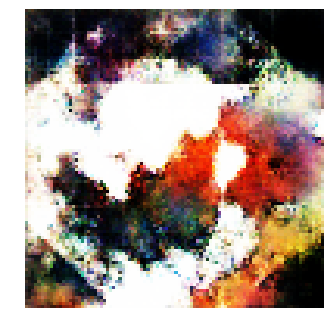


Epoch: 3600, D: -8.26, G: -0.6436
Epoch: 3601, D: -7.37, G: 3.364
Epoch: 3602, D: -6.468, G: 4.601
Epoch: 3603, D: -8.181, G: 2.384
Epoch: 3604, D: -7.549, G: 2.772
Epoch: 3605, D: -9.369, G: 5.508
Epoch: 3606, D: -4.976, G: 3.503
Epoch: 3607, D: -7.429, G: 4.167
Epoch: 3608, D: -8.025, G: 4.466
Epoch: 3609, D: -7.228, G: 4.967
Epoch: 3610, D: -6.495, G: 6.931
Epoch: 3611, D: -8.806, G: 2.806
Epoch: 3612, D: -7.685, G: 2.548
Epoch: 3613, D: -7.59, G: 2.756
Epoch: 3614, D: -7.4, G: 2.783
Epoch: 3615, D: -7.927, G: 6.352
Epoch: 3616, D: -8.729, G: 2.953
Epoch: 3617, D: -7.888, G: 2.734
Epoch: 3618, D: -8.018, G: 0.6445
Epoch: 3619, D: -8.412, G: 4.472


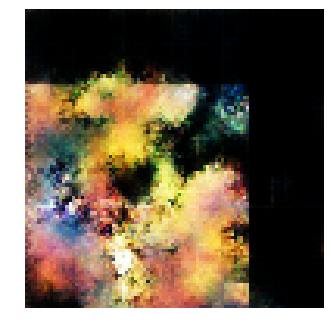


Epoch: 3620, D: -6.398, G: 2.66
Epoch: 3621, D: -5.551, G: 3.609
Epoch: 3622, D: -8.139, G: 3.838
Epoch: 3623, D: -8.335, G: 3.052
Epoch: 3624, D: -8.282, G: 3.185
Epoch: 3625, D: -9.797, G: 3.429
Epoch: 3626, D: -5.908, G: 8.086
Epoch: 3627, D: -8.21, G: 5.282
Epoch: 3628, D: -7.216, G: 1.667
Epoch: 3629, D: -7.913, G: 4.787
Epoch: 3630, D: -5.937, G: 3.348
Epoch: 3631, D: -7.069, G: 4.453
Epoch: 3632, D: -7.57, G: 4.049
Epoch: 3633, D: -7.801, G: 5.779
Epoch: 3634, D: -8.95, G: 4.117
Epoch: 3635, D: -7.988, G: 5.534
Epoch: 3636, D: -8.746, G: 1.479
Epoch: 3637, D: -7.545, G: 4.327
Epoch: 3638, D: -8.852, G: 2.474
Epoch: 3639, D: -8.148, G: 2.7


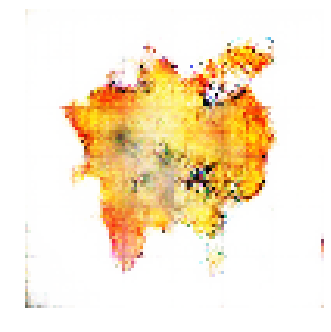


Epoch: 3640, D: -7.436, G: 3.26
Epoch: 3641, D: -8.004, G: 1.714
Epoch: 3642, D: -6.189, G: 1.307
Epoch: 3643, D: -5.231, G: 1.588
Epoch: 3644, D: -8.512, G: 7.142
Epoch: 3645, D: -8.88, G: 7.081
Epoch: 3646, D: -7.603, G: 4.259
Epoch: 3647, D: -7.284, G: 4.165
Epoch: 3648, D: -6.588, G: 0.6102
Epoch: 3649, D: -7.361, G: 4.145
Epoch: 3650, D: -7.511, G: 3.643
Epoch: 3651, D: -9.531, G: 4.231
Epoch: 3652, D: -7.471, G: 3.154
Epoch: 3653, D: -8.809, G: 1.916
Epoch: 3654, D: -6.759, G: 4.431
Epoch: 3655, D: -7.285, G: 3.948
Epoch: 3656, D: -6.761, G: 4.677
Epoch: 3657, D: -7.96, G: 4.009
Epoch: 3658, D: -6.479, G: 4.125
Epoch: 3659, D: -7.189, G: 4.28


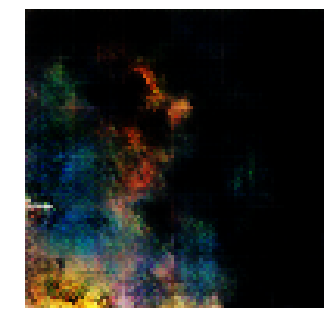


Epoch: 3660, D: -6.82, G: 4.913
Epoch: 3661, D: -6.827, G: 3.811
Epoch: 3662, D: -6.111, G: 4.805
Epoch: 3663, D: -8.438, G: 3.087
Epoch: 3664, D: -8.364, G: 3.348
Epoch: 3665, D: -7.497, G: 2.971
Epoch: 3666, D: -6.562, G: 7.428
Epoch: 3667, D: -8.739, G: 3.404
Epoch: 3668, D: -7.996, G: 3.139
Epoch: 3669, D: -4.513, G: 3.306
Epoch: 3670, D: -7.866, G: 5.387
Epoch: 3671, D: -8.022, G: 3.07
Epoch: 3672, D: -7.852, G: 0.1278
Epoch: 3673, D: -8.321, G: 3.278
Epoch: 3674, D: -8.367, G: 4.667
Epoch: 3675, D: -7.724, G: 2.789
Epoch: 3676, D: -5.878, G: 1.584
Epoch: 3677, D: -9.283, G: 4.14
Epoch: 3678, D: -8.514, G: 3.715
Epoch: 3679, D: -6.289, G: 3.117


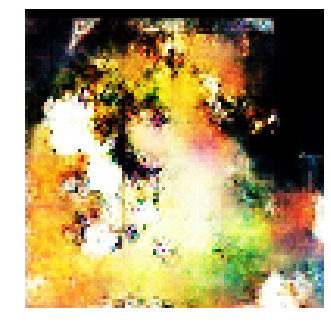


Epoch: 3680, D: -8.029, G: 4.171
Epoch: 3681, D: -7.762, G: 4.468
Epoch: 3682, D: -9.284, G: 2.252
Epoch: 3683, D: -7.973, G: 3.598
Epoch: 3684, D: -6.526, G: 4.792
Epoch: 3685, D: -8.356, G: 3.073
Epoch: 3686, D: -6.912, G: 1.521
Epoch: 3687, D: -8.146, G: 4.586
Epoch: 3688, D: -6.709, G: 4.121
Epoch: 3689, D: -7.321, G: 5.183
Epoch: 3690, D: -6.738, G: 2.987
Epoch: 3691, D: -9.319, G: 3.696
Epoch: 3692, D: -6.602, G: 1.561
Epoch: 3693, D: -7.013, G: 4.283
Epoch: 3694, D: -9.776, G: 4.927
Epoch: 3695, D: -7.884, G: 4.997
Epoch: 3696, D: -5.537, G: 1.426
Epoch: 3697, D: -8.479, G: 6.183
Epoch: 3698, D: -8.161, G: 2.731
Epoch: 3699, D: -9.348, G: 2.985


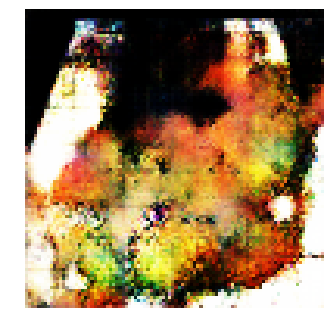


Epoch: 3700, D: -6.463, G: 2.862
Epoch: 3701, D: -7.509, G: 1.662
Epoch: 3702, D: -7.781, G: 0.2147
Epoch: 3703, D: -7.888, G: 6.625
Epoch: 3704, D: -8.449, G: 2.578
Epoch: 3705, D: -8.308, G: 2.736
Epoch: 3706, D: -7.458, G: 5.128
Epoch: 3707, D: -8.61, G: 0.09587
Epoch: 3708, D: -6.82, G: 5.393
Epoch: 3709, D: -7.936, G: 4.259
Epoch: 3710, D: -8.498, G: 3.463
Epoch: 3711, D: -7.745, G: 5.025
Epoch: 3712, D: -7.867, G: 5.715
Epoch: 3713, D: -8.122, G: 3.336
Epoch: 3714, D: -7.106, G: 9.55
Epoch: 3715, D: -7.282, G: 5.016
Epoch: 3716, D: -5.756, G: 1.701
Epoch: 3717, D: -8.233, G: 6.157
Epoch: 3718, D: -9.076, G: 2.071
Epoch: 3719, D: -7.076, G: 4.075


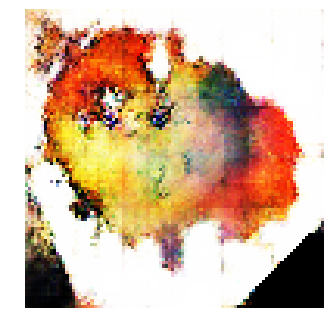


Epoch: 3720, D: -7.728, G: 6.019
Epoch: 3721, D: -7.385, G: 4.296
Epoch: 3722, D: -6.632, G: 0.8694
Epoch: 3723, D: -8.018, G: 4.761
Epoch: 3724, D: -7.963, G: 4.445
Epoch: 3725, D: -9.383, G: 4.781
Epoch: 3726, D: -8.119, G: 1.66
Epoch: 3727, D: -5.945, G: 1.964
Epoch: 3728, D: -8.748, G: 3.615
Epoch: 3729, D: -7.856, G: 6.089
Epoch: 3730, D: -7.914, G: 1.301
Epoch: 3731, D: -7.039, G: 3.768
Epoch: 3732, D: -8.936, G: 4.255
Epoch: 3733, D: -8.176, G: 4.212
Epoch: 3734, D: -8.044, G: 1.048
Epoch: 3735, D: -8.467, G: 3.223
Epoch: 3736, D: -6.73, G: 4.435
Epoch: 3737, D: -5.129, G: 5.296
Epoch: 3738, D: -8.108, G: 4.314
Epoch: 3739, D: -7.015, G: 5.295


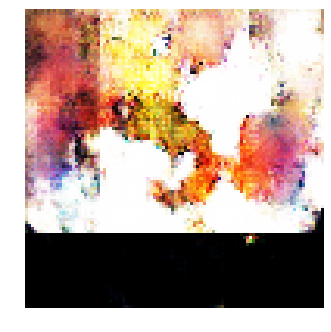


Epoch: 3740, D: -8.09, G: 5.906
Epoch: 3741, D: -7.719, G: 2.204
Epoch: 3742, D: -6.538, G: 3.659
Epoch: 3743, D: -8.608, G: 4.531
Epoch: 3744, D: -6.362, G: 2.813
Epoch: 3745, D: -8.757, G: 4.76
Epoch: 3746, D: -7.063, G: 7.789
Epoch: 3747, D: -6.852, G: 3.165
Epoch: 3748, D: -7.356, G: 4.942
Epoch: 3749, D: -8.685, G: 2.624
Epoch: 3750, D: -8.245, G: 1.624
Epoch: 3751, D: -7.96, G: 0.6703
Epoch: 3752, D: -8.817, G: 5.389
Epoch: 3753, D: -8.413, G: 0.2689
Epoch: 3754, D: -6.97, G: 1.841
Epoch: 3755, D: -8.713, G: 5.395
Epoch: 3756, D: -7.274, G: 3.161
Epoch: 3757, D: -7.2, G: 4.292
Epoch: 3758, D: -6.849, G: 3.662
Epoch: 3759, D: -5.477, G: 4.075


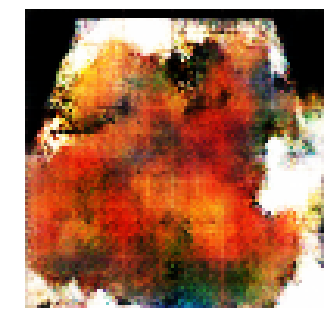


Epoch: 3760, D: -6.895, G: 7.397
Epoch: 3761, D: -7.388, G: 3.805
Epoch: 3762, D: -6.123, G: 5.051
Epoch: 3763, D: -7.923, G: 2.796
Epoch: 3764, D: -6.251, G: 3.398
Epoch: 3765, D: -7.692, G: 3.463
Epoch: 3766, D: -7.657, G: 5.85
Epoch: 3767, D: -9.105, G: 2.544
Epoch: 3768, D: -8.422, G: 5.298
Epoch: 3769, D: -6.844, G: 6.692
Epoch: 3770, D: -9.362, G: 2.506
Epoch: 3771, D: -7.648, G: 2.433
Epoch: 3772, D: -6.392, G: 2.602
Epoch: 3773, D: -8.421, G: 3.668
Epoch: 3774, D: -7.365, G: 4.644
Epoch: 3775, D: -8.78, G: 2.659
Epoch: 3776, D: -7.139, G: -0.089
Epoch: 3777, D: -8.006, G: 3.673
Epoch: 3778, D: -7.197, G: 2.864
Epoch: 3779, D: -7.871, G: 5.555


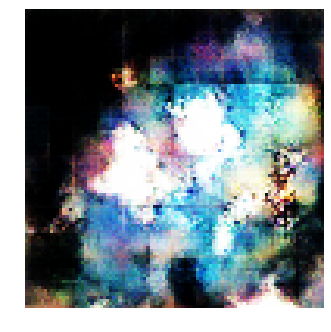


Epoch: 3780, D: -8.26, G: 2.594
Epoch: 3781, D: -6.038, G: 0.9619
Epoch: 3782, D: -5.897, G: 5.038
Epoch: 3783, D: -6.459, G: 1.751
Epoch: 3784, D: -7.343, G: 2.029
Epoch: 3785, D: -8.468, G: 5.877
Epoch: 3786, D: -7.627, G: 1.515
Epoch: 3787, D: -7.988, G: 3.371
Epoch: 3788, D: -7.739, G: 5.976
Epoch: 3789, D: -6.439, G: 2.2
Epoch: 3790, D: -5.929, G: 3.561
Epoch: 3791, D: -7.361, G: 4.255
Epoch: 3792, D: -6.709, G: 4.978
Epoch: 3793, D: -4.373, G: 4.56
Epoch: 3794, D: -8.78, G: 6.005
Epoch: 3795, D: -7.871, G: 1.482
Epoch: 3796, D: -8.08, G: 1.459
Epoch: 3797, D: -5.213, G: 2.585
Epoch: 3798, D: -8.49, G: 3.205
Epoch: 3799, D: -8.608, G: 2.37


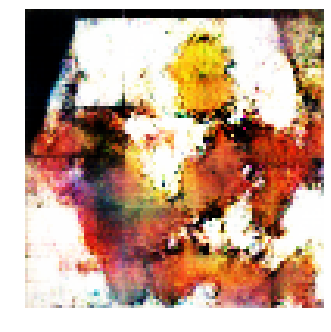


Epoch: 3800, D: -7.082, G: 2.77
Epoch: 3801, D: -7.643, G: 2.293
Epoch: 3802, D: -8.372, G: 4.332
Epoch: 3803, D: -8.565, G: 4.703
Epoch: 3804, D: -7.347, G: 4.307
Epoch: 3805, D: -7.951, G: 4.104
Epoch: 3806, D: -8.709, G: 3.152
Epoch: 3807, D: -8.497, G: 5.986
Epoch: 3808, D: -7.76, G: 4.174
Epoch: 3809, D: -6.94, G: 1.67
Epoch: 3810, D: -7.099, G: 3.869
Epoch: 3811, D: -5.86, G: 2.352
Epoch: 3812, D: -7.196, G: 4.992
Epoch: 3813, D: -8.878, G: -1.239
Epoch: 3814, D: -6.994, G: 1.812
Epoch: 3815, D: -7.635, G: 2.063
Epoch: 3816, D: -6.149, G: 3.384
Epoch: 3817, D: -7.245, G: 4.128
Epoch: 3818, D: -6.419, G: 4.965
Epoch: 3819, D: -6.389, G: 6.949


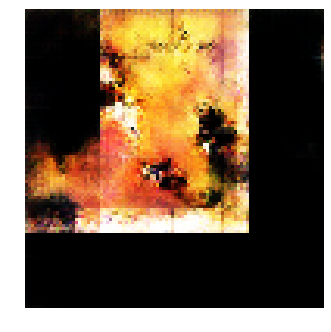


Epoch: 3820, D: -7.003, G: 3.821
Epoch: 3821, D: -8.725, G: 7.01
Epoch: 3822, D: -6.559, G: 2.855
Epoch: 3823, D: -9.349, G: 2.953
Epoch: 3824, D: -5.345, G: 2.78
Epoch: 3825, D: -8.468, G: 5.367
Epoch: 3826, D: -8.788, G: 0.5441
Epoch: 3827, D: -7.908, G: 3.047
Epoch: 3828, D: -8.015, G: 2.914
Epoch: 3829, D: -7.994, G: 5.737
Epoch: 3830, D: -8.426, G: 3.598
Epoch: 3831, D: -6.589, G: 1.321
Epoch: 3832, D: -5.683, G: 3.41
Epoch: 3833, D: -6.359, G: 3.491
Epoch: 3834, D: -7.054, G: 2.575
Epoch: 3835, D: -7.352, G: 1.423
Epoch: 3836, D: -5.304, G: 3.506
Epoch: 3837, D: -7.59, G: 1.843
Epoch: 3838, D: -7.614, G: 3.158
Epoch: 3839, D: -7.098, G: 6.096


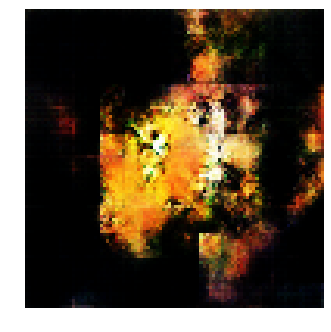


Epoch: 3840, D: -7.953, G: 3.183
Epoch: 3841, D: -8.078, G: 4.2
Epoch: 3842, D: -5.933, G: 3.906
Epoch: 3843, D: -7.03, G: 6.877
Epoch: 3844, D: -6.168, G: 2.95
Epoch: 3845, D: -7.631, G: 2.83
Epoch: 3846, D: -8.808, G: 6.287
Epoch: 3847, D: -8.654, G: 0.2961
Epoch: 3848, D: -9.441, G: 2.846
Epoch: 3849, D: -7.596, G: 3.656
Epoch: 3850, D: -7.917, G: 5.852
Epoch: 3851, D: -8.643, G: 1.599
Epoch: 3852, D: -7.814, G: 1.639
Epoch: 3853, D: -6.535, G: 0.9611
Epoch: 3854, D: -9.334, G: 3.608
Epoch: 3855, D: -6.719, G: 4.304
Epoch: 3856, D: -8.149, G: 3.292
Epoch: 3857, D: -5.824, G: 4.118
Epoch: 3858, D: -8.126, G: 2.192
Epoch: 3859, D: -6.955, G: 0.6175


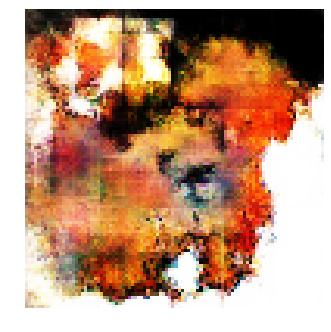


Epoch: 3860, D: -5.338, G: 2.596
Epoch: 3861, D: -6.036, G: 3.556
Epoch: 3862, D: -7.234, G: 2.403
Epoch: 3863, D: -6.879, G: 5.908
Epoch: 3864, D: -7.336, G: 5.04
Epoch: 3865, D: -6.792, G: 5.834
Epoch: 3866, D: -9.129, G: 4.021
Epoch: 3867, D: -9.067, G: 2.498
Epoch: 3868, D: -8.586, G: 1.694
Epoch: 3869, D: -7.875, G: 2.809
Epoch: 3870, D: -7.365, G: 2.633
Epoch: 3871, D: -7.575, G: 3.893
Epoch: 3872, D: -7.975, G: 3.238
Epoch: 3873, D: -6.876, G: 3.889
Epoch: 3874, D: -7.519, G: 4.575
Epoch: 3875, D: -6.081, G: 3.748
Epoch: 3876, D: -8.652, G: 2.753
Epoch: 3877, D: -6.84, G: 3.914
Epoch: 3878, D: -7.058, G: 4.619
Epoch: 3879, D: -8.779, G: 6.01


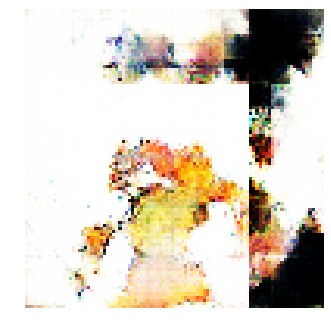


Epoch: 3880, D: -6.229, G: 1.825
Epoch: 3881, D: -6.787, G: 4.033
Epoch: 3882, D: -7.833, G: 3.685
Epoch: 3883, D: -7.089, G: 2.387
Epoch: 3884, D: -7.533, G: 4.492
Epoch: 3885, D: -8.122, G: 3.246
Epoch: 3886, D: -7.986, G: 2.46
Epoch: 3887, D: -8.227, G: 3.254
Epoch: 3888, D: -7.546, G: 3.888
Epoch: 3889, D: -8.299, G: 5.525
Epoch: 3890, D: -4.86, G: 4.298
Epoch: 3891, D: -8.806, G: 5.334
Epoch: 3892, D: -6.606, G: 1.126
Epoch: 3893, D: -8.501, G: 5.623
Epoch: 3894, D: -7.371, G: 3.082
Epoch: 3895, D: -7.496, G: 1.305
Epoch: 3896, D: -7.356, G: 4.661
Epoch: 3897, D: -7.513, G: 4.222
Epoch: 3898, D: -7.021, G: 4.49
Epoch: 3899, D: -8.237, G: 6.519


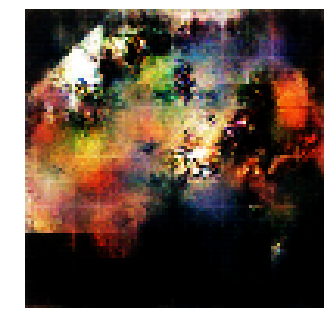


Epoch: 3900, D: -7.584, G: 1.981
Epoch: 3901, D: -6.724, G: 2.698
Epoch: 3902, D: -7.539, G: 4.232
Epoch: 3903, D: -8.356, G: 3.632
Epoch: 3904, D: -6.288, G: 4.563
Epoch: 3905, D: -8.467, G: 3.249
Epoch: 3906, D: -6.698, G: 7.947
Epoch: 3907, D: -5.701, G: 3.245
Epoch: 3908, D: -9.027, G: 3.875
Epoch: 3909, D: -7.136, G: 1.994
Epoch: 3910, D: -5.175, G: 3.394
Epoch: 3911, D: -7.93, G: 3.393
Epoch: 3912, D: -8.96, G: 1.521
Epoch: 3913, D: -6.471, G: 1.501
Epoch: 3914, D: -7.686, G: 2.73
Epoch: 3915, D: -7.214, G: 4.442
Epoch: 3916, D: -6.875, G: 4.645
Epoch: 3917, D: -7.966, G: 0.5918
Epoch: 3918, D: -5.516, G: 2.511
Epoch: 3919, D: -7.508, G: 4.839


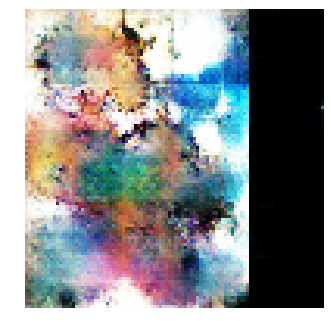


Epoch: 3920, D: -7.626, G: 4.208
Epoch: 3921, D: -7.271, G: 3.721
Epoch: 3922, D: -8.278, G: 4.738
Epoch: 3923, D: -5.408, G: 1.906
Epoch: 3924, D: -8.479, G: 3.374
Epoch: 3925, D: -7.792, G: 6.022
Epoch: 3926, D: -6.762, G: 3.051
Epoch: 3927, D: -7.39, G: 3.473
Epoch: 3928, D: -7.769, G: 2.508
Epoch: 3929, D: -8.717, G: 2.311
Epoch: 3930, D: -7.09, G: 5.575
Epoch: 3931, D: -6.549, G: 6.331
Epoch: 3932, D: -7.584, G: 4.337
Epoch: 3933, D: -9.059, G: 1.579
Epoch: 3934, D: -7.359, G: 3.704
Epoch: 3935, D: -9.357, G: 8.769
Epoch: 3936, D: -8.067, G: -0.5653
Epoch: 3937, D: -8.855, G: 5.326
Epoch: 3938, D: -8.21, G: 2.224
Epoch: 3939, D: -8.106, G: 6.798


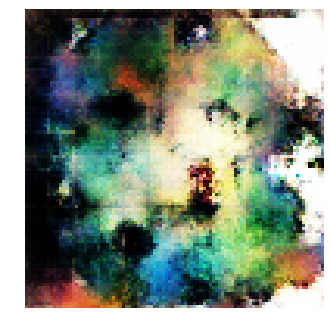


Epoch: 3940, D: -6.972, G: 3.393
Epoch: 3941, D: -5.582, G: 4.384
Epoch: 3942, D: -8.544, G: 2.922
Epoch: 3943, D: -7.747, G: 4.463
Epoch: 3944, D: -7.586, G: 3.784
Epoch: 3945, D: -8.331, G: 3.851
Epoch: 3946, D: -7.11, G: 3.91
Epoch: 3947, D: -7.15, G: 3.943
Epoch: 3948, D: -7.387, G: 5.603
Epoch: 3949, D: -8.038, G: 3.943
Epoch: 3950, D: -8.931, G: 4.574
Epoch: 3951, D: -6.319, G: 5.334
Epoch: 3952, D: -7.241, G: 4.977
Epoch: 3953, D: -6.291, G: 0.5226
Epoch: 3954, D: -7.792, G: 5.678
Epoch: 3955, D: -5.945, G: 4.92
Epoch: 3956, D: -5.815, G: 4.808
Epoch: 3957, D: -6.844, G: 3.554
Epoch: 3958, D: -6.776, G: 2.5
Epoch: 3959, D: -7.211, G: 4.385


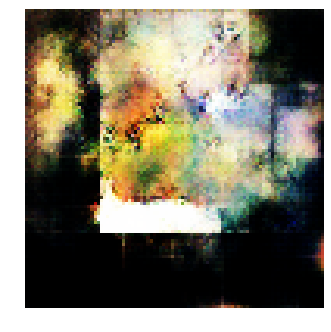


Epoch: 3960, D: -6.694, G: 8.313
Epoch: 3961, D: -5.848, G: 4.648
Epoch: 3962, D: -8.554, G: 4.801
Epoch: 3963, D: -6.144, G: 2.735
Epoch: 3964, D: -8.153, G: 2.523
Epoch: 3965, D: -9.459, G: 3.384
Epoch: 3966, D: -5.773, G: 4.779
Epoch: 3967, D: -6.072, G: 4.474
Epoch: 3968, D: -6.372, G: 3.237
Epoch: 3969, D: -8.424, G: 6.474
Epoch: 3970, D: -6.455, G: 2.355
Epoch: 3971, D: -7.291, G: 4.74
Epoch: 3972, D: -7.586, G: 3.841
Epoch: 3973, D: -8.537, G: 2.877
Epoch: 3974, D: -10.11, G: 0.402
Epoch: 3975, D: -9.474, G: 2.203
Epoch: 3976, D: -8.303, G: 5.196
Epoch: 3977, D: -6.399, G: 5.102
Epoch: 3978, D: -7.655, G: 5.655
Epoch: 3979, D: -8.126, G: 4.274


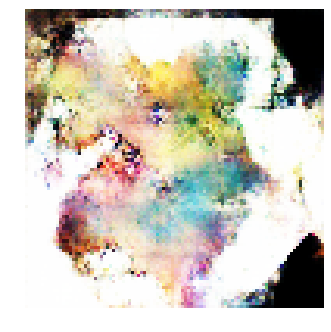


Epoch: 3980, D: -7.661, G: 3.897
Epoch: 3981, D: -6.165, G: 3.736
Epoch: 3982, D: -6.424, G: 3.673
Epoch: 3983, D: -6.693, G: 4.631
Epoch: 3984, D: -6.375, G: 3.46
Epoch: 3985, D: -7.658, G: 5.159
Epoch: 3986, D: -5.928, G: 4.119
Epoch: 3987, D: -7.336, G: 5.382
Epoch: 3988, D: -7.806, G: 4.408
Epoch: 3989, D: -7.21, G: 0.4972
Epoch: 3990, D: -7.265, G: 1.028
Epoch: 3991, D: -9.056, G: 2.495
Epoch: 3992, D: -7.44, G: 5.589
Epoch: 3993, D: -7.052, G: 4.152
Epoch: 3994, D: -8.293, G: 3.95
Epoch: 3995, D: -7.483, G: 6.905
Epoch: 3996, D: -7.762, G: 2.13
Epoch: 3997, D: -5.506, G: 3.42
Epoch: 3998, D: -7.656, G: 6.646
Epoch: 3999, D: -7.904, G: 4.221


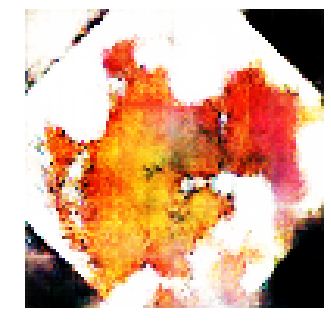


Epoch: 4000, D: -7.614, G: 1.688
Epoch: 4001, D: -6.318, G: 4.899
Epoch: 4002, D: -7.141, G: 6.696
Epoch: 4003, D: -8.49, G: 4.299
Epoch: 4004, D: -9.201, G: 0.9181
Epoch: 4005, D: -6.986, G: 3.934
Epoch: 4006, D: -7.658, G: 2.511
Epoch: 4007, D: -8.801, G: 2.665
Epoch: 4008, D: -5.933, G: 1.706
Epoch: 4009, D: -8.466, G: 2.026
Epoch: 4010, D: -6.123, G: 0.752
Epoch: 4011, D: -7.142, G: 3.453
Epoch: 4012, D: -7.741, G: 4.01
Epoch: 4013, D: -7.625, G: 1.292
Epoch: 4014, D: -8.545, G: 6.019
Epoch: 4015, D: -7.08, G: 4.237
Epoch: 4016, D: -6.97, G: 3.244
Epoch: 4017, D: -6.29, G: 4.458
Epoch: 4018, D: -8.989, G: 5.734
Epoch: 4019, D: -7.507, G: 5.505


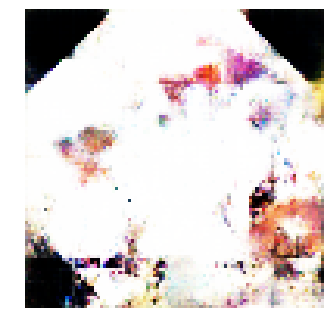


Epoch: 4020, D: -8.428, G: 2.956
Epoch: 4021, D: -6.7, G: 0.3888
Epoch: 4022, D: -8.194, G: 4.966
Epoch: 4023, D: -6.594, G: 3.617
Epoch: 4024, D: -7.143, G: 3.353
Epoch: 4025, D: -7.591, G: 2.653
Epoch: 4026, D: -6.575, G: 4.353
Epoch: 4027, D: -7.966, G: 6.572
Epoch: 4028, D: -7.457, G: 2.096
Epoch: 4029, D: -6.567, G: 4.568
Epoch: 4030, D: -6.69, G: 2.059
Epoch: 4031, D: -4.147, G: 4.112
Epoch: 4032, D: -7.251, G: 7.259
Epoch: 4033, D: -6.786, G: 6.404
Epoch: 4034, D: -9.222, G: 1.18
Epoch: 4035, D: -5.727, G: 1.661
Epoch: 4036, D: -7.733, G: 3.981
Epoch: 4037, D: -6.827, G: 4.867
Epoch: 4038, D: -6.653, G: 3.77
Epoch: 4039, D: -7.933, G: 2.667


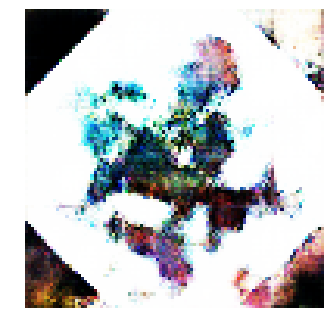


Epoch: 4040, D: -6.264, G: 2.45
Epoch: 4041, D: -6.367, G: 2.581
Epoch: 4042, D: -7.82, G: 2.888
Epoch: 4043, D: -6.263, G: 2.947
Epoch: 4044, D: -6.947, G: 3.584
Epoch: 4045, D: -6.402, G: 2.616
Epoch: 4046, D: -7.879, G: 1.757
Epoch: 4047, D: -8.016, G: 4.78
Epoch: 4048, D: -5.906, G: 5.089
Epoch: 4049, D: -7.811, G: 4.265
Epoch: 4050, D: -6.552, G: 3.661
Epoch: 4051, D: -6.442, G: 2.351
Epoch: 4052, D: -5.578, G: 4.997
Epoch: 4053, D: -6.882, G: 10.61
Epoch: 4054, D: -7.923, G: 4.32
Epoch: 4055, D: -7.535, G: 6.25
Epoch: 4056, D: -7.338, G: 4.581
Epoch: 4057, D: -6.732, G: 3.194
Epoch: 4058, D: -6.871, G: 3.227
Epoch: 4059, D: -7.523, G: 1.42


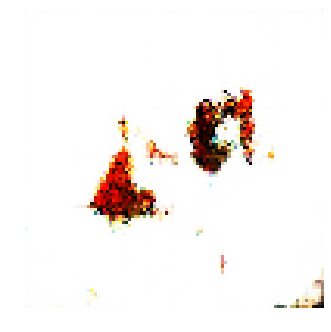


Epoch: 4060, D: -7.471, G: 3.078
Epoch: 4061, D: -6.14, G: 5.403
Epoch: 4062, D: -6.923, G: 2.031
Epoch: 4063, D: -7.742, G: 2.275
Epoch: 4064, D: -8.846, G: 2.254
Epoch: 4065, D: -6.185, G: 4.067
Epoch: 4066, D: -5.803, G: 4.014
Epoch: 4067, D: -11.32, G: 3.764
Epoch: 4068, D: -7.306, G: 0.231
Epoch: 4069, D: -8.467, G: 5.406
Epoch: 4070, D: -9.052, G: 5.292
Epoch: 4071, D: -8.568, G: 5.564
Epoch: 4072, D: -8.876, G: 4.546
Epoch: 4073, D: -6.902, G: 2.472
Epoch: 4074, D: -6.446, G: 3.133
Epoch: 4075, D: -6.868, G: 0.7274
Epoch: 4076, D: -9.02, G: 5.127
Epoch: 4077, D: -6.809, G: 8.174
Epoch: 4078, D: -8.13, G: -0.2615
Epoch: 4079, D: -8.228, G: 1.696


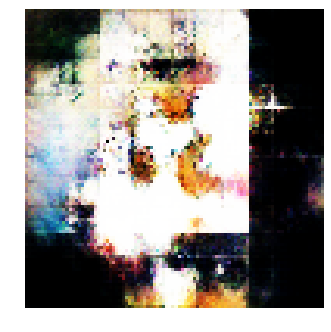


Epoch: 4080, D: -7.456, G: 3.136
Epoch: 4081, D: -7.538, G: 5.352
Epoch: 4082, D: -9.226, G: 4.406
Epoch: 4083, D: -7.63, G: 3.295
Epoch: 4084, D: -5.348, G: 2.156
Epoch: 4085, D: -7.517, G: 3.704
Epoch: 4086, D: -9.033, G: 0.165
Epoch: 4087, D: -6.645, G: 6.329
Epoch: 4088, D: -5.215, G: 5.714
Epoch: 4089, D: -8.019, G: 3.966
Epoch: 4090, D: -7.04, G: 7.503
Epoch: 4091, D: -7.129, G: 4.741
Epoch: 4092, D: -8.474, G: 1.715
Epoch: 4093, D: -7.081, G: 4.583
Epoch: 4094, D: -7.674, G: 3.895
Epoch: 4095, D: -7.909, G: 4.657
Epoch: 4096, D: -6.818, G: 4.807
Epoch: 4097, D: -7.366, G: 2.103
Epoch: 4098, D: -8.567, G: 2.336
Epoch: 4099, D: -7.6, G: 4.094


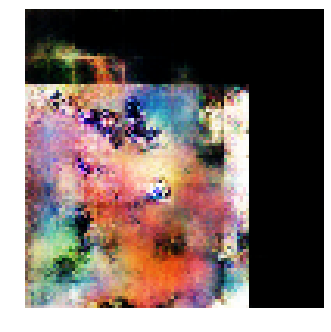


Epoch: 4100, D: -8.315, G: 1.27
Epoch: 4101, D: -7.377, G: 3.097
Epoch: 4102, D: -7.456, G: 3.527
Epoch: 4103, D: -9.855, G: 1.841
Epoch: 4104, D: -7.432, G: 1.919
Epoch: 4105, D: -6.284, G: 3.652
Epoch: 4106, D: -6.435, G: 3.608
Epoch: 4107, D: -7.962, G: 3.253
Epoch: 4108, D: -5.766, G: 3.726
Epoch: 4109, D: -8.195, G: 4.221
Epoch: 4110, D: -9.109, G: 5.613
Epoch: 4111, D: -7.865, G: 2.465
Epoch: 4112, D: -8.752, G: 4.902
Epoch: 4113, D: -9.225, G: 3.508
Epoch: 4114, D: -6.695, G: 0.9415
Epoch: 4115, D: -6.757, G: 2.596
Epoch: 4116, D: -6.155, G: 3.254
Epoch: 4117, D: -8.219, G: 5.292
Epoch: 4118, D: -6.828, G: 2.161
Epoch: 4119, D: -7.896, G: 4.919


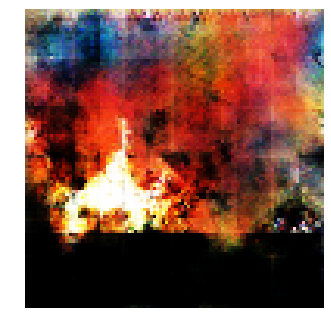


Epoch: 4120, D: -9.0, G: 1.837
Epoch: 4121, D: -7.182, G: 4.04
Epoch: 4122, D: -6.532, G: 4.727
Epoch: 4123, D: -8.136, G: 3.246
Epoch: 4124, D: -7.322, G: 4.269
Epoch: 4125, D: -6.105, G: 5.595
Epoch: 4126, D: -7.971, G: 4.693
Epoch: 4127, D: -6.58, G: 2.803
Epoch: 4128, D: -9.014, G: 3.9
Epoch: 4129, D: -8.041, G: 4.568
Epoch: 4130, D: -7.772, G: -0.1363
Epoch: 4131, D: -7.552, G: 4.499
Epoch: 4132, D: -7.059, G: 2.656
Epoch: 4133, D: -6.654, G: 5.455
Epoch: 4134, D: -6.706, G: 3.117
Epoch: 4135, D: -7.787, G: 2.689
Epoch: 4136, D: -7.227, G: 1.057
Epoch: 4137, D: -8.095, G: 3.473
Epoch: 4138, D: -6.624, G: 3.478
Epoch: 4139, D: -7.855, G: 3.929


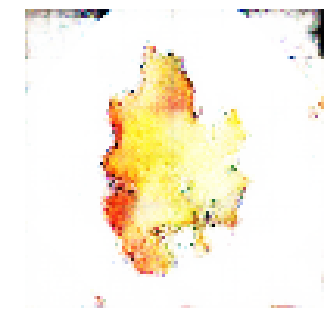


Epoch: 4140, D: -6.763, G: 1.6
Epoch: 4141, D: -8.281, G: 2.989
Epoch: 4142, D: -8.679, G: 2.034
Epoch: 4143, D: -7.956, G: 2.695
Epoch: 4144, D: -7.758, G: 5.578
Epoch: 4145, D: -5.017, G: 2.019
Epoch: 4146, D: -9.869, G: 1.07
Epoch: 4147, D: -7.088, G: 1.822
Epoch: 4148, D: -7.838, G: 3.613
Epoch: 4149, D: -8.288, G: 2.467
Epoch: 4150, D: -7.713, G: 1.541
Epoch: 4151, D: -8.356, G: 4.05
Epoch: 4152, D: -8.297, G: 2.693
Epoch: 4153, D: -7.514, G: 8.005
Epoch: 4154, D: -5.243, G: 0.7378
Epoch: 4155, D: -8.135, G: 1.6
Epoch: 4156, D: -8.851, G: -0.08937
Epoch: 4157, D: -7.435, G: 6.556
Epoch: 4158, D: -6.044, G: 1.999
Epoch: 4159, D: -6.543, G: 2.989


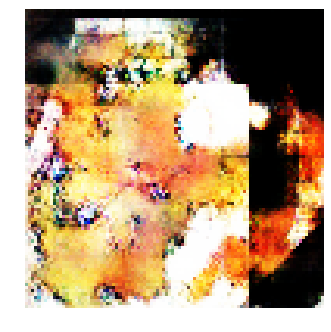


Epoch: 4160, D: -6.632, G: 2.88
Epoch: 4161, D: -6.599, G: 3.673
Epoch: 4162, D: -6.593, G: 2.037
Epoch: 4163, D: -8.66, G: 3.31
Epoch: 4164, D: -7.281, G: 3.174
Epoch: 4165, D: -7.765, G: 3.106
Epoch: 4166, D: -8.189, G: 1.147
Epoch: 4167, D: -9.395, G: 4.695
Epoch: 4168, D: -7.295, G: 2.642
Epoch: 4169, D: -7.238, G: 0.762
Epoch: 4170, D: -9.308, G: 2.444
Epoch: 4171, D: -6.453, G: 3.066
Epoch: 4172, D: -9.156, G: 4.52
Epoch: 4173, D: -8.152, G: 3.299
Epoch: 4174, D: -5.164, G: 2.109
Epoch: 4175, D: -6.437, G: 4.825
Epoch: 4176, D: -6.378, G: 4.867
Epoch: 4177, D: -9.243, G: 6.8
Epoch: 4178, D: -5.369, G: 4.031
Epoch: 4179, D: -6.502, G: 3.959


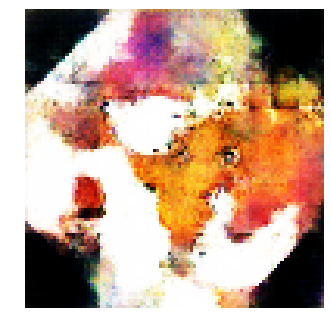


Epoch: 4180, D: -7.199, G: 4.72
Epoch: 4181, D: -6.915, G: 2.969
Epoch: 4182, D: -8.78, G: 2.816
Epoch: 4183, D: -6.283, G: 4.818
Epoch: 4184, D: -7.149, G: 5.243
Epoch: 4185, D: -7.279, G: 4.402
Epoch: 4186, D: -7.834, G: 1.193
Epoch: 4187, D: -6.371, G: 1.34
Epoch: 4188, D: -5.78, G: 5.945
Epoch: 4189, D: -6.603, G: 4.432
Epoch: 4190, D: -8.391, G: 1.686
Epoch: 4191, D: -6.979, G: 2.149
Epoch: 4192, D: -6.018, G: 3.928
Epoch: 4193, D: -6.276, G: 8.2
Epoch: 4194, D: -6.751, G: 4.219
Epoch: 4195, D: -6.71, G: 2.818
Epoch: 4196, D: -6.845, G: 4.631
Epoch: 4197, D: -6.4, G: 5.512
Epoch: 4198, D: -7.118, G: 5.281
Epoch: 4199, D: -8.219, G: 2.01


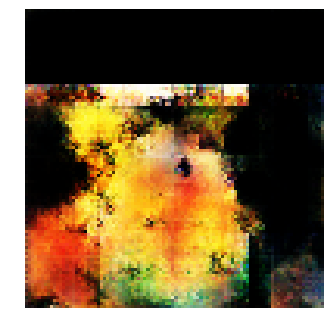


Epoch: 4200, D: -7.211, G: 3.051
Epoch: 4201, D: -7.13, G: 3.865
Epoch: 4202, D: -6.638, G: 0.9201
Epoch: 4203, D: -6.859, G: 4.423
Epoch: 4204, D: -6.476, G: 2.685
Epoch: 4205, D: -6.374, G: 2.788
Epoch: 4206, D: -7.15, G: 5.6
Epoch: 4207, D: -7.396, G: 4.262
Epoch: 4208, D: -8.418, G: 4.098
Epoch: 4209, D: -6.861, G: 1.014
Epoch: 4210, D: -7.782, G: 3.533
Epoch: 4211, D: -8.787, G: 3.892
Epoch: 4212, D: -7.507, G: 2.071
Epoch: 4213, D: -7.868, G: 1.975
Epoch: 4214, D: -5.599, G: 4.054
Epoch: 4215, D: -8.234, G: 4.448
Epoch: 4216, D: -8.922, G: 2.837
Epoch: 4217, D: -6.995, G: 4.762
Epoch: 4218, D: -7.878, G: 4.76
Epoch: 4219, D: -7.095, G: 4.187


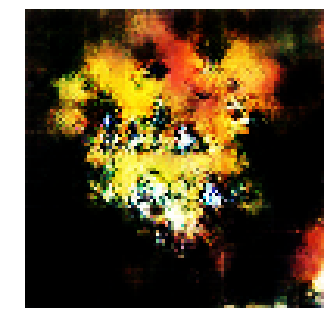


Epoch: 4220, D: -5.388, G: 3.006
Epoch: 4221, D: -9.393, G: 3.048
Epoch: 4222, D: -6.847, G: 3.364
Epoch: 4223, D: -7.629, G: 1.773
Epoch: 4224, D: -6.996, G: 5.276
Epoch: 4225, D: -7.778, G: 3.315
Epoch: 4226, D: -7.479, G: 1.425
Epoch: 4227, D: -7.293, G: 3.181
Epoch: 4228, D: -7.056, G: 6.148
Epoch: 4229, D: -6.244, G: 5.627
Epoch: 4230, D: -7.884, G: 3.858
Epoch: 4231, D: -7.148, G: 3.853
Epoch: 4232, D: -6.432, G: 3.091
Epoch: 4233, D: -8.594, G: 4.742
Epoch: 4234, D: -8.179, G: 5.623
Epoch: 4235, D: -7.378, G: 3.699
Epoch: 4236, D: -7.906, G: 3.734
Epoch: 4237, D: -9.551, G: 0.1749
Epoch: 4238, D: -8.244, G: 1.695
Epoch: 4239, D: -8.012, G: 2.441


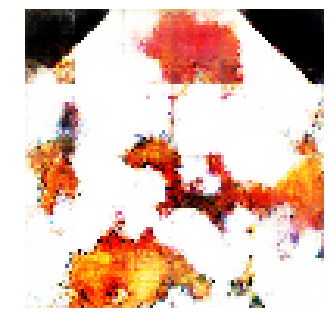


Epoch: 4240, D: -6.897, G: 3.48
Epoch: 4241, D: -5.989, G: 3.721
Epoch: 4242, D: -7.529, G: 2.168
Epoch: 4243, D: -8.054, G: 2.236
Epoch: 4244, D: -6.724, G: 3.437
Epoch: 4245, D: -6.195, G: 5.094
Epoch: 4246, D: -8.397, G: 1.317
Epoch: 4247, D: -7.574, G: 3.189
Epoch: 4248, D: -6.547, G: 3.066
Epoch: 4249, D: -7.07, G: 5.401
Epoch: 4250, D: -7.172, G: 5.047
Epoch: 4251, D: -7.831, G: 0.623
Epoch: 4252, D: -6.761, G: 3.894
Epoch: 4253, D: -8.049, G: 4.964
Epoch: 4254, D: -5.866, G: 2.409
Epoch: 4255, D: -6.279, G: 4.949
Epoch: 4256, D: -7.021, G: 3.695
Epoch: 4257, D: -6.972, G: 3.213
Epoch: 4258, D: -8.538, G: 6.27
Epoch: 4259, D: -5.937, G: 0.817


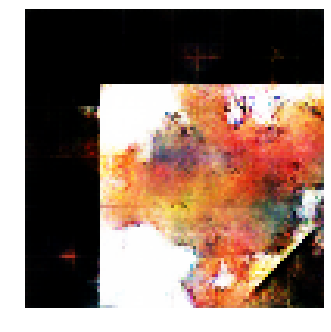


Epoch: 4260, D: -6.826, G: 2.594
Epoch: 4261, D: -7.561, G: 4.43
Epoch: 4262, D: -8.236, G: 2.183
Epoch: 4263, D: -6.908, G: 2.827
Epoch: 4264, D: -8.633, G: 4.655
Epoch: 4265, D: -6.126, G: 4.819
Epoch: 4266, D: -9.732, G: 5.946
Epoch: 4267, D: -10.21, G: 2.578
Epoch: 4268, D: -6.884, G: 3.803
Epoch: 4269, D: -8.115, G: 3.784
Epoch: 4270, D: -7.885, G: 1.627
Epoch: 4271, D: -9.419, G: 7.156
Epoch: 4272, D: -6.804, G: 2.943
Epoch: 4273, D: -8.108, G: 2.442
Epoch: 4274, D: -7.458, G: 3.004
Epoch: 4275, D: -7.613, G: 5.105
Epoch: 4276, D: -3.369, G: 3.967
Epoch: 4277, D: -8.793, G: 4.086
Epoch: 4278, D: -7.713, G: 3.178
Epoch: 4279, D: -7.754, G: 5.282


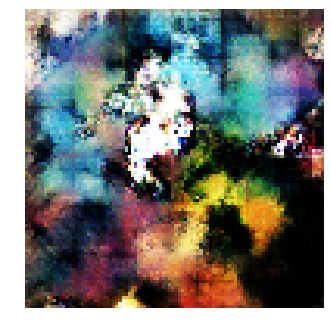


Epoch: 4280, D: -5.938, G: 4.766
Epoch: 4281, D: -5.964, G: 4.0
Epoch: 4282, D: -6.539, G: 0.6982
Epoch: 4283, D: -7.369, G: 3.715
Epoch: 4284, D: -7.303, G: 4.243
Epoch: 4285, D: -7.437, G: 5.683
Epoch: 4286, D: -9.012, G: 5.796
Epoch: 4287, D: -6.75, G: 4.119
Epoch: 4288, D: -7.612, G: 5.328
Epoch: 4289, D: -9.059, G: 4.73
Epoch: 4290, D: -7.959, G: 0.3653
Epoch: 4291, D: -7.446, G: 0.6916
Epoch: 4292, D: -8.216, G: -0.7472
Epoch: 4293, D: -5.917, G: 2.951
Epoch: 4294, D: -7.738, G: 3.851
Epoch: 4295, D: -6.497, G: 2.488
Epoch: 4296, D: -7.654, G: 6.831
Epoch: 4297, D: -8.624, G: 7.503
Epoch: 4298, D: -5.677, G: 4.735
Epoch: 4299, D: -7.818, G: 4.486


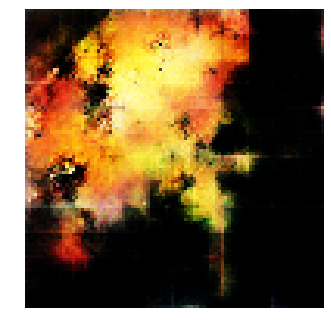


Epoch: 4300, D: -8.609, G: 2.574
Epoch: 4301, D: -6.855, G: 4.011
Epoch: 4302, D: -7.035, G: 1.66
Epoch: 4303, D: -6.247, G: 5.286
Epoch: 4304, D: -7.66, G: 4.294
Epoch: 4305, D: -6.47, G: 4.858
Epoch: 4306, D: -7.501, G: 4.456
Epoch: 4307, D: -6.44, G: 5.168
Epoch: 4308, D: -7.926, G: 2.675
Epoch: 4309, D: -7.788, G: 4.268
Epoch: 4310, D: -8.098, G: 3.739
Epoch: 4311, D: -7.801, G: 2.109
Epoch: 4312, D: -7.843, G: 4.436
Epoch: 4313, D: -9.223, G: 4.102
Epoch: 4314, D: -7.446, G: 0.1154
Epoch: 4315, D: -8.085, G: 3.618
Epoch: 4316, D: -9.335, G: 6.198
Epoch: 4317, D: -8.481, G: 3.394
Epoch: 4318, D: -7.345, G: 0.4456
Epoch: 4319, D: -7.493, G: 2.684


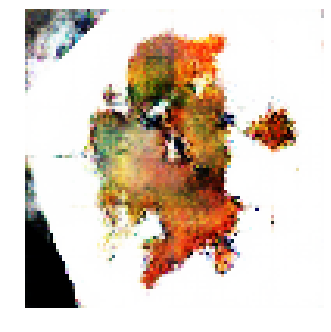


Epoch: 4320, D: -7.226, G: 4.613
Epoch: 4321, D: -9.332, G: 3.091
Epoch: 4322, D: -8.075, G: 4.137
Epoch: 4323, D: -6.851, G: 2.576
Epoch: 4324, D: -6.526, G: 3.966
Epoch: 4325, D: -7.474, G: 4.047
Epoch: 4326, D: -6.832, G: 4.752
Epoch: 4327, D: -6.706, G: 3.757
Epoch: 4328, D: -8.751, G: 3.885
Epoch: 4329, D: -7.706, G: 2.233
Epoch: 4330, D: -7.432, G: 1.876
Epoch: 4331, D: -6.58, G: 1.377
Epoch: 4332, D: -8.542, G: 0.887
Epoch: 4333, D: -8.616, G: 3.773
Epoch: 4334, D: -8.725, G: 4.304
Epoch: 4335, D: -6.519, G: 2.269
Epoch: 4336, D: -8.094, G: 5.179
Epoch: 4337, D: -6.856, G: 4.833
Epoch: 4338, D: -5.863, G: 4.375
Epoch: 4339, D: -6.638, G: 3.318


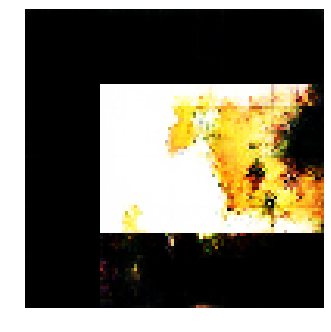


Epoch: 4340, D: -7.409, G: 1.991
Epoch: 4341, D: -7.26, G: 2.361
Epoch: 4342, D: -7.89, G: 4.973
Epoch: 4343, D: -5.036, G: 2.949
Epoch: 4344, D: -5.068, G: 5.235
Epoch: 4345, D: -7.55, G: 4.696
Epoch: 4346, D: -5.312, G: 3.245
Epoch: 4347, D: -7.536, G: 2.343
Epoch: 4348, D: -5.95, G: 4.428
Epoch: 4349, D: -7.119, G: 3.409
Epoch: 4350, D: -7.798, G: 4.048
Epoch: 4351, D: -6.838, G: 3.799
Epoch: 4352, D: -6.172, G: 4.278
Epoch: 4353, D: -3.889, G: 5.463
Epoch: 4354, D: -5.757, G: 3.833
Epoch: 4355, D: -6.326, G: 5.416
Epoch: 4356, D: -6.146, G: 3.347
Epoch: 4357, D: -7.776, G: 4.492
Epoch: 4358, D: -8.036, G: 3.581
Epoch: 4359, D: -7.022, G: 2.77


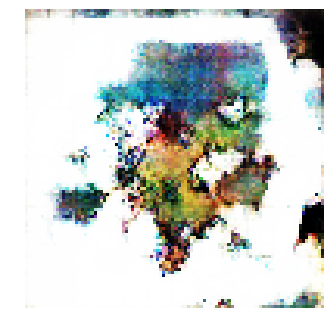


Epoch: 4360, D: -7.643, G: 4.388
Epoch: 4361, D: -7.479, G: 2.143
Epoch: 4362, D: -6.024, G: 4.94
Epoch: 4363, D: -5.982, G: 4.915
Epoch: 4364, D: -8.176, G: 2.836
Epoch: 4365, D: -8.349, G: 1.93
Epoch: 4366, D: -6.389, G: 1.978
Epoch: 4367, D: -7.564, G: 3.961
Epoch: 4368, D: -7.275, G: 5.177
Epoch: 4369, D: -5.835, G: 2.379
Epoch: 4370, D: -7.741, G: 4.578
Epoch: 4371, D: -7.948, G: 1.433
Epoch: 4372, D: -8.72, G: 3.13
Epoch: 4373, D: -5.486, G: 3.563
Epoch: 4374, D: -7.296, G: 3.25
Epoch: 4375, D: -6.263, G: 3.416
Epoch: 4376, D: -6.978, G: 4.226
Epoch: 4377, D: -8.767, G: 2.885
Epoch: 4378, D: -6.813, G: 1.582
Epoch: 4379, D: -7.423, G: 3.926


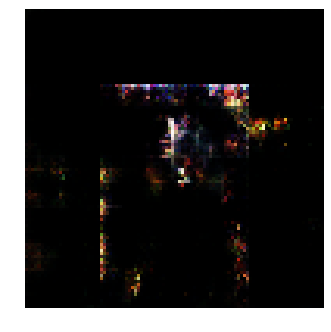


Epoch: 4380, D: -6.871, G: 4.617
Epoch: 4381, D: -8.166, G: 2.665
Epoch: 4382, D: -7.333, G: 4.091
Epoch: 4383, D: -5.035, G: 4.282
Epoch: 4384, D: -7.231, G: 3.179
Epoch: 4385, D: -6.959, G: 5.001
Epoch: 4386, D: -6.937, G: 1.651
Epoch: 4387, D: -10.95, G: 2.311
Epoch: 4388, D: -7.085, G: 1.283
Epoch: 4389, D: -6.118, G: 11.2
Epoch: 4390, D: -8.213, G: 1.032
Epoch: 4391, D: -7.313, G: 5.089
Epoch: 4392, D: -7.21, G: 2.773
Epoch: 4393, D: -7.312, G: 5.521
Epoch: 4394, D: -9.282, G: 6.73
Epoch: 4395, D: -7.062, G: 2.267
Epoch: 4396, D: -7.761, G: 4.794
Epoch: 4397, D: -9.356, G: 4.352
Epoch: 4398, D: -7.877, G: 2.503
Epoch: 4399, D: -8.334, G: 1.547


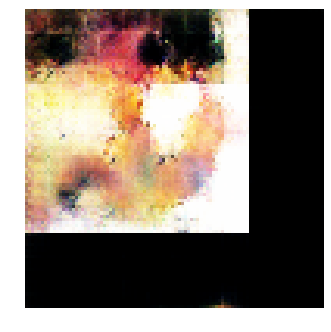


Epoch: 4400, D: -8.428, G: 1.394
Epoch: 4401, D: -6.691, G: 2.163
Epoch: 4402, D: -8.312, G: 3.517
Epoch: 4403, D: -7.059, G: 1.838
Epoch: 4404, D: -8.526, G: 4.124
Epoch: 4405, D: -7.911, G: 3.641
Epoch: 4406, D: -7.485, G: 2.208
Epoch: 4407, D: -7.302, G: 3.017
Epoch: 4408, D: -5.647, G: 1.548
Epoch: 4409, D: -6.353, G: 2.177
Epoch: 4410, D: -7.017, G: 2.848
Epoch: 4411, D: -7.181, G: 3.567
Epoch: 4412, D: -7.586, G: 5.514
Epoch: 4413, D: -7.168, G: 2.111
Epoch: 4414, D: -7.729, G: 2.742
Epoch: 4415, D: -9.193, G: 1.577
Epoch: 4416, D: -8.794, G: 0.8958
Epoch: 4417, D: -8.933, G: 2.585
Epoch: 4418, D: -7.506, G: 2.233
Epoch: 4419, D: -6.941, G: 2.24


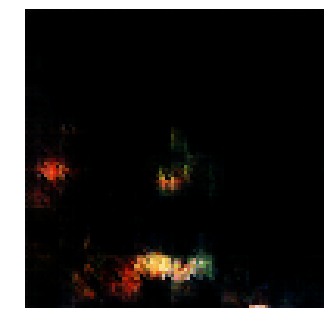


Epoch: 4420, D: -7.213, G: 4.733
Epoch: 4421, D: -7.341, G: 4.114
Epoch: 4422, D: -7.356, G: 0.917
Epoch: 4423, D: -7.515, G: 3.282
Epoch: 4424, D: -8.337, G: 4.726
Epoch: 4425, D: -7.426, G: 6.172
Epoch: 4426, D: -6.349, G: -0.1397
Epoch: 4427, D: -6.558, G: 1.926
Epoch: 4428, D: -5.399, G: 2.592
Epoch: 4429, D: -6.652, G: 2.246
Epoch: 4430, D: -7.245, G: 3.735
Epoch: 4431, D: -8.914, G: 2.697
Epoch: 4432, D: -7.858, G: 2.366
Epoch: 4433, D: -6.481, G: 4.741
Epoch: 4434, D: -6.779, G: 2.881
Epoch: 4435, D: -7.264, G: 3.386
Epoch: 4436, D: -7.566, G: 3.605
Epoch: 4437, D: -7.679, G: 4.062
Epoch: 4438, D: -7.096, G: 3.625
Epoch: 4439, D: -6.805, G: 5.958


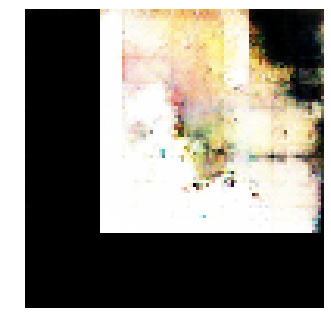


Epoch: 4440, D: -6.197, G: 4.983
Epoch: 4441, D: -7.742, G: 2.866
Epoch: 4442, D: -7.423, G: 5.12
Epoch: 4443, D: -7.086, G: 6.303
Epoch: 4444, D: -6.629, G: 4.054
Epoch: 4445, D: -7.143, G: 3.966
Epoch: 4446, D: -5.87, G: 2.8
Epoch: 4447, D: -6.064, G: 3.126
Epoch: 4448, D: -7.858, G: 5.373
Epoch: 4449, D: -7.676, G: 2.894
Epoch: 4450, D: -7.044, G: 2.558
Epoch: 4451, D: -7.78, G: 5.171
Epoch: 4452, D: -6.996, G: 1.636
Epoch: 4453, D: -8.062, G: 4.627
Epoch: 4454, D: -8.608, G: -1.053
Epoch: 4455, D: -6.813, G: 2.973
Epoch: 4456, D: -9.119, G: 4.45
Epoch: 4457, D: -7.009, G: 4.299
Epoch: 4458, D: -6.979, G: 4.462
Epoch: 4459, D: -8.41, G: 5.182


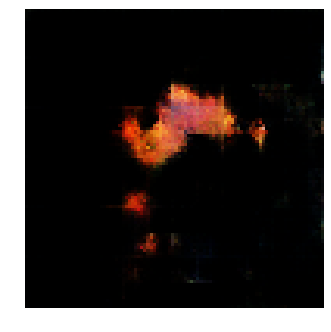


Epoch: 4460, D: -6.213, G: 3.277
Epoch: 4461, D: -5.896, G: 4.964
Epoch: 4462, D: -5.835, G: 3.329
Epoch: 4463, D: -8.504, G: 2.914
Epoch: 4464, D: -4.949, G: 3.206
Epoch: 4465, D: -6.94, G: 2.928
Epoch: 4466, D: -6.667, G: 4.578
Epoch: 4467, D: -7.531, G: 0.1954
Epoch: 4468, D: -7.458, G: 4.673
Epoch: 4469, D: -8.95, G: 6.157
Epoch: 4470, D: -8.149, G: 1.279
Epoch: 4471, D: -7.21, G: 1.924
Epoch: 4472, D: -7.549, G: 4.745
Epoch: 4473, D: -8.557, G: 4.598
Epoch: 4474, D: -7.824, G: 0.5479
Epoch: 4475, D: -7.749, G: 2.628
Epoch: 4476, D: -6.164, G: 2.651
Epoch: 4477, D: -7.268, G: 5.525
Epoch: 4478, D: -9.204, G: 2.824
Epoch: 4479, D: -8.594, G: -0.5262


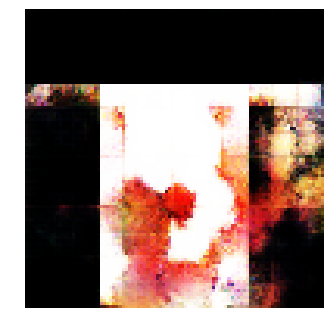


Epoch: 4480, D: -7.376, G: 3.927
Epoch: 4481, D: -7.357, G: 2.328
Epoch: 4482, D: -6.123, G: 3.33
Epoch: 4483, D: -6.922, G: 4.61
Epoch: 4484, D: -8.273, G: 4.814
Epoch: 4485, D: -8.833, G: 1.15
Epoch: 4486, D: -5.744, G: 3.854
Epoch: 4487, D: -8.327, G: 5.653
Epoch: 4488, D: -7.87, G: 2.586
Epoch: 4489, D: -8.391, G: -0.1185
Epoch: 4490, D: -9.033, G: 5.448
Epoch: 4491, D: -7.268, G: 4.546
Epoch: 4492, D: -7.193, G: 3.884
Epoch: 4493, D: -8.722, G: 3.448
Epoch: 4494, D: -7.122, G: 3.457
Epoch: 4495, D: -7.077, G: 0.6695
Epoch: 4496, D: -8.523, G: 0.4396
Epoch: 4497, D: -6.963, G: 2.835
Epoch: 4498, D: -7.746, G: 3.767
Epoch: 4499, D: -6.783, G: 1.281


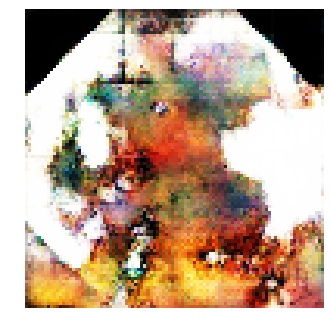


Epoch: 4500, D: -7.755, G: 3.082
Epoch: 4501, D: -7.233, G: 5.183
Epoch: 4502, D: -7.104, G: 4.714
Epoch: 4503, D: -6.056, G: 2.747
Epoch: 4504, D: -6.587, G: 2.505
Epoch: 4505, D: -7.23, G: 3.537
Epoch: 4506, D: -7.413, G: 7.36
Epoch: 4507, D: -5.823, G: 1.577
Epoch: 4508, D: -7.178, G: 1.913
Epoch: 4509, D: -6.815, G: 3.605
Epoch: 4510, D: -4.197, G: 1.612
Epoch: 4511, D: -7.424, G: 5.5
Epoch: 4512, D: -5.083, G: 2.399
Epoch: 4513, D: -6.102, G: 3.831
Epoch: 4514, D: -5.872, G: 6.182
Epoch: 4515, D: -8.162, G: 3.58
Epoch: 4516, D: -7.819, G: 2.765
Epoch: 4517, D: -9.077, G: 3.201
Epoch: 4518, D: -6.822, G: 3.37
Epoch: 4519, D: -8.481, G: 5.992


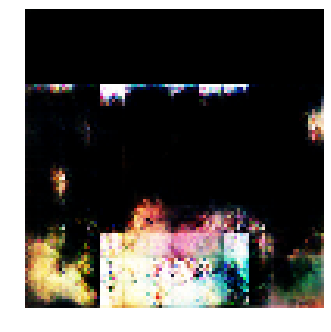


Epoch: 4520, D: -7.494, G: 4.382
Epoch: 4521, D: -7.303, G: 2.808
Epoch: 4522, D: -7.711, G: 8.842
Epoch: 4523, D: -8.648, G: 4.207
Epoch: 4524, D: -6.18, G: 2.103
Epoch: 4525, D: -8.327, G: 4.27
Epoch: 4526, D: -7.099, G: 4.189
Epoch: 4527, D: -8.058, G: 1.759
Epoch: 4528, D: -9.084, G: 1.494
Epoch: 4529, D: -8.822, G: 2.598
Epoch: 4530, D: -8.127, G: 3.27
Epoch: 4531, D: -7.716, G: 2.145
Epoch: 4532, D: -8.278, G: 2.529
Epoch: 4533, D: -6.925, G: 5.119
Epoch: 4534, D: -7.741, G: 4.054
Epoch: 4535, D: -6.028, G: 5.004
Epoch: 4536, D: -7.923, G: 1.237
Epoch: 4537, D: -8.236, G: 2.954
Epoch: 4538, D: -8.985, G: 4.142
Epoch: 4539, D: -6.022, G: 1.311


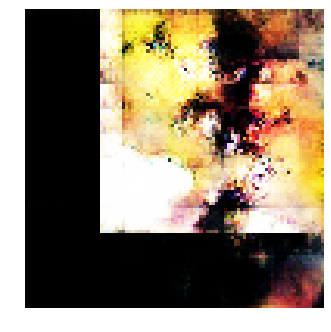


Epoch: 4540, D: -7.73, G: 1.279
Epoch: 4541, D: -7.106, G: 3.262
Epoch: 4542, D: -6.774, G: 5.507
Epoch: 4543, D: -6.729, G: 0.9835
Epoch: 4544, D: -7.035, G: 2.943
Epoch: 4545, D: -6.823, G: 3.222
Epoch: 4546, D: -8.465, G: 3.06
Epoch: 4547, D: -5.942, G: 1.923
Epoch: 4548, D: -5.675, G: 1.898
Epoch: 4549, D: -8.345, G: 3.678
Epoch: 4550, D: -9.25, G: 0.9389
Epoch: 4551, D: -8.02, G: 3.193
Epoch: 4552, D: -4.819, G: 1.816
Epoch: 4553, D: -6.375, G: 6.701
Epoch: 4554, D: -8.987, G: 3.606
Epoch: 4555, D: -7.819, G: 2.775
Epoch: 4556, D: -7.517, G: 1.786
Epoch: 4557, D: -5.944, G: 2.942
Epoch: 4558, D: -6.491, G: 5.665
Epoch: 4559, D: -7.331, G: 4.768


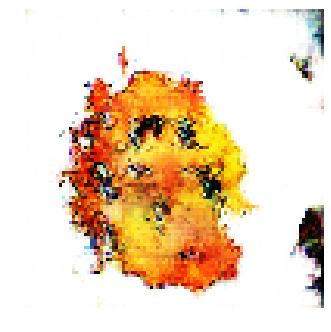


Epoch: 4560, D: -6.553, G: 4.283
Epoch: 4561, D: -6.505, G: 4.626
Epoch: 4562, D: -5.87, G: 7.796
Epoch: 4563, D: -5.91, G: 3.263
Epoch: 4564, D: -7.837, G: 3.539
Epoch: 4565, D: -8.442, G: 3.89
Epoch: 4566, D: -6.718, G: 1.247
Epoch: 4567, D: -6.988, G: 3.004
Epoch: 4568, D: -5.665, G: 2.386
Epoch: 4569, D: -5.28, G: 4.404
Epoch: 4570, D: -6.511, G: 2.449
Epoch: 4571, D: -6.645, G: 7.3
Epoch: 4572, D: -6.681, G: 3.026
Epoch: 4573, D: -7.564, G: 3.604
Epoch: 4574, D: -8.036, G: 3.6
Epoch: 4575, D: -8.399, G: 2.308
Epoch: 4576, D: -7.424, G: 4.289
Epoch: 4577, D: -7.81, G: 1.789
Epoch: 4578, D: -6.918, G: 0.8665
Epoch: 4579, D: -8.109, G: 2.205


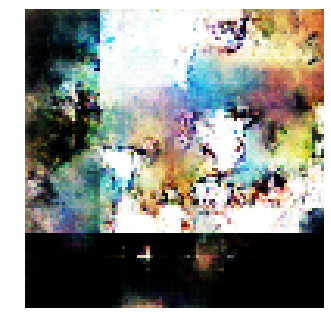


Epoch: 4580, D: -6.866, G: 1.299
Epoch: 4581, D: -6.81, G: 2.948
Epoch: 4582, D: -8.787, G: 4.899
Epoch: 4583, D: -8.325, G: 3.224
Epoch: 4584, D: -6.01, G: 3.338
Epoch: 4585, D: -7.331, G: 4.337
Epoch: 4586, D: -8.092, G: 3.164
Epoch: 4587, D: -8.459, G: 3.993
Epoch: 4588, D: -7.864, G: 4.098
Epoch: 4589, D: -4.605, G: 2.96
Epoch: 4590, D: -7.383, G: 4.316
Epoch: 4591, D: -7.921, G: 2.748
Epoch: 4592, D: -6.998, G: 3.098
Epoch: 4593, D: -6.864, G: 5.347
Epoch: 4594, D: -8.44, G: 1.447
Epoch: 4595, D: -7.034, G: 1.757
Epoch: 4596, D: -7.565, G: 3.935
Epoch: 4597, D: -6.363, G: 5.917
Epoch: 4598, D: -8.196, G: 3.809
Epoch: 4599, D: -7.095, G: 5.057


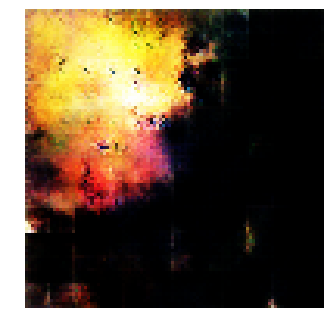


Epoch: 4600, D: -6.148, G: 7.124
Epoch: 4601, D: -7.031, G: 3.352
Epoch: 4602, D: -6.918, G: 3.137
Epoch: 4603, D: -6.504, G: 2.019
Epoch: 4604, D: -7.379, G: 3.996
Epoch: 4605, D: -7.005, G: 5.618
Epoch: 4606, D: -7.914, G: 5.737
Epoch: 4607, D: -8.642, G: 1.091
Epoch: 4608, D: -5.947, G: 2.078
Epoch: 4609, D: -8.179, G: 3.015
Epoch: 4610, D: -7.186, G: 1.826
Epoch: 4611, D: -7.103, G: 5.44
Epoch: 4612, D: -6.664, G: 1.864
Epoch: 4613, D: -7.83, G: 2.914
Epoch: 4614, D: -7.703, G: 2.46
Epoch: 4615, D: -6.536, G: 4.948
Epoch: 4616, D: -6.719, G: 4.1
Epoch: 4617, D: -7.531, G: 3.639
Epoch: 4618, D: -7.428, G: 5.155
Epoch: 4619, D: -7.607, G: 4.996


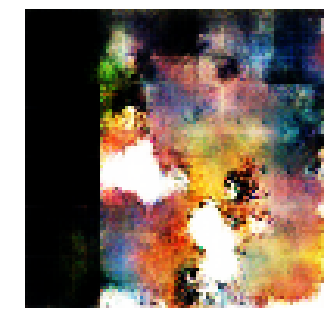


Epoch: 4620, D: -5.864, G: 2.863
Epoch: 4621, D: -7.947, G: 3.654
Epoch: 4622, D: -7.255, G: 1.698
Epoch: 4623, D: -6.372, G: 6.301
Epoch: 4624, D: -7.493, G: 6.471
Epoch: 4625, D: -7.436, G: 4.081
Epoch: 4626, D: -5.933, G: 3.227
Epoch: 4627, D: -7.552, G: 3.313
Epoch: 4628, D: -7.442, G: 2.982
Epoch: 4629, D: -7.64, G: 1.784
Epoch: 4630, D: -5.882, G: 6.088
Epoch: 4631, D: -7.838, G: 4.074
Epoch: 4632, D: -7.307, G: 4.966
Epoch: 4633, D: -5.408, G: 3.068
Epoch: 4634, D: -5.997, G: 2.801
Epoch: 4635, D: -7.579, G: 3.312
Epoch: 4636, D: -6.449, G: 4.428
Epoch: 4637, D: -8.093, G: 4.312
Epoch: 4638, D: -6.111, G: 4.726
Epoch: 4639, D: -7.47, G: 2.972


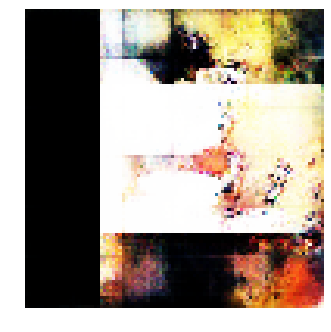


Epoch: 4640, D: -7.191, G: 3.12
Epoch: 4641, D: -6.819, G: 3.485
Epoch: 4642, D: -7.369, G: 4.118
Epoch: 4643, D: -6.513, G: 2.815
Epoch: 4644, D: -4.802, G: 5.421
Epoch: 4645, D: -6.676, G: 7.263
Epoch: 4646, D: -7.265, G: 5.74
Epoch: 4647, D: -8.362, G: -1.874
Epoch: 4648, D: -6.417, G: 3.058
Epoch: 4649, D: -5.865, G: 2.851
Epoch: 4650, D: -6.847, G: 0.3211
Epoch: 4651, D: -7.564, G: -0.02584
Epoch: 4652, D: -9.122, G: 2.375
Epoch: 4653, D: -7.392, G: 1.203
Epoch: 4654, D: -7.322, G: 1.865
Epoch: 4655, D: -9.199, G: 6.2
Epoch: 4656, D: -7.568, G: 5.896
Epoch: 4657, D: -8.711, G: 5.721
Epoch: 4658, D: -7.392, G: 5.708
Epoch: 4659, D: -9.066, G: 2.656


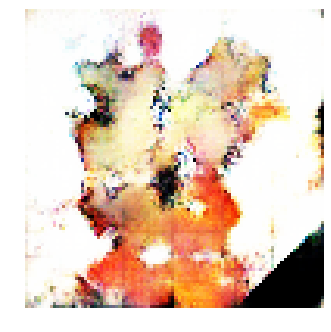


Epoch: 4660, D: -8.047, G: 3.49
Epoch: 4661, D: -7.614, G: 3.856
Epoch: 4662, D: -7.138, G: 2.527
Epoch: 4663, D: -6.46, G: 3.739
Epoch: 4664, D: -7.82, G: 4.344
Epoch: 4665, D: -6.617, G: 4.292
Epoch: 4666, D: -6.773, G: 7.867
Epoch: 4667, D: -7.701, G: 5.878
Epoch: 4668, D: -8.299, G: 1.195
Epoch: 4669, D: -7.222, G: 4.175
Epoch: 4670, D: -8.045, G: 1.723
Epoch: 4671, D: -6.552, G: 3.519
Epoch: 4672, D: -7.448, G: 1.642
Epoch: 4673, D: -8.071, G: 3.582
Epoch: 4674, D: -8.058, G: 2.156
Epoch: 4675, D: -8.379, G: 2.817
Epoch: 4676, D: -8.592, G: 3.107
Epoch: 4677, D: -6.598, G: 3.145
Epoch: 4678, D: -6.299, G: 1.537
Epoch: 4679, D: -8.749, G: 2.535


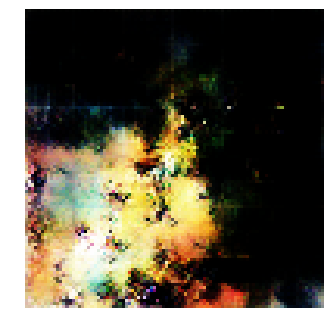


Epoch: 4680, D: -5.656, G: 1.887
Epoch: 4681, D: -9.1, G: 3.166
Epoch: 4682, D: -6.123, G: 2.798
Epoch: 4683, D: -6.714, G: 4.716
Epoch: 4684, D: -6.8, G: 1.957
Epoch: 4685, D: -6.443, G: 2.987
Epoch: 4686, D: -7.227, G: 5.08
Epoch: 4687, D: -7.806, G: 2.887
Epoch: 4688, D: -6.595, G: 1.463
Epoch: 4689, D: -5.95, G: 3.516
Epoch: 4690, D: -5.745, G: 2.909
Epoch: 4691, D: -7.459, G: 3.709
Epoch: 4692, D: -6.744, G: 1.13
Epoch: 4693, D: -6.516, G: 2.993
Epoch: 4694, D: -8.031, G: 2.827
Epoch: 4695, D: -7.176, G: 4.822
Epoch: 4696, D: -8.847, G: 6.555
Epoch: 4697, D: -7.879, G: 1.671
Epoch: 4698, D: -7.577, G: 4.956
Epoch: 4699, D: -4.33, G: 1.417


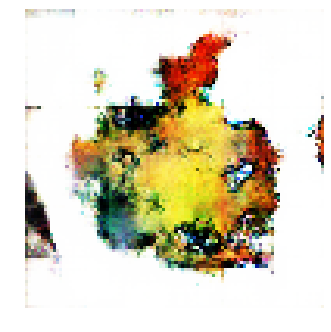


Epoch: 4700, D: -8.104, G: 3.913
Epoch: 4701, D: -7.61, G: 2.233
Epoch: 4702, D: -8.275, G: 3.184
Epoch: 4703, D: -7.052, G: 5.404
Epoch: 4704, D: -9.017, G: 2.838
Epoch: 4705, D: -4.845, G: -0.4026
Epoch: 4706, D: -7.261, G: 3.96
Epoch: 4707, D: -6.188, G: 3.766
Epoch: 4708, D: -8.13, G: 3.588
Epoch: 4709, D: -7.125, G: 2.642
Epoch: 4710, D: -7.84, G: 2.024
Epoch: 4711, D: -6.857, G: 3.635
Epoch: 4712, D: -6.574, G: 5.131
Epoch: 4713, D: -7.268, G: 3.069
Epoch: 4714, D: -6.198, G: 1.011
Epoch: 4715, D: -6.783, G: 5.262
Epoch: 4716, D: -5.857, G: 4.124
Epoch: 4717, D: -7.003, G: 4.298
Epoch: 4718, D: -7.13, G: 4.806
Epoch: 4719, D: -8.851, G: 2.012


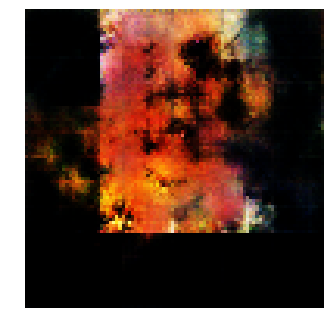


Epoch: 4720, D: -6.844, G: 5.771
Epoch: 4721, D: -6.851, G: 1.413
Epoch: 4722, D: -6.651, G: 5.397
Epoch: 4723, D: -7.938, G: 3.355
Epoch: 4724, D: -7.149, G: 2.385
Epoch: 4725, D: -8.136, G: 3.352
Epoch: 4726, D: -7.389, G: 5.46
Epoch: 4727, D: -8.567, G: 6.592
Epoch: 4728, D: -7.301, G: 2.41
Epoch: 4729, D: -7.975, G: 4.173
Epoch: 4730, D: -5.579, G: 3.727
Epoch: 4731, D: -7.203, G: 2.629
Epoch: 4732, D: -6.226, G: 5.638
Epoch: 4733, D: -6.935, G: 2.195
Epoch: 4734, D: -7.95, G: 3.803
Epoch: 4735, D: -5.817, G: 4.707
Epoch: 4736, D: -6.156, G: 4.878
Epoch: 4737, D: -8.119, G: 4.808
Epoch: 4738, D: -6.708, G: 5.743
Epoch: 4739, D: -7.613, G: 2.573


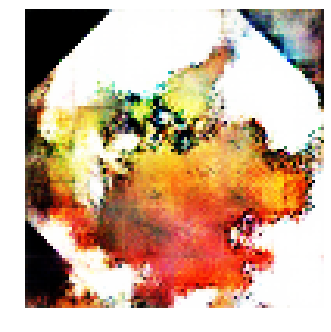


Epoch: 4740, D: -7.026, G: 2.171
Epoch: 4741, D: -7.285, G: 3.387
Epoch: 4742, D: -7.188, G: 4.553
Epoch: 4743, D: -7.093, G: 1.089
Epoch: 4744, D: -6.737, G: 3.898
Epoch: 4745, D: -7.377, G: 2.447
Epoch: 4746, D: -6.806, G: 3.421
Epoch: 4747, D: -6.237, G: 4.881
Epoch: 4748, D: -7.061, G: 3.869
Epoch: 4749, D: -7.309, G: 5.047
Epoch: 4750, D: -6.782, G: 1.592
Epoch: 4751, D: -7.315, G: 1.613
Epoch: 4752, D: -8.141, G: 4.615
Epoch: 4753, D: -5.733, G: 2.985
Epoch: 4754, D: -7.48, G: 2.357
Epoch: 4755, D: -9.005, G: 4.351
Epoch: 4756, D: -7.128, G: 4.168
Epoch: 4757, D: -7.701, G: 4.026
Epoch: 4758, D: -6.918, G: 3.285
Epoch: 4759, D: -7.729, G: 4.218


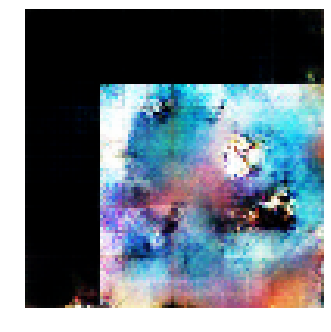


Epoch: 4760, D: -6.915, G: 1.13
Epoch: 4761, D: -6.688, G: 5.43
Epoch: 4762, D: -7.95, G: 3.588
Epoch: 4763, D: -7.435, G: 1.342
Epoch: 4764, D: -8.033, G: 3.74
Epoch: 4765, D: -4.857, G: 4.423
Epoch: 4766, D: -7.61, G: 2.458
Epoch: 4767, D: -6.632, G: 5.175
Epoch: 4768, D: -8.206, G: 4.251
Epoch: 4769, D: -8.533, G: 2.092
Epoch: 4770, D: -7.48, G: -0.1598
Epoch: 4771, D: -6.349, G: 0.2241
Epoch: 4772, D: -7.235, G: 3.076
Epoch: 4773, D: -5.999, G: 3.478
Epoch: 4774, D: -8.88, G: 1.514
Epoch: 4775, D: -6.65, G: 3.605
Epoch: 4776, D: -7.115, G: 5.216
Epoch: 4777, D: -7.198, G: 4.233
Epoch: 4778, D: -7.638, G: 4.252
Epoch: 4779, D: -6.397, G: 3.501


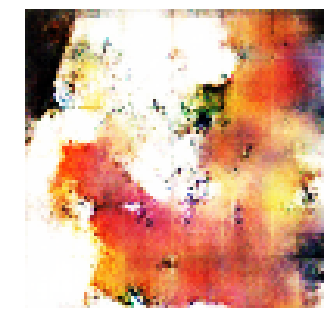


Epoch: 4780, D: -7.537, G: 2.841
Epoch: 4781, D: -7.648, G: 7.09
Epoch: 4782, D: -7.385, G: 4.101
Epoch: 4783, D: -7.704, G: 1.9
Epoch: 4784, D: -7.605, G: 4.089
Epoch: 4785, D: -5.506, G: 5.556
Epoch: 4786, D: -7.333, G: 4.242
Epoch: 4787, D: -8.923, G: 1.328
Epoch: 4788, D: -5.865, G: 0.9763
Epoch: 4789, D: -7.928, G: 2.196
Epoch: 4790, D: -10.15, G: 2.375
Epoch: 4791, D: -7.813, G: 0.9383
Epoch: 4792, D: -6.557, G: 2.908
Epoch: 4793, D: -6.547, G: 1.557
Epoch: 4794, D: -7.762, G: 1.71
Epoch: 4795, D: -6.12, G: 2.847
Epoch: 4796, D: -7.565, G: 6.67
Epoch: 4797, D: -7.347, G: 6.338
Epoch: 4798, D: -6.429, G: 3.516
Epoch: 4799, D: -8.869, G: 1.747


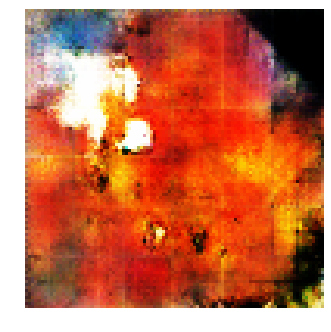


Epoch: 4800, D: -6.611, G: 2.392
Epoch: 4801, D: -8.543, G: 6.988
Epoch: 4802, D: -6.327, G: 4.31
Epoch: 4803, D: -7.201, G: 4.605
Epoch: 4804, D: -8.928, G: 1.312
Epoch: 4805, D: -5.553, G: 2.922
Epoch: 4806, D: -8.518, G: 2.362
Epoch: 4807, D: -6.748, G: 0.5925
Epoch: 4808, D: -8.918, G: 5.551
Epoch: 4809, D: -6.664, G: -0.3107
Epoch: 4810, D: -8.057, G: 4.897
Epoch: 4811, D: -7.395, G: 3.752
Epoch: 4812, D: -8.238, G: 2.001
Epoch: 4813, D: -7.571, G: 3.648
Epoch: 4814, D: -8.805, G: 3.668
Epoch: 4815, D: -6.81, G: 1.912
Epoch: 4816, D: -7.201, G: 1.184
Epoch: 4817, D: -5.122, G: 5.074
Epoch: 4818, D: -5.524, G: 4.012
Epoch: 4819, D: -8.44, G: 2.762


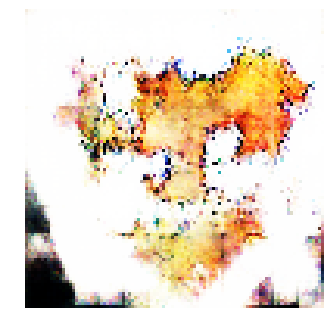


Epoch: 4820, D: -7.658, G: 1.076
Epoch: 4821, D: -6.862, G: 3.841
Epoch: 4822, D: -7.241, G: 4.347
Epoch: 4823, D: -7.227, G: 3.052
Epoch: 4824, D: -7.146, G: 5.068
Epoch: 4825, D: -7.953, G: 3.422
Epoch: 4826, D: -7.522, G: 6.498
Epoch: 4827, D: -5.768, G: 6.308
Epoch: 4828, D: -7.347, G: 3.521
Epoch: 4829, D: -9.215, G: 3.459
Epoch: 4830, D: -8.027, G: 3.128
Epoch: 4831, D: -6.679, G: 4.528
Epoch: 4832, D: -7.859, G: 5.0
Epoch: 4833, D: -7.54, G: 3.544
Epoch: 4834, D: -7.793, G: 4.666
Epoch: 4835, D: -5.762, G: 0.904
Epoch: 4836, D: -5.812, G: 1.785
Epoch: 4837, D: -6.228, G: 2.774
Epoch: 4838, D: -7.304, G: 2.82
Epoch: 4839, D: -7.102, G: 5.377


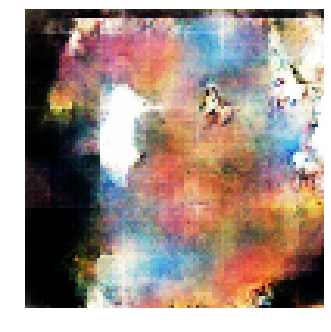


Epoch: 4840, D: -6.957, G: 1.022
Epoch: 4841, D: -7.108, G: 0.6811
Epoch: 4842, D: -8.157, G: 0.6403
Epoch: 4843, D: -7.593, G: -0.3361
Epoch: 4844, D: -6.377, G: 1.626
Epoch: 4845, D: -6.403, G: 4.175
Epoch: 4846, D: -6.622, G: 6.262
Epoch: 4847, D: -7.55, G: 0.8162
Epoch: 4848, D: -7.307, G: 3.198
Epoch: 4849, D: -6.743, G: 3.928
Epoch: 4850, D: -7.545, G: 0.7044
Epoch: 4851, D: -6.149, G: 2.919
Epoch: 4852, D: -6.309, G: 3.086
Epoch: 4853, D: -7.977, G: 5.848
Epoch: 4854, D: -6.809, G: 8.331
Epoch: 4855, D: -6.568, G: 2.37
Epoch: 4856, D: -7.871, G: 4.539
Epoch: 4857, D: -7.566, G: 2.374
Epoch: 4858, D: -6.415, G: 1.015
Epoch: 4859, D: -5.838, G: 1.796


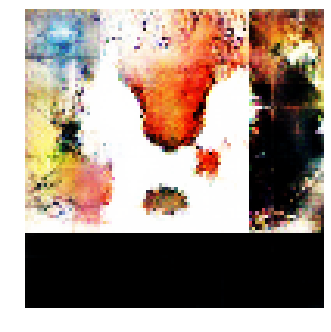


Epoch: 4860, D: -7.808, G: 0.8202
Epoch: 4861, D: -8.224, G: 0.6323
Epoch: 4862, D: -8.609, G: 1.865
Epoch: 4863, D: -6.616, G: -0.5722
Epoch: 4864, D: -4.733, G: 3.257
Epoch: 4865, D: -8.085, G: 5.473
Epoch: 4866, D: -7.136, G: 5.092
Epoch: 4867, D: -7.245, G: 2.479
Epoch: 4868, D: -7.924, G: 4.591
Epoch: 4869, D: -6.654, G: 1.587
Epoch: 4870, D: -5.98, G: 4.344
Epoch: 4871, D: -7.301, G: 5.563
Epoch: 4872, D: -7.686, G: 5.18
Epoch: 4873, D: -6.682, G: 2.953
Epoch: 4874, D: -6.707, G: 5.246
Epoch: 4875, D: -7.496, G: 4.625
Epoch: 4876, D: -7.31, G: 6.34
Epoch: 4877, D: -7.25, G: 4.005
Epoch: 4878, D: -8.18, G: -1.511
Epoch: 4879, D: -7.746, G: 3.703


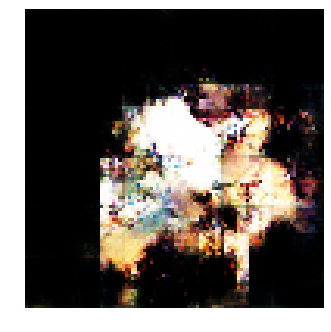


Epoch: 4880, D: -7.484, G: 6.801
Epoch: 4881, D: -8.335, G: 3.984
Epoch: 4882, D: -6.547, G: 2.919
Epoch: 4883, D: -8.037, G: 2.173
Epoch: 4884, D: -6.653, G: 2.611
Epoch: 4885, D: -7.256, G: 3.943
Epoch: 4886, D: -7.093, G: 3.129
Epoch: 4887, D: -8.104, G: 3.378
Epoch: 4888, D: -7.853, G: 3.8
Epoch: 4889, D: -7.832, G: 5.805
Epoch: 4890, D: -8.303, G: 4.379
Epoch: 4891, D: -6.633, G: 5.663
Epoch: 4892, D: -6.274, G: 3.728
Epoch: 4893, D: -6.708, G: 4.698
Epoch: 4894, D: -6.029, G: 5.6
Epoch: 4895, D: -7.177, G: 3.617
Epoch: 4896, D: -8.583, G: 3.95
Epoch: 4897, D: -5.866, G: 0.9201
Epoch: 4898, D: -7.928, G: 2.858
Epoch: 4899, D: -7.317, G: 3.097


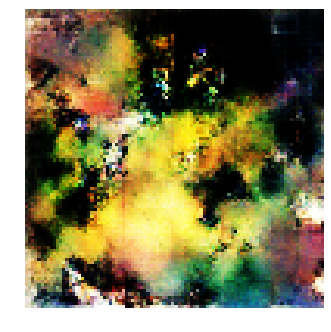


Epoch: 4900, D: -7.958, G: 5.074
Epoch: 4901, D: -7.192, G: 2.955
Epoch: 4902, D: -7.37, G: 1.94
Epoch: 4903, D: -7.325, G: 4.564
Epoch: 4904, D: -5.975, G: 2.677
Epoch: 4905, D: -6.906, G: 4.872
Epoch: 4906, D: -7.287, G: 3.027
Epoch: 4907, D: -7.549, G: 5.533
Epoch: 4908, D: -5.794, G: 2.331
Epoch: 4909, D: -7.727, G: 3.153
Epoch: 4910, D: -6.736, G: 0.04852
Epoch: 4911, D: -7.281, G: 1.97
Epoch: 4912, D: -6.84, G: 2.751
Epoch: 4913, D: -8.083, G: 1.832
Epoch: 4914, D: -6.697, G: 1.275
Epoch: 4915, D: -7.622, G: 3.378
Epoch: 4916, D: -7.097, G: 1.794
Epoch: 4917, D: -6.778, G: 2.471
Epoch: 4918, D: -6.371, G: 4.994
Epoch: 4919, D: -6.346, G: 5.093


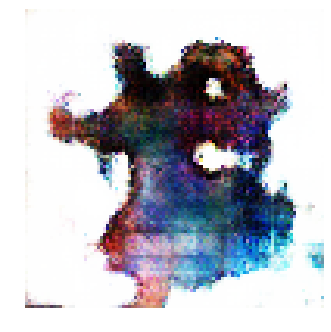


Epoch: 4920, D: -7.107, G: 5.449
Epoch: 4921, D: -7.283, G: 2.177
Epoch: 4922, D: -6.561, G: 1.223
Epoch: 4923, D: -6.561, G: 4.173
Epoch: 4924, D: -8.166, G: 4.185
Epoch: 4925, D: -7.169, G: 3.782
Epoch: 4926, D: -7.297, G: 1.953
Epoch: 4927, D: -6.313, G: 2.612
Epoch: 4928, D: -6.994, G: 2.927
Epoch: 4929, D: -9.122, G: 3.798
Epoch: 4930, D: -7.776, G: 5.587
Epoch: 4931, D: -7.386, G: 3.726
Epoch: 4932, D: -7.101, G: 3.293
Epoch: 4933, D: -9.398, G: 7.454
Epoch: 4934, D: -6.35, G: 2.912
Epoch: 4935, D: -5.457, G: 2.266
Epoch: 4936, D: -7.939, G: 3.293
Epoch: 4937, D: -5.506, G: 2.444
Epoch: 4938, D: -6.57, G: 4.41
Epoch: 4939, D: -7.188, G: 6.294


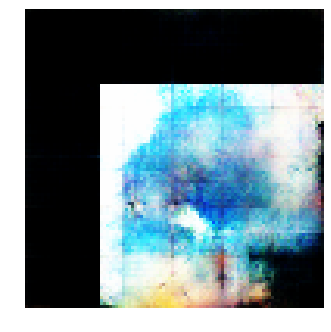


Epoch: 4940, D: -6.644, G: 3.476
Epoch: 4941, D: -6.053, G: 3.249
Epoch: 4942, D: -7.072, G: 4.368
Epoch: 4943, D: -8.295, G: 3.356
Epoch: 4944, D: -6.41, G: 3.222
Epoch: 4945, D: -7.492, G: 2.798
Epoch: 4946, D: -6.349, G: 6.523
Epoch: 4947, D: -6.132, G: 2.377
Epoch: 4948, D: -8.264, G: 4.351
Epoch: 4949, D: -8.678, G: 4.6
Epoch: 4950, D: -7.675, G: 3.124
Epoch: 4951, D: -7.441, G: 3.222
Epoch: 4952, D: -6.612, G: 4.462
Epoch: 4953, D: -8.102, G: 3.542
Epoch: 4954, D: -6.915, G: 3.28
Epoch: 4955, D: -7.666, G: 4.34
Epoch: 4956, D: -7.962, G: 2.807
Epoch: 4957, D: -8.368, G: 5.894
Epoch: 4958, D: -5.134, G: 4.773
Epoch: 4959, D: -6.648, G: 2.65


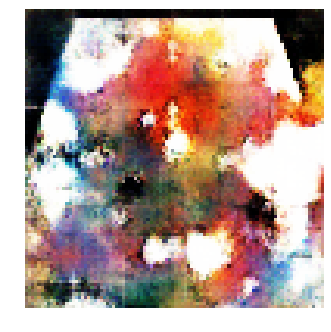


Epoch: 4960, D: -8.595, G: 3.656
Epoch: 4961, D: -9.385, G: 0.208
Epoch: 4962, D: -6.028, G: 3.415
Epoch: 4963, D: -5.574, G: 1.692
Epoch: 4964, D: -6.894, G: 5.785
Epoch: 4965, D: -7.007, G: 5.422
Epoch: 4966, D: -7.099, G: 6.021
Epoch: 4967, D: -6.303, G: 3.571
Epoch: 4968, D: -5.785, G: 2.852
Epoch: 4969, D: -6.767, G: 1.3
Epoch: 4970, D: -5.682, G: 3.446
Epoch: 4971, D: -6.999, G: 4.503
Epoch: 4972, D: -7.504, G: 0.09807
Epoch: 4973, D: -6.529, G: 0.6683
Epoch: 4974, D: -7.936, G: 0.7898
Epoch: 4975, D: -6.574, G: 2.643
Epoch: 4976, D: -7.443, G: 2.205
Epoch: 4977, D: -6.195, G: 4.42
Epoch: 4978, D: -6.971, G: 5.856
Epoch: 4979, D: -5.908, G: 3.223


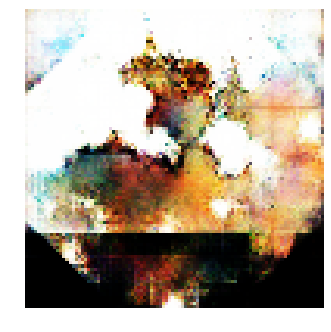


Epoch: 4980, D: -7.965, G: 3.026
Epoch: 4981, D: -8.367, G: 3.721
Epoch: 4982, D: -9.35, G: 3.124
Epoch: 4983, D: -8.668, G: 1.189
Epoch: 4984, D: -6.6, G: 3.448
Epoch: 4985, D: -6.163, G: 4.244
Epoch: 4986, D: -7.242, G: 3.77
Epoch: 4987, D: -6.542, G: 4.285
Epoch: 4988, D: -5.736, G: 4.991
Epoch: 4989, D: -7.354, G: 4.685
Epoch: 4990, D: -7.575, G: 1.361
Epoch: 4991, D: -7.532, G: 6.37
Epoch: 4992, D: -6.593, G: 2.303
Epoch: 4993, D: -6.454, G: 4.701
Epoch: 4994, D: -7.676, G: 4.106
Epoch: 4995, D: -6.996, G: 2.517
Epoch: 4996, D: -5.858, G: 3.858
Epoch: 4997, D: -5.98, G: 4.644
Epoch: 4998, D: -7.143, G: 1.494
Epoch: 4999, D: -7.604, G: 3.647


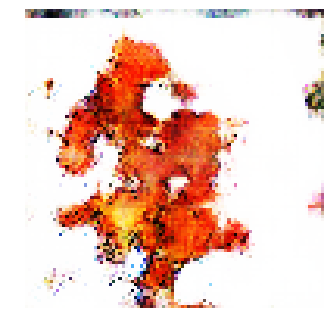


Epoch: 5000, D: -7.177, G: 3.344
Epoch: 5001, D: -5.867, G: 6.109
Epoch: 5002, D: -6.221, G: 2.922
Epoch: 5003, D: -6.765, G: 5.076
Epoch: 5004, D: -8.008, G: 5.972
Epoch: 5005, D: -6.161, G: 5.135
Epoch: 5006, D: -7.236, G: 3.776
Epoch: 5007, D: -8.757, G: 2.621
Epoch: 5008, D: -5.619, G: 2.817
Epoch: 5009, D: -7.153, G: 2.542
Epoch: 5010, D: -6.367, G: 3.098
Epoch: 5011, D: -7.424, G: 4.824
Epoch: 5012, D: -7.29, G: 4.429
Epoch: 5013, D: -6.893, G: 2.395
Epoch: 5014, D: -6.407, G: 5.58
Epoch: 5015, D: -7.291, G: 5.617
Epoch: 5016, D: -6.948, G: 5.406
Epoch: 5017, D: -6.688, G: 2.728
Epoch: 5018, D: -5.28, G: 1.713
Epoch: 5019, D: -5.903, G: 1.672


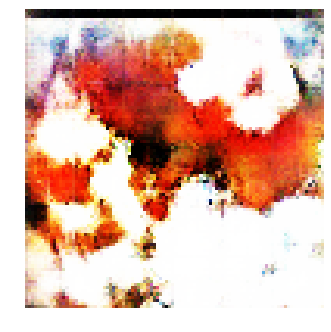


Epoch: 5020, D: -6.944, G: 3.324
Epoch: 5021, D: -6.82, G: 7.747
Epoch: 5022, D: -6.3, G: 1.708
Epoch: 5023, D: -6.638, G: 3.84
Epoch: 5024, D: -7.964, G: 7.341
Epoch: 5025, D: -6.947, G: 2.668
Epoch: 5026, D: -3.986, G: 3.642
Epoch: 5027, D: -6.588, G: 2.474
Epoch: 5028, D: -7.428, G: 4.849
Epoch: 5029, D: -8.137, G: 2.04
Epoch: 5030, D: -4.354, G: 1.391
Epoch: 5031, D: -6.025, G: 2.158
Epoch: 5032, D: -6.43, G: 2.002
Epoch: 5033, D: -6.192, G: 5.205
Epoch: 5034, D: -7.975, G: 3.931
Epoch: 5035, D: -6.168, G: 2.775
Epoch: 5036, D: -6.42, G: 4.209
Epoch: 5037, D: -7.035, G: 1.553
Epoch: 5038, D: -5.535, G: 5.678
Epoch: 5039, D: -7.812, G: 4.389


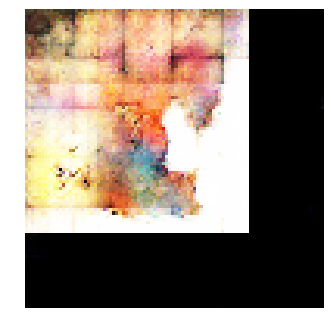


Epoch: 5040, D: -6.562, G: 0.07866
Epoch: 5041, D: -7.463, G: 3.543
Epoch: 5042, D: -8.225, G: 0.6917
Epoch: 5043, D: -6.243, G: 2.876
Epoch: 5044, D: -6.958, G: 1.811
Epoch: 5045, D: -9.306, G: 3.56
Epoch: 5046, D: -6.73, G: -0.3768
Epoch: 5047, D: -9.03, G: 2.237
Epoch: 5048, D: -6.302, G: 3.058
Epoch: 5049, D: -6.984, G: 3.753
Epoch: 5050, D: -9.29, G: 4.014
Epoch: 5051, D: -9.002, G: 3.925
Epoch: 5052, D: -7.474, G: 4.004
Epoch: 5053, D: -5.727, G: 0.8936
Epoch: 5054, D: -6.806, G: 2.586
Epoch: 5055, D: -7.04, G: 3.125
Epoch: 5056, D: -8.037, G: 0.8629
Epoch: 5057, D: -7.529, G: 0.7982
Epoch: 5058, D: -8.116, G: 5.694
Epoch: 5059, D: -7.824, G: 1.45


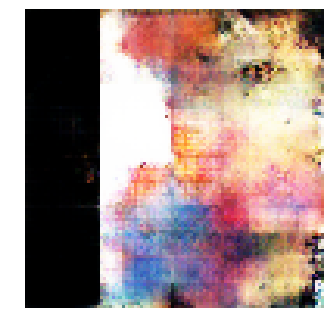


Epoch: 5060, D: -7.24, G: 3.2
Epoch: 5061, D: -7.079, G: 4.836
Epoch: 5062, D: -6.226, G: 3.256
Epoch: 5063, D: -7.193, G: 4.668
Epoch: 5064, D: -9.539, G: 3.177
Epoch: 5065, D: -6.907, G: 3.021
Epoch: 5066, D: -7.154, G: 4.918
Epoch: 5067, D: -8.338, G: 3.704
Epoch: 5068, D: -7.012, G: 2.573
Epoch: 5069, D: -6.924, G: 2.498
Epoch: 5070, D: -7.92, G: 5.743
Epoch: 5071, D: -7.092, G: 3.544
Epoch: 5072, D: -7.326, G: 6.206
Epoch: 5073, D: -7.417, G: 3.799
Epoch: 5074, D: -6.346, G: 3.144
Epoch: 5075, D: -7.577, G: 5.111
Epoch: 5076, D: -6.782, G: 1.938
Epoch: 5077, D: -7.14, G: 4.011
Epoch: 5078, D: -8.067, G: 2.249
Epoch: 5079, D: -7.933, G: 1.185


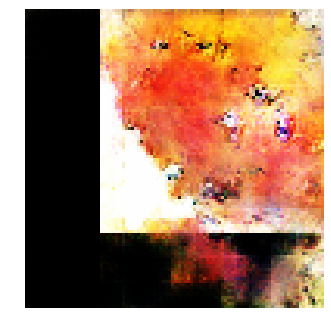


Epoch: 5080, D: -7.864, G: 2.306
Epoch: 5081, D: -6.878, G: 4.951
Epoch: 5082, D: -6.165, G: 6.093
Epoch: 5083, D: -6.742, G: 5.037
Epoch: 5084, D: -5.178, G: 1.076
Epoch: 5085, D: -7.423, G: 0.9253
Epoch: 5086, D: -7.766, G: 0.7094
Epoch: 5087, D: -7.07, G: 2.595
Epoch: 5088, D: -7.802, G: 2.612
Epoch: 5089, D: -7.678, G: 3.402
Epoch: 5090, D: -7.223, G: 4.437
Epoch: 5091, D: -7.322, G: 3.267
Epoch: 5092, D: -6.08, G: 7.223
Epoch: 5093, D: -6.041, G: 5.258
Epoch: 5094, D: -6.394, G: 4.33
Epoch: 5095, D: -5.904, G: 4.636
Epoch: 5096, D: -7.54, G: 6.063
Epoch: 5097, D: -6.928, G: 6.767
Epoch: 5098, D: -6.526, G: 4.164
Epoch: 5099, D: -6.19, G: 1.765


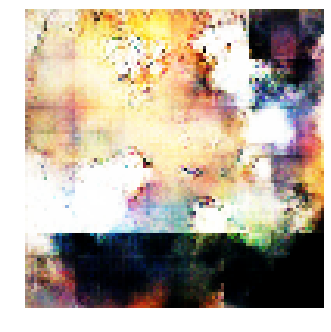


Epoch: 5100, D: -7.741, G: -0.7959
Epoch: 5101, D: -6.823, G: 1.101
Epoch: 5102, D: -7.521, G: 4.181
Epoch: 5103, D: -6.974, G: 0.4166
Epoch: 5104, D: -6.871, G: 3.858
Epoch: 5105, D: -7.858, G: 4.953
Epoch: 5106, D: -7.355, G: 3.399
Epoch: 5107, D: -6.819, G: 2.593
Epoch: 5108, D: -6.953, G: 3.055
Epoch: 5109, D: -7.197, G: 2.3
Epoch: 5110, D: -7.945, G: 3.692
Epoch: 5111, D: -8.053, G: 3.404
Epoch: 5112, D: -6.779, G: 3.55
Epoch: 5113, D: -7.041, G: 2.632
Epoch: 5114, D: -6.407, G: 3.699
Epoch: 5115, D: -7.813, G: 3.744
Epoch: 5116, D: -7.652, G: 2.284
Epoch: 5117, D: -6.1, G: 4.692
Epoch: 5118, D: -7.164, G: 4.477
Epoch: 5119, D: -7.942, G: 3.781


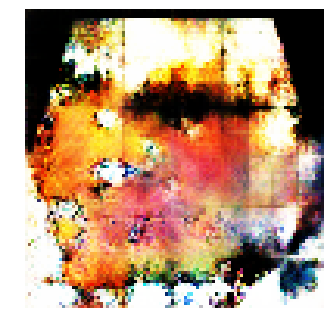


Epoch: 5120, D: -6.779, G: 0.7295
Epoch: 5121, D: -7.587, G: 2.445
Epoch: 5122, D: -7.625, G: 3.015
Epoch: 5123, D: -7.421, G: 4.756
Epoch: 5124, D: -8.236, G: 1.088
Epoch: 5125, D: -7.902, G: 2.398
Epoch: 5126, D: -7.14, G: 1.974
Epoch: 5127, D: -5.944, G: 2.148
Epoch: 5128, D: -5.269, G: 3.299
Epoch: 5129, D: -6.161, G: 1.883
Epoch: 5130, D: -8.115, G: 1.068
Epoch: 5131, D: -7.565, G: 4.625
Epoch: 5132, D: -5.466, G: 5.397
Epoch: 5133, D: -6.522, G: 3.411
Epoch: 5134, D: -8.137, G: 2.44
Epoch: 5135, D: -9.035, G: 4.683
Epoch: 5136, D: -6.477, G: 1.608
Epoch: 5137, D: -9.558, G: 2.059
Epoch: 5138, D: -5.749, G: 3.854
Epoch: 5139, D: -8.452, G: 3.645


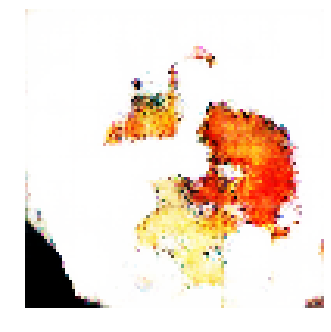


Epoch: 5140, D: -5.347, G: 5.595
Epoch: 5141, D: -6.778, G: 0.6179
Epoch: 5142, D: -8.14, G: 2.908
Epoch: 5143, D: -7.2, G: 5.26
Epoch: 5144, D: -7.018, G: 5.664
Epoch: 5145, D: -6.758, G: 0.2797
Epoch: 5146, D: -5.796, G: 3.009
Epoch: 5147, D: -7.498, G: 4.895
Epoch: 5148, D: -5.335, G: 6.741
Epoch: 5149, D: -7.014, G: 1.688
Epoch: 5150, D: -6.991, G: 2.108
Epoch: 5151, D: -8.615, G: 4.324
Epoch: 5152, D: -7.557, G: 0.4512
Epoch: 5153, D: -6.627, G: 2.018
Epoch: 5154, D: -6.103, G: 2.15
Epoch: 5155, D: -7.578, G: 4.008
Epoch: 5156, D: -6.587, G: 4.913
Epoch: 5157, D: -6.673, G: 4.356
Epoch: 5158, D: -6.063, G: 4.768
Epoch: 5159, D: -7.305, G: 3.742


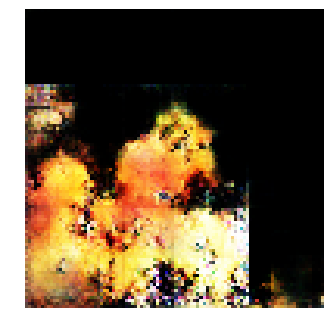


Epoch: 5160, D: -6.804, G: 2.047
Epoch: 5161, D: -5.82, G: 3.789
Epoch: 5162, D: -7.868, G: 6.014
Epoch: 5163, D: -7.248, G: 3.775
Epoch: 5164, D: -7.277, G: 3.935
Epoch: 5165, D: -7.204, G: 4.257
Epoch: 5166, D: -6.021, G: 1.981
Epoch: 5167, D: -7.218, G: 3.947
Epoch: 5168, D: -8.204, G: 6.473
Epoch: 5169, D: -6.741, G: 1.84
Epoch: 5170, D: -6.198, G: -0.6678
Epoch: 5171, D: -6.603, G: 5.099
Epoch: 5172, D: -5.843, G: 0.3585
Epoch: 5173, D: -7.455, G: 3.63
Epoch: 5174, D: -7.389, G: 5.589
Epoch: 5175, D: -5.42, G: 4.803
Epoch: 5176, D: -5.358, G: 2.218
Epoch: 5177, D: -7.925, G: 4.031
Epoch: 5178, D: -7.351, G: 5.855
Epoch: 5179, D: -6.738, G: 2.59


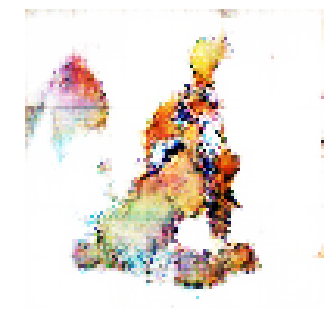


Epoch: 5180, D: -8.725, G: 1.719
Epoch: 5181, D: -7.999, G: 0.2063
Epoch: 5182, D: -7.625, G: 0.8383
Epoch: 5183, D: -6.015, G: 2.877
Epoch: 5184, D: -6.13, G: 2.375
Epoch: 5185, D: -4.977, G: 2.939
Epoch: 5186, D: -7.879, G: 3.272
Epoch: 5187, D: -6.322, G: 3.946
Epoch: 5188, D: -7.122, G: 4.652
Epoch: 5189, D: -7.178, G: 5.075
Epoch: 5190, D: -6.659, G: 4.809
Epoch: 5191, D: -6.326, G: 1.343
Epoch: 5192, D: -6.898, G: 2.6
Epoch: 5193, D: -4.594, G: 4.574
Epoch: 5194, D: -8.639, G: 2.662
Epoch: 5195, D: -5.516, G: -0.0402
Epoch: 5196, D: -7.26, G: 4.924
Epoch: 5197, D: -7.381, G: 4.137
Epoch: 5198, D: -5.911, G: 4.266
Epoch: 5199, D: -7.258, G: 2.533


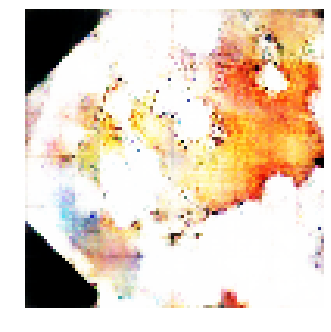


Epoch: 5200, D: -8.089, G: 1.759
Epoch: 5201, D: -6.293, G: 2.172
Epoch: 5202, D: -6.347, G: 1.716
Epoch: 5203, D: -8.312, G: 3.297
Epoch: 5204, D: -7.444, G: 1.489
Epoch: 5205, D: -6.743, G: 2.241
Epoch: 5206, D: -6.091, G: 2.353
Epoch: 5207, D: -8.041, G: 2.164
Epoch: 5208, D: -7.512, G: 3.204
Epoch: 5209, D: -7.608, G: 3.641
Epoch: 5210, D: -6.845, G: 3.072
Epoch: 5211, D: -8.683, G: 4.301
Epoch: 5212, D: -6.979, G: 0.2071
Epoch: 5213, D: -7.448, G: 5.184
Epoch: 5214, D: -6.764, G: 3.839
Epoch: 5215, D: -7.815, G: 3.932
Epoch: 5216, D: -7.433, G: 4.573
Epoch: 5217, D: -6.849, G: 4.028
Epoch: 5218, D: -7.76, G: 4.382
Epoch: 5219, D: -6.856, G: 1.675


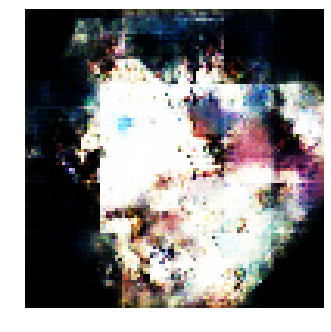


Epoch: 5220, D: -7.479, G: 2.453
Epoch: 5221, D: -6.315, G: 2.739
Epoch: 5222, D: -7.689, G: 2.712
Epoch: 5223, D: -7.854, G: 3.154
Epoch: 5224, D: -8.674, G: 4.16
Epoch: 5225, D: -6.309, G: 2.427
Epoch: 5226, D: -7.176, G: 6.767
Epoch: 5227, D: -6.844, G: 4.284
Epoch: 5228, D: -7.286, G: 3.508
Epoch: 5229, D: -6.869, G: 0.3151
Epoch: 5230, D: -7.325, G: 3.506
Epoch: 5231, D: -7.822, G: 4.286
Epoch: 5232, D: -7.429, G: 4.419
Epoch: 5233, D: -5.321, G: 1.963
Epoch: 5234, D: -7.3, G: -1.336
Epoch: 5235, D: -5.891, G: 1.673
Epoch: 5236, D: -6.41, G: 4.44
Epoch: 5237, D: -5.413, G: 2.317
Epoch: 5238, D: -5.984, G: 2.961
Epoch: 5239, D: -6.992, G: 4.146


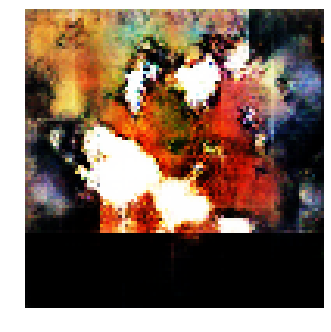


Epoch: 5240, D: -5.634, G: 2.516
Epoch: 5241, D: -6.722, G: 4.489
Epoch: 5242, D: -8.887, G: 3.034
Epoch: 5243, D: -8.127, G: 4.583
Epoch: 5244, D: -7.932, G: 4.315
Epoch: 5245, D: -6.982, G: 5.184
Epoch: 5246, D: -7.443, G: 3.911
Epoch: 5247, D: -8.162, G: 3.154
Epoch: 5248, D: -6.427, G: 2.895
Epoch: 5249, D: -8.118, G: 3.393
Epoch: 5250, D: -8.042, G: 3.455
Epoch: 5251, D: -5.435, G: 1.727
Epoch: 5252, D: -6.317, G: 3.698
Epoch: 5253, D: -5.897, G: 1.488
Epoch: 5254, D: -7.302, G: 4.74
Epoch: 5255, D: -5.732, G: 3.915
Epoch: 5256, D: -7.905, G: 6.558
Epoch: 5257, D: -6.318, G: 2.778
Epoch: 5258, D: -7.217, G: 5.008
Epoch: 5259, D: -7.141, G: 4.038


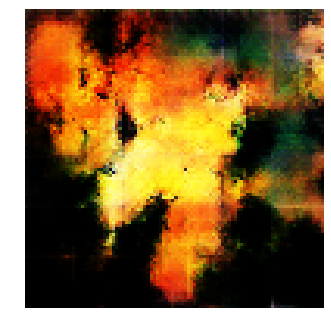


Epoch: 5260, D: -5.98, G: 3.094
Epoch: 5261, D: -7.452, G: 4.768
Epoch: 5262, D: -7.202, G: -0.2886
Epoch: 5263, D: -6.155, G: 3.968
Epoch: 5264, D: -6.637, G: 4.907
Epoch: 5265, D: -7.505, G: 2.433
Epoch: 5266, D: -7.812, G: 0.4924
Epoch: 5267, D: -6.136, G: 4.072
Epoch: 5268, D: -7.533, G: 3.668
Epoch: 5269, D: -5.926, G: 1.533
Epoch: 5270, D: -5.648, G: 4.54
Epoch: 5271, D: -6.857, G: 5.24
Epoch: 5272, D: -6.819, G: 2.832
Epoch: 5273, D: -6.41, G: 0.6426
Epoch: 5274, D: -6.657, G: 4.217
Epoch: 5275, D: -5.086, G: 6.131
Epoch: 5276, D: -6.52, G: 4.379
Epoch: 5277, D: -8.193, G: 3.098
Epoch: 5278, D: -5.592, G: 1.178
Epoch: 5279, D: -5.882, G: 0.4446


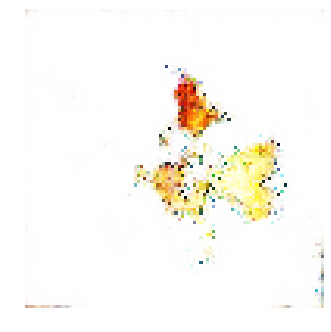


Epoch: 5280, D: -7.738, G: 4.242
Epoch: 5281, D: -8.0, G: 3.518
Epoch: 5282, D: -5.882, G: 3.932
Epoch: 5283, D: -6.933, G: 6.389
Epoch: 5284, D: -7.354, G: 4.459
Epoch: 5285, D: -7.134, G: 4.443
Epoch: 5286, D: -7.835, G: 1.395
Epoch: 5287, D: -6.969, G: 6.165
Epoch: 5288, D: -8.944, G: 2.101
Epoch: 5289, D: -8.13, G: 1.831
Epoch: 5290, D: -8.573, G: 1.086
Epoch: 5291, D: -7.586, G: -1.153
Epoch: 5292, D: -8.826, G: 1.275
Epoch: 5293, D: -7.315, G: -1.75
Epoch: 5294, D: -7.671, G: 3.592
Epoch: 5295, D: -7.322, G: 2.674
Epoch: 5296, D: -7.987, G: 2.753
Epoch: 5297, D: -7.909, G: 3.097
Epoch: 5298, D: -7.065, G: 1.529
Epoch: 5299, D: -7.429, G: 3.155


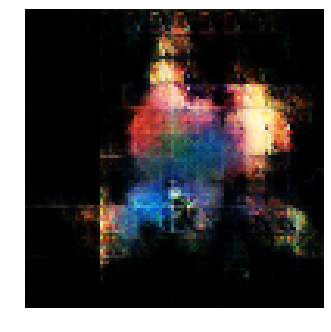


Epoch: 5300, D: -6.693, G: 5.365
Epoch: 5301, D: -6.092, G: 5.072
Epoch: 5302, D: -7.143, G: 3.874
Epoch: 5303, D: -7.853, G: 5.878
Epoch: 5304, D: -7.034, G: 3.284
Epoch: 5305, D: -6.631, G: 4.346
Epoch: 5306, D: -7.281, G: 3.173
Epoch: 5307, D: -7.219, G: 2.169
Epoch: 5308, D: -6.876, G: 4.041
Epoch: 5309, D: -7.998, G: 4.076
Epoch: 5310, D: -7.334, G: 2.159
Epoch: 5311, D: -7.785, G: 2.739
Epoch: 5312, D: -6.195, G: 5.28
Epoch: 5313, D: -7.708, G: 1.729
Epoch: 5314, D: -6.333, G: 1.572
Epoch: 5315, D: -7.418, G: 2.224
Epoch: 5316, D: -7.082, G: 2.709
Epoch: 5317, D: -8.073, G: 2.156
Epoch: 5318, D: -6.129, G: 4.617
Epoch: 5319, D: -7.842, G: 5.475


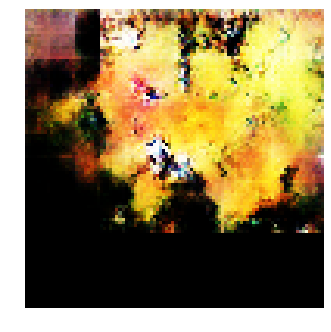


Epoch: 5320, D: -7.311, G: 1.86
Epoch: 5321, D: -6.435, G: 5.608
Epoch: 5322, D: -6.537, G: 4.959
Epoch: 5323, D: -8.117, G: 3.355
Epoch: 5324, D: -7.43, G: 2.547
Epoch: 5325, D: -5.922, G: 2.18
Epoch: 5326, D: -7.632, G: 3.72
Epoch: 5327, D: -8.658, G: 0.9773
Epoch: 5328, D: -6.242, G: 0.5762
Epoch: 5329, D: -8.111, G: 2.617
Epoch: 5330, D: -8.018, G: 0.4648
Epoch: 5331, D: -6.111, G: 2.1
Epoch: 5332, D: -7.597, G: 3.701
Epoch: 5333, D: -6.947, G: 0.08308
Epoch: 5334, D: -5.768, G: 1.695
Epoch: 5335, D: -6.916, G: 4.693
Epoch: 5336, D: -7.598, G: 3.508
Epoch: 5337, D: -6.571, G: 3.001
Epoch: 5338, D: -7.704, G: 2.704
Epoch: 5339, D: -6.067, G: 0.7217


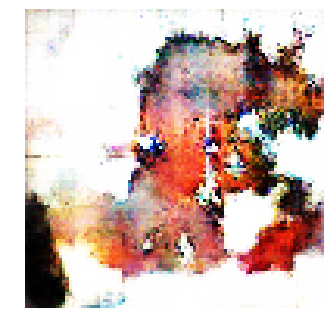


Epoch: 5340, D: -7.891, G: 4.601
Epoch: 5341, D: -6.719, G: 4.962
Epoch: 5342, D: -7.814, G: 2.865
Epoch: 5343, D: -6.05, G: 2.642
Epoch: 5344, D: -7.488, G: 3.504
Epoch: 5345, D: -7.329, G: 3.434
Epoch: 5346, D: -8.276, G: 7.006
Epoch: 5347, D: -5.965, G: 3.977
Epoch: 5348, D: -7.015, G: 6.807
Epoch: 5349, D: -7.895, G: 4.245
Epoch: 5350, D: -7.186, G: 4.13
Epoch: 5351, D: -7.371, G: 3.301
Epoch: 5352, D: -6.999, G: 3.082
Epoch: 5353, D: -7.412, G: 2.853
Epoch: 5354, D: -6.244, G: 1.486
Epoch: 5355, D: -6.754, G: 3.525
Epoch: 5356, D: -6.999, G: 2.472
Epoch: 5357, D: -6.231, G: 4.531
Epoch: 5358, D: -8.518, G: 4.318
Epoch: 5359, D: -6.378, G: 3.068


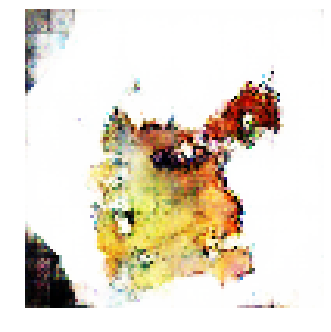


Epoch: 5360, D: -5.047, G: 3.425
Epoch: 5361, D: -6.265, G: 4.118
Epoch: 5362, D: -6.255, G: 3.439
Epoch: 5363, D: -7.515, G: 2.209
Epoch: 5364, D: -4.599, G: 1.506
Epoch: 5365, D: -6.552, G: 3.433
Epoch: 5366, D: -8.564, G: 0.4319
Epoch: 5367, D: -5.597, G: 3.626
Epoch: 5368, D: -6.676, G: 2.056
Epoch: 5369, D: -6.414, G: 5.947
Epoch: 5370, D: -6.252, G: 3.555
Epoch: 5371, D: -7.102, G: 2.909
Epoch: 5372, D: -6.695, G: 5.432
Epoch: 5373, D: -7.156, G: 1.374
Epoch: 5374, D: -6.582, G: 7.457
Epoch: 5375, D: -7.775, G: 3.478
Epoch: 5376, D: -6.864, G: 3.668
Epoch: 5377, D: -7.554, G: 4.198
Epoch: 5378, D: -6.035, G: 1.981
Epoch: 5379, D: -5.683, G: 3.398


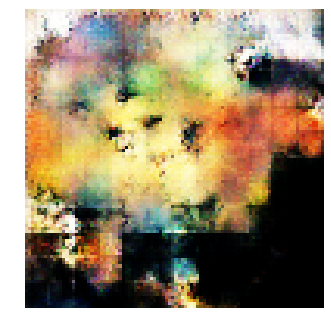


Epoch: 5380, D: -7.151, G: 4.979
Epoch: 5381, D: -7.765, G: 2.97
Epoch: 5382, D: -6.318, G: 2.319
Epoch: 5383, D: -8.456, G: 3.36
Epoch: 5384, D: -6.255, G: 0.4727
Epoch: 5385, D: -6.46, G: 3.654
Epoch: 5386, D: -7.097, G: 5.274
Epoch: 5387, D: -5.762, G: 4.925
Epoch: 5388, D: -5.077, G: 6.375
Epoch: 5389, D: -7.498, G: 4.288
Epoch: 5390, D: -7.682, G: 1.108
Epoch: 5391, D: -6.707, G: 3.777
Epoch: 5392, D: -9.371, G: 3.967
Epoch: 5393, D: -6.736, G: -0.5634
Epoch: 5394, D: -7.139, G: 4.219
Epoch: 5395, D: -8.417, G: 1.581
Epoch: 5396, D: -5.555, G: -0.06352
Epoch: 5397, D: -7.886, G: 4.082
Epoch: 5398, D: -5.309, G: 2.46
Epoch: 5399, D: -7.934, G: 6.262


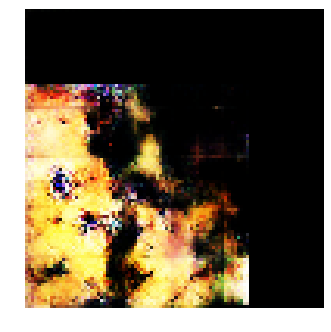


Epoch: 5400, D: -6.706, G: 3.378
Epoch: 5401, D: -8.142, G: 4.561
Epoch: 5402, D: -6.792, G: 1.697
Epoch: 5403, D: -4.702, G: 6.356
Epoch: 5404, D: -7.142, G: 3.693
Epoch: 5405, D: -6.97, G: 4.691
Epoch: 5406, D: -7.705, G: 2.685
Epoch: 5407, D: -7.683, G: 3.048
Epoch: 5408, D: -7.218, G: 0.06702
Epoch: 5409, D: -8.527, G: 2.018
Epoch: 5410, D: -6.126, G: 1.981
Epoch: 5411, D: -7.2, G: 4.016
Epoch: 5412, D: -5.423, G: 4.813
Epoch: 5413, D: -8.078, G: 7.096
Epoch: 5414, D: -6.025, G: 3.616
Epoch: 5415, D: -6.301, G: 4.688
Epoch: 5416, D: -6.217, G: 4.867
Epoch: 5417, D: -6.549, G: 3.378
Epoch: 5418, D: -5.717, G: 2.24
Epoch: 5419, D: -6.366, G: 3.629


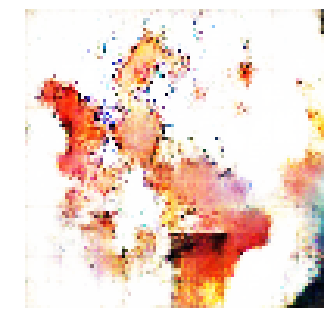


Epoch: 5420, D: -7.541, G: 2.585
Epoch: 5421, D: -6.276, G: 3.279
Epoch: 5422, D: -7.131, G: 1.216
Epoch: 5423, D: -8.205, G: 1.76
Epoch: 5424, D: -6.641, G: 2.686
Epoch: 5425, D: -7.611, G: 2.562
Epoch: 5426, D: -6.883, G: 2.532
Epoch: 5427, D: -6.362, G: 0.8052
Epoch: 5428, D: -7.235, G: 4.145
Epoch: 5429, D: -7.477, G: 6.053
Epoch: 5430, D: -8.322, G: 2.247
Epoch: 5431, D: -7.157, G: 2.293
Epoch: 5432, D: -8.025, G: 3.788
Epoch: 5433, D: -4.508, G: -0.1557
Epoch: 5434, D: -7.538, G: 1.986
Epoch: 5435, D: -5.772, G: 1.729
Epoch: 5436, D: -7.148, G: 3.965
Epoch: 5437, D: -6.462, G: 1.933
Epoch: 5438, D: -6.982, G: 1.593
Epoch: 5439, D: -6.952, G: 3.624


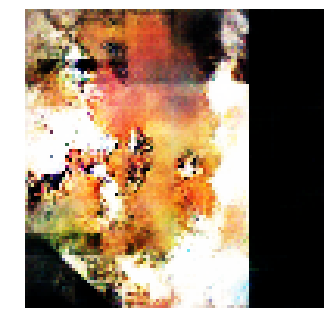


Epoch: 5440, D: -6.649, G: 2.951
Epoch: 5441, D: -7.09, G: 3.891
Epoch: 5442, D: -7.787, G: 4.734
Epoch: 5443, D: -6.599, G: 1.722
Epoch: 5444, D: -7.766, G: 6.948
Epoch: 5445, D: -8.843, G: 5.608
Epoch: 5446, D: -7.371, G: 0.1818
Epoch: 5447, D: -6.507, G: 0.7484
Epoch: 5448, D: -6.219, G: 2.827
Epoch: 5449, D: -8.125, G: 5.79
Epoch: 5450, D: -6.785, G: 1.53
Epoch: 5451, D: -8.718, G: 2.762
Epoch: 5452, D: -5.842, G: 1.387
Epoch: 5453, D: -6.586, G: -0.9789
Epoch: 5454, D: -8.41, G: 6.024
Epoch: 5455, D: -7.007, G: 1.127
Epoch: 5456, D: -6.964, G: 3.634
Epoch: 5457, D: -7.015, G: 1.998
Epoch: 5458, D: -8.809, G: 3.226
Epoch: 5459, D: -6.434, G: 4.075


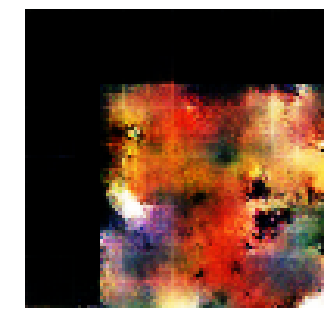


Epoch: 5460, D: -6.584, G: 5.725
Epoch: 5461, D: -6.55, G: 1.943
Epoch: 5462, D: -7.631, G: 3.815
Epoch: 5463, D: -5.594, G: 1.759
Epoch: 5464, D: -6.948, G: 4.637
Epoch: 5465, D: -7.687, G: 3.437
Epoch: 5466, D: -6.311, G: 3.123
Epoch: 5467, D: -6.128, G: 1.711
Epoch: 5468, D: -6.651, G: 2.33
Epoch: 5469, D: -6.898, G: 4.224
Epoch: 5470, D: -6.849, G: 1.08
Epoch: 5471, D: -7.203, G: 2.201
Epoch: 5472, D: -6.882, G: 3.881
Epoch: 5473, D: -6.774, G: 4.374
Epoch: 5474, D: -5.907, G: 1.679
Epoch: 5475, D: -6.054, G: 5.58
Epoch: 5476, D: -7.956, G: 4.42
Epoch: 5477, D: -5.683, G: 4.526
Epoch: 5478, D: -6.653, G: 2.801
Epoch: 5479, D: -6.843, G: 5.509


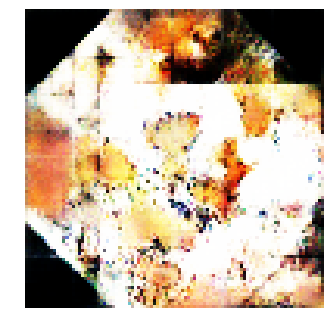


Epoch: 5480, D: -7.918, G: 2.765
Epoch: 5481, D: -6.625, G: 2.181
Epoch: 5482, D: -7.468, G: 2.344
Epoch: 5483, D: -6.73, G: 3.173
Epoch: 5484, D: -8.296, G: 5.468
Epoch: 5485, D: -7.573, G: 1.029
Epoch: 5486, D: -7.952, G: 3.557
Epoch: 5487, D: -8.455, G: 1.768
Epoch: 5488, D: -5.194, G: 3.217
Epoch: 5489, D: -5.754, G: 4.482
Epoch: 5490, D: -6.919, G: 0.1367
Epoch: 5491, D: -6.313, G: 2.189
Epoch: 5492, D: -7.657, G: 3.125
Epoch: 5493, D: -7.404, G: 1.819
Epoch: 5494, D: -8.035, G: 3.305
Epoch: 5495, D: -6.378, G: 0.9249
Epoch: 5496, D: -6.514, G: 8.927
Epoch: 5497, D: -7.964, G: 2.996
Epoch: 5498, D: -8.313, G: 0.386
Epoch: 5499, D: -3.783, G: 3.892


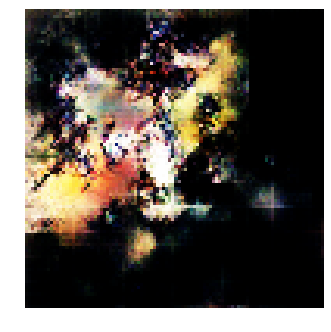


Epoch: 5500, D: -5.877, G: 6.015
Epoch: 5501, D: -8.135, G: 4.153
Epoch: 5502, D: -7.465, G: 3.668
Epoch: 5503, D: -7.117, G: 4.644
Epoch: 5504, D: -7.278, G: 4.407
Epoch: 5505, D: -6.154, G: 1.379
Epoch: 5506, D: -7.521, G: 3.462
Epoch: 5507, D: -7.682, G: 4.606
Epoch: 5508, D: -7.421, G: 0.1108
Epoch: 5509, D: -6.031, G: 3.035
Epoch: 5510, D: -6.539, G: 5.198
Epoch: 5511, D: -8.132, G: 0.5262
Epoch: 5512, D: -7.326, G: 1.964
Epoch: 5513, D: -6.413, G: 6.094
Epoch: 5514, D: -7.071, G: 3.413
Epoch: 5515, D: -6.29, G: 0.1378
Epoch: 5516, D: -7.433, G: 3.129
Epoch: 5517, D: -6.964, G: 2.408
Epoch: 5518, D: -5.924, G: 4.02
Epoch: 5519, D: -6.756, G: 4.62


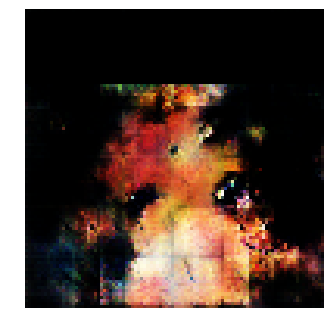


Epoch: 5520, D: -6.735, G: 3.98
Epoch: 5521, D: -6.801, G: 1.545
Epoch: 5522, D: -7.542, G: 6.081
Epoch: 5523, D: -7.926, G: 1.487
Epoch: 5524, D: -7.102, G: 1.581
Epoch: 5525, D: -7.357, G: 2.502
Epoch: 5526, D: -6.893, G: 3.323
Epoch: 5527, D: -6.611, G: 4.568
Epoch: 5528, D: -6.052, G: 6.01
Epoch: 5529, D: -5.965, G: 4.279
Epoch: 5530, D: -6.933, G: 1.307
Epoch: 5531, D: -6.907, G: 5.035
Epoch: 5532, D: -7.125, G: 5.781
Epoch: 5533, D: -7.222, G: 3.722
Epoch: 5534, D: -6.516, G: 3.908
Epoch: 5535, D: -7.385, G: 1.919
Epoch: 5536, D: -7.336, G: 4.763
Epoch: 5537, D: -9.26, G: 2.804
Epoch: 5538, D: -6.494, G: 3.236
Epoch: 5539, D: -6.026, G: 3.272


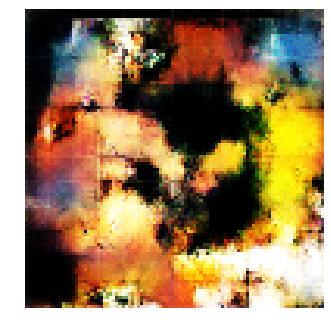


Epoch: 5540, D: -6.577, G: 2.877
Epoch: 5541, D: -6.39, G: 2.972
Epoch: 5542, D: -7.808, G: 3.854
Epoch: 5543, D: -6.815, G: 1.049
Epoch: 5544, D: -6.295, G: 1.916
Epoch: 5545, D: -5.484, G: 3.545
Epoch: 5546, D: -6.061, G: 4.34
Epoch: 5547, D: -6.612, G: 3.556
Epoch: 5548, D: -6.57, G: 5.383
Epoch: 5549, D: -6.026, G: 4.288
Epoch: 5550, D: -7.677, G: 2.17
Epoch: 5551, D: -7.219, G: 2.826
Epoch: 5552, D: -6.011, G: 3.726
Epoch: 5553, D: -7.11, G: 3.825
Epoch: 5554, D: -7.556, G: 4.591
Epoch: 5555, D: -7.316, G: 3.665
Epoch: 5556, D: -4.391, G: 6.571
Epoch: 5557, D: -7.576, G: 2.601
Epoch: 5558, D: -8.109, G: 1.654
Epoch: 5559, D: -8.775, G: 1.718


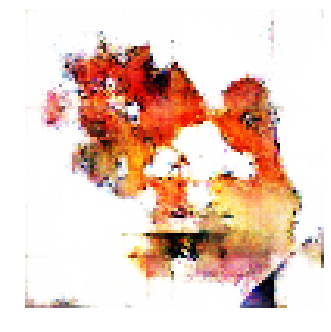


Epoch: 5560, D: -7.082, G: 3.267
Epoch: 5561, D: -8.852, G: 3.703
Epoch: 5562, D: -6.753, G: 2.363
Epoch: 5563, D: -6.925, G: 3.383
Epoch: 5564, D: -6.641, G: 5.934
Epoch: 5565, D: -6.537, G: 3.963
Epoch: 5566, D: -7.238, G: 3.005
Epoch: 5567, D: -7.053, G: 3.323
Epoch: 5568, D: -7.766, G: 5.006
Epoch: 5569, D: -7.065, G: 2.041
Epoch: 5570, D: -5.941, G: -0.7686
Epoch: 5571, D: -4.403, G: 6.197
Epoch: 5572, D: -6.881, G: 3.314
Epoch: 5573, D: -6.728, G: 5.013
Epoch: 5574, D: -7.348, G: 3.519
Epoch: 5575, D: -6.784, G: 3.792
Epoch: 5576, D: -6.89, G: 4.168
Epoch: 5577, D: -6.743, G: 3.364
Epoch: 5578, D: -5.932, G: 0.8481
Epoch: 5579, D: -5.154, G: 5.33


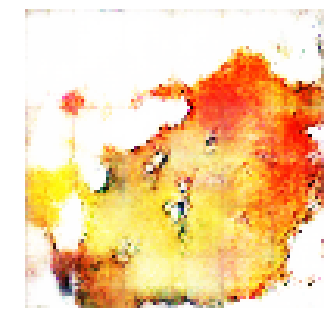


Epoch: 5580, D: -7.501, G: 2.945
Epoch: 5581, D: -6.766, G: 4.315
Epoch: 5582, D: -8.444, G: 5.046
Epoch: 5583, D: -8.335, G: 4.693
Epoch: 5584, D: -7.778, G: 4.245
Epoch: 5585, D: -7.394, G: 1.887
Epoch: 5586, D: -8.377, G: 3.549
Epoch: 5587, D: -5.6, G: 3.411
Epoch: 5588, D: -7.967, G: 4.113
Epoch: 5589, D: -6.636, G: 3.081
Epoch: 5590, D: -5.97, G: 0.891
Epoch: 5591, D: -6.69, G: 4.753
Epoch: 5592, D: -6.445, G: 5.151
Epoch: 5593, D: -5.905, G: 5.653
Epoch: 5594, D: -7.46, G: 2.412
Epoch: 5595, D: -6.787, G: 1.843
Epoch: 5596, D: -7.329, G: 3.155
Epoch: 5597, D: -7.819, G: 4.109
Epoch: 5598, D: -7.113, G: 2.911
Epoch: 5599, D: -4.871, G: 3.768


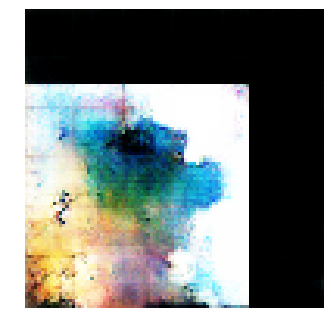


Epoch: 5600, D: -8.24, G: 5.461
Epoch: 5601, D: -7.145, G: 4.349
Epoch: 5602, D: -6.082, G: 3.034
Epoch: 5603, D: -7.482, G: 4.631
Epoch: 5604, D: -6.985, G: 2.021
Epoch: 5605, D: -6.285, G: 2.544
Epoch: 5606, D: -6.859, G: 2.984
Epoch: 5607, D: -6.969, G: 6.691
Epoch: 5608, D: -7.801, G: 5.428
Epoch: 5609, D: -6.951, G: 2.121
Epoch: 5610, D: -7.355, G: 2.145
Epoch: 5611, D: -6.42, G: 1.855
Epoch: 5612, D: -6.507, G: 1.636
Epoch: 5613, D: -6.963, G: 1.851
Epoch: 5614, D: -7.407, G: 3.061
Epoch: 5615, D: -6.569, G: 3.39
Epoch: 5616, D: -8.087, G: 2.304
Epoch: 5617, D: -6.095, G: 2.648
Epoch: 5618, D: -7.03, G: 4.075
Epoch: 5619, D: -7.009, G: 4.232


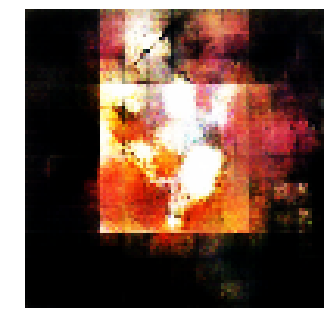


Epoch: 5620, D: -6.217, G: 2.408
Epoch: 5621, D: -4.865, G: 3.257
Epoch: 5622, D: -7.639, G: 4.739
Epoch: 5623, D: -8.05, G: 8.388
Epoch: 5624, D: -8.886, G: 2.91
Epoch: 5625, D: -7.457, G: 0.7203
Epoch: 5626, D: -5.885, G: 3.521
Epoch: 5627, D: -6.134, G: 3.855
Epoch: 5628, D: -6.335, G: 4.772
Epoch: 5629, D: -5.506, G: 3.876
Epoch: 5630, D: -8.304, G: 6.36
Epoch: 5631, D: -7.031, G: 2.181
Epoch: 5632, D: -8.527, G: 2.517
Epoch: 5633, D: -6.896, G: 4.504
Epoch: 5634, D: -7.837, G: 4.518
Epoch: 5635, D: -7.018, G: 3.68
Epoch: 5636, D: -5.918, G: 3.511
Epoch: 5637, D: -8.349, G: 4.43
Epoch: 5638, D: -6.758, G: 2.325
Epoch: 5639, D: -7.504, G: 6.835


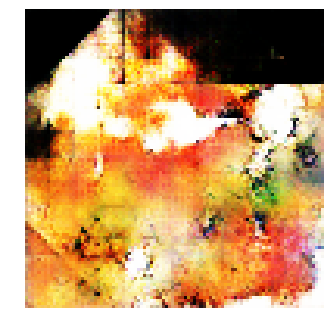


Epoch: 5640, D: -5.535, G: 1.131
Epoch: 5641, D: -7.24, G: 3.668
Epoch: 5642, D: -7.26, G: 1.114
Epoch: 5643, D: -8.324, G: 3.861
Epoch: 5644, D: -6.043, G: 3.491
Epoch: 5645, D: -5.785, G: 2.195
Epoch: 5646, D: -7.208, G: 5.098
Epoch: 5647, D: -6.725, G: 1.592
Epoch: 5648, D: -6.473, G: 2.045
Epoch: 5649, D: -6.979, G: 3.428
Epoch: 5650, D: -5.535, G: 0.599
Epoch: 5651, D: -6.285, G: 4.089
Epoch: 5652, D: -5.809, G: 2.345
Epoch: 5653, D: -6.174, G: 4.256
Epoch: 5654, D: -7.491, G: 3.78
Epoch: 5655, D: -7.644, G: 1.445
Epoch: 5656, D: -6.721, G: 2.169
Epoch: 5657, D: -8.165, G: 3.818
Epoch: 5658, D: -8.449, G: 3.06
Epoch: 5659, D: -6.743, G: 3.004


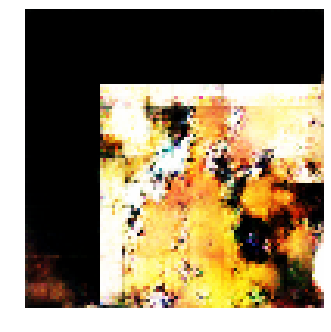


Epoch: 5660, D: -6.915, G: 2.358
Epoch: 5661, D: -7.748, G: 3.174
Epoch: 5662, D: -6.572, G: 3.847
Epoch: 5663, D: -6.688, G: 3.762
Epoch: 5664, D: -6.742, G: 2.92
Epoch: 5665, D: -6.863, G: 1.46
Epoch: 5666, D: -7.902, G: 1.596
Epoch: 5667, D: -8.561, G: 0.6435
Epoch: 5668, D: -6.616, G: 0.04901
Epoch: 5669, D: -5.196, G: 4.793
Epoch: 5670, D: -8.259, G: 4.421
Epoch: 5671, D: -6.122, G: 4.588
Epoch: 5672, D: -7.648, G: 2.854
Epoch: 5673, D: -6.863, G: 5.444
Epoch: 5674, D: -7.161, G: 3.814
Epoch: 5675, D: -7.453, G: 5.87
Epoch: 5676, D: -8.739, G: 2.235
Epoch: 5677, D: -6.536, G: 1.587
Epoch: 5678, D: -6.769, G: 4.364
Epoch: 5679, D: -7.551, G: 2.966


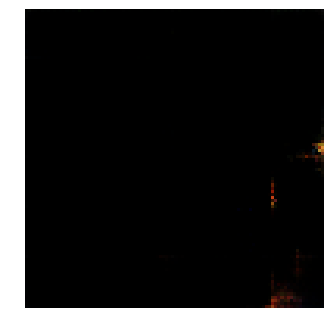


Epoch: 5680, D: -7.467, G: 5.56
Epoch: 5681, D: -6.284, G: 5.209
Epoch: 5682, D: -6.648, G: 3.144
Epoch: 5683, D: -5.298, G: 3.605
Epoch: 5684, D: -6.943, G: 4.554
Epoch: 5685, D: -6.625, G: 5.127
Epoch: 5686, D: -7.375, G: 4.966
Epoch: 5687, D: -6.097, G: 2.4
Epoch: 5688, D: -6.98, G: 2.238
Epoch: 5689, D: -6.324, G: 2.962
Epoch: 5690, D: -6.729, G: 0.5167
Epoch: 5691, D: -7.002, G: 2.972
Epoch: 5692, D: -7.754, G: 1.444
Epoch: 5693, D: -7.453, G: 3.507
Epoch: 5694, D: -8.007, G: 3.144
Epoch: 5695, D: -6.846, G: 4.042
Epoch: 5696, D: -7.724, G: 3.962
Epoch: 5697, D: -5.487, G: 6.536
Epoch: 5698, D: -7.991, G: 2.499
Epoch: 5699, D: -7.344, G: -0.1492


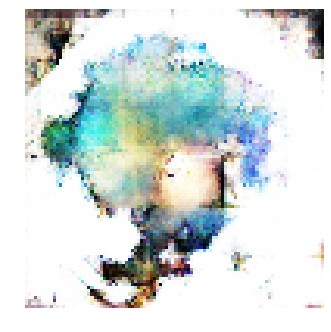


Epoch: 5700, D: -6.371, G: 2.195
Epoch: 5701, D: -6.773, G: 3.943
Epoch: 5702, D: -7.498, G: 3.632
Epoch: 5703, D: -7.108, G: 1.941
Epoch: 5704, D: -6.804, G: 2.622
Epoch: 5705, D: -6.171, G: 3.186
Epoch: 5706, D: -6.898, G: 2.108
Epoch: 5707, D: -6.096, G: 0.7098
Epoch: 5708, D: -8.13, G: 3.519
Epoch: 5709, D: -8.097, G: 4.689
Epoch: 5710, D: -7.871, G: 3.606
Epoch: 5711, D: -7.235, G: 0.3445
Epoch: 5712, D: -7.379, G: 1.719
Epoch: 5713, D: -5.698, G: 2.397
Epoch: 5714, D: -7.222, G: 3.172
Epoch: 5715, D: -6.625, G: 2.25
Epoch: 5716, D: -8.108, G: 1.347
Epoch: 5717, D: -6.942, G: 4.09
Epoch: 5718, D: -5.855, G: 2.052
Epoch: 5719, D: -5.352, G: 7.579


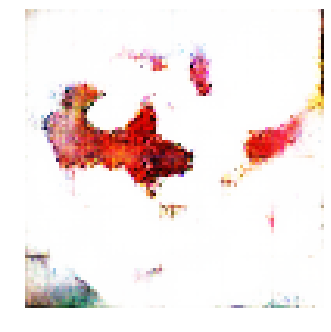


Epoch: 5720, D: -4.458, G: 2.696
Epoch: 5721, D: -6.246, G: 1.39
Epoch: 5722, D: -5.061, G: 2.036
Epoch: 5723, D: -5.671, G: 4.159
Epoch: 5724, D: -6.376, G: 5.33
Epoch: 5725, D: -7.47, G: 2.209
Epoch: 5726, D: -6.177, G: 0.9819
Epoch: 5727, D: -6.492, G: 3.389
Epoch: 5728, D: -6.417, G: 2.98
Epoch: 5729, D: -7.989, G: 3.154
Epoch: 5730, D: -6.522, G: 1.789
Epoch: 5731, D: -6.113, G: 2.46
Epoch: 5732, D: -6.536, G: 1.748
Epoch: 5733, D: -7.795, G: 5.392
Epoch: 5734, D: -5.17, G: 4.923
Epoch: 5735, D: -6.523, G: 2.265
Epoch: 5736, D: -7.639, G: 5.506
Epoch: 5737, D: -6.2, G: 2.436
Epoch: 5738, D: -6.318, G: 5.97
Epoch: 5739, D: -6.375, G: 5.825


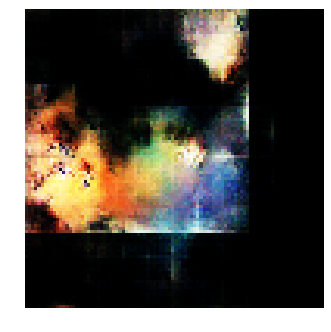


Epoch: 5740, D: -6.518, G: 4.448
Epoch: 5741, D: -7.302, G: 3.36
Epoch: 5742, D: -7.477, G: 0.9435
Epoch: 5743, D: -6.16, G: 4.711
Epoch: 5744, D: -8.341, G: 3.943
Epoch: 5745, D: -6.832, G: 5.683
Epoch: 5746, D: -7.483, G: 4.988
Epoch: 5747, D: -7.484, G: 2.809
Epoch: 5748, D: -6.857, G: 3.592
Epoch: 5749, D: -7.175, G: 2.931
Epoch: 5750, D: -6.631, G: 1.055
Epoch: 5751, D: -5.856, G: 3.191
Epoch: 5752, D: -6.809, G: 5.896
Epoch: 5753, D: -6.48, G: 1.216
Epoch: 5754, D: -5.57, G: 2.275
Epoch: 5755, D: -6.947, G: 4.102
Epoch: 5756, D: -7.088, G: 4.79
Epoch: 5757, D: -7.012, G: -1.282
Epoch: 5758, D: -7.214, G: 4.322
Epoch: 5759, D: -7.19, G: 5.444


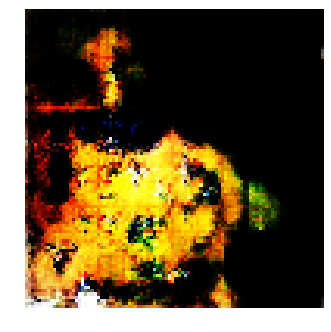


Epoch: 5760, D: -6.368, G: 2.72
Epoch: 5761, D: -7.003, G: 1.296
Epoch: 5762, D: -6.973, G: 4.836
Epoch: 5763, D: -7.807, G: 1.706
Epoch: 5764, D: -5.818, G: 2.914
Epoch: 5765, D: -6.506, G: 3.874
Epoch: 5766, D: -7.125, G: 5.598
Epoch: 5767, D: -6.315, G: 4.648
Epoch: 5768, D: -7.314, G: 3.991
Epoch: 5769, D: -7.336, G: 4.122
Epoch: 5770, D: -6.137, G: 3.866
Epoch: 5771, D: -6.494, G: 3.552
Epoch: 5772, D: -7.137, G: 4.324
Epoch: 5773, D: -7.128, G: 3.954
Epoch: 5774, D: -7.698, G: 4.058
Epoch: 5775, D: -7.537, G: 2.034
Epoch: 5776, D: -7.42, G: 3.326
Epoch: 5777, D: -7.409, G: 1.12
Epoch: 5778, D: -7.354, G: 3.973
Epoch: 5779, D: -6.59, G: 3.357


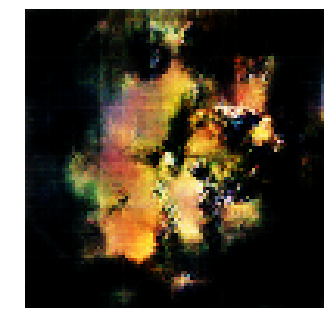


Epoch: 5780, D: -6.822, G: 5.075
Epoch: 5781, D: -5.861, G: 3.925
Epoch: 5782, D: -7.199, G: 1.655
Epoch: 5783, D: -7.663, G: 2.597
Epoch: 5784, D: -6.145, G: 1.559
Epoch: 5785, D: -7.857, G: 3.683
Epoch: 5786, D: -7.9, G: 4.92
Epoch: 5787, D: -7.217, G: 4.052
Epoch: 5788, D: -7.293, G: 4.686
Epoch: 5789, D: -5.856, G: 3.811
Epoch: 5790, D: -6.615, G: 2.223
Epoch: 5791, D: -8.009, G: 0.8071
Epoch: 5792, D: -5.363, G: 4.405
Epoch: 5793, D: -9.34, G: 3.667
Epoch: 5794, D: -6.117, G: 4.373
Epoch: 5795, D: -6.465, G: 6.171
Epoch: 5796, D: 3.303, G: 4.051
Epoch: 5797, D: -2.769, G: 2.899
Epoch: 5798, D: -3.898, G: 2.396
Epoch: 5799, D: -3.492, G: 1.885


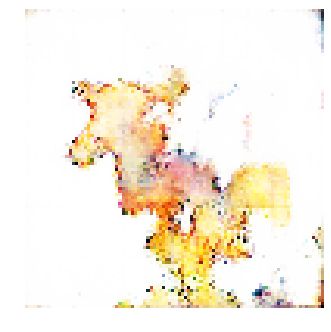


Epoch: 5800, D: -4.881, G: 2.538
Epoch: 5801, D: -4.59, G: 1.706
Epoch: 5802, D: -4.317, G: 2.07
Epoch: 5803, D: -4.323, G: 1.865
Epoch: 5804, D: -2.913, G: 3.699
Epoch: 5805, D: -4.817, G: 3.092
Epoch: 5806, D: -5.321, G: 3.674
Epoch: 5807, D: -5.815, G: 7.668
Epoch: 5808, D: -4.366, G: 3.521
Epoch: 5809, D: -4.473, G: 1.788
Epoch: 5810, D: -3.924, G: 4.221
Epoch: 5811, D: -4.501, G: 0.4714
Epoch: 5812, D: -5.827, G: 1.066
Epoch: 5813, D: -6.638, G: 5.583
Epoch: 5814, D: -6.548, G: 2.718
Epoch: 5815, D: -7.684, G: -1.476
Epoch: 5816, D: -6.36, G: 0.5795
Epoch: 5817, D: -5.465, G: 3.413
Epoch: 5818, D: -5.559, G: 2.107
Epoch: 5819, D: -4.196, G: 1.588


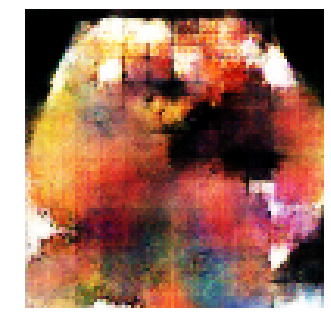


Epoch: 5820, D: -7.523, G: 2.065
Epoch: 5821, D: -6.118, G: 0.1927
Epoch: 5822, D: -6.311, G: 3.936
Epoch: 5823, D: -6.935, G: 0.6892
Epoch: 5824, D: -3.938, G: 5.463
Epoch: 5825, D: -6.954, G: 8.763
Epoch: 5826, D: -5.964, G: 2.205
Epoch: 5827, D: -5.441, G: 3.306
Epoch: 5828, D: -5.456, G: 6.064
Epoch: 5829, D: -5.94, G: 3.252
Epoch: 5830, D: -6.178, G: 3.29
Epoch: 5831, D: -5.104, G: 3.012
Epoch: 5832, D: -5.967, G: 5.997
Epoch: 5833, D: -5.595, G: 1.048
Epoch: 5834, D: -7.172, G: 3.011
Epoch: 5835, D: -6.005, G: 5.592
Epoch: 5836, D: -6.322, G: 4.226
Epoch: 5837, D: -5.26, G: 4.35
Epoch: 5838, D: -5.589, G: 4.156
Epoch: 5839, D: -5.637, G: 5.954


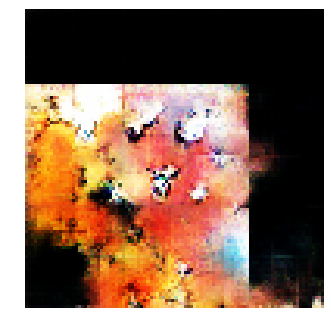


Epoch: 5840, D: -7.268, G: 0.7304
Epoch: 5841, D: -5.958, G: 3.98
Epoch: 5842, D: -5.674, G: 3.231
Epoch: 5843, D: -6.361, G: 4.947
Epoch: 5844, D: -5.385, G: 8.959
Epoch: 5845, D: -7.663, G: 2.935
Epoch: 5846, D: -6.199, G: 2.276
Epoch: 5847, D: -6.231, G: 2.291
Epoch: 5848, D: -6.586, G: 2.695
Epoch: 5849, D: -5.844, G: 3.932
Epoch: 5850, D: -4.855, G: 4.419
Epoch: 5851, D: -5.815, G: 3.65
Epoch: 5852, D: -4.567, G: 5.085
Epoch: 5853, D: -5.731, G: 7.54
Epoch: 5854, D: -7.554, G: 1.408
Epoch: 5855, D: -5.772, G: 2.099
Epoch: 5856, D: -6.575, G: 6.268
Epoch: 5857, D: -6.5, G: 3.917
Epoch: 5858, D: -5.276, G: 4.441
Epoch: 5859, D: -6.78, G: 3.04


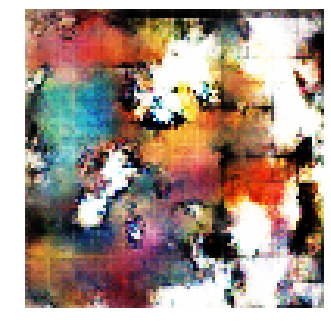


Epoch: 5860, D: -7.281, G: 4.088
Epoch: 5861, D: -5.27, G: 2.217
Epoch: 5862, D: -8.409, G: 3.47
Epoch: 5863, D: -5.891, G: 3.148
Epoch: 5864, D: -6.099, G: 3.118
Epoch: 5865, D: -7.5, G: 4.333
Epoch: 5866, D: -4.92, G: 3.927
Epoch: 5867, D: -5.39, G: 4.258
Epoch: 5868, D: -5.582, G: 6.418
Epoch: 5869, D: -8.065, G: 5.311
Epoch: 5870, D: -6.596, G: 4.566
Epoch: 5871, D: -7.429, G: 3.059
Epoch: 5872, D: -5.264, G: 2.04
Epoch: 5873, D: -6.302, G: 5.518
Epoch: 5874, D: -6.457, G: 4.594
Epoch: 5875, D: -7.078, G: 7.252
Epoch: 5876, D: -6.77, G: 4.466
Epoch: 5877, D: -5.264, G: 4.614
Epoch: 5878, D: -6.391, G: 2.356
Epoch: 5879, D: -5.816, G: 5.212


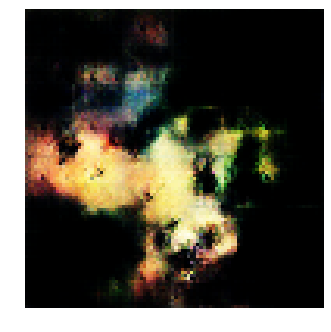


Epoch: 5880, D: -6.356, G: 3.681
Epoch: 5881, D: -6.401, G: 5.308
Epoch: 5882, D: -6.276, G: 8.647
Epoch: 5883, D: -5.459, G: 5.761
Epoch: 5884, D: -6.55, G: 3.432
Epoch: 5885, D: -7.523, G: 2.989
Epoch: 5886, D: -6.381, G: 3.358
Epoch: 5887, D: -5.672, G: 5.089
Epoch: 5888, D: -5.749, G: 3.891
Epoch: 5889, D: -5.72, G: 4.993
Epoch: 5890, D: -4.564, G: 3.806
Epoch: 5891, D: -5.48, G: 4.056
Epoch: 5892, D: -5.962, G: 5.696
Epoch: 5893, D: -7.562, G: 3.415
Epoch: 5894, D: -5.118, G: 3.568
Epoch: 5895, D: -6.937, G: 3.915
Epoch: 5896, D: -6.965, G: 4.934
Epoch: 5897, D: -6.39, G: 5.629
Epoch: 5898, D: -6.355, G: 0.3563
Epoch: 5899, D: -6.814, G: 4.34


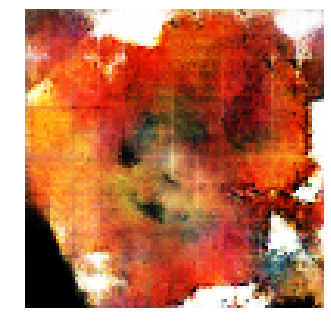


Epoch: 5900, D: -6.451, G: 3.255
Epoch: 5901, D: -7.145, G: 4.455
Epoch: 5902, D: -6.747, G: 2.395
Epoch: 5903, D: -6.08, G: 4.326
Epoch: 5904, D: -5.423, G: 2.816
Epoch: 5905, D: -6.522, G: 4.164
Epoch: 5906, D: -5.732, G: 3.309
Epoch: 5907, D: -7.506, G: 6.041
Epoch: 5908, D: -5.433, G: 2.367
Epoch: 5909, D: -7.039, G: 4.258
Epoch: 5910, D: -6.372, G: 7.311
Epoch: 5911, D: -5.334, G: 8.356
Epoch: 5912, D: -6.042, G: 7.091
Epoch: 5913, D: -5.303, G: 2.343
Epoch: 5914, D: -5.159, G: 4.312
Epoch: 5915, D: -6.755, G: 3.662
Epoch: 5916, D: -4.727, G: 1.639
Epoch: 5917, D: -7.354, G: 4.884
Epoch: 5918, D: -5.714, G: 3.214
Epoch: 5919, D: -5.933, G: 7.179


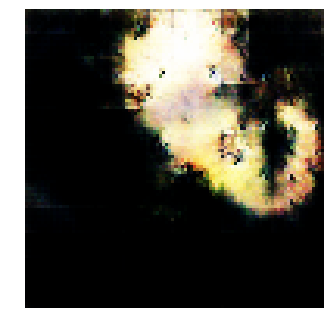


Epoch: 5920, D: -5.044, G: 6.219
Epoch: 5921, D: -6.59, G: 5.719
Epoch: 5922, D: -6.705, G: 5.559
Epoch: 5923, D: -5.89, G: 3.38
Epoch: 5924, D: -6.436, G: 4.533
Epoch: 5925, D: -7.069, G: 4.572
Epoch: 5926, D: -7.575, G: 4.485
Epoch: 5927, D: -4.795, G: 0.3401
Epoch: 5928, D: -6.219, G: 3.703
Epoch: 5929, D: -6.956, G: 2.075
Epoch: 5930, D: -6.855, G: 2.412
Epoch: 5931, D: -6.637, G: 3.286
Epoch: 5932, D: -4.968, G: 3.916
Epoch: 5933, D: -8.063, G: 2.499
Epoch: 5934, D: -5.654, G: 4.976
Epoch: 5935, D: -5.968, G: 7.285
Epoch: 5936, D: -6.667, G: 4.587
Epoch: 5937, D: -6.47, G: 2.775
Epoch: 5938, D: -7.512, G: 9.122
Epoch: 5939, D: -6.144, G: 1.548


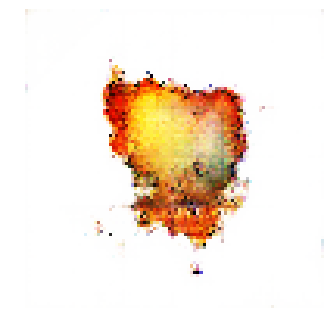


Epoch: 5940, D: -5.049, G: 4.193
Epoch: 5941, D: -7.913, G: 4.653
Epoch: 5942, D: -6.021, G: 0.5255
Epoch: 5943, D: -7.794, G: 6.133
Epoch: 5944, D: -5.585, G: 3.191
Epoch: 5945, D: -7.534, G: 6.431
Epoch: 5946, D: -6.075, G: 4.026
Epoch: 5947, D: -7.471, G: 6.072
Epoch: 5948, D: -7.2, G: 4.982
Epoch: 5949, D: -5.434, G: 9.706
Epoch: 5950, D: -8.367, G: 4.104
Epoch: 5951, D: -6.828, G: 4.819
Epoch: 5952, D: -6.889, G: 4.556
Epoch: 5953, D: -6.799, G: 3.306
Epoch: 5954, D: -6.896, G: 4.698
Epoch: 5955, D: -6.322, G: 2.146
Epoch: 5956, D: -6.871, G: 5.325
Epoch: 5957, D: -7.822, G: 3.285
Epoch: 5958, D: -6.405, G: 1.586
Epoch: 5959, D: -5.857, G: 2.275


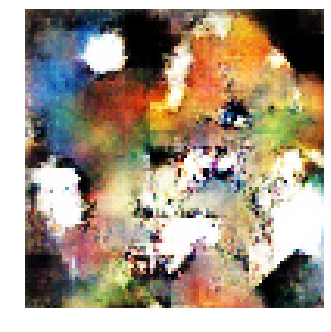


Epoch: 5960, D: -5.454, G: 7.463
Epoch: 5961, D: -7.275, G: 7.081
Epoch: 5962, D: -7.406, G: 5.178
Epoch: 5963, D: -4.372, G: 7.813
Epoch: 5964, D: -7.156, G: 7.543
Epoch: 5965, D: -6.082, G: 2.359
Epoch: 5966, D: -8.027, G: 5.204
Epoch: 5967, D: -5.968, G: 5.773
Epoch: 5968, D: -6.933, G: 5.444
Epoch: 5969, D: -6.562, G: 2.735
Epoch: 5970, D: -5.265, G: 3.718
Epoch: 5971, D: -6.034, G: 4.84
Epoch: 5972, D: -7.488, G: 2.424
Epoch: 5973, D: -6.488, G: 0.7516
Epoch: 5974, D: -7.643, G: 3.733
Epoch: 5975, D: -7.788, G: 4.412
Epoch: 5976, D: -4.488, G: 5.096
Epoch: 5977, D: -5.389, G: 5.087
Epoch: 5978, D: -5.317, G: 5.813
Epoch: 5979, D: -6.539, G: 3.253


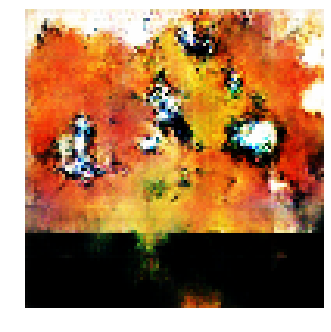


Epoch: 5980, D: -6.738, G: 3.801
Epoch: 5981, D: -5.786, G: 3.763
Epoch: 5982, D: -5.957, G: 4.743
Epoch: 5983, D: -6.059, G: 7.069
Epoch: 5984, D: -6.226, G: 4.177
Epoch: 5985, D: -7.072, G: 4.707
Epoch: 5986, D: -6.641, G: 4.384
Epoch: 5987, D: -5.026, G: 6.615
Epoch: 5988, D: -6.663, G: 5.091
Epoch: 5989, D: -6.709, G: 4.987
Epoch: 5990, D: -6.72, G: 4.552
Epoch: 5991, D: -5.923, G: 3.11
Epoch: 5992, D: -5.096, G: 1.873
Epoch: 5993, D: -7.599, G: 5.664
Epoch: 5994, D: -6.646, G: 4.712
Epoch: 5995, D: -5.566, G: 3.882
Epoch: 5996, D: -6.239, G: 4.529
Epoch: 5997, D: -5.216, G: 6.497
Epoch: 5998, D: -6.69, G: 6.918
Epoch: 5999, D: -5.708, G: 3.982


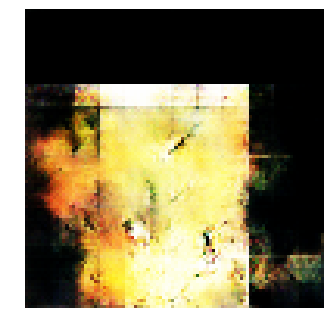


Epoch: 6000, D: -6.766, G: 4.206
Epoch: 6001, D: -6.543, G: 3.973
Epoch: 6002, D: -5.217, G: 2.37
Epoch: 6003, D: -5.364, G: 5.463
Epoch: 6004, D: -5.324, G: 2.612
Epoch: 6005, D: -8.157, G: 3.053
Epoch: 6006, D: -6.934, G: 5.273
Epoch: 6007, D: -7.976, G: 5.988
Epoch: 6008, D: -6.108, G: 4.615
Epoch: 6009, D: -6.16, G: 5.279
Epoch: 6010, D: -7.628, G: 3.227
Epoch: 6011, D: -5.753, G: 4.813
Epoch: 6012, D: -4.642, G: 3.06
Epoch: 6013, D: -6.204, G: 4.765
Epoch: 6014, D: -5.877, G: 4.329
Epoch: 6015, D: -6.306, G: 5.886
Epoch: 6016, D: -6.554, G: 5.54
Epoch: 6017, D: -7.308, G: 5.128
Epoch: 6018, D: -7.064, G: 4.226
Epoch: 6019, D: -6.12, G: 4.932


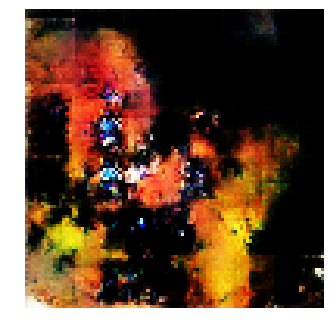


Epoch: 6020, D: -7.365, G: 6.299
Epoch: 6021, D: -4.895, G: 4.442
Epoch: 6022, D: -4.368, G: 5.562
Epoch: 6023, D: -6.058, G: 6.373
Epoch: 6024, D: -6.714, G: 4.038
Epoch: 6025, D: -6.296, G: 4.976
Epoch: 6026, D: -7.046, G: 3.013
Epoch: 6027, D: -7.199, G: 5.582
Epoch: 6028, D: -5.832, G: 3.913
Epoch: 6029, D: -6.874, G: 6.35
Epoch: 6030, D: -5.718, G: 6.441
Epoch: 6031, D: -6.734, G: 4.173
Epoch: 6032, D: -6.99, G: 4.282
Epoch: 6033, D: -6.907, G: 4.082
Epoch: 6034, D: -6.955, G: 6.648
Epoch: 6035, D: -6.264, G: 1.667
Epoch: 6036, D: -5.421, G: 5.504
Epoch: 6037, D: -7.042, G: 7.51
Epoch: 6038, D: -5.666, G: 6.652
Epoch: 6039, D: -7.922, G: 3.419


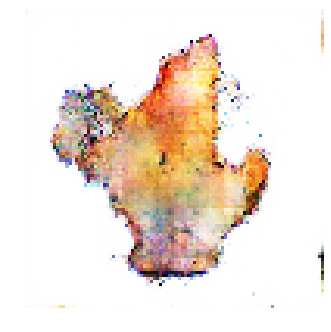


Epoch: 6040, D: -6.37, G: 2.708
Epoch: 6041, D: -6.726, G: 5.398
Epoch: 6042, D: -5.367, G: 3.507
Epoch: 6043, D: -6.893, G: 6.287
Epoch: 6044, D: -6.369, G: 2.75
Epoch: 6045, D: -5.995, G: 4.971
Epoch: 6046, D: -4.216, G: 4.827
Epoch: 6047, D: -6.173, G: 5.86
Epoch: 6048, D: -6.283, G: 6.14
Epoch: 6049, D: -7.14, G: 3.575
Epoch: 6050, D: -7.481, G: 3.297
Epoch: 6051, D: -6.777, G: -0.3405
Epoch: 6052, D: -6.473, G: 5.62
Epoch: 6053, D: -6.617, G: 4.432
Epoch: 6054, D: -5.86, G: 6.031
Epoch: 6055, D: -7.492, G: 5.595
Epoch: 6056, D: -5.643, G: 4.15
Epoch: 6057, D: -7.778, G: 2.762
Epoch: 6058, D: -6.654, G: 5.678
Epoch: 6059, D: -7.151, G: 7.202


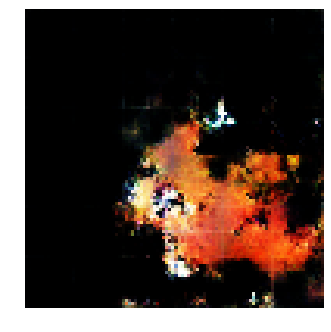


Epoch: 6060, D: -7.409, G: 4.406
Epoch: 6061, D: -7.025, G: 2.606
Epoch: 6062, D: -5.723, G: 5.129
Epoch: 6063, D: -7.656, G: 5.118
Epoch: 6064, D: -7.722, G: 2.866
Epoch: 6065, D: -5.306, G: 2.745
Epoch: 6066, D: -7.399, G: 5.545
Epoch: 6067, D: -5.853, G: 4.942
Epoch: 6068, D: -7.451, G: 6.1
Epoch: 6069, D: -5.829, G: 3.931
Epoch: 6070, D: -6.748, G: 5.212
Epoch: 6071, D: -6.771, G: 3.151
Epoch: 6072, D: -5.3, G: 2.353
Epoch: 6073, D: -6.433, G: 1.907
Epoch: 6074, D: -7.572, G: 2.845
Epoch: 6075, D: -6.697, G: 2.059
Epoch: 6076, D: -4.815, G: 3.53
Epoch: 6077, D: -7.094, G: 6.519
Epoch: 6078, D: -6.915, G: 7.573
Epoch: 6079, D: -7.138, G: 2.369


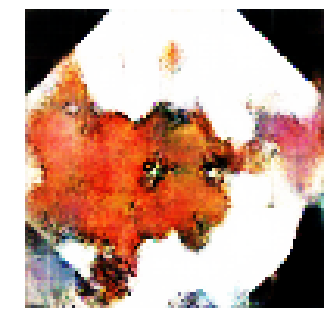


Epoch: 6080, D: -5.794, G: 3.878
Epoch: 6081, D: -7.895, G: 6.308
Epoch: 6082, D: -6.15, G: 3.718
Epoch: 6083, D: -6.022, G: 5.689
Epoch: 6084, D: -8.079, G: 7.924
Epoch: 6085, D: -7.77, G: 6.2
Epoch: 6086, D: -6.167, G: 5.485
Epoch: 6087, D: -5.264, G: 7.095
Epoch: 6088, D: -6.461, G: 6.087
Epoch: 6089, D: -8.272, G: 6.119
Epoch: 6090, D: -7.663, G: 2.793
Epoch: 6091, D: -5.493, G: 0.8667
Epoch: 6092, D: -6.592, G: 5.292
Epoch: 6093, D: -6.429, G: 6.53
Epoch: 6094, D: -7.072, G: 3.015
Epoch: 6095, D: -6.404, G: 2.994
Epoch: 6096, D: -7.097, G: 2.932
Epoch: 6097, D: -6.983, G: 3.605
Epoch: 6098, D: -6.812, G: 5.767
Epoch: 6099, D: -7.724, G: 6.487


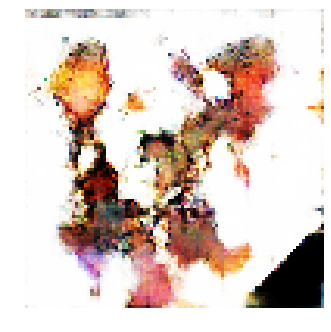


Epoch: 6100, D: -5.755, G: 5.849
Epoch: 6101, D: -7.318, G: 7.012
Epoch: 6102, D: -7.615, G: 3.338
Epoch: 6103, D: -5.546, G: 3.994
Epoch: 6104, D: -6.01, G: 8.256
Epoch: 6105, D: -6.005, G: 3.257
Epoch: 6106, D: -6.956, G: 5.576
Epoch: 6107, D: -6.692, G: 1.754
Epoch: 6108, D: -7.181, G: 3.306
Epoch: 6109, D: -5.613, G: 3.17
Epoch: 6110, D: -7.019, G: 3.331
Epoch: 6111, D: -7.188, G: 3.85
Epoch: 6112, D: -7.526, G: 3.329
Epoch: 6113, D: -6.62, G: 1.949
Epoch: 6114, D: -6.646, G: 4.688
Epoch: 6115, D: -6.853, G: 2.77
Epoch: 6116, D: -7.547, G: 3.924
Epoch: 6117, D: -7.049, G: 4.461
Epoch: 6118, D: -6.932, G: 2.369
Epoch: 6119, D: -6.963, G: 5.42


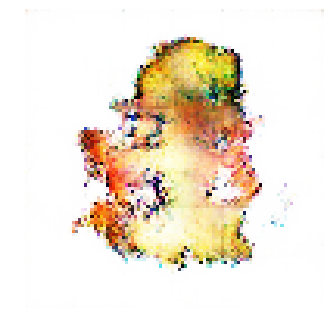


Epoch: 6120, D: -8.061, G: 5.121
Epoch: 6121, D: -8.164, G: 3.883
Epoch: 6122, D: -5.961, G: 7.888
Epoch: 6123, D: -6.904, G: 4.541
Epoch: 6124, D: -7.525, G: 5.09
Epoch: 6125, D: -7.365, G: 3.906
Epoch: 6126, D: -6.34, G: 5.741
Epoch: 6127, D: -7.208, G: 6.103
Epoch: 6128, D: -5.972, G: 5.149
Epoch: 6129, D: -7.676, G: 7.133
Epoch: 6130, D: -7.028, G: 3.556
Epoch: 6131, D: -7.361, G: 4.378
Epoch: 6132, D: -8.008, G: 4.915
Epoch: 6133, D: -6.635, G: 4.764
Epoch: 6134, D: -5.522, G: 5.214
Epoch: 6135, D: -5.729, G: 5.496
Epoch: 6136, D: -6.616, G: 7.664
Epoch: 6137, D: -7.978, G: 3.466
Epoch: 6138, D: -6.056, G: 0.8742
Epoch: 6139, D: -7.675, G: 4.771


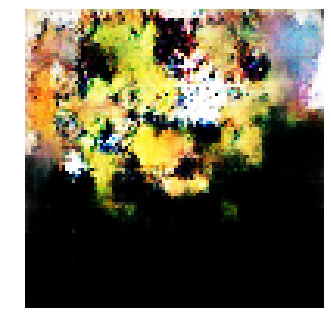


Epoch: 6140, D: -6.109, G: 5.6
Epoch: 6141, D: -7.629, G: 5.291
Epoch: 6142, D: -8.151, G: 5.147
Epoch: 6143, D: -5.929, G: 4.825
Epoch: 6144, D: -7.959, G: 4.562
Epoch: 6145, D: -7.019, G: 7.157
Epoch: 6146, D: -7.053, G: 6.137
Epoch: 6147, D: -6.243, G: 7.23
Epoch: 6148, D: -6.744, G: 5.257
Epoch: 6149, D: -7.078, G: 3.63
Epoch: 6150, D: -6.842, G: 3.872
Epoch: 6151, D: -5.774, G: 5.66
Epoch: 6152, D: -6.488, G: 4.177
Epoch: 6153, D: -7.922, G: 8.265
Epoch: 6154, D: -5.207, G: 5.34
Epoch: 6155, D: -6.914, G: 4.616
Epoch: 6156, D: -7.994, G: 3.701
Epoch: 6157, D: -6.026, G: 5.299
Epoch: 6158, D: -5.951, G: 3.897
Epoch: 6159, D: -6.892, G: 5.048


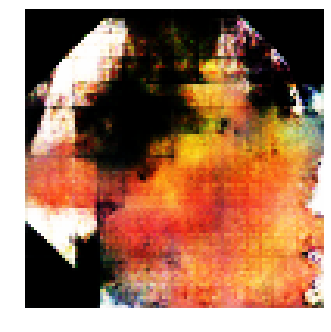


Epoch: 6160, D: -5.157, G: 4.518
Epoch: 6161, D: -5.957, G: 5.36
Epoch: 6162, D: -5.603, G: 4.846
Epoch: 6163, D: -7.646, G: 5.254
Epoch: 6164, D: -6.324, G: 6.613
Epoch: 6165, D: -6.386, G: 2.74
Epoch: 6166, D: -5.697, G: 3.89
Epoch: 6167, D: -6.04, G: 7.531
Epoch: 6168, D: -7.568, G: 4.197
Epoch: 6169, D: -7.676, G: 2.896
Epoch: 6170, D: -6.766, G: 3.839
Epoch: 6171, D: -5.7, G: 3.014
Epoch: 6172, D: -4.961, G: 4.707
Epoch: 6173, D: -5.343, G: 5.072
Epoch: 6174, D: -6.536, G: 7.441
Epoch: 6175, D: -6.656, G: 6.175
Epoch: 6176, D: -7.908, G: 2.864
Epoch: 6177, D: -6.445, G: 2.865
Epoch: 6178, D: -6.323, G: 5.011
Epoch: 6179, D: -4.957, G: 6.016


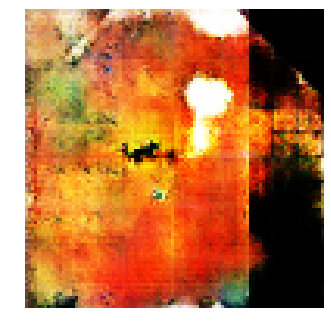


Epoch: 6180, D: -5.513, G: 6.361
Epoch: 6181, D: -5.767, G: 6.417
Epoch: 6182, D: -6.546, G: 4.18
Epoch: 6183, D: -7.253, G: 7.431
Epoch: 6184, D: -5.179, G: 3.579
Epoch: 6185, D: -5.043, G: 4.181
Epoch: 6186, D: -6.23, G: 4.717
Epoch: 6187, D: -5.795, G: 3.942
Epoch: 6188, D: -6.798, G: 2.432
Epoch: 6189, D: -4.054, G: 2.884
Epoch: 6190, D: -5.684, G: 2.541
Epoch: 6191, D: -6.319, G: 6.088
Epoch: 6192, D: -5.644, G: 3.01
Epoch: 6193, D: -6.003, G: 4.295
Epoch: 6194, D: -5.912, G: 3.367
Epoch: 6195, D: -7.444, G: 4.921
Epoch: 6196, D: -7.932, G: 2.433
Epoch: 6197, D: -5.375, G: 3.934
Epoch: 6198, D: -7.734, G: 5.76
Epoch: 6199, D: -7.383, G: 4.616


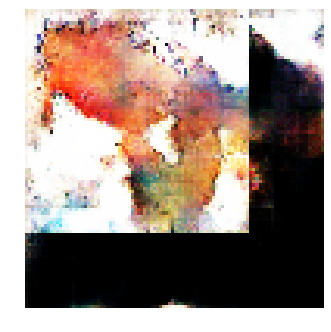


Epoch: 6200, D: -7.332, G: 3.547
Epoch: 6201, D: -7.054, G: -0.6536
Epoch: 6202, D: -4.648, G: 4.27
Epoch: 6203, D: -6.175, G: 4.831
Epoch: 6204, D: -8.271, G: 3.587
Epoch: 6205, D: -6.398, G: 1.801
Epoch: 6206, D: -6.124, G: 5.676
Epoch: 6207, D: -7.045, G: 5.366
Epoch: 6208, D: -7.402, G: 3.024
Epoch: 6209, D: -5.671, G: 5.442
Epoch: 6210, D: -5.939, G: 2.7
Epoch: 6211, D: -7.014, G: 4.063
Epoch: 6212, D: -6.672, G: 4.265
Epoch: 6213, D: -6.639, G: 5.111
Epoch: 6214, D: -5.9, G: 2.991
Epoch: 6215, D: -6.618, G: 3.02
Epoch: 6216, D: -6.565, G: 1.765
Epoch: 6217, D: -7.256, G: 2.978
Epoch: 6218, D: -8.063, G: 1.65
Epoch: 6219, D: -7.897, G: -0.9494


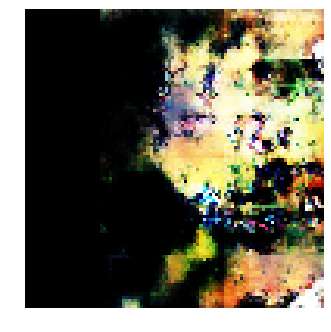


Epoch: 6220, D: -6.268, G: 5.743
Epoch: 6221, D: -5.81, G: 3.342
Epoch: 6222, D: -6.43, G: 5.578
Epoch: 6223, D: -7.717, G: 2.88
Epoch: 6224, D: -5.246, G: 2.379
Epoch: 6225, D: -7.131, G: 5.341
Epoch: 6226, D: -7.524, G: 5.577
Epoch: 6227, D: -7.115, G: 4.794
Epoch: 6228, D: -5.911, G: 7.22
Epoch: 6229, D: -7.299, G: 6.655
Epoch: 6230, D: -6.648, G: 3.865
Epoch: 6231, D: -6.07, G: 7.646
Epoch: 6232, D: -7.281, G: 4.507
Epoch: 6233, D: -5.043, G: 4.143
Epoch: 6234, D: -5.518, G: 6.343
Epoch: 6235, D: -3.607, G: 2.343
Epoch: 6236, D: -6.915, G: 4.301
Epoch: 6237, D: -5.855, G: 3.9
Epoch: 6238, D: -6.709, G: 4.222
Epoch: 6239, D: -6.362, G: 4.638


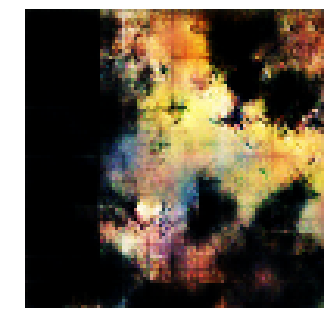


Epoch: 6240, D: -6.085, G: 6.225
Epoch: 6241, D: -6.316, G: 6.581
Epoch: 6242, D: -6.336, G: 3.393
Epoch: 6243, D: -6.061, G: 4.041
Epoch: 6244, D: -6.017, G: 5.357
Epoch: 6245, D: -6.768, G: 4.8
Epoch: 6246, D: -6.088, G: 6.093
Epoch: 6247, D: -7.057, G: 5.497
Epoch: 6248, D: -7.515, G: 3.086
Epoch: 6249, D: -7.675, G: 6.19
Epoch: 6250, D: -4.64, G: 6.8
Epoch: 6251, D: -5.307, G: 4.333
Epoch: 6252, D: -6.083, G: 5.034
Epoch: 6253, D: -6.282, G: 7.16
Epoch: 6254, D: -8.198, G: 5.531
Epoch: 6255, D: -5.959, G: 4.322
Epoch: 6256, D: -6.72, G: 2.274
Epoch: 6257, D: -6.475, G: 6.557
Epoch: 6258, D: -6.392, G: 2.944
Epoch: 6259, D: -6.528, G: 1.569


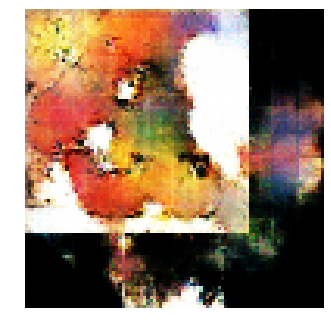


Epoch: 6260, D: -5.922, G: 2.805
Epoch: 6261, D: -5.397, G: 2.064
Epoch: 6262, D: -6.52, G: 4.828
Epoch: 6263, D: -5.67, G: 5.504
Epoch: 6264, D: -5.393, G: 6.081
Epoch: 6265, D: -7.221, G: 3.498
Epoch: 6266, D: -5.909, G: 3.452
Epoch: 6267, D: -6.353, G: 4.812
Epoch: 6268, D: -6.793, G: 4.894
Epoch: 6269, D: -6.483, G: 4.193
Epoch: 6270, D: -6.671, G: 6.652
Epoch: 6271, D: -5.632, G: 4.27
Epoch: 6272, D: -5.165, G: 4.284
Epoch: 6273, D: -6.184, G: 4.363
Epoch: 6274, D: -5.563, G: 4.904
Epoch: 6275, D: -6.877, G: 9.413
Epoch: 6276, D: -7.254, G: 6.882
Epoch: 6277, D: -6.848, G: 5.089
Epoch: 6278, D: -5.468, G: 3.878
Epoch: 6279, D: -6.556, G: 6.105


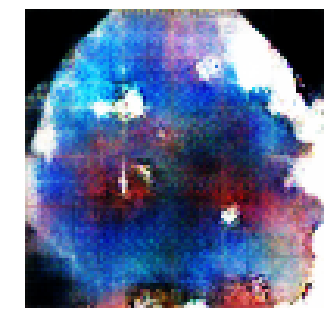


Epoch: 6280, D: -6.375, G: 3.283
Epoch: 6281, D: -7.48, G: 4.652
Epoch: 6282, D: -6.599, G: 2.858
Epoch: 6283, D: -6.483, G: 6.138
Epoch: 6284, D: -6.277, G: 1.752
Epoch: 6285, D: -5.341, G: 3.82
Epoch: 6286, D: -8.845, G: 5.364
Epoch: 6287, D: -7.931, G: 2.636
Epoch: 6288, D: -6.121, G: 3.598
Epoch: 6289, D: -6.116, G: 1.398
Epoch: 6290, D: -6.562, G: 4.696
Epoch: 6291, D: -5.081, G: 5.562
Epoch: 6292, D: -8.055, G: 3.353
Epoch: 6293, D: -6.277, G: -0.9637
Epoch: 6294, D: -7.099, G: 2.843
Epoch: 6295, D: -6.329, G: 4.288
Epoch: 6296, D: -6.439, G: 3.593
Epoch: 6297, D: -7.031, G: 1.909
Epoch: 6298, D: -5.807, G: 4.663
Epoch: 6299, D: -4.667, G: 3.4


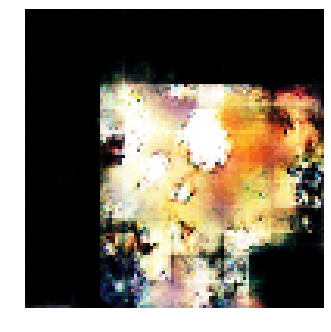


Epoch: 6300, D: -4.647, G: 3.494
Epoch: 6301, D: -7.652, G: 5.757
Epoch: 6302, D: -6.492, G: 4.294
Epoch: 6303, D: -5.452, G: 3.972
Epoch: 6304, D: -5.945, G: 4.223
Epoch: 6305, D: -6.383, G: 3.883
Epoch: 6306, D: -6.443, G: 4.868
Epoch: 6307, D: -5.512, G: 5.824
Epoch: 6308, D: -5.772, G: 6.892
Epoch: 6309, D: -5.92, G: 6.647
Epoch: 6310, D: -7.555, G: 6.473
Epoch: 6311, D: -7.078, G: 6.691
Epoch: 6312, D: -6.646, G: 8.08
Epoch: 6313, D: -7.653, G: 3.923
Epoch: 6314, D: -6.663, G: 3.764
Epoch: 6315, D: -8.234, G: 4.853
Epoch: 6316, D: -5.799, G: 4.171
Epoch: 6317, D: -6.806, G: 2.681
Epoch: 6318, D: -6.811, G: 3.847
Epoch: 6319, D: -7.579, G: 5.719


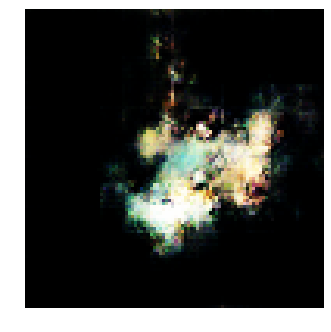


Epoch: 6320, D: -7.054, G: 5.152
Epoch: 6321, D: -7.674, G: 3.463
Epoch: 6322, D: -5.837, G: 2.964
Epoch: 6323, D: -5.969, G: 7.776
Epoch: 6324, D: -7.503, G: 1.117
Epoch: 6325, D: -6.175, G: 2.383
Epoch: 6326, D: -5.203, G: 7.019
Epoch: 6327, D: -6.427, G: 5.401
Epoch: 6328, D: -6.787, G: 3.025
Epoch: 6329, D: -5.044, G: 2.639
Epoch: 6330, D: -7.543, G: 3.031
Epoch: 6331, D: -5.561, G: 4.283
Epoch: 6332, D: -5.721, G: 5.346
Epoch: 6333, D: -7.093, G: 3.403
Epoch: 6334, D: -7.757, G: 5.574
Epoch: 6335, D: -6.467, G: 4.048
Epoch: 6336, D: -5.741, G: 5.143
Epoch: 6337, D: -6.237, G: 3.887
Epoch: 6338, D: -5.903, G: 5.291
Epoch: 6339, D: -7.167, G: 5.036


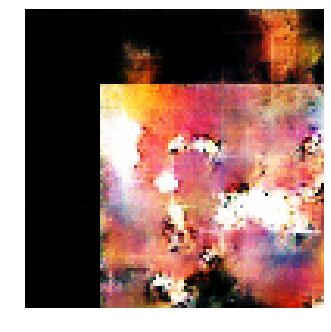


Epoch: 6340, D: -5.293, G: 3.655
Epoch: 6341, D: -5.279, G: 6.447
Epoch: 6342, D: -6.202, G: 3.091
Epoch: 6343, D: -5.089, G: 4.599
Epoch: 6344, D: -6.885, G: 4.037
Epoch: 6345, D: -7.276, G: 4.904
Epoch: 6346, D: -6.935, G: 3.184
Epoch: 6347, D: -6.545, G: 5.169
Epoch: 6348, D: -6.185, G: 6.106
Epoch: 6349, D: -5.62, G: 5.082
Epoch: 6350, D: -5.867, G: 4.836
Epoch: 6351, D: -6.109, G: 4.095
Epoch: 6352, D: -6.315, G: 7.307
Epoch: 6353, D: -6.354, G: 4.053
Epoch: 6354, D: -6.652, G: 4.111
Epoch: 6355, D: -5.574, G: 5.442
Epoch: 6356, D: -6.506, G: 4.459
Epoch: 6357, D: -5.517, G: 5.446
Epoch: 6358, D: -6.201, G: 4.544
Epoch: 6359, D: -7.054, G: 4.989


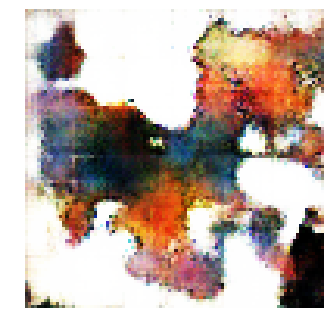


Epoch: 6360, D: -6.818, G: 3.231
Epoch: 6361, D: -6.5, G: 4.45
Epoch: 6362, D: -7.66, G: 5.076
Epoch: 6363, D: -6.585, G: 1.6
Epoch: 6364, D: -7.071, G: 6.131
Epoch: 6365, D: -6.677, G: 5.638
Epoch: 6366, D: -6.179, G: 4.894
Epoch: 6367, D: -8.394, G: 4.521
Epoch: 6368, D: -7.023, G: 3.149
Epoch: 6369, D: -5.19, G: 6.05
Epoch: 6370, D: -6.614, G: 5.842
Epoch: 6371, D: -7.086, G: 2.473
Epoch: 6372, D: -6.242, G: 1.518
Epoch: 6373, D: -5.828, G: 6.738
Epoch: 6374, D: -6.376, G: 3.437
Epoch: 6375, D: -6.119, G: 3.392
Epoch: 6376, D: -7.252, G: 2.194
Epoch: 6377, D: -7.601, G: 2.466
Epoch: 6378, D: -6.33, G: 4.849
Epoch: 6379, D: -6.432, G: 5.528


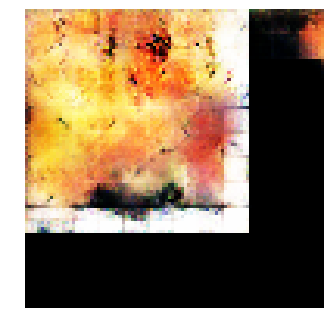


Epoch: 6380, D: -5.942, G: 3.162
Epoch: 6381, D: -5.093, G: 4.591
Epoch: 6382, D: -6.346, G: 7.323
Epoch: 6383, D: -7.212, G: 4.407
Epoch: 6384, D: -7.755, G: 5.147
Epoch: 6385, D: -6.159, G: 3.426
Epoch: 6386, D: -6.282, G: 2.447
Epoch: 6387, D: -6.699, G: 6.028
Epoch: 6388, D: -6.351, G: 1.982
Epoch: 6389, D: -6.35, G: 3.299
Epoch: 6390, D: -5.871, G: 6.279
Epoch: 6391, D: -7.764, G: 2.524
Epoch: 6392, D: -5.538, G: 3.299
Epoch: 6393, D: -5.742, G: 3.574
Epoch: 6394, D: -6.242, G: 5.355
Epoch: 6395, D: -5.779, G: 4.606
Epoch: 6396, D: -6.085, G: 2.141
Epoch: 6397, D: -7.055, G: 6.923
Epoch: 6398, D: -5.846, G: 6.764
Epoch: 6399, D: -7.015, G: 4.51


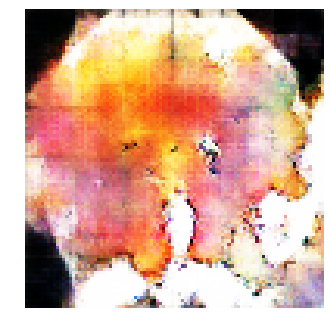


Epoch: 6400, D: -6.621, G: 2.417
Epoch: 6401, D: -5.941, G: 3.195
Epoch: 6402, D: -7.063, G: 4.617
Epoch: 6403, D: -5.85, G: 2.882
Epoch: 6404, D: -7.25, G: 5.185
Epoch: 6405, D: -6.935, G: 4.798
Epoch: 6406, D: -5.753, G: 4.267
Epoch: 6407, D: -6.846, G: 4.22
Epoch: 6408, D: -4.282, G: 3.815
Epoch: 6409, D: -7.37, G: 6.712
Epoch: 6410, D: -4.926, G: 2.732
Epoch: 6411, D: -5.511, G: 4.354
Epoch: 6412, D: -6.722, G: 1.872
Epoch: 6413, D: -7.18, G: 2.438
Epoch: 6414, D: -6.481, G: 3.467
Epoch: 6415, D: -6.327, G: 7.301
Epoch: 6416, D: -7.179, G: 5.425
Epoch: 6417, D: -5.007, G: 3.981
Epoch: 6418, D: -5.803, G: 3.924
Epoch: 6419, D: -5.452, G: 5.586


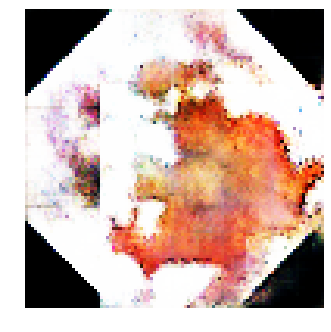


Epoch: 6420, D: -6.27, G: 5.666
Epoch: 6421, D: -6.725, G: 4.943
Epoch: 6422, D: -5.897, G: 3.611
Epoch: 6423, D: -7.399, G: 3.036
Epoch: 6424, D: -5.973, G: 5.609
Epoch: 6425, D: -5.615, G: 3.978
Epoch: 6426, D: -5.581, G: 4.187
Epoch: 6427, D: -5.904, G: 4.761
Epoch: 6428, D: -6.337, G: 3.305
Epoch: 6429, D: -6.691, G: 2.695
Epoch: 6430, D: -6.232, G: 6.22
Epoch: 6431, D: -6.028, G: 5.393
Epoch: 6432, D: -5.971, G: 3.799
Epoch: 6433, D: -7.144, G: 3.637
Epoch: 6434, D: -6.116, G: 4.844
Epoch: 6435, D: -7.509, G: 6.084
Epoch: 6436, D: -5.312, G: 4.988
Epoch: 6437, D: -7.398, G: 7.467
Epoch: 6438, D: -7.214, G: 3.984
Epoch: 6439, D: -5.932, G: 4.492


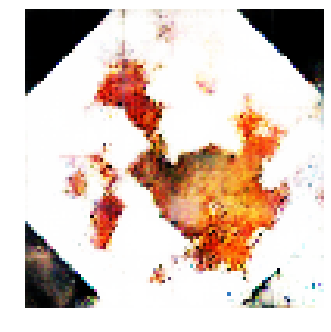


Epoch: 6440, D: -6.046, G: 4.973
Epoch: 6441, D: -7.17, G: 4.236
Epoch: 6442, D: -5.931, G: 3.168
Epoch: 6443, D: -6.336, G: 2.524
Epoch: 6444, D: -6.035, G: 4.62
Epoch: 6445, D: -6.674, G: 1.843
Epoch: 6446, D: -5.556, G: 3.286
Epoch: 6447, D: -6.295, G: 5.355
Epoch: 6448, D: -5.167, G: 3.717
Epoch: 6449, D: -6.865, G: 6.307
Epoch: 6450, D: -7.315, G: 4.142
Epoch: 6451, D: -7.805, G: 4.077
Epoch: 6452, D: -7.761, G: 3.646
Epoch: 6453, D: -7.55, G: 2.518
Epoch: 6454, D: -6.487, G: 1.782
Epoch: 6455, D: -6.819, G: 5.215
Epoch: 6456, D: -7.413, G: 0.932
Epoch: 6457, D: -6.582, G: 2.059
Epoch: 6458, D: -7.314, G: 2.436
Epoch: 6459, D: -6.779, G: 5.552


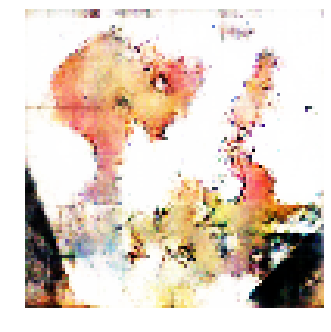


Epoch: 6460, D: -6.742, G: 4.84
Epoch: 6461, D: -5.703, G: 3.422
Epoch: 6462, D: -5.071, G: 2.081
Epoch: 6463, D: -7.575, G: 5.429
Epoch: 6464, D: -6.949, G: 3.185
Epoch: 6465, D: -7.547, G: 3.735
Epoch: 6466, D: -7.069, G: 2.223
Epoch: 6467, D: -6.346, G: 4.997
Epoch: 6468, D: -7.133, G: 5.948
Epoch: 6469, D: -7.12, G: 5.797
Epoch: 6470, D: -6.991, G: 4.11
Epoch: 6471, D: -6.394, G: 2.929
Epoch: 6472, D: -5.483, G: 6.493
Epoch: 6473, D: -6.208, G: 5.148
Epoch: 6474, D: -6.858, G: 3.794
Epoch: 6475, D: -6.723, G: 2.773
Epoch: 6476, D: -5.876, G: 2.676
Epoch: 6477, D: -6.007, G: 1.367
Epoch: 6478, D: -7.328, G: 3.58
Epoch: 6479, D: -6.967, G: 6.926


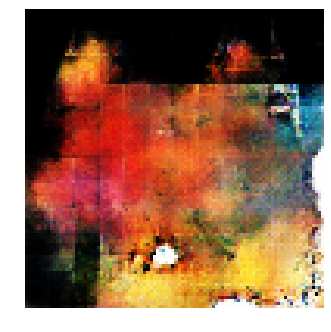


Epoch: 6480, D: -5.397, G: 4.353
Epoch: 6481, D: -7.401, G: 3.775
Epoch: 6482, D: -7.432, G: 3.848
Epoch: 6483, D: -7.325, G: 4.052
Epoch: 6484, D: -6.834, G: 2.262
Epoch: 6485, D: -6.069, G: 2.859
Epoch: 6486, D: -6.448, G: 3.424
Epoch: 6487, D: -5.913, G: 4.038
Epoch: 6488, D: -6.403, G: 4.18
Epoch: 6489, D: -6.244, G: 6.042
Epoch: 6490, D: -7.367, G: 5.459
Epoch: 6491, D: -7.166, G: 4.278
Epoch: 6492, D: -6.628, G: 4.444
Epoch: 6493, D: -6.718, G: 5.558
Epoch: 6494, D: -6.071, G: 5.296
Epoch: 6495, D: -7.095, G: 7.31
Epoch: 6496, D: -7.559, G: 1.393
Epoch: 6497, D: -7.457, G: 2.906
Epoch: 6498, D: -6.148, G: 7.033
Epoch: 6499, D: -6.066, G: 6.967


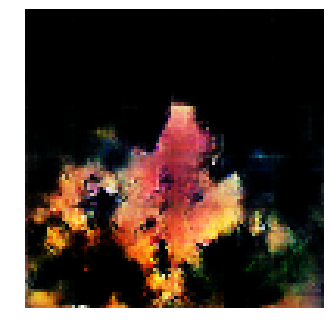


Epoch: 6500, D: -5.918, G: 2.195
Epoch: 6501, D: -7.166, G: 7.739
Epoch: 6502, D: -6.291, G: 2.773
Epoch: 6503, D: -6.555, G: 3.755
Epoch: 6504, D: -6.323, G: 2.912
Epoch: 6505, D: -5.791, G: 6.781
Epoch: 6506, D: -7.103, G: 6.633
Epoch: 6507, D: -6.436, G: 4.151
Epoch: 6508, D: -6.811, G: 3.095
Epoch: 6509, D: -7.683, G: 2.448
Epoch: 6510, D: -6.557, G: 5.068
Epoch: 6511, D: -5.023, G: 1.831
Epoch: 6512, D: -6.912, G: 4.242
Epoch: 6513, D: -4.728, G: 2.115
Epoch: 6514, D: -6.315, G: 3.869
Epoch: 6515, D: -6.017, G: 1.584
Epoch: 6516, D: -5.769, G: 3.235
Epoch: 6517, D: -5.094, G: 5.491
Epoch: 6518, D: -7.187, G: 5.289
Epoch: 6519, D: -5.708, G: 5.341


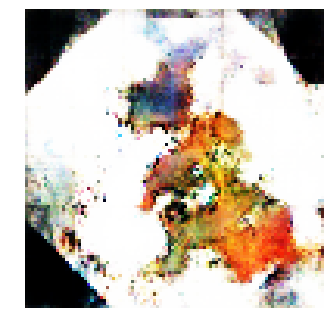


Epoch: 6520, D: -7.314, G: 4.724
Epoch: 6521, D: -5.657, G: 2.634
Epoch: 6522, D: -7.6, G: 4.706
Epoch: 6523, D: -5.451, G: 4.449
Epoch: 6524, D: -7.135, G: 4.672
Epoch: 6525, D: -5.682, G: 4.269
Epoch: 6526, D: -5.066, G: 3.876
Epoch: 6527, D: -6.782, G: 4.42
Epoch: 6528, D: -6.508, G: 3.323
Epoch: 6529, D: -6.428, G: 2.382
Epoch: 6530, D: -6.138, G: 2.152
Epoch: 6531, D: -5.901, G: 4.001
Epoch: 6532, D: -6.492, G: 5.984
Epoch: 6533, D: -7.802, G: 3.927
Epoch: 6534, D: -4.516, G: 4.171
Epoch: 6535, D: -8.079, G: 4.638
Epoch: 6536, D: -7.22, G: 3.53
Epoch: 6537, D: -5.739, G: 2.366
Epoch: 6538, D: -6.172, G: 4.765
Epoch: 6539, D: -6.017, G: 2.736


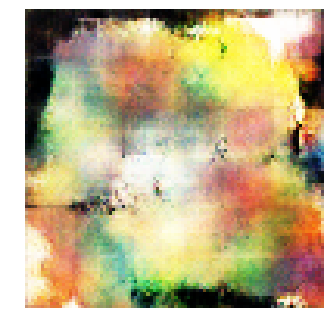


Epoch: 6540, D: -4.452, G: 3.026
Epoch: 6541, D: -6.895, G: 4.653
Epoch: 6542, D: -6.555, G: 5.159
Epoch: 6543, D: -7.073, G: 4.738
Epoch: 6544, D: -6.575, G: 2.141
Epoch: 6545, D: -6.288, G: 4.716
Epoch: 6546, D: -6.242, G: 2.946
Epoch: 6547, D: -7.281, G: 4.283
Epoch: 6548, D: -7.719, G: 1.148
Epoch: 6549, D: -6.141, G: 3.685
Epoch: 6550, D: -6.715, G: 4.757
Epoch: 6551, D: -6.664, G: 6.016
Epoch: 6552, D: -7.84, G: 4.658
Epoch: 6553, D: -7.1, G: 1.66
Epoch: 6554, D: -5.348, G: 1.823
Epoch: 6555, D: -6.594, G: 4.59
Epoch: 6556, D: -6.807, G: 3.319
Epoch: 6557, D: -5.188, G: 2.928
Epoch: 6558, D: -7.578, G: 2.55
Epoch: 6559, D: -5.161, G: 1.319


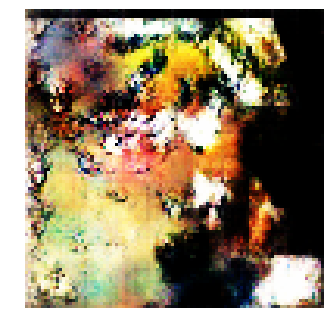


Epoch: 6560, D: -7.851, G: 4.578
Epoch: 6561, D: -6.264, G: 4.154
Epoch: 6562, D: -6.887, G: 1.787
Epoch: 6563, D: -7.384, G: 2.277
Epoch: 6564, D: -6.329, G: 5.561
Epoch: 6565, D: -7.197, G: 1.298
Epoch: 6566, D: -7.442, G: 6.268
Epoch: 6567, D: -7.861, G: 3.765
Epoch: 6568, D: -8.169, G: 1.051
Epoch: 6569, D: -6.209, G: 4.098
Epoch: 6570, D: -4.625, G: 1.059
Epoch: 6571, D: -5.289, G: 5.414
Epoch: 6572, D: -5.942, G: 3.584
Epoch: 6573, D: -7.363, G: 3.825
Epoch: 6574, D: -7.037, G: 4.022
Epoch: 6575, D: -5.55, G: 4.545
Epoch: 6576, D: -5.984, G: 2.498
Epoch: 6577, D: -6.226, G: 3.032
Epoch: 6578, D: -7.181, G: 0.782
Epoch: 6579, D: -8.685, G: 4.699


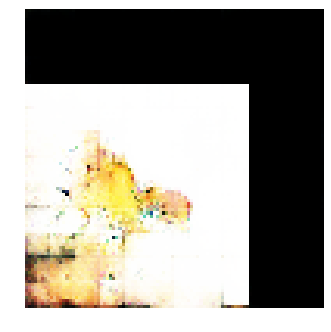


Epoch: 6580, D: -5.642, G: 1.513
Epoch: 6581, D: -6.893, G: 2.854
Epoch: 6582, D: -6.504, G: 3.851
Epoch: 6583, D: -6.809, G: 4.451
Epoch: 6584, D: -6.852, G: 2.63
Epoch: 6585, D: -7.308, G: 7.022
Epoch: 6586, D: -5.879, G: 2.124
Epoch: 6587, D: -6.685, G: 3.828
Epoch: 6588, D: -7.345, G: 4.959
Epoch: 6589, D: -6.459, G: 2.738
Epoch: 6590, D: -5.03, G: 3.49
Epoch: 6591, D: -7.031, G: 0.1292
Epoch: 6592, D: -6.898, G: 4.345
Epoch: 6593, D: -6.475, G: 1.46
Epoch: 6594, D: -6.673, G: 2.334
Epoch: 6595, D: -6.197, G: 2.356
Epoch: 6596, D: -5.373, G: 3.56
Epoch: 6597, D: -5.757, G: 6.583
Epoch: 6598, D: -6.272, G: 3.414
Epoch: 6599, D: -6.095, G: 2.822


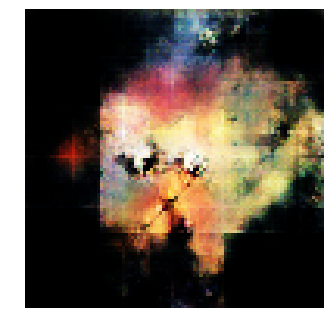


Epoch: 6600, D: -6.799, G: 6.529
Epoch: 6601, D: -6.492, G: 1.801
Epoch: 6602, D: -6.497, G: 4.816
Epoch: 6603, D: -5.934, G: 3.132
Epoch: 6604, D: -5.707, G: 6.74
Epoch: 6605, D: -6.236, G: 4.409
Epoch: 6606, D: -6.149, G: 3.77
Epoch: 6607, D: -5.577, G: 3.048
Epoch: 6608, D: -6.994, G: 3.713
Epoch: 6609, D: -7.592, G: 6.482
Epoch: 6610, D: -6.003, G: 4.171
Epoch: 6611, D: -5.819, G: 7.797
Epoch: 6612, D: -6.962, G: 5.646
Epoch: 6613, D: -6.796, G: 4.267
Epoch: 6614, D: -6.532, G: 6.02
Epoch: 6615, D: -5.857, G: 3.367
Epoch: 6616, D: -6.063, G: 5.143
Epoch: 6617, D: -6.522, G: 4.994
Epoch: 6618, D: -6.478, G: 4.349
Epoch: 6619, D: -5.914, G: 2.116


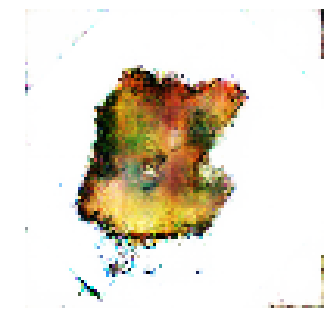


Epoch: 6620, D: -6.454, G: 4.72
Epoch: 6621, D: -6.052, G: 3.581
Epoch: 6622, D: -5.828, G: 3.342
Epoch: 6623, D: -7.367, G: 2.678
Epoch: 6624, D: -6.713, G: 4.016
Epoch: 6625, D: -6.265, G: 5.583
Epoch: 6626, D: -5.874, G: 4.344
Epoch: 6627, D: -6.034, G: 4.269
Epoch: 6628, D: -5.5, G: 5.251
Epoch: 6629, D: -7.335, G: 4.014
Epoch: 6630, D: -6.001, G: 3.531
Epoch: 6631, D: -7.116, G: 1.633
Epoch: 6632, D: -6.638, G: 3.765
Epoch: 6633, D: -7.095, G: 3.086
Epoch: 6634, D: -6.654, G: 7.918
Epoch: 6635, D: -6.671, G: 2.416
Epoch: 6636, D: -6.268, G: 2.955
Epoch: 6637, D: -8.721, G: 4.103
Epoch: 6638, D: -5.807, G: 5.665
Epoch: 6639, D: -6.314, G: 3.965


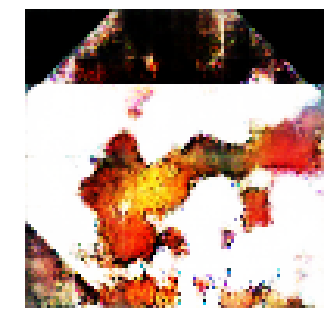


Epoch: 6640, D: -6.247, G: 5.708
Epoch: 6641, D: -6.154, G: 5.699
Epoch: 6642, D: -7.322, G: 3.956
Epoch: 6643, D: -6.884, G: 2.375
Epoch: 6644, D: -6.652, G: 7.73
Epoch: 6645, D: -7.099, G: 3.863
Epoch: 6646, D: -5.062, G: 4.648
Epoch: 6647, D: -6.494, G: 4.072
Epoch: 6648, D: -6.764, G: 2.48
Epoch: 6649, D: -5.812, G: 5.849
Epoch: 6650, D: -7.024, G: 3.046
Epoch: 6651, D: -6.034, G: 5.253
Epoch: 6652, D: -6.645, G: 2.237
Epoch: 6653, D: -6.089, G: 4.517
Epoch: 6654, D: -5.601, G: 3.048
Epoch: 6655, D: -4.923, G: 4.785
Epoch: 6656, D: -6.525, G: 4.994
Epoch: 6657, D: -6.06, G: 5.04
Epoch: 6658, D: -7.098, G: 5.327
Epoch: 6659, D: -6.233, G: 3.228


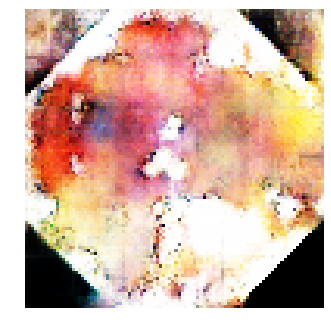


Epoch: 6660, D: -6.73, G: 4.414
Epoch: 6661, D: -6.81, G: 4.688
Epoch: 6662, D: -7.63, G: 4.035
Epoch: 6663, D: -8.418, G: 1.52
Epoch: 6664, D: -5.94, G: 2.337
Epoch: 6665, D: -6.724, G: 6.098
Epoch: 6666, D: -5.519, G: 6.022
Epoch: 6667, D: -6.6, G: 2.418
Epoch: 6668, D: -6.24, G: 3.054
Epoch: 6669, D: -7.207, G: 4.791
Epoch: 6670, D: -6.364, G: 2.338
Epoch: 6671, D: -6.025, G: 5.377
Epoch: 6672, D: -6.807, G: 3.905
Epoch: 6673, D: -5.992, G: 3.378
Epoch: 6674, D: -7.96, G: 3.693
Epoch: 6675, D: -5.081, G: 1.322
Epoch: 6676, D: -6.321, G: 6.071
Epoch: 6677, D: -5.63, G: 5.268
Epoch: 6678, D: -6.422, G: 5.507
Epoch: 6679, D: -6.598, G: 6.104


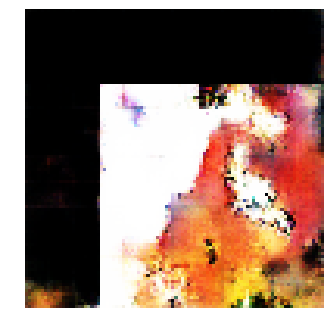


Epoch: 6680, D: -7.357, G: 1.698
Epoch: 6681, D: -6.385, G: 2.134
Epoch: 6682, D: -7.248, G: 4.779
Epoch: 6683, D: -4.901, G: 3.352
Epoch: 6684, D: -4.956, G: 3.867
Epoch: 6685, D: -7.567, G: 2.433
Epoch: 6686, D: -4.979, G: 2.592
Epoch: 6687, D: -6.281, G: 5.253
Epoch: 6688, D: -7.222, G: 7.116
Epoch: 6689, D: -6.915, G: 5.283
Epoch: 6690, D: -7.708, G: 5.275
Epoch: 6691, D: -6.966, G: 1.9
Epoch: 6692, D: -7.122, G: 6.713
Epoch: 6693, D: -5.904, G: 5.839
Epoch: 6694, D: -8.189, G: 2.455
Epoch: 6695, D: -5.791, G: 2.178
Epoch: 6696, D: -6.193, G: 3.894
Epoch: 6697, D: -5.92, G: 1.638
Epoch: 6698, D: -6.884, G: 5.075
Epoch: 6699, D: -6.953, G: 3.615


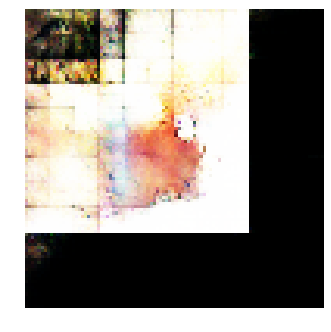


Epoch: 6700, D: -5.855, G: 1.619
Epoch: 6701, D: -5.789, G: 7.647
Epoch: 6702, D: -5.235, G: 4.835
Epoch: 6703, D: -6.617, G: 2.916
Epoch: 6704, D: -6.734, G: 3.615
Epoch: 6705, D: -6.951, G: 5.968
Epoch: 6706, D: -6.227, G: 7.316
Epoch: 6707, D: -6.135, G: 3.178
Epoch: 6708, D: -5.7, G: 5.483
Epoch: 6709, D: -6.689, G: 4.9
Epoch: 6710, D: -4.863, G: 6.882
Epoch: 6711, D: -8.197, G: 3.549
Epoch: 6712, D: -7.126, G: 3.392
Epoch: 6713, D: -5.638, G: 1.741
Epoch: 6714, D: -7.063, G: 4.642
Epoch: 6715, D: -5.16, G: 3.39
Epoch: 6716, D: -6.712, G: 2.538
Epoch: 6717, D: -6.389, G: 4.617
Epoch: 6718, D: -6.084, G: 3.073
Epoch: 6719, D: -6.604, G: 6.147


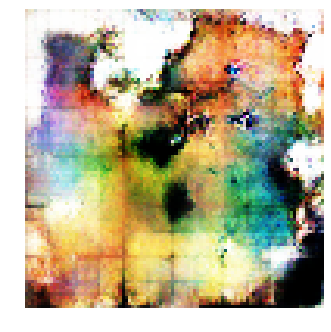


Epoch: 6720, D: -5.183, G: 4.315
Epoch: 6721, D: -6.441, G: 2.974
Epoch: 6722, D: -4.915, G: 1.234
Epoch: 6723, D: -5.252, G: 3.953
Epoch: 6724, D: -5.63, G: 4.621
Epoch: 6725, D: -7.021, G: 5.712
Epoch: 6726, D: -6.828, G: 0.5468
Epoch: 6727, D: -7.693, G: 2.234
Epoch: 6728, D: -6.014, G: 4.296
Epoch: 6729, D: -7.918, G: 3.797
Epoch: 6730, D: -6.971, G: 0.2126
Epoch: 6731, D: -4.772, G: 3.394
Epoch: 6732, D: -7.58, G: 6.846
Epoch: 6733, D: -6.805, G: 3.629
Epoch: 6734, D: -7.167, G: 4.707
Epoch: 6735, D: -7.054, G: 4.499
Epoch: 6736, D: -6.715, G: 4.112
Epoch: 6737, D: -5.945, G: 6.975
Epoch: 6738, D: -6.338, G: 3.674
Epoch: 6739, D: -6.683, G: 4.337


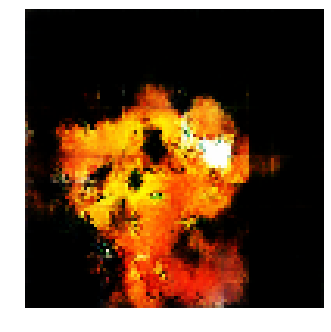


Epoch: 6740, D: -7.41, G: 3.126
Epoch: 6741, D: -7.193, G: 2.856
Epoch: 6742, D: -6.995, G: 4.188
Epoch: 6743, D: -6.147, G: 4.46
Epoch: 6744, D: -7.029, G: 4.849
Epoch: 6745, D: -6.432, G: 6.163
Epoch: 6746, D: -8.116, G: 5.786
Epoch: 6747, D: -6.542, G: 4.382
Epoch: 6748, D: -6.832, G: 4.604
Epoch: 6749, D: -4.965, G: 2.789
Epoch: 6750, D: -5.477, G: 5.885
Epoch: 6751, D: -6.294, G: 2.67
Epoch: 6752, D: -5.144, G: 4.924
Epoch: 6753, D: -5.708, G: 5.611
Epoch: 6754, D: -6.835, G: 3.658
Epoch: 6755, D: -7.565, G: 3.572
Epoch: 6756, D: -5.553, G: 3.98
Epoch: 6757, D: -6.351, G: 5.059
Epoch: 6758, D: -5.947, G: 3.583
Epoch: 6759, D: -6.97, G: 2.849


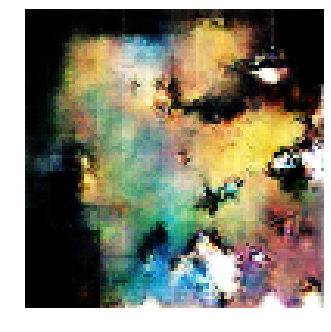


Epoch: 6760, D: -6.545, G: 2.937
Epoch: 6761, D: -6.525, G: 4.896
Epoch: 6762, D: -6.822, G: 4.74
Epoch: 6763, D: -7.184, G: -0.05985
Epoch: 6764, D: -6.413, G: 2.614
Epoch: 6765, D: -6.51, G: 3.994
Epoch: 6766, D: -7.639, G: 2.149
Epoch: 6767, D: -7.016, G: 1.083
Epoch: 6768, D: -6.13, G: 4.295
Epoch: 6769, D: -5.982, G: 4.819
Epoch: 6770, D: -6.63, G: 6.347
Epoch: 6771, D: -5.854, G: 2.47
Epoch: 6772, D: -7.416, G: 3.968
Epoch: 6773, D: -5.762, G: 1.804
Epoch: 6774, D: -5.717, G: 6.874
Epoch: 6775, D: -5.637, G: 5.892
Epoch: 6776, D: -8.25, G: 3.537
Epoch: 6777, D: -6.793, G: 2.371
Epoch: 6778, D: -6.043, G: 2.244
Epoch: 6779, D: -6.508, G: 7.353


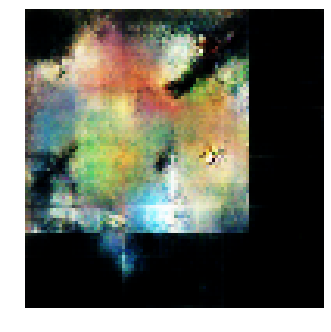


Epoch: 6780, D: -7.196, G: 3.738
Epoch: 6781, D: -5.264, G: 5.091
Epoch: 6782, D: -8.441, G: 3.895
Epoch: 6783, D: -7.321, G: 4.826
Epoch: 6784, D: -5.759, G: 2.728
Epoch: 6785, D: -5.656, G: 5.018
Epoch: 6786, D: -5.805, G: 3.234
Epoch: 6787, D: -6.182, G: 3.813
Epoch: 6788, D: -5.684, G: 4.174
Epoch: 6789, D: -5.877, G: 3.868
Epoch: 6790, D: -4.758, G: 6.033
Epoch: 6791, D: -6.04, G: 4.402
Epoch: 6792, D: -6.069, G: 5.555
Epoch: 6793, D: -5.729, G: 3.839
Epoch: 6794, D: -7.241, G: 3.669
Epoch: 6795, D: -6.843, G: 3.83
Epoch: 6796, D: -4.603, G: 5.178
Epoch: 6797, D: -6.458, G: 5.545
Epoch: 6798, D: -4.832, G: 6.209
Epoch: 6799, D: -6.195, G: 3.061


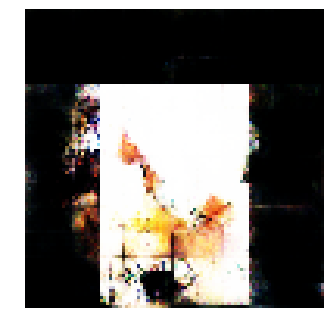


Epoch: 6800, D: -6.179, G: 4.527
Epoch: 6801, D: -7.07, G: 4.885
Epoch: 6802, D: -6.827, G: 1.343
Epoch: 6803, D: -6.583, G: 5.776
Epoch: 6804, D: -6.114, G: 4.546
Epoch: 6805, D: -7.204, G: 4.386
Epoch: 6806, D: -7.708, G: 2.386
Epoch: 6807, D: -7.248, G: 5.414
Epoch: 6808, D: -5.918, G: 4.055
Epoch: 6809, D: -5.382, G: 3.389
Epoch: 6810, D: -5.314, G: 2.862
Epoch: 6811, D: -4.486, G: 7.117
Epoch: 6812, D: -5.585, G: 5.245
Epoch: 6813, D: -7.45, G: 3.365
Epoch: 6814, D: -7.301, G: 2.769
Epoch: 6815, D: -5.207, G: 2.715
Epoch: 6816, D: -7.526, G: 5.144
Epoch: 6817, D: -5.38, G: 4.605
Epoch: 6818, D: -5.679, G: 4.194
Epoch: 6819, D: -7.917, G: 3.699


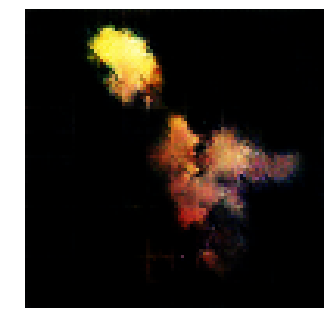


Epoch: 6820, D: -6.077, G: 5.442
Epoch: 6821, D: -7.072, G: 5.222
Epoch: 6822, D: -6.797, G: 1.913
Epoch: 6823, D: -6.993, G: 1.195
Epoch: 6824, D: -6.024, G: 3.512
Epoch: 6825, D: -6.026, G: 1.693
Epoch: 6826, D: -5.934, G: 4.415
Epoch: 6827, D: -6.975, G: 4.134
Epoch: 6828, D: -6.591, G: 2.846
Epoch: 6829, D: -6.438, G: 5.148
Epoch: 6830, D: -5.311, G: 5.441
Epoch: 6831, D: -4.824, G: 4.819
Epoch: 6832, D: -6.851, G: 4.177
Epoch: 6833, D: -6.22, G: 4.279
Epoch: 6834, D: -5.506, G: 5.228
Epoch: 6835, D: -5.202, G: 7.474
Epoch: 6836, D: -6.101, G: 4.809
Epoch: 6837, D: -7.078, G: 6.052
Epoch: 6838, D: -5.117, G: 2.839
Epoch: 6839, D: -7.252, G: 6.343


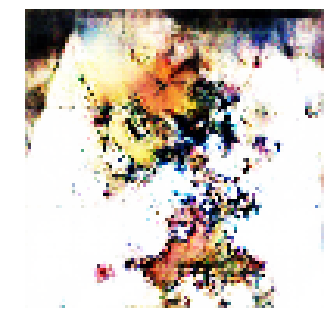


Epoch: 6840, D: -6.883, G: 5.059
Epoch: 6841, D: -8.673, G: 1.529
Epoch: 6842, D: -4.879, G: 2.831
Epoch: 6843, D: -7.232, G: 6.336
Epoch: 6844, D: -6.389, G: 2.893
Epoch: 6845, D: -7.981, G: 4.646
Epoch: 6846, D: -5.993, G: 2.949
Epoch: 6847, D: -6.487, G: 4.883
Epoch: 6848, D: -5.843, G: 3.112
Epoch: 6849, D: -7.011, G: 6.374
Epoch: 6850, D: -6.374, G: 5.664
Epoch: 6851, D: -6.596, G: 1.332
Epoch: 6852, D: -6.351, G: 5.892
Epoch: 6853, D: -6.049, G: 4.665
Epoch: 6854, D: -6.781, G: 3.266
Epoch: 6855, D: -6.16, G: 3.591
Epoch: 6856, D: -6.529, G: 3.434
Epoch: 6857, D: -7.893, G: 6.653
Epoch: 6858, D: -6.302, G: 3.932
Epoch: 6859, D: -6.759, G: 2.937


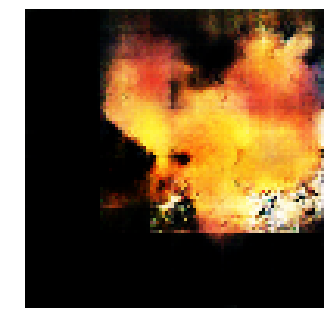


Epoch: 6860, D: -5.631, G: 5.144
Epoch: 6861, D: -6.749, G: 6.034
Epoch: 6862, D: -6.518, G: 0.8478
Epoch: 6863, D: -7.197, G: 4.2
Epoch: 6864, D: -6.027, G: 6.104
Epoch: 6865, D: -7.251, G: 5.499
Epoch: 6866, D: -6.547, G: 1.856
Epoch: 6867, D: -6.891, G: 2.902
Epoch: 6868, D: -5.856, G: 5.579
Epoch: 6869, D: -5.588, G: 6.623
Epoch: 6870, D: -5.806, G: 3.384
Epoch: 6871, D: -6.428, G: 5.584
Epoch: 6872, D: -7.389, G: 4.572
Epoch: 6873, D: -7.939, G: 2.036
Epoch: 6874, D: -8.65, G: 1.617
Epoch: 6875, D: -5.106, G: 4.931
Epoch: 6876, D: -7.643, G: 4.214
Epoch: 6877, D: -7.13, G: 3.546
Epoch: 6878, D: -5.93, G: 4.581
Epoch: 6879, D: -6.337, G: 4.372


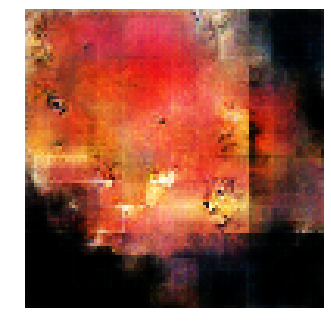


Epoch: 6880, D: -5.107, G: 4.271
Epoch: 6881, D: -5.042, G: 2.534
Epoch: 6882, D: -6.551, G: 3.865
Epoch: 6883, D: -6.583, G: 1.583
Epoch: 6884, D: -4.069, G: 5.685
Epoch: 6885, D: -7.631, G: 4.483
Epoch: 6886, D: -6.372, G: 3.893
Epoch: 6887, D: -6.572, G: 5.276
Epoch: 6888, D: -5.169, G: 2.678
Epoch: 6889, D: -4.533, G: 3.332
Epoch: 6890, D: -6.277, G: 4.37
Epoch: 6891, D: -6.588, G: 6.285
Epoch: 6892, D: -6.015, G: 4.029
Epoch: 6893, D: -6.313, G: 5.405
Epoch: 6894, D: -7.195, G: 3.592
Epoch: 6895, D: -6.471, G: 5.568
Epoch: 6896, D: -7.026, G: 4.189
Epoch: 6897, D: -6.526, G: 4.223
Epoch: 6898, D: -7.835, G: 6.268
Epoch: 6899, D: -6.555, G: 5.466


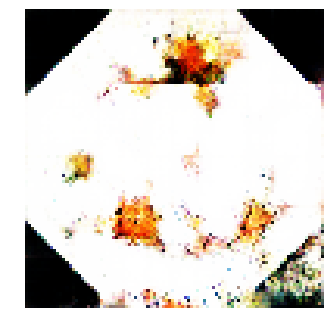


Epoch: 6900, D: -6.016, G: 2.382
Epoch: 6901, D: -6.132, G: 3.902
Epoch: 6902, D: -5.916, G: 3.782
Epoch: 6903, D: -5.638, G: 4.1
Epoch: 6904, D: -6.485, G: 4.375
Epoch: 6905, D: -7.156, G: 2.636
Epoch: 6906, D: -6.881, G: 3.998
Epoch: 6907, D: -6.098, G: 4.842
Epoch: 6908, D: -7.513, G: 1.738
Epoch: 6909, D: -7.319, G: 3.488
Epoch: 6910, D: -6.672, G: 6.196
Epoch: 6911, D: -5.605, G: 5.105
Epoch: 6912, D: -7.097, G: 6.245
Epoch: 6913, D: -5.949, G: 3.388
Epoch: 6914, D: -6.738, G: 2.989
Epoch: 6915, D: -6.73, G: 4.093
Epoch: 6916, D: -5.612, G: 4.648
Epoch: 6917, D: -5.594, G: 5.396
Epoch: 6918, D: -7.274, G: 7.288
Epoch: 6919, D: -7.361, G: 2.954


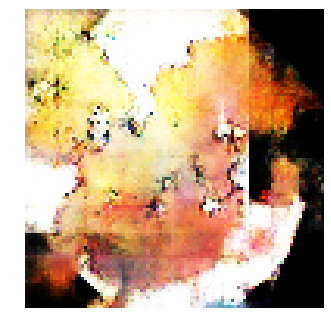


Epoch: 6920, D: -6.822, G: 3.433
Epoch: 6921, D: -6.482, G: 4.583
Epoch: 6922, D: -6.426, G: 1.656
Epoch: 6923, D: -8.106, G: 2.533
Epoch: 6924, D: -5.622, G: 3.059
Epoch: 6925, D: -6.044, G: 2.971
Epoch: 6926, D: -7.343, G: 4.722
Epoch: 6927, D: -4.444, G: 4.253
Epoch: 6928, D: -6.508, G: 3.733
Epoch: 6929, D: -5.833, G: 3.388
Epoch: 6930, D: -7.303, G: 2.857
Epoch: 6931, D: -6.412, G: 4.923
Epoch: 6932, D: -5.821, G: 4.185
Epoch: 6933, D: -6.2, G: 3.007
Epoch: 6934, D: -6.98, G: 5.157
Epoch: 6935, D: -6.811, G: 1.944
Epoch: 6936, D: -8.93, G: 3.66
Epoch: 6937, D: -7.078, G: 4.325
Epoch: 6938, D: -5.513, G: 4.819
Epoch: 6939, D: -6.472, G: 4.021


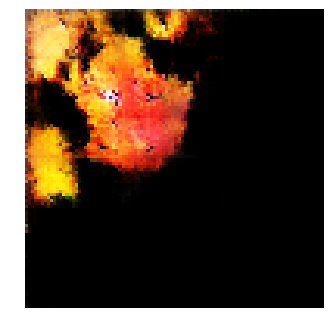


Epoch: 6940, D: -7.144, G: 6.856
Epoch: 6941, D: -6.576, G: 4.672
Epoch: 6942, D: -6.219, G: 8.553
Epoch: 6943, D: -6.549, G: 1.83
Epoch: 6944, D: -5.818, G: 2.681
Epoch: 6945, D: -5.079, G: 4.511
Epoch: 6946, D: -7.467, G: 2.734
Epoch: 6947, D: -6.347, G: 1.757
Epoch: 6948, D: -8.11, G: 4.691
Epoch: 6949, D: -7.919, G: 3.893
Epoch: 6950, D: -5.17, G: 5.417
Epoch: 6951, D: -6.791, G: 3.116
Epoch: 6952, D: -6.505, G: 4.366
Epoch: 6953, D: -5.595, G: 3.493
Epoch: 6954, D: -7.956, G: 3.258
Epoch: 6955, D: -5.213, G: 4.769
Epoch: 6956, D: -7.694, G: 1.701
Epoch: 6957, D: -7.208, G: 3.771
Epoch: 6958, D: -6.4, G: 2.687
Epoch: 6959, D: -6.34, G: 2.768


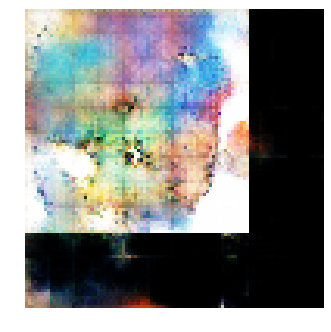


Epoch: 6960, D: -8.848, G: 4.977
Epoch: 6961, D: -5.519, G: 5.706
Epoch: 6962, D: -6.45, G: 2.217
Epoch: 6963, D: -6.683, G: 7.825
Epoch: 6964, D: -6.972, G: 4.718
Epoch: 6965, D: -6.891, G: 3.129
Epoch: 6966, D: -5.773, G: 3.117
Epoch: 6967, D: -5.678, G: 6.267
Epoch: 6968, D: -5.675, G: 4.171
Epoch: 6969, D: -7.789, G: 3.72
Epoch: 6970, D: -7.573, G: 0.8503
Epoch: 6971, D: -6.358, G: 0.5585
Epoch: 6972, D: -6.271, G: 6.319
Epoch: 6973, D: -6.45, G: 1.751
Epoch: 6974, D: -6.848, G: 3.386
Epoch: 6975, D: -5.732, G: 5.508
Epoch: 6976, D: -5.765, G: 4.869
Epoch: 6977, D: -6.25, G: 6.086
Epoch: 6978, D: -7.134, G: 5.086
Epoch: 6979, D: -7.366, G: 5.246


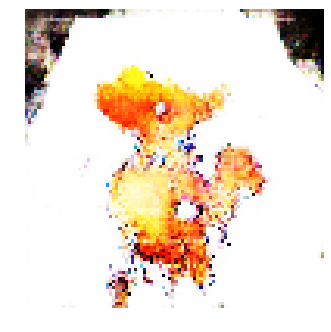


Epoch: 6980, D: -5.929, G: 5.13
Epoch: 6981, D: -7.061, G: 2.984
Epoch: 6982, D: -6.184, G: 4.304
Epoch: 6983, D: -5.834, G: 5.597
Epoch: 6984, D: -7.243, G: 7.984
Epoch: 6985, D: -5.552, G: 3.867
Epoch: 6986, D: -6.008, G: 2.645
Epoch: 6987, D: -7.175, G: 1.663
Epoch: 6988, D: -5.898, G: 2.903
Epoch: 6989, D: -7.323, G: 2.576
Epoch: 6990, D: -6.2, G: 5.8
Epoch: 6991, D: -6.318, G: 3.061
Epoch: 6992, D: -5.314, G: 4.202
Epoch: 6993, D: -5.73, G: 5.708
Epoch: 6994, D: -6.315, G: 2.556
Epoch: 6995, D: -6.567, G: 5.062
Epoch: 6996, D: -6.686, G: 5.892
Epoch: 6997, D: -6.665, G: 5.369
Epoch: 6998, D: -6.961, G: 5.196
Epoch: 6999, D: -6.741, G: 2.896


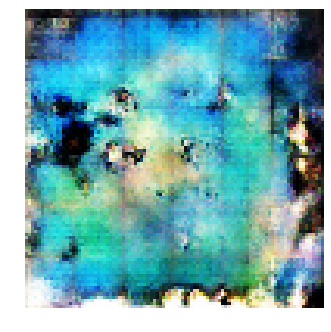


Epoch: 7000, D: -6.433, G: 3.818
Epoch: 7001, D: -6.216, G: 4.375
Epoch: 7002, D: -6.535, G: 4.399
Epoch: 7003, D: -5.637, G: 1.841
Epoch: 7004, D: -6.386, G: 5.02
Epoch: 7005, D: -7.19, G: 5.367
Epoch: 7006, D: -6.814, G: 2.468
Epoch: 7007, D: -7.619, G: 4.643
Epoch: 7008, D: -8.784, G: 4.929
Epoch: 7009, D: -5.77, G: 2.049
Epoch: 7010, D: -7.958, G: 4.187
Epoch: 7011, D: -5.509, G: 6.197
Epoch: 7012, D: -5.169, G: 6.664
Epoch: 7013, D: -7.151, G: 4.298
Epoch: 7014, D: -6.35, G: 4.36
Epoch: 7015, D: -5.234, G: 7.103
Epoch: 7016, D: -7.236, G: 4.368
Epoch: 7017, D: -8.216, G: 1.73
Epoch: 7018, D: -5.782, G: 3.166
Epoch: 7019, D: -6.935, G: 3.869


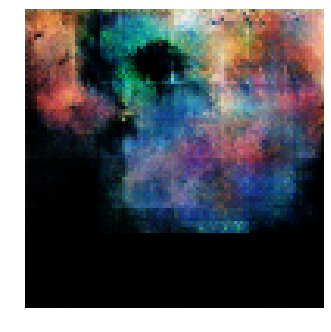


Epoch: 7020, D: -7.083, G: 4.811
Epoch: 7021, D: -6.939, G: 0.7586
Epoch: 7022, D: -6.232, G: 4.402
Epoch: 7023, D: -6.709, G: 3.391
Epoch: 7024, D: -6.694, G: 0.8282
Epoch: 7025, D: -5.532, G: 1.079
Epoch: 7026, D: -6.023, G: 1.988
Epoch: 7027, D: -6.568, G: 3.11
Epoch: 7028, D: -6.622, G: 5.786
Epoch: 7029, D: -6.114, G: 1.543
Epoch: 7030, D: -4.852, G: 7.013
Epoch: 7031, D: -4.72, G: 5.779
Epoch: 7032, D: -7.083, G: 6.896
Epoch: 7033, D: -5.034, G: 4.081
Epoch: 7034, D: -5.31, G: 8.755
Epoch: 7035, D: -7.022, G: 5.434
Epoch: 7036, D: -7.604, G: 6.21
Epoch: 7037, D: -6.828, G: 4.217
Epoch: 7038, D: -6.502, G: 6.578
Epoch: 7039, D: -5.805, G: 4.49


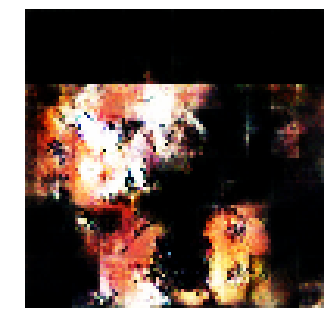


Epoch: 7040, D: -6.276, G: 4.743
Epoch: 7041, D: -6.079, G: 4.864
Epoch: 7042, D: -7.171, G: 3.991
Epoch: 7043, D: -5.001, G: 3.989
Epoch: 7044, D: -6.458, G: 4.607
Epoch: 7045, D: -6.506, G: 4.583
Epoch: 7046, D: -6.89, G: 4.164
Epoch: 7047, D: -5.135, G: 2.517
Epoch: 7048, D: -7.756, G: 4.843
Epoch: 7049, D: -6.504, G: 7.456
Epoch: 7050, D: -5.265, G: 4.215
Epoch: 7051, D: -7.479, G: 5.183
Epoch: 7052, D: -8.404, G: 8.651
Epoch: 7053, D: -6.831, G: 5.618
Epoch: 7054, D: -5.533, G: 2.554
Epoch: 7055, D: -6.466, G: 1.429
Epoch: 7056, D: -5.807, G: 4.558
Epoch: 7057, D: -5.734, G: 4.777
Epoch: 7058, D: -6.499, G: 4.391
Epoch: 7059, D: -7.001, G: 4.075


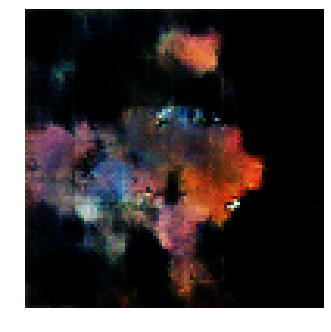


Epoch: 7060, D: -6.323, G: 5.873
Epoch: 7061, D: -7.099, G: 3.633
Epoch: 7062, D: -5.554, G: 2.038
Epoch: 7063, D: -6.453, G: 6.811
Epoch: 7064, D: -5.712, G: 5.703
Epoch: 7065, D: -5.883, G: 3.9
Epoch: 7066, D: -6.682, G: 3.25
Epoch: 7067, D: -7.018, G: 5.305
Epoch: 7068, D: -5.33, G: 2.212
Epoch: 7069, D: -5.707, G: 4.62
Epoch: 7070, D: -6.649, G: 2.026
Epoch: 7071, D: -7.207, G: 6.408
Epoch: 7072, D: -5.401, G: 4.502
Epoch: 7073, D: -5.595, G: 4.887
Epoch: 7074, D: -5.997, G: 4.478
Epoch: 7075, D: -6.85, G: 5.277
Epoch: 7076, D: -6.639, G: 4.18
Epoch: 7077, D: -5.796, G: 2.854
Epoch: 7078, D: -5.793, G: 1.592
Epoch: 7079, D: -8.31, G: 4.882


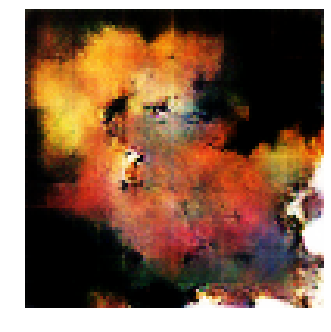


Epoch: 7080, D: -5.752, G: 2.369
Epoch: 7081, D: -6.245, G: 5.013
Epoch: 7082, D: -6.986, G: 3.732
Epoch: 7083, D: -5.738, G: 5.09
Epoch: 7084, D: -6.486, G: 6.053
Epoch: 7085, D: -6.532, G: 3.435
Epoch: 7086, D: -6.953, G: 3.948
Epoch: 7087, D: -6.684, G: 5.592
Epoch: 7088, D: -6.12, G: 3.216
Epoch: 7089, D: -5.789, G: 4.81
Epoch: 7090, D: -7.131, G: 5.951
Epoch: 7091, D: -5.902, G: 6.414
Epoch: 7092, D: -6.497, G: 5.308
Epoch: 7093, D: -6.749, G: 6.278
Epoch: 7094, D: -5.645, G: 4.334
Epoch: 7095, D: -6.557, G: 4.765
Epoch: 7096, D: -6.237, G: 3.252
Epoch: 7097, D: -6.256, G: 3.193
Epoch: 7098, D: -6.231, G: 2.007
Epoch: 7099, D: -7.001, G: 2.365


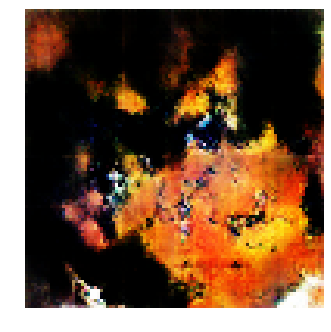


Epoch: 7100, D: -5.748, G: 2.372
Epoch: 7101, D: -7.177, G: 5.845
Epoch: 7102, D: -6.227, G: 0.6776
Epoch: 7103, D: -5.81, G: 4.112
Epoch: 7104, D: -5.974, G: 3.985
Epoch: 7105, D: -7.881, G: 3.272
Epoch: 7106, D: -6.916, G: 5.821
Epoch: 7107, D: -5.881, G: 2.835
Epoch: 7108, D: -6.844, G: 4.86
Epoch: 7109, D: -6.088, G: 3.634
Epoch: 7110, D: -6.568, G: 7.058
Epoch: 7111, D: -7.003, G: 6.099
Epoch: 7112, D: -7.879, G: 6.401
Epoch: 7113, D: -6.14, G: 3.75
Epoch: 7114, D: -5.878, G: 4.059
Epoch: 7115, D: -8.254, G: 5.088
Epoch: 7116, D: -5.278, G: 5.465
Epoch: 7117, D: -6.029, G: 6.689
Epoch: 7118, D: -6.984, G: 5.259
Epoch: 7119, D: -6.24, G: 2.137


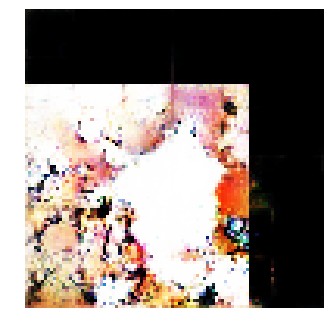


Epoch: 7120, D: -6.545, G: 5.065
Epoch: 7121, D: -7.338, G: 4.274
Epoch: 7122, D: -5.811, G: 0.9457
Epoch: 7123, D: -7.647, G: 4.542
Epoch: 7124, D: -6.593, G: 4.0
Epoch: 7125, D: -6.222, G: 3.097
Epoch: 7126, D: -5.228, G: 3.081
Epoch: 7127, D: -7.794, G: 3.425
Epoch: 7128, D: -7.324, G: 4.774
Epoch: 7129, D: -5.62, G: 2.711
Epoch: 7130, D: -7.657, G: 3.671
Epoch: 7131, D: -5.803, G: 4.586
Epoch: 7132, D: -5.984, G: 2.926
Epoch: 7133, D: -7.636, G: 2.165
Epoch: 7134, D: -6.693, G: 3.546
Epoch: 7135, D: -5.859, G: 2.974
Epoch: 7136, D: -5.245, G: 5.916
Epoch: 7137, D: -4.481, G: 2.693
Epoch: 7138, D: -4.443, G: 6.174
Epoch: 7139, D: -5.625, G: 4.727


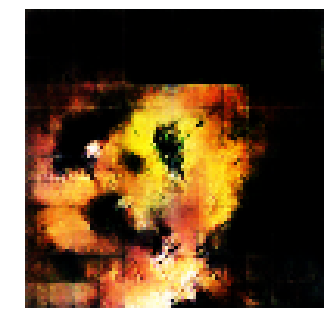


Epoch: 7140, D: -6.287, G: 5.41
Epoch: 7141, D: -7.214, G: 5.574
Epoch: 7142, D: -5.895, G: 6.003
Epoch: 7143, D: -4.425, G: 2.264
Epoch: 7144, D: -6.597, G: 3.704
Epoch: 7145, D: -6.98, G: 4.629
Epoch: 7146, D: -7.539, G: 5.339
Epoch: 7147, D: -6.631, G: 4.764
Epoch: 7148, D: -5.561, G: 4.93
Epoch: 7149, D: -7.041, G: 2.842
Epoch: 7150, D: -6.738, G: 3.651
Epoch: 7151, D: -6.96, G: 0.3216
Epoch: 7152, D: -6.362, G: 5.238
Epoch: 7153, D: -7.87, G: 4.565
Epoch: 7154, D: -7.323, G: 5.751
Epoch: 7155, D: -5.48, G: 3.238
Epoch: 7156, D: -7.563, G: 5.247
Epoch: 7157, D: -6.858, G: 4.281
Epoch: 7158, D: -6.584, G: 3.761
Epoch: 7159, D: -7.872, G: 2.074


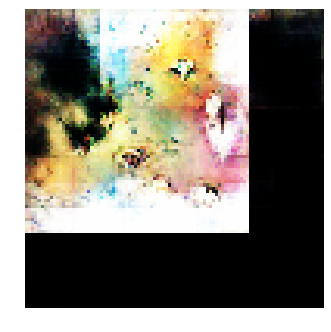


Epoch: 7160, D: -7.176, G: 3.585
Epoch: 7161, D: -7.583, G: 4.807
Epoch: 7162, D: -5.513, G: 2.626
Epoch: 7163, D: -6.763, G: 5.257
Epoch: 7164, D: -6.467, G: 3.153
Epoch: 7165, D: -6.362, G: 5.318
Epoch: 7166, D: -6.366, G: 2.917
Epoch: 7167, D: -6.551, G: 4.982
Epoch: 7168, D: -5.596, G: 2.856
Epoch: 7169, D: -7.911, G: 2.814
Epoch: 7170, D: -6.751, G: 3.322
Epoch: 7171, D: -4.425, G: 4.179
Epoch: 7172, D: -5.271, G: 4.581
Epoch: 7173, D: -5.742, G: 6.926
Epoch: 7174, D: -4.521, G: 4.043
Epoch: 7175, D: -6.276, G: 5.168
Epoch: 7176, D: -5.842, G: 2.956
Epoch: 7177, D: -7.34, G: 5.723
Epoch: 7178, D: -7.109, G: 2.29
Epoch: 7179, D: -5.084, G: 2.774


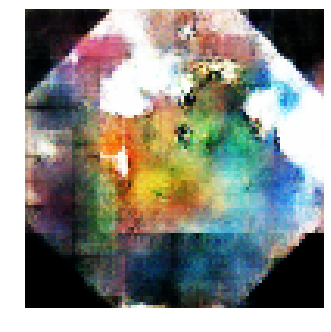


Epoch: 7180, D: -6.366, G: 2.193
Epoch: 7181, D: -6.356, G: 2.842
Epoch: 7182, D: -6.659, G: 4.468
Epoch: 7183, D: -6.263, G: 7.873
Epoch: 7184, D: -4.85, G: 6.96
Epoch: 7185, D: -5.807, G: 4.409
Epoch: 7186, D: -5.433, G: 2.039
Epoch: 7187, D: -5.949, G: 2.827
Epoch: 7188, D: -7.096, G: 4.279
Epoch: 7189, D: -5.811, G: 5.291
Epoch: 7190, D: -4.701, G: 4.956
Epoch: 7191, D: -7.341, G: 5.288
Epoch: 7192, D: -6.786, G: 2.874
Epoch: 7193, D: -7.486, G: 4.89
Epoch: 7194, D: -5.024, G: 5.006
Epoch: 7195, D: -7.725, G: 6.804
Epoch: 7196, D: -5.399, G: 4.935
Epoch: 7197, D: -6.013, G: 5.274
Epoch: 7198, D: -7.068, G: 2.904
Epoch: 7199, D: -5.808, G: 6.965


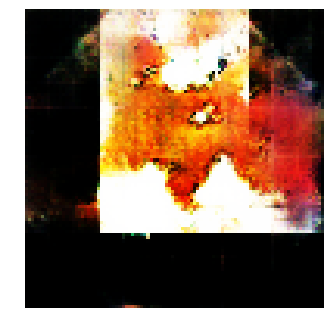


Epoch: 7200, D: -6.274, G: 2.022
Epoch: 7201, D: -4.722, G: 6.736
Epoch: 7202, D: -6.996, G: 5.738
Epoch: 7203, D: -6.922, G: 5.275
Epoch: 7204, D: -5.605, G: 3.423
Epoch: 7205, D: -5.681, G: 3.044
Epoch: 7206, D: -7.018, G: 2.571
Epoch: 7207, D: -5.755, G: -0.09719
Epoch: 7208, D: -6.907, G: 2.337
Epoch: 7209, D: -5.719, G: 1.349
Epoch: 7210, D: -7.164, G: 5.918
Epoch: 7211, D: -6.158, G: 5.39
Epoch: 7212, D: -5.853, G: 2.822
Epoch: 7213, D: -5.656, G: 5.235
Epoch: 7214, D: -5.432, G: 8.795
Epoch: 7215, D: -6.768, G: 5.341
Epoch: 7216, D: -6.36, G: 5.684
Epoch: 7217, D: -6.034, G: 3.706
Epoch: 7218, D: -6.15, G: 5.248
Epoch: 7219, D: -6.476, G: 1.038


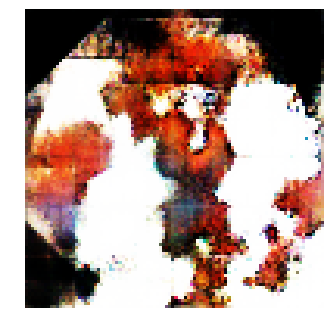


Epoch: 7220, D: -5.512, G: 4.029
Epoch: 7221, D: -6.135, G: 3.844
Epoch: 7222, D: -5.785, G: 1.713
Epoch: 7223, D: -5.824, G: 2.352
Epoch: 7224, D: -6.209, G: 1.119
Epoch: 7225, D: -6.877, G: 6.789
Epoch: 7226, D: -5.403, G: 3.713
Epoch: 7227, D: -7.129, G: 6.481
Epoch: 7228, D: -7.672, G: 4.809
Epoch: 7229, D: -6.3, G: 4.39
Epoch: 7230, D: -7.872, G: 2.911
Epoch: 7231, D: -5.25, G: 2.524
Epoch: 7232, D: -8.373, G: 5.331
Epoch: 7233, D: -6.313, G: 1.608
Epoch: 7234, D: -6.69, G: 3.131
Epoch: 7235, D: -6.566, G: 5.064
Epoch: 7236, D: -7.381, G: 7.897
Epoch: 7237, D: -6.266, G: 4.861
Epoch: 7238, D: -5.725, G: 2.121
Epoch: 7239, D: -5.965, G: 7.267


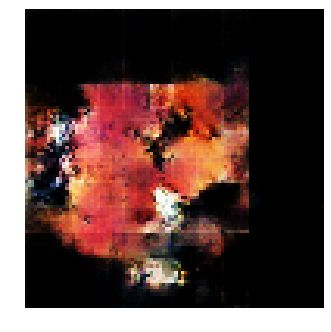


Epoch: 7240, D: -6.775, G: 3.409
Epoch: 7241, D: -5.563, G: 1.036
Epoch: 7242, D: -6.324, G: 2.869
Epoch: 7243, D: -7.2, G: 6.104
Epoch: 7244, D: -5.697, G: 4.399
Epoch: 7245, D: -7.36, G: 3.617
Epoch: 7246, D: -7.682, G: 3.418
Epoch: 7247, D: -6.686, G: 0.08721
Epoch: 7248, D: -5.116, G: 2.573
Epoch: 7249, D: -5.833, G: 5.478
Epoch: 7250, D: -4.807, G: 5.743
Epoch: 7251, D: -4.332, G: 4.275
Epoch: 7252, D: -7.053, G: 1.895
Epoch: 7253, D: -7.133, G: 2.687
Epoch: 7254, D: -5.922, G: 5.309
Epoch: 7255, D: -8.774, G: 4.051
Epoch: 7256, D: -6.724, G: 3.129
Epoch: 7257, D: -7.354, G: 3.738
Epoch: 7258, D: -6.788, G: 6.268
Epoch: 7259, D: -5.638, G: 3.041


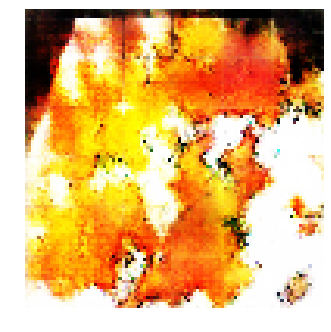


Epoch: 7260, D: -5.952, G: 3.696
Epoch: 7261, D: -5.962, G: 3.981
Epoch: 7262, D: -7.235, G: 4.769
Epoch: 7263, D: -7.205, G: 2.688
Epoch: 7264, D: -6.487, G: 5.371
Epoch: 7265, D: -5.283, G: 4.231
Epoch: 7266, D: -6.464, G: 4.103
Epoch: 7267, D: -6.125, G: 3.892
Epoch: 7268, D: -7.954, G: 4.941
Epoch: 7269, D: -5.529, G: 3.657
Epoch: 7270, D: -6.892, G: 3.552
Epoch: 7271, D: -6.602, G: 2.378
Epoch: 7272, D: -5.513, G: 3.367
Epoch: 7273, D: -5.429, G: 3.068
Epoch: 7274, D: -6.938, G: 6.069
Epoch: 7275, D: -6.601, G: 6.998
Epoch: 7276, D: -5.702, G: 2.279
Epoch: 7277, D: -7.404, G: 4.002
Epoch: 7278, D: -6.212, G: 2.653
Epoch: 7279, D: -7.128, G: 3.272


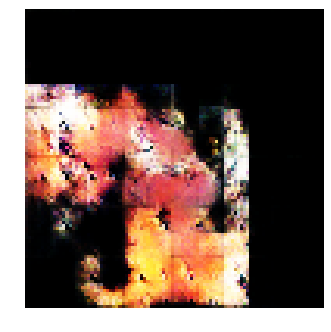


Epoch: 7280, D: -6.05, G: 6.096
Epoch: 7281, D: -6.262, G: 4.059
Epoch: 7282, D: -6.451, G: 3.787
Epoch: 7283, D: -5.851, G: 3.477
Epoch: 7284, D: -5.93, G: 4.984
Epoch: 7285, D: -5.634, G: 5.501
Epoch: 7286, D: -6.587, G: 1.285
Epoch: 7287, D: -7.291, G: -1.034
Epoch: 7288, D: -8.243, G: 4.458
Epoch: 7289, D: -7.079, G: 1.118
Epoch: 7290, D: -7.005, G: 3.753
Epoch: 7291, D: -6.688, G: 6.529
Epoch: 7292, D: -6.245, G: 4.979
Epoch: 7293, D: -6.831, G: 4.047
Epoch: 7294, D: -6.047, G: 3.805
Epoch: 7295, D: -7.198, G: 3.192
Epoch: 7296, D: -6.573, G: 2.352
Epoch: 7297, D: -5.913, G: 1.854
Epoch: 7298, D: -6.067, G: 5.402
Epoch: 7299, D: -6.526, G: 4.968


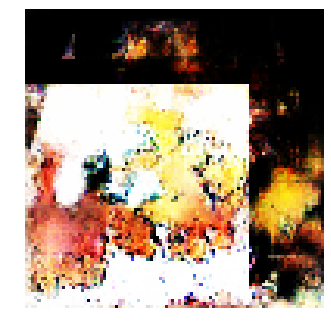


Epoch: 7300, D: -6.82, G: 4.374
Epoch: 7301, D: -6.937, G: 2.347
Epoch: 7302, D: -6.076, G: 2.516
Epoch: 7303, D: -5.766, G: 5.189
Epoch: 7304, D: -6.558, G: 3.192
Epoch: 7305, D: -5.577, G: 6.263
Epoch: 7306, D: -4.963, G: 5.326
Epoch: 7307, D: -6.73, G: 5.814
Epoch: 7308, D: -6.186, G: 2.136
Epoch: 7309, D: -6.985, G: 5.267
Epoch: 7310, D: -5.505, G: 6.661
Epoch: 7311, D: -6.382, G: 5.247
Epoch: 7312, D: -6.634, G: 5.646
Epoch: 7313, D: -6.521, G: 5.823
Epoch: 7314, D: -5.955, G: 5.562
Epoch: 7315, D: -5.828, G: 5.364
Epoch: 7316, D: -4.971, G: 7.009
Epoch: 7317, D: -5.194, G: 6.066
Epoch: 7318, D: -6.727, G: 5.813
Epoch: 7319, D: -6.431, G: 4.187


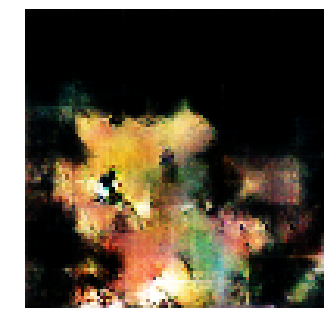


Epoch: 7320, D: -5.939, G: 5.364
Epoch: 7321, D: -6.79, G: 4.705
Epoch: 7322, D: -7.034, G: 5.282
Epoch: 7323, D: -5.728, G: 4.104
Epoch: 7324, D: -6.57, G: 3.735
Epoch: 7325, D: -5.954, G: 2.7
Epoch: 7326, D: -6.244, G: 3.008
Epoch: 7327, D: -6.138, G: 3.105
Epoch: 7328, D: -6.491, G: 5.035
Epoch: 7329, D: -6.589, G: 6.44
Epoch: 7330, D: -6.92, G: 0.9663
Epoch: 7331, D: -5.981, G: 3.345
Epoch: 7332, D: -6.651, G: 3.542
Epoch: 7333, D: -7.415, G: 6.092
Epoch: 7334, D: -5.923, G: 3.219
Epoch: 7335, D: -6.151, G: 3.719
Epoch: 7336, D: -6.421, G: 0.5876
Epoch: 7337, D: -6.272, G: 4.784
Epoch: 7338, D: -6.055, G: 5.645
Epoch: 7339, D: -7.348, G: 3.618


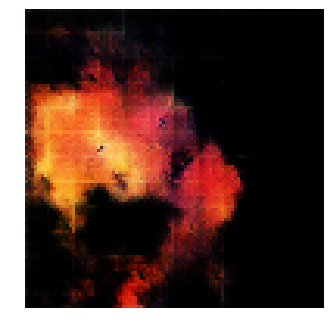


Epoch: 7340, D: -5.414, G: 2.519
Epoch: 7341, D: -6.565, G: 3.575
Epoch: 7342, D: -5.583, G: 2.972
Epoch: 7343, D: -5.912, G: 5.573
Epoch: 7344, D: -4.977, G: 2.41
Epoch: 7345, D: -5.654, G: 3.778
Epoch: 7346, D: -5.617, G: 4.681
Epoch: 7347, D: -6.016, G: 3.797
Epoch: 7348, D: -6.594, G: 1.627
Epoch: 7349, D: -4.735, G: 4.856
Epoch: 7350, D: -4.974, G: 4.221
Epoch: 7351, D: -7.013, G: 4.788
Epoch: 7352, D: -5.863, G: 3.88
Epoch: 7353, D: -6.107, G: 4.338
Epoch: 7354, D: -5.197, G: 3.809
Epoch: 7355, D: -6.272, G: 6.523
Epoch: 7356, D: -7.372, G: 1.14
Epoch: 7357, D: -5.71, G: 4.701
Epoch: 7358, D: -5.713, G: 3.097
Epoch: 7359, D: -7.989, G: 3.681


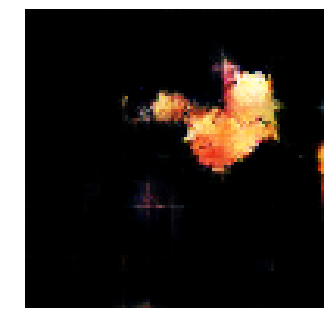


Epoch: 7360, D: -7.249, G: 5.802
Epoch: 7361, D: -5.834, G: 6.911
Epoch: 7362, D: -6.193, G: 3.66
Epoch: 7363, D: -6.317, G: 5.398
Epoch: 7364, D: -7.136, G: 6.584
Epoch: 7365, D: -6.252, G: 4.788
Epoch: 7366, D: -6.168, G: 5.61
Epoch: 7367, D: -6.643, G: 5.69
Epoch: 7368, D: -7.122, G: 5.421
Epoch: 7369, D: -6.302, G: 4.213
Epoch: 7370, D: -6.065, G: 4.516
Epoch: 7371, D: -6.592, G: 2.167
Epoch: 7372, D: -6.872, G: 2.768
Epoch: 7373, D: -5.229, G: 5.049
Epoch: 7374, D: -7.974, G: 4.089
Epoch: 7375, D: -7.263, G: 1.936
Epoch: 7376, D: -6.114, G: 1.4
Epoch: 7377, D: -5.771, G: 4.872
Epoch: 7378, D: -4.409, G: 3.274
Epoch: 7379, D: -6.706, G: 4.06


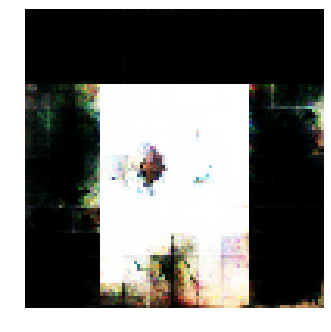


Epoch: 7380, D: -6.105, G: 6.303
Epoch: 7381, D: -5.874, G: 2.673
Epoch: 7382, D: -5.728, G: 3.437
Epoch: 7383, D: -5.952, G: 2.947
Epoch: 7384, D: -6.728, G: 3.432
Epoch: 7385, D: -7.05, G: 5.338
Epoch: 7386, D: -6.031, G: 4.875
Epoch: 7387, D: -7.68, G: 3.741
Epoch: 7388, D: -6.177, G: 5.481
Epoch: 7389, D: -5.336, G: 3.658
Epoch: 7390, D: -6.276, G: 4.816
Epoch: 7391, D: -6.474, G: 3.935
Epoch: 7392, D: -5.056, G: 7.046
Epoch: 7393, D: -7.941, G: 3.384
Epoch: 7394, D: -5.287, G: 0.8327
Epoch: 7395, D: -5.965, G: 4.974
Epoch: 7396, D: -5.257, G: 2.954
Epoch: 7397, D: -5.057, G: 5.784
Epoch: 7398, D: -3.799, G: 4.315
Epoch: 7399, D: -5.755, G: 6.478


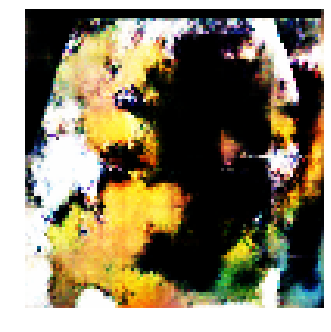


Epoch: 7400, D: -5.593, G: 4.204
Epoch: 7401, D: -5.841, G: 2.876
Epoch: 7402, D: -7.362, G: 6.747
Epoch: 7403, D: -6.837, G: 5.339
Epoch: 7404, D: -6.167, G: 4.977
Epoch: 7405, D: -6.496, G: 3.997
Epoch: 7406, D: -6.319, G: 1.766
Epoch: 7407, D: -5.944, G: 4.245
Epoch: 7408, D: -6.071, G: 2.446
Epoch: 7409, D: -8.47, G: 4.098
Epoch: 7410, D: -5.335, G: 3.201
Epoch: 7411, D: -6.837, G: 2.787
Epoch: 7412, D: -6.652, G: 2.253
Epoch: 7413, D: -7.491, G: 5.415
Epoch: 7414, D: -6.247, G: 4.323
Epoch: 7415, D: -6.302, G: 7.579
Epoch: 7416, D: -5.59, G: 6.703
Epoch: 7417, D: -7.157, G: 1.835
Epoch: 7418, D: -4.449, G: 4.358
Epoch: 7419, D: -5.424, G: 4.868


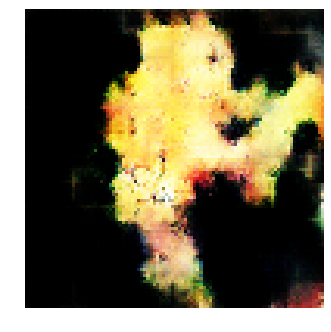


Epoch: 7420, D: -5.752, G: 6.708
Epoch: 7421, D: -5.933, G: 5.726
Epoch: 7422, D: -6.342, G: 2.862
Epoch: 7423, D: -6.721, G: 4.705
Epoch: 7424, D: -5.848, G: 3.863
Epoch: 7425, D: -7.655, G: 5.463
Epoch: 7426, D: -6.5, G: 3.853
Epoch: 7427, D: -5.594, G: 4.97
Epoch: 7428, D: -6.128, G: 4.885
Epoch: 7429, D: -5.53, G: 1.954
Epoch: 7430, D: -6.976, G: 3.595
Epoch: 7431, D: -6.612, G: 3.857
Epoch: 7432, D: -5.711, G: 4.908
Epoch: 7433, D: -5.809, G: 4.609
Epoch: 7434, D: -6.181, G: 3.25
Epoch: 7435, D: -6.893, G: 2.159
Epoch: 7436, D: -7.055, G: -0.3121
Epoch: 7437, D: -6.409, G: 3.626
Epoch: 7438, D: -6.313, G: 2.649
Epoch: 7439, D: -6.729, G: 4.159


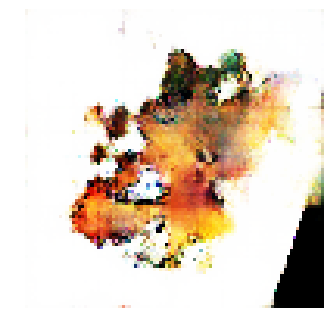


Epoch: 7440, D: -6.903, G: 1.989
Epoch: 7441, D: -6.172, G: 5.706
Epoch: 7442, D: -6.405, G: 2.29
Epoch: 7443, D: -6.948, G: 5.862
Epoch: 7444, D: -6.277, G: 2.894
Epoch: 7445, D: -7.506, G: 4.922
Epoch: 7446, D: -5.716, G: 2.394
Epoch: 7447, D: -5.742, G: 5.364
Epoch: 7448, D: -6.061, G: 4.336
Epoch: 7449, D: -6.735, G: 2.136
Epoch: 7450, D: -6.401, G: 4.014
Epoch: 7451, D: -6.461, G: 4.541
Epoch: 7452, D: -7.289, G: 3.666
Epoch: 7453, D: -6.023, G: 3.601
Epoch: 7454, D: -6.354, G: 4.913
Epoch: 7455, D: -7.09, G: 4.417
Epoch: 7456, D: -6.165, G: 4.313
Epoch: 7457, D: -6.055, G: 4.476
Epoch: 7458, D: -5.774, G: 4.374
Epoch: 7459, D: -5.645, G: 2.727


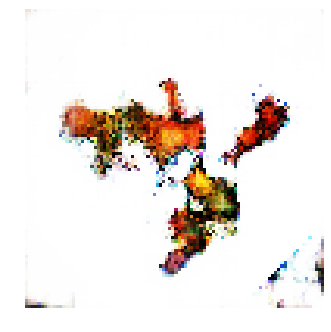


Epoch: 7460, D: -5.437, G: 5.058
Epoch: 7461, D: -8.149, G: 5.018
Epoch: 7462, D: -5.759, G: 1.667
Epoch: 7463, D: -5.516, G: 5.073
Epoch: 7464, D: -4.763, G: 4.439
Epoch: 7465, D: -7.64, G: 1.947
Epoch: 7466, D: -6.484, G: 4.261
Epoch: 7467, D: -6.469, G: 7.538
Epoch: 7468, D: -6.673, G: 4.921
Epoch: 7469, D: -6.464, G: 4.431
Epoch: 7470, D: -6.626, G: 6.103
Epoch: 7471, D: -6.88, G: 1.904
Epoch: 7472, D: -5.602, G: 0.9317
Epoch: 7473, D: -6.237, G: 6.204
Epoch: 7474, D: -5.801, G: 6.189
Epoch: 7475, D: -6.123, G: 3.02
Epoch: 7476, D: -5.815, G: 5.139
Epoch: 7477, D: -6.376, G: 3.586
Epoch: 7478, D: -5.916, G: 2.336
Epoch: 7479, D: -7.036, G: 3.202


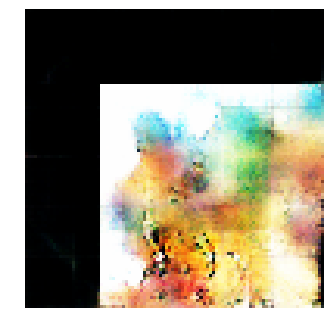


Epoch: 7480, D: -6.565, G: 3.067
Epoch: 7481, D: -5.648, G: 4.667
Epoch: 7482, D: -5.937, G: 2.637
Epoch: 7483, D: -7.204, G: 2.726
Epoch: 7484, D: -5.142, G: 4.298
Epoch: 7485, D: -7.533, G: 3.379
Epoch: 7486, D: -5.613, G: -0.2367
Epoch: 7487, D: -6.385, G: 5.521
Epoch: 7488, D: -5.142, G: 6.909
Epoch: 7489, D: -5.883, G: 5.173
Epoch: 7490, D: -6.434, G: 2.193
Epoch: 7491, D: -5.407, G: 3.794
Epoch: 7492, D: -6.271, G: 3.196
Epoch: 7493, D: -6.727, G: 4.15
Epoch: 7494, D: -5.969, G: 5.577
Epoch: 7495, D: -5.86, G: 5.558
Epoch: 7496, D: -5.155, G: 2.819
Epoch: 7497, D: -4.83, G: 2.739
Epoch: 7498, D: -5.786, G: 5.168
Epoch: 7499, D: -6.504, G: 7.488


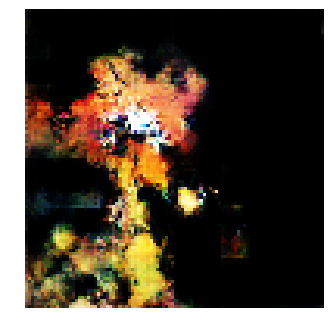


Epoch: 7500, D: -4.981, G: 4.234
Epoch: 7501, D: -6.451, G: 4.789
Epoch: 7502, D: -5.766, G: 2.535
Epoch: 7503, D: -6.811, G: 3.059
Epoch: 7504, D: -6.218, G: 2.01
Epoch: 7505, D: -5.793, G: 2.433
Epoch: 7506, D: -7.769, G: 4.364
Epoch: 7507, D: -7.259, G: 4.819
Epoch: 7508, D: -7.016, G: 3.257
Epoch: 7509, D: -6.149, G: 5.07
Epoch: 7510, D: -6.46, G: 6.239
Epoch: 7511, D: -5.542, G: 4.051
Epoch: 7512, D: -6.681, G: 5.575
Epoch: 7513, D: -5.226, G: 3.49
Epoch: 7514, D: -5.845, G: 3.364
Epoch: 7515, D: -6.443, G: 3.553
Epoch: 7516, D: -7.04, G: 3.105
Epoch: 7517, D: -6.807, G: 6.546
Epoch: 7518, D: -4.994, G: 5.044
Epoch: 7519, D: -7.486, G: 4.862


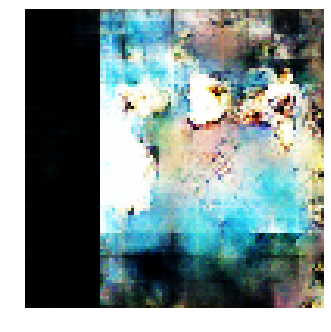


Epoch: 7520, D: -6.124, G: 3.392
Epoch: 7521, D: -7.099, G: 2.862
Epoch: 7522, D: -7.628, G: 0.382
Epoch: 7523, D: -6.506, G: 2.147
Epoch: 7524, D: -7.071, G: 4.13
Epoch: 7525, D: -5.688, G: 6.414
Epoch: 7526, D: -6.027, G: 5.231
Epoch: 7527, D: -5.256, G: 7.582
Epoch: 7528, D: -6.728, G: 5.132
Epoch: 7529, D: -6.416, G: 2.742
Epoch: 7530, D: -6.895, G: 3.067
Epoch: 7531, D: -5.794, G: 0.109
Epoch: 7532, D: -5.854, G: 3.447
Epoch: 7533, D: -5.276, G: 5.119
Epoch: 7534, D: -6.103, G: 7.489
Epoch: 7535, D: -6.134, G: 3.88
Epoch: 7536, D: -6.507, G: 3.989
Epoch: 7537, D: -6.762, G: 2.616
Epoch: 7538, D: -5.948, G: 4.019
Epoch: 7539, D: -7.424, G: 6.308


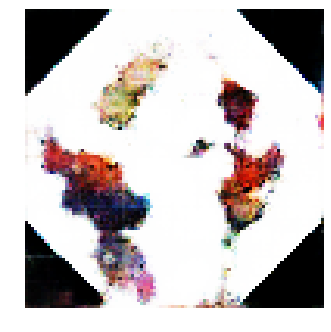


Epoch: 7540, D: -5.553, G: 1.757
Epoch: 7541, D: -6.731, G: 7.066
Epoch: 7542, D: -6.056, G: 2.539
Epoch: 7543, D: -7.981, G: 6.092
Epoch: 7544, D: -6.398, G: 1.248
Epoch: 7545, D: -5.711, G: 3.698
Epoch: 7546, D: -5.241, G: 3.218
Epoch: 7547, D: -7.529, G: 6.61
Epoch: 7548, D: -5.934, G: 4.037
Epoch: 7549, D: -6.394, G: 5.011
Epoch: 7550, D: -8.321, G: 4.506
Epoch: 7551, D: -7.143, G: 6.525
Epoch: 7552, D: -5.812, G: 4.061
Epoch: 7553, D: -6.6, G: 4.481
Epoch: 7554, D: -6.244, G: 3.833
Epoch: 7555, D: -6.544, G: 2.221
Epoch: 7556, D: -6.653, G: 1.833
Epoch: 7557, D: -6.912, G: 2.275
Epoch: 7558, D: -6.777, G: 2.074
Epoch: 7559, D: -7.331, G: 2.592


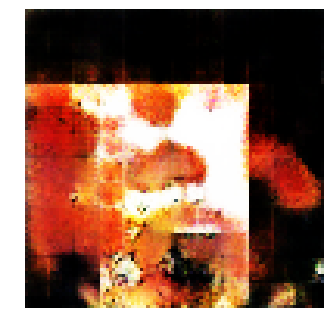


Epoch: 7560, D: -6.506, G: 1.326
Epoch: 7561, D: -5.199, G: 2.535
Epoch: 7562, D: -6.663, G: 4.801
Epoch: 7563, D: -6.313, G: 6.262
Epoch: 7564, D: -6.892, G: 3.183
Epoch: 7565, D: -5.694, G: 3.266
Epoch: 7566, D: -5.451, G: 3.273
Epoch: 7567, D: -7.08, G: 5.859
Epoch: 7568, D: -6.523, G: 2.369
Epoch: 7569, D: -5.962, G: 3.733
Epoch: 7570, D: -6.243, G: 2.444
Epoch: 7571, D: -6.691, G: 3.54
Epoch: 7572, D: -5.367, G: 5.08
Epoch: 7573, D: -5.168, G: 4.799
Epoch: 7574, D: -6.757, G: 6.119
Epoch: 7575, D: -5.69, G: 4.171
Epoch: 7576, D: -5.868, G: 2.898
Epoch: 7577, D: -6.07, G: 1.712
Epoch: 7578, D: -6.353, G: 3.592
Epoch: 7579, D: -7.607, G: 2.775


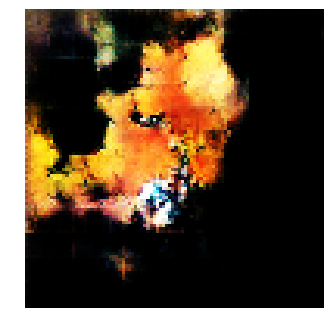


Epoch: 7580, D: -4.958, G: 5.436
Epoch: 7581, D: -7.523, G: 3.474
Epoch: 7582, D: -7.409, G: 4.616
Epoch: 7583, D: -6.115, G: 1.941
Epoch: 7584, D: -7.08, G: 3.932
Epoch: 7585, D: -6.371, G: 4.187
Epoch: 7586, D: -7.179, G: 2.366
Epoch: 7587, D: -7.224, G: 2.439
Epoch: 7588, D: -6.202, G: 4.56
Epoch: 7589, D: -6.6, G: 3.941
Epoch: 7590, D: -6.795, G: 5.276
Epoch: 7591, D: -5.475, G: 4.372
Epoch: 7592, D: -8.172, G: 5.074
Epoch: 7593, D: -6.344, G: 2.077
Epoch: 7594, D: -5.889, G: 2.839
Epoch: 7595, D: -6.775, G: 5.006
Epoch: 7596, D: -6.9, G: 6.491
Epoch: 7597, D: -7.338, G: 6.195
Epoch: 7598, D: -5.743, G: 7.51
Epoch: 7599, D: -7.334, G: 3.875


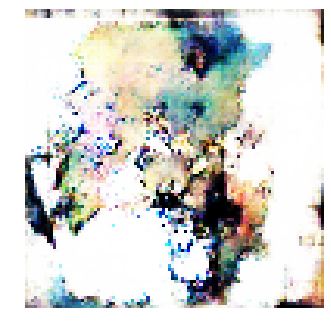


Epoch: 7600, D: -6.138, G: 1.919
Epoch: 7601, D: -6.307, G: 5.006
Epoch: 7602, D: -4.726, G: 5.205
Epoch: 7603, D: -7.519, G: 1.16
Epoch: 7604, D: -5.735, G: 3.977
Epoch: 7605, D: -6.613, G: 2.966
Epoch: 7606, D: -4.835, G: 4.153
Epoch: 7607, D: -6.062, G: 3.678
Epoch: 7608, D: -5.956, G: 7.85
Epoch: 7609, D: -9.005, G: 2.489
Epoch: 7610, D: -5.411, G: 5.125
Epoch: 7611, D: -7.617, G: 3.248
Epoch: 7612, D: -4.161, G: 5.894
Epoch: 7613, D: -5.238, G: 4.817
Epoch: 7614, D: -6.289, G: 4.533
Epoch: 7615, D: -5.723, G: 3.798
Epoch: 7616, D: -6.952, G: 6.448
Epoch: 7617, D: -6.44, G: 3.303
Epoch: 7618, D: -6.467, G: 3.571
Epoch: 7619, D: -8.152, G: 4.293


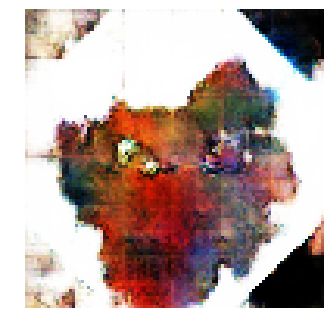


Epoch: 7620, D: -5.729, G: 5.62
Epoch: 7621, D: -5.873, G: 3.93
Epoch: 7622, D: -6.364, G: 3.881
Epoch: 7623, D: -7.315, G: 4.517
Epoch: 7624, D: -5.694, G: 3.71
Epoch: 7625, D: -4.52, G: 0.7281
Epoch: 7626, D: -5.879, G: 4.053
Epoch: 7627, D: -6.435, G: 4.665
Epoch: 7628, D: -7.108, G: 1.495
Epoch: 7629, D: -5.762, G: 3.504
Epoch: 7630, D: -7.916, G: 4.709
Epoch: 7631, D: -6.461, G: 5.232
Epoch: 7632, D: -6.28, G: 3.73
Epoch: 7633, D: -8.43, G: 3.11
Epoch: 7634, D: -4.652, G: 3.575
Epoch: 7635, D: -6.241, G: 4.716
Epoch: 7636, D: -5.914, G: 4.101
Epoch: 7637, D: -6.71, G: 4.074
Epoch: 7638, D: -7.243, G: 3.75
Epoch: 7639, D: -6.509, G: 4.386


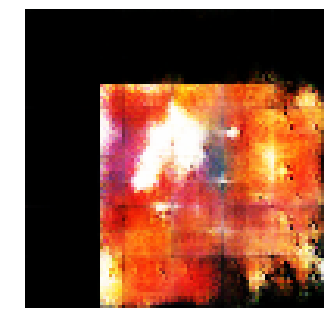


Epoch: 7640, D: -6.297, G: 2.373
Epoch: 7641, D: -6.629, G: 4.026
Epoch: 7642, D: -6.525, G: 3.701
Epoch: 7643, D: -5.961, G: 2.846
Epoch: 7644, D: -6.177, G: 3.578
Epoch: 7645, D: -6.757, G: 6.197
Epoch: 7646, D: -4.745, G: 6.157
Epoch: 7647, D: -5.096, G: 5.709
Epoch: 7648, D: -6.923, G: 7.232
Epoch: 7649, D: -6.153, G: 3.998
Epoch: 7650, D: -5.485, G: 4.164
Epoch: 7651, D: -5.736, G: 4.648
Epoch: 7652, D: -5.907, G: 4.286
Epoch: 7653, D: -5.951, G: 0.2363
Epoch: 7654, D: -5.736, G: 3.976
Epoch: 7655, D: -6.396, G: 1.22
Epoch: 7656, D: -5.942, G: 3.336
Epoch: 7657, D: -6.972, G: 5.763
Epoch: 7658, D: -5.873, G: 4.312
Epoch: 7659, D: -6.739, G: 3.322


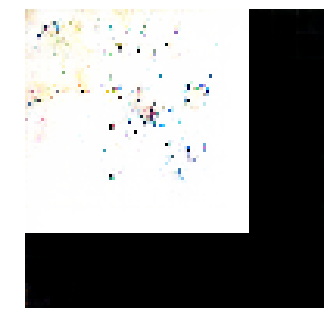


Epoch: 7660, D: -6.35, G: 5.066
Epoch: 7661, D: -7.056, G: 5.308
Epoch: 7662, D: -5.627, G: 4.98
Epoch: 7663, D: -7.073, G: 4.56
Epoch: 7664, D: -5.779, G: 4.214
Epoch: 7665, D: -7.125, G: 4.342
Epoch: 7666, D: -6.184, G: 5.522
Epoch: 7667, D: -5.76, G: 5.017
Epoch: 7668, D: -6.566, G: 5.054
Epoch: 7669, D: -6.943, G: 3.5
Epoch: 7670, D: -6.052, G: 3.686
Epoch: 7671, D: -7.083, G: 4.433
Epoch: 7672, D: -5.867, G: 4.374
Epoch: 7673, D: -6.709, G: 6.475
Epoch: 7674, D: -7.283, G: 4.303
Epoch: 7675, D: -5.961, G: 3.628
Epoch: 7676, D: -6.164, G: 1.641
Epoch: 7677, D: -7.186, G: 3.927
Epoch: 7678, D: -6.741, G: 5.407
Epoch: 7679, D: -5.415, G: 3.216


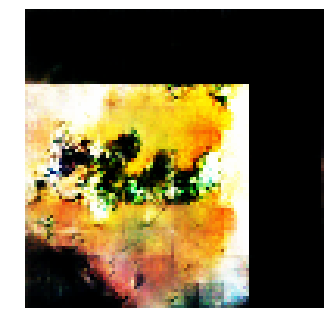


Epoch: 7680, D: -5.669, G: 3.28
Epoch: 7681, D: -5.419, G: -0.2058
Epoch: 7682, D: -7.063, G: 3.505
Epoch: 7683, D: -7.99, G: 6.984
Epoch: 7684, D: -5.101, G: 1.442
Epoch: 7685, D: -4.286, G: 1.88
Epoch: 7686, D: -6.755, G: 4.563
Epoch: 7687, D: -6.846, G: 4.824
Epoch: 7688, D: -5.44, G: 2.283
Epoch: 7689, D: -7.302, G: 5.473
Epoch: 7690, D: -6.892, G: 4.205
Epoch: 7691, D: -7.696, G: 4.602
Epoch: 7692, D: -6.463, G: 5.587
Epoch: 7693, D: -7.737, G: 4.873
Epoch: 7694, D: -5.317, G: 4.79
Epoch: 7695, D: -8.242, G: 4.452
Epoch: 7696, D: -6.241, G: 2.661
Epoch: 7697, D: -7.426, G: 5.318
Epoch: 7698, D: -5.523, G: 3.699
Epoch: 7699, D: -7.181, G: 5.571


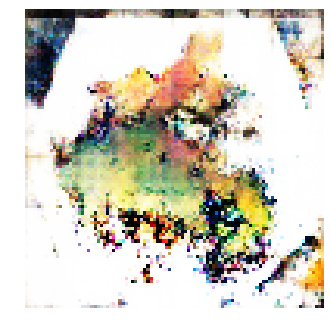


Epoch: 7700, D: -6.131, G: 7.534
Epoch: 7701, D: -6.059, G: 5.917
Epoch: 7702, D: -5.537, G: 5.715
Epoch: 7703, D: -5.768, G: 1.681
Epoch: 7704, D: -6.013, G: 4.372
Epoch: 7705, D: -6.22, G: 5.198
Epoch: 7706, D: -4.975, G: 3.502
Epoch: 7707, D: -6.06, G: 2.682
Epoch: 7708, D: -7.791, G: 5.536
Epoch: 7709, D: -6.611, G: 1.748
Epoch: 7710, D: -6.693, G: 3.667
Epoch: 7711, D: -5.488, G: 6.971
Epoch: 7712, D: -6.585, G: 3.07
Epoch: 7713, D: -8.086, G: 3.698
Epoch: 7714, D: -6.255, G: 1.521
Epoch: 7715, D: -4.611, G: 3.099
Epoch: 7716, D: -7.755, G: 4.965
Epoch: 7717, D: -6.083, G: 3.3
Epoch: 7718, D: -5.836, G: 3.018
Epoch: 7719, D: -5.955, G: 2.521


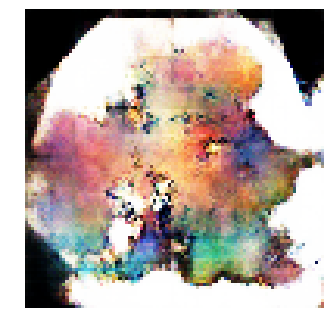


Epoch: 7720, D: -8.034, G: 3.834
Epoch: 7721, D: -5.577, G: 4.426
Epoch: 7722, D: -6.499, G: 5.007
Epoch: 7723, D: -6.276, G: 5.097
Epoch: 7724, D: -6.419, G: 5.557
Epoch: 7725, D: -6.701, G: 1.807
Epoch: 7726, D: -5.668, G: 4.641
Epoch: 7727, D: -6.235, G: 8.472
Epoch: 7728, D: -4.642, G: 3.305
Epoch: 7729, D: -5.282, G: 5.637
Epoch: 7730, D: -7.273, G: 2.746
Epoch: 7731, D: -7.952, G: 2.631
Epoch: 7732, D: -6.674, G: 3.038
Epoch: 7733, D: -5.281, G: 1.391
Epoch: 7734, D: -6.584, G: 6.283
Epoch: 7735, D: -6.47, G: -0.09093
Epoch: 7736, D: -5.965, G: 2.912
Epoch: 7737, D: -5.939, G: 5.721
Epoch: 7738, D: -5.49, G: 4.023
Epoch: 7739, D: -7.421, G: 3.186


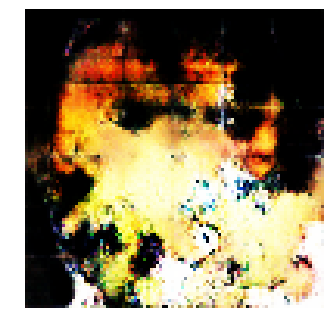


Epoch: 7740, D: -5.367, G: 5.272
Epoch: 7741, D: -6.764, G: 3.575
Epoch: 7742, D: -7.277, G: 3.635
Epoch: 7743, D: -7.486, G: 4.682
Epoch: 7744, D: -7.28, G: 2.139
Epoch: 7745, D: -6.951, G: 3.469
Epoch: 7746, D: -6.561, G: 5.589
Epoch: 7747, D: -7.651, G: 1.783
Epoch: 7748, D: -5.287, G: 3.179
Epoch: 7749, D: -6.134, G: 3.655
Epoch: 7750, D: -5.98, G: 3.179
Epoch: 7751, D: -6.622, G: 7.547
Epoch: 7752, D: -8.047, G: 4.188
Epoch: 7753, D: -5.91, G: 2.019
Epoch: 7754, D: -5.448, G: 3.492
Epoch: 7755, D: -6.696, G: 5.726
Epoch: 7756, D: -7.228, G: 5.573
Epoch: 7757, D: -6.228, G: 3.098
Epoch: 7758, D: -7.785, G: 7.27
Epoch: 7759, D: -5.966, G: 5.543


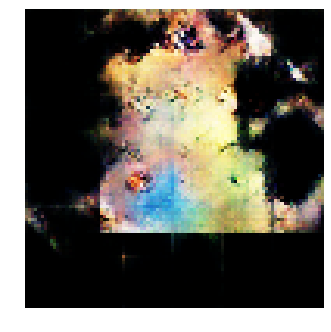


Epoch: 7760, D: -4.699, G: 3.305
Epoch: 7761, D: -6.066, G: 4.287
Epoch: 7762, D: -7.753, G: 5.868
Epoch: 7763, D: -5.153, G: 4.76
Epoch: 7764, D: -6.652, G: 2.175
Epoch: 7765, D: -5.822, G: 5.189
Epoch: 7766, D: -5.959, G: 3.245
Epoch: 7767, D: -5.309, G: 5.581
Epoch: 7768, D: -6.476, G: 3.715
Epoch: 7769, D: -4.23, G: 5.105
Epoch: 7770, D: -7.624, G: 4.02
Epoch: 7771, D: -6.092, G: -0.05526
Epoch: 7772, D: -5.887, G: 3.222
Epoch: 7773, D: -7.426, G: 4.576
Epoch: 7774, D: -6.086, G: 4.17
Epoch: 7775, D: -5.675, G: 4.073
Epoch: 7776, D: -5.995, G: 5.316
Epoch: 7777, D: -6.703, G: 3.885
Epoch: 7778, D: -6.108, G: 4.269
Epoch: 7779, D: -5.311, G: 4.762


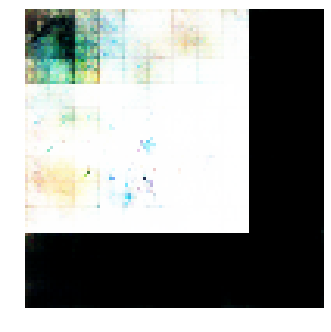


Epoch: 7780, D: -6.092, G: 5.916
Epoch: 7781, D: -4.891, G: 4.906
Epoch: 7782, D: -7.105, G: 2.145
Epoch: 7783, D: -7.425, G: 5.398
Epoch: 7784, D: -6.333, G: 4.003
Epoch: 7785, D: -6.336, G: 4.911
Epoch: 7786, D: -5.371, G: 5.685
Epoch: 7787, D: -6.686, G: 3.872
Epoch: 7788, D: -3.237, G: 2.163
Epoch: 7789, D: -5.847, G: 4.743
Epoch: 7790, D: -6.778, G: 4.819
Epoch: 7791, D: -7.228, G: 4.045
Epoch: 7792, D: -4.938, G: 4.348
Epoch: 7793, D: -7.073, G: 3.396
Epoch: 7794, D: -5.634, G: 4.142
Epoch: 7795, D: -6.151, G: 2.786
Epoch: 7796, D: -6.121, G: 3.212
Epoch: 7797, D: -5.84, G: 1.145
Epoch: 7798, D: -5.454, G: 6.021
Epoch: 7799, D: -6.949, G: 6.046


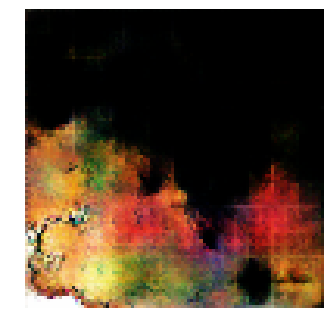


Epoch: 7800, D: -8.02, G: 3.714
Epoch: 7801, D: -5.667, G: 7.107
Epoch: 7802, D: -6.919, G: 2.338
Epoch: 7803, D: -6.055, G: 4.743
Epoch: 7804, D: -5.017, G: 8.322
Epoch: 7805, D: -5.812, G: 4.41
Epoch: 7806, D: -6.751, G: 5.105
Epoch: 7807, D: -5.529, G: 1.598
Epoch: 7808, D: -4.979, G: 7.807
Epoch: 7809, D: -6.432, G: 4.95
Epoch: 7810, D: -6.807, G: 6.274
Epoch: 7811, D: -5.289, G: 3.454
Epoch: 7812, D: -7.073, G: 5.066
Epoch: 7813, D: -6.48, G: 4.33
Epoch: 7814, D: -6.337, G: 4.512
Epoch: 7815, D: -6.803, G: 5.405
Epoch: 7816, D: -6.561, G: 2.162
Epoch: 7817, D: -6.796, G: 6.928
Epoch: 7818, D: -6.073, G: 4.469
Epoch: 7819, D: -6.49, G: 4.133


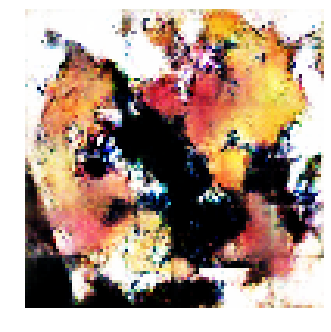


Epoch: 7820, D: -7.182, G: 5.571
Epoch: 7821, D: -6.228, G: 3.042
Epoch: 7822, D: -4.809, G: 1.622
Epoch: 7823, D: -7.201, G: 7.016
Epoch: 7824, D: -5.703, G: 3.435
Epoch: 7825, D: -6.647, G: 4.05
Epoch: 7826, D: -4.621, G: 7.052
Epoch: 7827, D: -6.927, G: 2.848
Epoch: 7828, D: -7.324, G: 0.863
Epoch: 7829, D: -6.051, G: 0.822
Epoch: 7830, D: -6.169, G: 2.735
Epoch: 7831, D: -7.195, G: 2.872
Epoch: 7832, D: -6.445, G: 7.234
Epoch: 7833, D: -6.856, G: 4.916
Epoch: 7834, D: -7.337, G: 3.957
Epoch: 7835, D: -7.82, G: 4.534
Epoch: 7836, D: -7.744, G: 3.687
Epoch: 7837, D: -7.453, G: 2.589
Epoch: 7838, D: -6.744, G: 5.041
Epoch: 7839, D: -5.019, G: 3.286


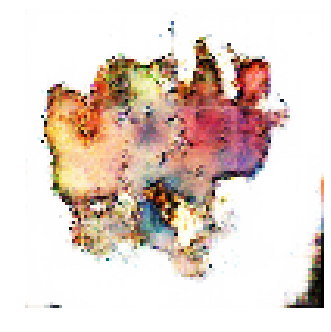


Epoch: 7840, D: -5.378, G: 3.669
Epoch: 7841, D: -6.696, G: 3.013
Epoch: 7842, D: -8.23, G: 1.959
Epoch: 7843, D: -7.565, G: 4.884
Epoch: 7844, D: -6.446, G: 4.016
Epoch: 7845, D: -6.258, G: 7.291
Epoch: 7846, D: -6.148, G: 2.285
Epoch: 7847, D: -6.356, G: 3.444
Epoch: 7848, D: -6.653, G: 7.25
Epoch: 7849, D: -4.693, G: 3.934
Epoch: 7850, D: -7.276, G: 4.905
Epoch: 7851, D: -5.951, G: 8.678
Epoch: 7852, D: -6.04, G: 8.592
Epoch: 7853, D: -5.34, G: 6.607
Epoch: 7854, D: -5.938, G: 5.623
Epoch: 7855, D: -6.241, G: 5.389
Epoch: 7856, D: -6.616, G: 7.006
Epoch: 7857, D: -6.852, G: 3.473
Epoch: 7858, D: -6.57, G: 5.304
Epoch: 7859, D: -6.047, G: 3.43


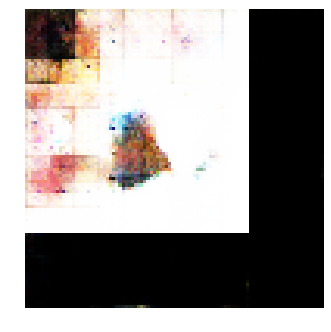


Epoch: 7860, D: -6.845, G: 2.811
Epoch: 7861, D: -6.973, G: 3.207
Epoch: 7862, D: -6.086, G: 2.027
Epoch: 7863, D: -7.19, G: 4.283
Epoch: 7864, D: -5.581, G: 6.108
Epoch: 7865, D: -6.097, G: 3.639
Epoch: 7866, D: -7.149, G: 6.733
Epoch: 7867, D: -6.153, G: 5.38
Epoch: 7868, D: -6.96, G: 5.261
Epoch: 7869, D: -6.215, G: 3.253
Epoch: 7870, D: -6.41, G: 1.508
Epoch: 7871, D: -5.7, G: 3.916
Epoch: 7872, D: -6.459, G: 5.024
Epoch: 7873, D: -5.458, G: 4.456
Epoch: 7874, D: -6.409, G: 4.624
Epoch: 7875, D: -6.129, G: 3.407
Epoch: 7876, D: -5.954, G: 4.467
Epoch: 7877, D: -6.136, G: 2.803
Epoch: 7878, D: -7.096, G: 3.438
Epoch: 7879, D: -6.75, G: 5.693


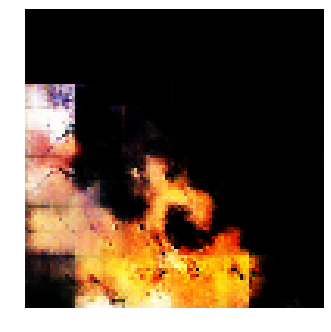


Epoch: 7880, D: -5.297, G: 5.739
Epoch: 7881, D: -6.524, G: 3.709
Epoch: 7882, D: -6.008, G: 3.575
Epoch: 7883, D: -5.569, G: 1.647
Epoch: 7884, D: -5.127, G: 4.017
Epoch: 7885, D: -5.651, G: 3.277
Epoch: 7886, D: -4.822, G: 3.088
Epoch: 7887, D: -7.375, G: 3.358
Epoch: 7888, D: -6.292, G: 4.931
Epoch: 7889, D: -6.948, G: 2.624
Epoch: 7890, D: -6.512, G: 5.888
Epoch: 7891, D: -6.716, G: 4.371
Epoch: 7892, D: -6.056, G: 3.992
Epoch: 7893, D: -5.62, G: 5.507
Epoch: 7894, D: -5.202, G: 4.132
Epoch: 7895, D: -7.355, G: 5.159
Epoch: 7896, D: -7.026, G: 3.878
Epoch: 7897, D: -6.231, G: 4.476
Epoch: 7898, D: -7.198, G: 5.682
Epoch: 7899, D: -5.376, G: 3.337


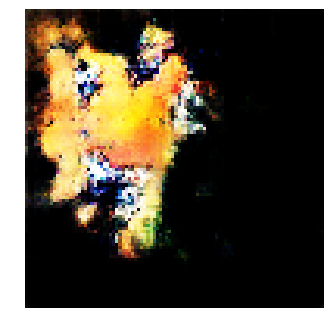


Epoch: 7900, D: -6.672, G: 3.989
Epoch: 7901, D: -5.916, G: 5.535
Epoch: 7902, D: -6.39, G: 7.635
Epoch: 7903, D: -6.018, G: 4.719
Epoch: 7904, D: -6.765, G: 3.309
Epoch: 7905, D: -4.221, G: 6.352
Epoch: 7906, D: -6.44, G: 4.56
Epoch: 7907, D: -7.685, G: 5.142
Epoch: 7908, D: -6.051, G: 6.722
Epoch: 7909, D: -6.53, G: 5.757
Epoch: 7910, D: -7.214, G: 5.621
Epoch: 7911, D: -8.391, G: 1.992
Epoch: 7912, D: -4.947, G: 2.022
Epoch: 7913, D: -5.087, G: 6.087
Epoch: 7914, D: -7.196, G: 3.792
Epoch: 7915, D: -7.168, G: 2.845
Epoch: 7916, D: -5.855, G: 5.446
Epoch: 7917, D: -6.203, G: 3.421
Epoch: 7918, D: -6.551, G: 7.418
Epoch: 7919, D: -6.316, G: 2.396


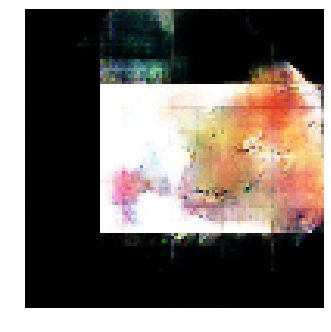


Epoch: 7920, D: -5.888, G: 2.952
Epoch: 7921, D: -7.462, G: 2.368
Epoch: 7922, D: -6.897, G: 4.344
Epoch: 7923, D: -7.279, G: 3.55
Epoch: 7924, D: -7.011, G: 3.356
Epoch: 7925, D: -6.452, G: 5.752
Epoch: 7926, D: -6.246, G: 5.242
Epoch: 7927, D: -6.919, G: 2.052
Epoch: 7928, D: -6.998, G: 4.409
Epoch: 7929, D: -6.527, G: 3.952
Epoch: 7930, D: -6.519, G: 2.357
Epoch: 7931, D: -6.549, G: 1.794
Epoch: 7932, D: -6.698, G: 1.999
Epoch: 7933, D: -5.238, G: 3.941
Epoch: 7934, D: -5.52, G: 3.104
Epoch: 7935, D: -5.099, G: 4.642
Epoch: 7936, D: -5.218, G: 2.714
Epoch: 7937, D: -7.595, G: 3.85
Epoch: 7938, D: -5.794, G: 1.303
Epoch: 7939, D: -5.726, G: 5.642


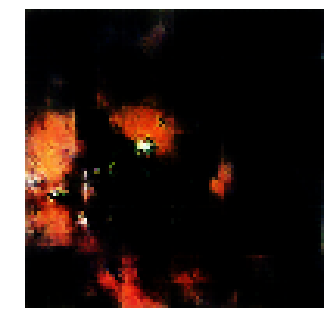


Epoch: 7940, D: -6.285, G: 1.681
Epoch: 7941, D: -6.264, G: 5.747
Epoch: 7942, D: -5.523, G: 7.115
Epoch: 7943, D: -6.346, G: 7.642
Epoch: 7944, D: -4.795, G: 6.458
Epoch: 7945, D: -6.378, G: 5.529
Epoch: 7946, D: -6.689, G: 4.477
Epoch: 7947, D: -7.583, G: 5.175
Epoch: 7948, D: -6.523, G: 4.57
Epoch: 7949, D: -4.876, G: 4.692
Epoch: 7950, D: -5.412, G: 3.863
Epoch: 7951, D: -7.126, G: 5.573
Epoch: 7952, D: -6.61, G: 0.834
Epoch: 7953, D: -5.741, G: 1.678
Epoch: 7954, D: -6.356, G: 5.793
Epoch: 7955, D: -6.274, G: 2.713
Epoch: 7956, D: -6.437, G: 2.828
Epoch: 7957, D: -6.375, G: 2.213
Epoch: 7958, D: -6.554, G: 5.312
Epoch: 7959, D: -5.511, G: 3.61


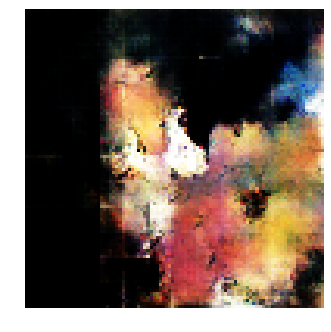


Epoch: 7960, D: -5.666, G: 5.404
Epoch: 7961, D: -6.217, G: 7.019
Epoch: 7962, D: -4.379, G: 2.982
Epoch: 7963, D: -6.025, G: 4.881
Epoch: 7964, D: -7.06, G: 5.752
Epoch: 7965, D: -7.017, G: 5.363
Epoch: 7966, D: -6.878, G: 5.047
Epoch: 7967, D: -7.219, G: 3.424
Epoch: 7968, D: -6.45, G: 2.168
Epoch: 7969, D: -6.884, G: 4.293
Epoch: 7970, D: -6.049, G: 3.654
Epoch: 7971, D: -5.016, G: 4.756
Epoch: 7972, D: -6.494, G: 5.675
Epoch: 7973, D: -6.108, G: 1.259
Epoch: 7974, D: -6.954, G: 3.272
Epoch: 7975, D: -7.828, G: 2.682
Epoch: 7976, D: -7.886, G: 6.437
Epoch: 7977, D: -6.533, G: 4.029
Epoch: 7978, D: -6.985, G: 4.502
Epoch: 7979, D: -6.878, G: 4.509


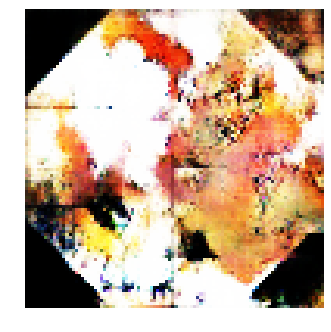


Epoch: 7980, D: -7.007, G: 5.048
Epoch: 7981, D: -6.385, G: 3.925
Epoch: 7982, D: -6.029, G: 6.496
Epoch: 7983, D: -5.588, G: 4.57
Epoch: 7984, D: -6.035, G: 6.008
Epoch: 7985, D: -5.776, G: 5.093
Epoch: 7986, D: -6.332, G: 1.633
Epoch: 7987, D: -5.884, G: 5.016
Epoch: 7988, D: -6.161, G: 5.467
Epoch: 7989, D: -7.421, G: 3.084
Epoch: 7990, D: -6.837, G: 2.504
Epoch: 7991, D: -6.793, G: 2.87
Epoch: 7992, D: -5.599, G: 3.934
Epoch: 7993, D: -6.995, G: 3.757
Epoch: 7994, D: -6.977, G: 2.528
Epoch: 7995, D: -7.445, G: 4.691
Epoch: 7996, D: -6.502, G: 2.238
Epoch: 7997, D: -6.492, G: 5.646
Epoch: 7998, D: -6.23, G: 4.994
Epoch: 7999, D: -7.809, G: 4.006


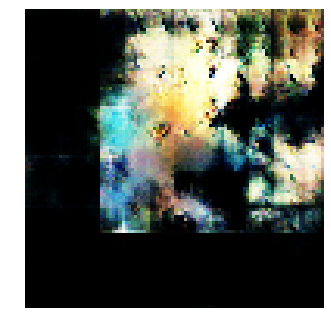


Epoch: 8000, D: -5.635, G: 4.777
Epoch: 8001, D: -7.813, G: 4.505
Epoch: 8002, D: -6.709, G: 4.24
Epoch: 8003, D: -6.885, G: 2.87
Epoch: 8004, D: -7.451, G: 2.696
Epoch: 8005, D: -6.235, G: 1.364
Epoch: 8006, D: -5.885, G: 4.106
Epoch: 8007, D: -6.246, G: 7.02
Epoch: 8008, D: -6.097, G: 3.66
Epoch: 8009, D: -7.543, G: 5.156
Epoch: 8010, D: -6.909, G: 2.826
Epoch: 8011, D: -5.353, G: 4.153
Epoch: 8012, D: -6.08, G: 7.108
Epoch: 8013, D: -6.273, G: 7.538
Epoch: 8014, D: -5.127, G: 4.328
Epoch: 8015, D: -5.783, G: 5.263
Epoch: 8016, D: -7.576, G: 3.782
Epoch: 8017, D: -5.562, G: 1.612
Epoch: 8018, D: -6.771, G: 3.775
Epoch: 8019, D: -6.794, G: 4.319


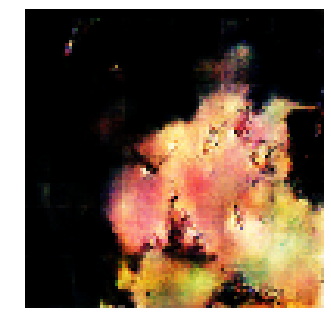


Epoch: 8020, D: -5.505, G: 3.402
Epoch: 8021, D: -5.99, G: 2.807
Epoch: 8022, D: -6.235, G: 4.093
Epoch: 8023, D: -7.271, G: 5.338
Epoch: 8024, D: -5.502, G: 1.482
Epoch: 8025, D: -6.6, G: 2.869
Epoch: 8026, D: -5.863, G: 2.223
Epoch: 8027, D: -7.196, G: 4.815
Epoch: 8028, D: -7.262, G: 5.178
Epoch: 8029, D: -4.42, G: 4.541
Epoch: 8030, D: -7.155, G: 3.383
Epoch: 8031, D: -5.997, G: 3.912
Epoch: 8032, D: -6.063, G: 3.741
Epoch: 8033, D: -7.102, G: 6.428
Epoch: 8034, D: -7.121, G: 2.591
Epoch: 8035, D: -6.418, G: 1.928
Epoch: 8036, D: -6.843, G: 2.902
Epoch: 8037, D: -7.152, G: 3.022
Epoch: 8038, D: -5.229, G: 1.639
Epoch: 8039, D: -7.472, G: 4.187


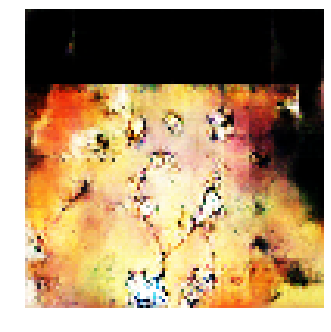


Epoch: 8040, D: -5.047, G: 3.884
Epoch: 8041, D: -6.884, G: 3.434
Epoch: 8042, D: -6.118, G: 3.293
Epoch: 8043, D: -5.998, G: 2.456
Epoch: 8044, D: -6.532, G: 4.008
Epoch: 8045, D: -6.772, G: 4.185
Epoch: 8046, D: -4.84, G: 3.005
Epoch: 8047, D: -5.915, G: 4.653
Epoch: 8048, D: -6.1, G: 5.031
Epoch: 8049, D: -6.821, G: 5.259
Epoch: 8050, D: -6.592, G: 2.904
Epoch: 8051, D: -6.06, G: 4.48
Epoch: 8052, D: -5.875, G: 3.905
Epoch: 8053, D: -6.566, G: 3.313
Epoch: 8054, D: -5.627, G: 4.014
Epoch: 8055, D: -5.031, G: 8.042
Epoch: 8056, D: -5.266, G: 6.224
Epoch: 8057, D: -6.658, G: 3.611
Epoch: 8058, D: -5.685, G: 3.274
Epoch: 8059, D: -6.512, G: 3.233


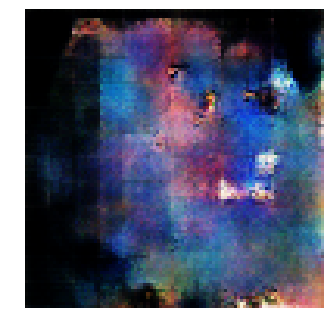


Epoch: 8060, D: -5.681, G: 3.455
Epoch: 8061, D: -6.458, G: 3.132
Epoch: 8062, D: -6.121, G: 3.12
Epoch: 8063, D: -5.0, G: 2.876
Epoch: 8064, D: -7.409, G: 4.129
Epoch: 8065, D: -6.198, G: 1.685
Epoch: 8066, D: -6.198, G: 2.146
Epoch: 8067, D: -7.604, G: 5.153
Epoch: 8068, D: -6.991, G: 1.212
Epoch: 8069, D: -6.583, G: 3.2
Epoch: 8070, D: -6.069, G: 5.605
Epoch: 8071, D: -4.958, G: 3.795
Epoch: 8072, D: -5.676, G: 5.128
Epoch: 8073, D: -6.372, G: 3.084
Epoch: 8074, D: -6.297, G: 4.805
Epoch: 8075, D: -6.482, G: 6.28
Epoch: 8076, D: -6.04, G: 9.077
Epoch: 8077, D: -6.423, G: 6.171
Epoch: 8078, D: -6.419, G: 5.58
Epoch: 8079, D: -6.309, G: 2.23


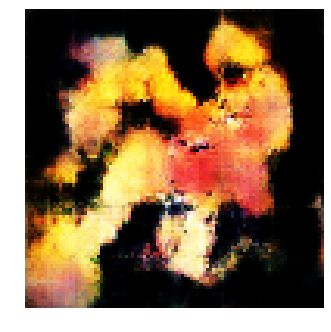


Epoch: 8080, D: -5.473, G: 2.222
Epoch: 8081, D: -7.035, G: 5.334
Epoch: 8082, D: -5.578, G: 1.152
Epoch: 8083, D: -4.427, G: 5.011
Epoch: 8084, D: -5.859, G: 5.698
Epoch: 8085, D: -5.683, G: 2.805
Epoch: 8086, D: -6.643, G: 2.163
Epoch: 8087, D: -8.017, G: 3.199
Epoch: 8088, D: -6.5, G: 2.221
Epoch: 8089, D: -5.709, G: 1.705
Epoch: 8090, D: -4.763, G: 5.764
Epoch: 8091, D: -7.427, G: 4.116
Epoch: 8092, D: -7.303, G: 3.4
Epoch: 8093, D: -6.581, G: 2.634
Epoch: 8094, D: -5.497, G: 4.575
Epoch: 8095, D: -7.005, G: 5.09
Epoch: 8096, D: -6.89, G: 3.185
Epoch: 8097, D: -6.275, G: 5.405
Epoch: 8098, D: -7.699, G: 4.931
Epoch: 8099, D: -6.762, G: 5.967


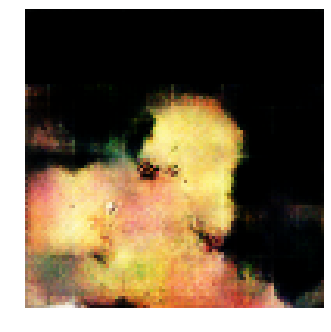


Epoch: 8100, D: -6.649, G: 3.738
Epoch: 8101, D: -6.21, G: 6.362
Epoch: 8102, D: -6.12, G: 4.545
Epoch: 8103, D: -6.458, G: 3.511
Epoch: 8104, D: -6.591, G: 4.134
Epoch: 8105, D: -6.714, G: 4.154
Epoch: 8106, D: -5.201, G: 3.837
Epoch: 8107, D: -5.898, G: 4.462
Epoch: 8108, D: -4.871, G: 5.105
Epoch: 8109, D: -6.64, G: 3.917
Epoch: 8110, D: -6.529, G: 1.251
Epoch: 8111, D: -6.699, G: 4.706
Epoch: 8112, D: -7.076, G: 3.726
Epoch: 8113, D: -6.298, G: 4.688
Epoch: 8114, D: -6.471, G: 5.086
Epoch: 8115, D: -7.358, G: 2.653
Epoch: 8116, D: -6.534, G: 8.371
Epoch: 8117, D: -6.427, G: 3.313
Epoch: 8118, D: -7.255, G: 6.019
Epoch: 8119, D: -6.779, G: 4.687


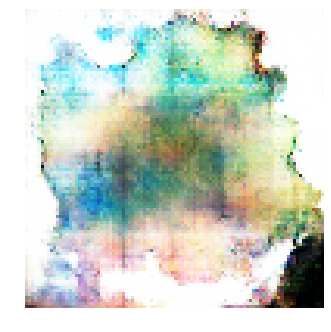


Epoch: 8120, D: -6.535, G: 3.294
Epoch: 8121, D: -5.865, G: 4.836
Epoch: 8122, D: -5.863, G: 5.005
Epoch: 8123, D: -6.204, G: 4.691
Epoch: 8124, D: -7.259, G: 6.082
Epoch: 8125, D: -5.882, G: 3.374
Epoch: 8126, D: -6.801, G: 5.098
Epoch: 8127, D: -5.377, G: 5.053
Epoch: 8128, D: -6.108, G: 4.116
Epoch: 8129, D: -6.181, G: 5.566
Epoch: 8130, D: -5.086, G: 1.655
Epoch: 8131, D: -6.377, G: 4.574
Epoch: 8132, D: -7.218, G: 5.25
Epoch: 8133, D: -6.236, G: 1.295
Epoch: 8134, D: -5.958, G: 2.978
Epoch: 8135, D: -5.58, G: 4.874
Epoch: 8136, D: -5.315, G: 0.3937
Epoch: 8137, D: -7.268, G: 3.899
Epoch: 8138, D: -5.079, G: 3.03
Epoch: 8139, D: -7.055, G: 3.027


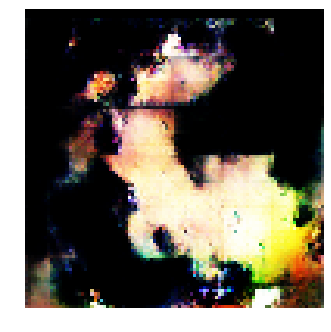


Epoch: 8140, D: -6.393, G: 4.901
Epoch: 8141, D: -7.016, G: 3.502
Epoch: 8142, D: -5.486, G: 3.364
Epoch: 8143, D: -6.413, G: 8.537
Epoch: 8144, D: -6.725, G: 5.155
Epoch: 8145, D: -6.339, G: 3.769
Epoch: 8146, D: -6.949, G: 4.221
Epoch: 8147, D: -6.542, G: 2.962
Epoch: 8148, D: -5.572, G: 5.722
Epoch: 8149, D: -5.75, G: 4.226
Epoch: 8150, D: -7.531, G: 6.046
Epoch: 8151, D: -6.757, G: 2.524
Epoch: 8152, D: -7.39, G: 3.658
Epoch: 8153, D: -6.021, G: 2.379
Epoch: 8154, D: -5.761, G: 3.621
Epoch: 8155, D: -6.434, G: 3.24
Epoch: 8156, D: -7.104, G: 6.476
Epoch: 8157, D: -5.656, G: 6.13
Epoch: 8158, D: -5.491, G: 4.297
Epoch: 8159, D: -5.798, G: 4.636


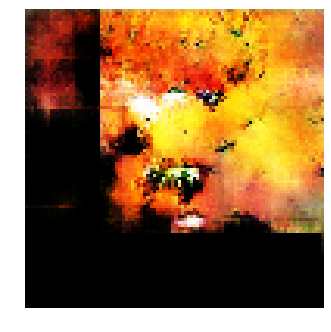


Epoch: 8160, D: -6.272, G: 2.618
Epoch: 8161, D: -8.626, G: 2.212
Epoch: 8162, D: -6.28, G: 2.724
Epoch: 8163, D: -5.926, G: 4.996
Epoch: 8164, D: -6.475, G: 6.141
Epoch: 8165, D: -6.127, G: 4.525
Epoch: 8166, D: -6.517, G: 5.199
Epoch: 8167, D: -6.179, G: 3.486
Epoch: 8168, D: -7.756, G: 5.088
Epoch: 8169, D: -5.058, G: 4.649
Epoch: 8170, D: -6.021, G: 3.518
Epoch: 8171, D: -7.936, G: 2.819
Epoch: 8172, D: -7.501, G: 4.283
Epoch: 8173, D: -7.5, G: 0.9768
Epoch: 8174, D: -4.171, G: 5.547
Epoch: 8175, D: -5.438, G: 5.237
Epoch: 8176, D: -5.106, G: 5.312
Epoch: 8177, D: -6.916, G: 1.556
Epoch: 8178, D: -5.844, G: 5.748
Epoch: 8179, D: -7.941, G: 6.612


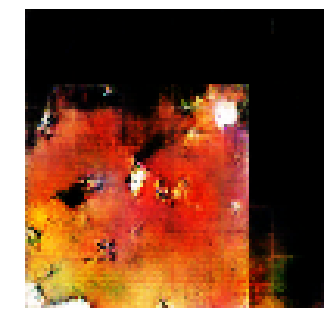


Epoch: 8180, D: -5.392, G: 4.224
Epoch: 8181, D: -7.004, G: 2.982
Epoch: 8182, D: -6.706, G: 3.931
Epoch: 8183, D: -6.825, G: 5.162
Epoch: 8184, D: -6.82, G: 6.362
Epoch: 8185, D: -7.756, G: 4.407
Epoch: 8186, D: -6.461, G: 4.502
Epoch: 8187, D: -7.045, G: 3.534
Epoch: 8188, D: -6.601, G: 0.6737
Epoch: 8189, D: -6.225, G: 4.469
Epoch: 8190, D: -5.978, G: 5.889
Epoch: 8191, D: -6.353, G: 4.067
Epoch: 8192, D: -6.47, G: 4.062
Epoch: 8193, D: -4.75, G: 1.608
Epoch: 8194, D: -6.158, G: 3.705
Epoch: 8195, D: -5.627, G: 4.641
Epoch: 8196, D: -6.293, G: 1.896
Epoch: 8197, D: -7.732, G: 6.586
Epoch: 8198, D: -6.456, G: 2.217
Epoch: 8199, D: -6.64, G: 5.418


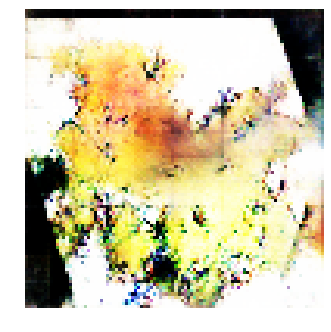


Epoch: 8200, D: -5.38, G: 3.791
Epoch: 8201, D: -7.206, G: 2.378
Epoch: 8202, D: -7.628, G: 1.74
Epoch: 8203, D: -5.377, G: 6.486
Epoch: 8204, D: -6.195, G: 3.516
Epoch: 8205, D: -5.489, G: 4.114
Epoch: 8206, D: -5.04, G: 5.522
Epoch: 8207, D: -5.602, G: 2.884
Epoch: 8208, D: -7.737, G: 3.62
Epoch: 8209, D: -7.279, G: 5.282
Epoch: 8210, D: -6.883, G: 0.7733
Epoch: 8211, D: -6.478, G: 4.661
Epoch: 8212, D: -6.247, G: 1.873
Epoch: 8213, D: -7.719, G: 4.297
Epoch: 8214, D: -5.676, G: 10.19
Epoch: 8215, D: -6.11, G: 3.178
Epoch: 8216, D: -6.452, G: 4.804
Epoch: 8217, D: -7.598, G: 5.11
Epoch: 8218, D: -5.995, G: 4.339
Epoch: 8219, D: -7.391, G: 3.332


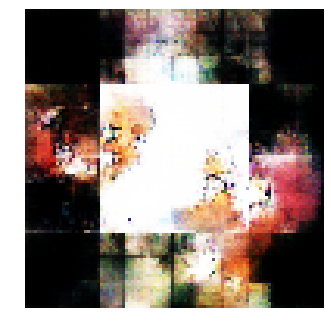


Epoch: 8220, D: -5.492, G: 7.312
Epoch: 8221, D: -6.254, G: 7.05
Epoch: 8222, D: -5.631, G: 4.766
Epoch: 8223, D: -6.718, G: 3.971
Epoch: 8224, D: -6.837, G: 1.99
Epoch: 8225, D: -6.852, G: 4.222
Epoch: 8226, D: -3.705, G: 5.214
Epoch: 8227, D: -7.305, G: 3.649
Epoch: 8228, D: -7.474, G: 3.857
Epoch: 8229, D: -6.813, G: 7.047
Epoch: 8230, D: -4.972, G: 4.531
Epoch: 8231, D: -6.261, G: 4.239
Epoch: 8232, D: -6.941, G: 4.919
Epoch: 8233, D: -6.165, G: 5.671
Epoch: 8234, D: -7.094, G: -0.2425
Epoch: 8235, D: -5.751, G: 5.406
Epoch: 8236, D: -7.429, G: 5.575
Epoch: 8237, D: -7.849, G: 3.045
Epoch: 8238, D: -7.03, G: 5.665
Epoch: 8239, D: -6.851, G: 4.573


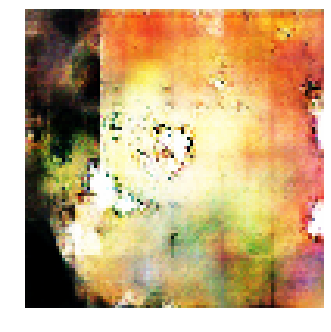


Epoch: 8240, D: -6.072, G: 1.335
Epoch: 8241, D: -6.157, G: 3.561
Epoch: 8242, D: -7.17, G: 1.999
Epoch: 8243, D: -6.29, G: 3.838
Epoch: 8244, D: -6.411, G: 1.726
Epoch: 8245, D: -6.43, G: 6.573
Epoch: 8246, D: -6.693, G: 7.2
Epoch: 8247, D: -6.203, G: 5.538
Epoch: 8248, D: -6.081, G: 3.756
Epoch: 8249, D: -6.468, G: 5.506
Epoch: 8250, D: -5.828, G: 4.613
Epoch: 8251, D: -5.987, G: 2.847
Epoch: 8252, D: -5.833, G: 4.614
Epoch: 8253, D: -6.101, G: 2.835
Epoch: 8254, D: -6.881, G: 3.751
Epoch: 8255, D: -7.225, G: 3.727
Epoch: 8256, D: -7.154, G: 3.773
Epoch: 8257, D: -5.566, G: 4.673
Epoch: 8258, D: -6.532, G: 5.661
Epoch: 8259, D: -5.492, G: 4.278


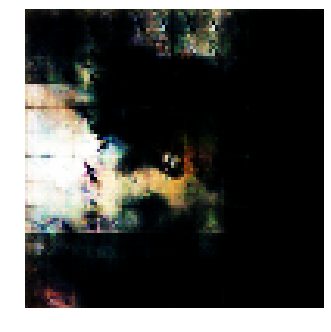


Epoch: 8260, D: -7.034, G: 3.209
Epoch: 8261, D: -6.227, G: 3.904
Epoch: 8262, D: -5.062, G: 2.779
Epoch: 8263, D: -7.419, G: 6.072
Epoch: 8264, D: -8.112, G: 6.577
Epoch: 8265, D: -6.293, G: 3.634
Epoch: 8266, D: -7.025, G: 3.577
Epoch: 8267, D: -6.303, G: 5.938
Epoch: 8268, D: -6.789, G: 4.157
Epoch: 8269, D: -5.995, G: 4.833
Epoch: 8270, D: -6.049, G: 5.229
Epoch: 8271, D: -6.75, G: 2.639
Epoch: 8272, D: -5.704, G: 3.605
Epoch: 8273, D: -5.23, G: 3.68
Epoch: 8274, D: -6.288, G: 3.669
Epoch: 8275, D: -7.142, G: 1.538
Epoch: 8276, D: -6.949, G: 3.475
Epoch: 8277, D: -5.941, G: 4.817
Epoch: 8278, D: -7.093, G: 3.271
Epoch: 8279, D: -7.22, G: 3.719


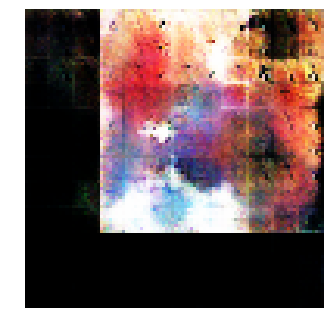


Epoch: 8280, D: -6.251, G: 2.456
Epoch: 8281, D: -6.25, G: 6.654
Epoch: 8282, D: -6.766, G: 4.389
Epoch: 8283, D: -6.09, G: 3.378
Epoch: 8284, D: -7.236, G: 4.078
Epoch: 8285, D: -6.435, G: 4.262
Epoch: 8286, D: -6.832, G: 4.195
Epoch: 8287, D: -5.954, G: 4.445
Epoch: 8288, D: -6.148, G: 3.212
Epoch: 8289, D: -5.453, G: 4.099
Epoch: 8290, D: -7.889, G: 4.083
Epoch: 8291, D: -7.322, G: 2.292
Epoch: 8292, D: -5.437, G: 0.6318
Epoch: 8293, D: -5.091, G: 5.064
Epoch: 8294, D: -4.554, G: 4.052
Epoch: 8295, D: -5.54, G: 6.289
Epoch: 8296, D: -6.633, G: 5.602
Epoch: 8297, D: -4.716, G: 4.659
Epoch: 8298, D: -7.638, G: 5.584
Epoch: 8299, D: -6.343, G: 5.424


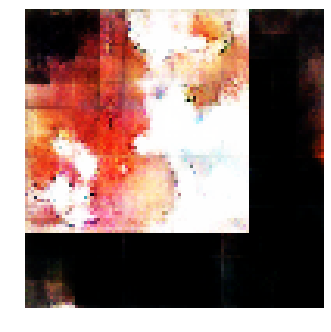


Epoch: 8300, D: -6.137, G: 6.446
Epoch: 8301, D: -6.55, G: 5.606
Epoch: 8302, D: -6.255, G: 5.478
Epoch: 8303, D: -7.897, G: 4.371
Epoch: 8304, D: -6.056, G: 3.132
Epoch: 8305, D: -6.458, G: 3.052
Epoch: 8306, D: -7.91, G: 4.641
Epoch: 8307, D: -5.417, G: 4.834
Epoch: 8308, D: -5.133, G: 4.47
Epoch: 8309, D: -5.719, G: 3.722
Epoch: 8310, D: -4.179, G: 4.758
Epoch: 8311, D: -5.536, G: 5.093
Epoch: 8312, D: -7.019, G: 5.15
Epoch: 8313, D: -6.364, G: 4.67
Epoch: 8314, D: -5.85, G: 3.57
Epoch: 8315, D: -5.755, G: 0.0001077
Epoch: 8316, D: -6.029, G: 4.659
Epoch: 8317, D: -6.265, G: 4.839
Epoch: 8318, D: -6.417, G: 2.62
Epoch: 8319, D: -6.288, G: 2.987


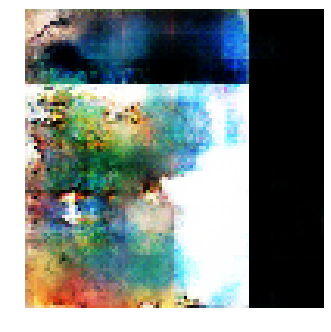


Epoch: 8320, D: -6.918, G: 2.514
Epoch: 8321, D: -5.565, G: 4.943
Epoch: 8322, D: -8.095, G: 2.816
Epoch: 8323, D: -6.297, G: 2.704
Epoch: 8324, D: -5.721, G: 2.082
Epoch: 8325, D: -5.534, G: 3.247
Epoch: 8326, D: -6.665, G: 4.595
Epoch: 8327, D: -6.711, G: 2.405
Epoch: 8328, D: -7.209, G: 5.183
Epoch: 8329, D: -6.337, G: 3.006
Epoch: 8330, D: -5.876, G: 2.427
Epoch: 8331, D: -5.544, G: 4.564
Epoch: 8332, D: -6.184, G: 5.895
Epoch: 8333, D: -7.959, G: 4.65
Epoch: 8334, D: -6.451, G: 2.486
Epoch: 8335, D: -6.763, G: 3.454
Epoch: 8336, D: -6.739, G: 7.473
Epoch: 8337, D: -5.827, G: 2.557
Epoch: 8338, D: -6.492, G: 3.485
Epoch: 8339, D: -7.27, G: 3.857


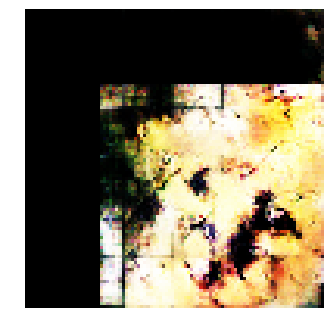


Epoch: 8340, D: -6.44, G: 5.646
Epoch: 8341, D: -8.179, G: 0.9179
Epoch: 8342, D: -6.411, G: 1.944
Epoch: 8343, D: -6.14, G: 4.859
Epoch: 8344, D: -7.375, G: 3.294
Epoch: 8345, D: -6.62, G: 3.258
Epoch: 8346, D: -6.716, G: 3.929
Epoch: 8347, D: -6.859, G: 4.847
Epoch: 8348, D: -7.505, G: 5.376
Epoch: 8349, D: -7.431, G: 5.407
Epoch: 8350, D: -6.306, G: 3.57
Epoch: 8351, D: -6.867, G: 5.125
Epoch: 8352, D: -5.85, G: 4.823
Epoch: 8353, D: -6.341, G: 5.158
Epoch: 8354, D: -6.839, G: 4.442
Epoch: 8355, D: -6.376, G: 6.015
Epoch: 8356, D: -6.483, G: 4.122
Epoch: 8357, D: -6.541, G: 6.461
Epoch: 8358, D: -6.739, G: 6.713
Epoch: 8359, D: -7.035, G: 5.348


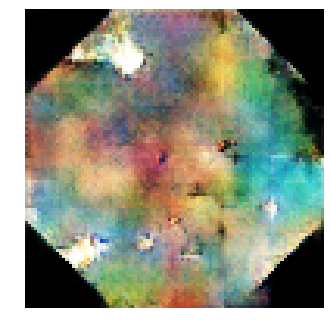


Epoch: 8360, D: -6.888, G: 2.406
Epoch: 8361, D: -7.169, G: 2.615
Epoch: 8362, D: -5.151, G: 2.8
Epoch: 8363, D: -8.273, G: 4.107
Epoch: 8364, D: -8.247, G: 0.9947
Epoch: 8365, D: -6.314, G: 2.89
Epoch: 8366, D: -5.984, G: 3.983
Epoch: 8367, D: -7.274, G: 6.779
Epoch: 8368, D: -5.63, G: 4.296
Epoch: 8369, D: -6.251, G: 5.275
Epoch: 8370, D: -5.561, G: 2.54
Epoch: 8371, D: -4.912, G: 4.568
Epoch: 8372, D: -5.6, G: 3.691
Epoch: 8373, D: -6.337, G: 3.68
Epoch: 8374, D: -7.424, G: 2.45
Epoch: 8375, D: -5.433, G: 1.815
Epoch: 8376, D: -5.34, G: 3.175
Epoch: 8377, D: -6.102, G: 5.22
Epoch: 8378, D: -6.904, G: 6.403
Epoch: 8379, D: -7.118, G: 5.997


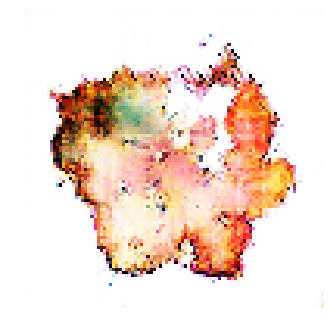


Epoch: 8380, D: -6.468, G: 4.753
Epoch: 8381, D: -6.025, G: 4.795
Epoch: 8382, D: -6.222, G: 3.844
Epoch: 8383, D: -6.627, G: 5.298
Epoch: 8384, D: -5.689, G: 4.636
Epoch: 8385, D: -5.532, G: 3.337
Epoch: 8386, D: -6.425, G: 2.688
Epoch: 8387, D: -7.631, G: 4.168
Epoch: 8388, D: -6.817, G: 4.094
Epoch: 8389, D: -5.277, G: 3.425
Epoch: 8390, D: -6.081, G: 5.569
Epoch: 8391, D: -5.571, G: 4.985
Epoch: 8392, D: -6.28, G: 3.526
Epoch: 8393, D: -6.957, G: 1.925
Epoch: 8394, D: -6.535, G: 6.219
Epoch: 8395, D: -6.401, G: 4.273
Epoch: 8396, D: -5.097, G: 5.759
Epoch: 8397, D: -7.14, G: 5.393
Epoch: 8398, D: -5.548, G: 2.336
Epoch: 8399, D: -5.797, G: 4.298


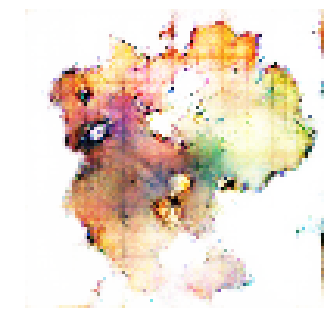


Epoch: 8400, D: -5.274, G: 2.423
Epoch: 8401, D: -5.903, G: 5.899
Epoch: 8402, D: -6.479, G: 1.832
Epoch: 8403, D: -6.282, G: 6.191
Epoch: 8404, D: -6.977, G: 7.5
Epoch: 8405, D: -6.5, G: 4.039
Epoch: 8406, D: -5.947, G: 6.008
Epoch: 8407, D: -6.007, G: 3.854
Epoch: 8408, D: -6.224, G: 6.191
Epoch: 8409, D: -4.819, G: 3.966
Epoch: 8410, D: -5.663, G: 2.132
Epoch: 8411, D: -7.248, G: 5.891
Epoch: 8412, D: -5.493, G: 2.26
Epoch: 8413, D: -6.563, G: 2.983
Epoch: 8414, D: -4.763, G: 3.425
Epoch: 8415, D: -6.524, G: 4.808
Epoch: 8416, D: -5.056, G: 3.514
Epoch: 8417, D: -7.349, G: 5.669
Epoch: 8418, D: -6.098, G: 2.029
Epoch: 8419, D: -6.741, G: 3.311


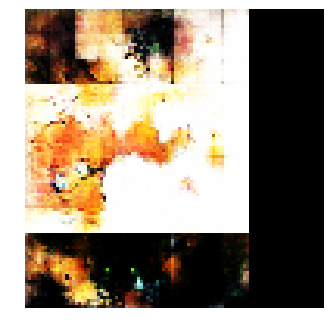


Epoch: 8420, D: -5.791, G: 1.903
Epoch: 8421, D: -6.856, G: 3.126
Epoch: 8422, D: -5.665, G: 2.894
Epoch: 8423, D: -5.93, G: 3.673
Epoch: 8424, D: -6.496, G: 5.272
Epoch: 8425, D: -6.767, G: 3.241
Epoch: 8426, D: -5.815, G: 4.236
Epoch: 8427, D: -5.832, G: 2.586
Epoch: 8428, D: -6.173, G: 3.643
Epoch: 8429, D: -7.375, G: 3.255
Epoch: 8430, D: -6.99, G: -0.5021
Epoch: 8431, D: -5.469, G: 4.422
Epoch: 8432, D: -5.305, G: 1.243
Epoch: 8433, D: -5.332, G: 3.798
Epoch: 8434, D: -7.141, G: 5.301
Epoch: 8435, D: -6.176, G: 5.541
Epoch: 8436, D: -5.646, G: 4.038
Epoch: 8437, D: -7.113, G: 4.258
Epoch: 8438, D: -6.999, G: 4.32
Epoch: 8439, D: -5.645, G: 4.568


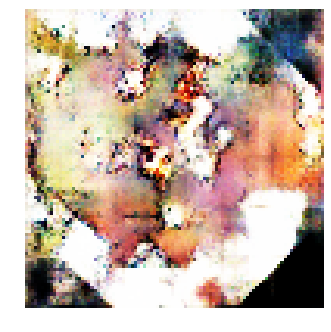


Epoch: 8440, D: -5.422, G: 4.36
Epoch: 8441, D: -6.854, G: 3.613
Epoch: 8442, D: -6.732, G: 7.739
Epoch: 8443, D: -7.131, G: 4.485
Epoch: 8444, D: -5.469, G: 4.512
Epoch: 8445, D: -7.078, G: 3.289
Epoch: 8446, D: -6.19, G: 4.008
Epoch: 8447, D: -6.888, G: 4.574
Epoch: 8448, D: -6.435, G: 1.676
Epoch: 8449, D: -6.922, G: 4.077
Epoch: 8450, D: -6.187, G: 1.74
Epoch: 8451, D: -5.696, G: 1.17
Epoch: 8452, D: -4.987, G: 4.691
Epoch: 8453, D: -7.402, G: 3.14
Epoch: 8454, D: -7.13, G: 5.057
Epoch: 8455, D: -6.215, G: 0.4787
Epoch: 8456, D: -5.746, G: 4.107
Epoch: 8457, D: -6.141, G: 3.094
Epoch: 8458, D: -5.401, G: 6.105
Epoch: 8459, D: -7.289, G: 4.813


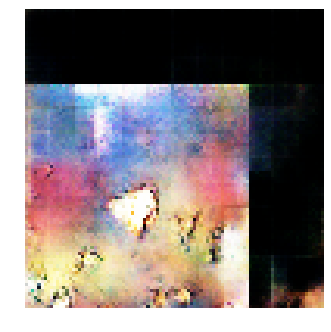


Epoch: 8460, D: -7.285, G: 2.814
Epoch: 8461, D: -5.706, G: 3.308
Epoch: 8462, D: -4.492, G: 5.371
Epoch: 8463, D: -5.266, G: 6.411
Epoch: 8464, D: -5.813, G: 2.704
Epoch: 8465, D: -6.324, G: 4.252
Epoch: 8466, D: -6.507, G: 1.963
Epoch: 8467, D: -6.226, G: 3.346
Epoch: 8468, D: -5.948, G: 4.56
Epoch: 8469, D: -5.303, G: 6.674
Epoch: 8470, D: -6.932, G: 5.319
Epoch: 8471, D: -6.375, G: 3.587
Epoch: 8472, D: -6.4, G: 6.821
Epoch: 8473, D: -5.928, G: 1.303
Epoch: 8474, D: -5.228, G: 5.101
Epoch: 8475, D: -6.486, G: 2.544
Epoch: 8476, D: -6.961, G: 2.565
Epoch: 8477, D: -6.307, G: 5.068
Epoch: 8478, D: -7.313, G: 2.058
Epoch: 8479, D: -7.107, G: 3.922


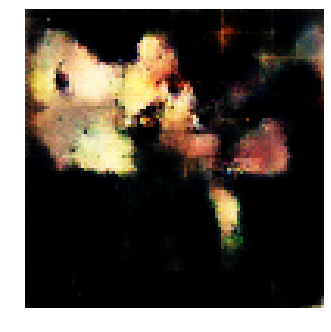


Epoch: 8480, D: -6.945, G: 3.797
Epoch: 8481, D: -6.772, G: 3.067
Epoch: 8482, D: -4.576, G: 5.252
Epoch: 8483, D: -6.66, G: 6.107
Epoch: 8484, D: -6.474, G: 5.508
Epoch: 8485, D: -4.87, G: 3.184
Epoch: 8486, D: -5.121, G: 2.437
Epoch: 8487, D: -5.669, G: 4.546
Epoch: 8488, D: -6.799, G: 0.8651
Epoch: 8489, D: -5.983, G: 2.262
Epoch: 8490, D: -6.902, G: 5.135
Epoch: 8491, D: -6.777, G: 5.957
Epoch: 8492, D: -5.32, G: 4.377
Epoch: 8493, D: -7.986, G: 6.125
Epoch: 8494, D: -7.292, G: 4.18
Epoch: 8495, D: -6.869, G: 1.68
Epoch: 8496, D: -6.879, G: 3.397
Epoch: 8497, D: -5.877, G: 2.696
Epoch: 8498, D: -6.431, G: 7.175
Epoch: 8499, D: -7.098, G: 4.193


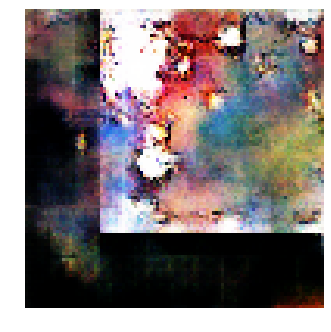


Epoch: 8500, D: -5.553, G: 6.877
Epoch: 8501, D: -5.587, G: 3.293
Epoch: 8502, D: -8.325, G: 5.257
Epoch: 8503, D: -5.978, G: 4.369
Epoch: 8504, D: -6.022, G: 4.688
Epoch: 8505, D: -5.284, G: 5.338
Epoch: 8506, D: -7.303, G: 5.884
Epoch: 8507, D: -7.184, G: 4.785
Epoch: 8508, D: -5.459, G: 2.327
Epoch: 8509, D: -6.802, G: 4.722
Epoch: 8510, D: -6.524, G: 3.594
Epoch: 8511, D: -5.527, G: 2.678
Epoch: 8512, D: -6.631, G: 4.775
Epoch: 8513, D: -5.916, G: 4.335
Epoch: 8514, D: -5.899, G: 2.145
Epoch: 8515, D: -8.111, G: 4.985
Epoch: 8516, D: -5.233, G: 1.07
Epoch: 8517, D: -6.666, G: 5.281
Epoch: 8518, D: -6.173, G: 5.913
Epoch: 8519, D: -5.838, G: 5.203


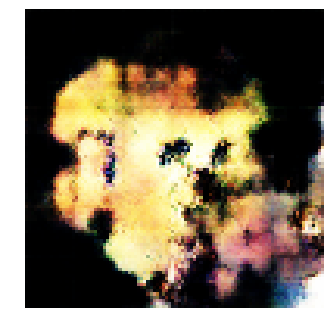


Epoch: 8520, D: -7.608, G: 5.343
Epoch: 8521, D: -6.722, G: 5.538
Epoch: 8522, D: -7.797, G: 5.738
Epoch: 8523, D: -7.598, G: 3.377
Epoch: 8524, D: -7.755, G: 6.671
Epoch: 8525, D: -5.808, G: 6.926
Epoch: 8526, D: -5.836, G: 6.016
Epoch: 8527, D: -6.832, G: 5.969
Epoch: 8528, D: -6.237, G: 3.451
Epoch: 8529, D: -5.642, G: 4.466
Epoch: 8530, D: -7.35, G: 5.952
Epoch: 8531, D: -6.425, G: 3.814
Epoch: 8532, D: -6.091, G: 4.794
Epoch: 8533, D: -6.586, G: 4.894
Epoch: 8534, D: -7.711, G: 2.804
Epoch: 8535, D: -6.281, G: 0.6214
Epoch: 8536, D: -6.57, G: 3.533
Epoch: 8537, D: -6.02, G: 3.721
Epoch: 8538, D: -6.467, G: 2.74
Epoch: 8539, D: -7.038, G: 5.783


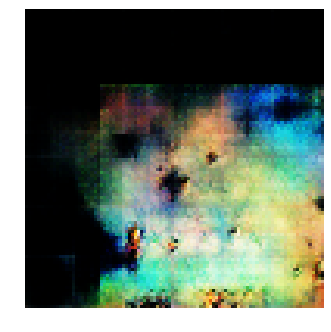


Epoch: 8540, D: -6.31, G: 4.084
Epoch: 8541, D: -6.014, G: 3.463
Epoch: 8542, D: -5.11, G: 3.907
Epoch: 8543, D: -6.878, G: 4.972
Epoch: 8544, D: -7.548, G: 6.62
Epoch: 8545, D: -6.284, G: 3.83
Epoch: 8546, D: -5.879, G: 4.68
Epoch: 8547, D: -5.85, G: 3.21
Epoch: 8548, D: -4.869, G: 3.942
Epoch: 8549, D: -6.362, G: 5.025
Epoch: 8550, D: -5.335, G: 2.203
Epoch: 8551, D: -7.21, G: 4.034
Epoch: 8552, D: -5.755, G: 4.673
Epoch: 8553, D: -7.562, G: 5.365
Epoch: 8554, D: -6.317, G: 4.254
Epoch: 8555, D: -5.913, G: 4.948
Epoch: 8556, D: -6.717, G: 3.137
Epoch: 8557, D: -5.731, G: 4.229
Epoch: 8558, D: -8.204, G: 3.574
Epoch: 8559, D: -5.439, G: 2.202


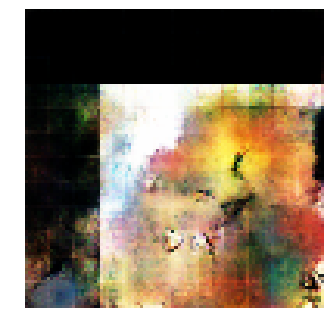


Epoch: 8560, D: -6.24, G: 4.134
Epoch: 8561, D: -6.396, G: 4.518
Epoch: 8562, D: -6.351, G: 5.289
Epoch: 8563, D: -6.269, G: 6.947
Epoch: 8564, D: -7.836, G: 7.815
Epoch: 8565, D: -5.274, G: 4.184
Epoch: 8566, D: -5.896, G: 2.762
Epoch: 8567, D: -7.506, G: 4.351
Epoch: 8568, D: -7.419, G: 4.182
Epoch: 8569, D: -5.996, G: 3.184
Epoch: 8570, D: -7.324, G: 3.864
Epoch: 8571, D: -6.55, G: 4.397
Epoch: 8572, D: -7.131, G: 2.888
Epoch: 8573, D: -6.758, G: 3.188
Epoch: 8574, D: -5.876, G: 2.003
Epoch: 8575, D: -5.761, G: 5.82
Epoch: 8576, D: -5.326, G: 3.937
Epoch: 8577, D: -4.592, G: 4.005
Epoch: 8578, D: -7.231, G: 4.897
Epoch: 8579, D: -6.301, G: 5.537


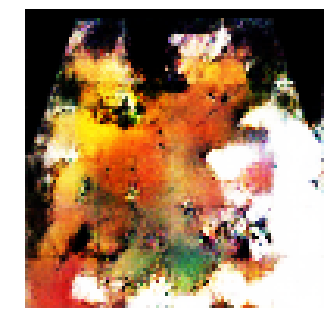


Epoch: 8580, D: -6.221, G: 5.711
Epoch: 8581, D: -5.554, G: 4.838
Epoch: 8582, D: -6.716, G: 5.546
Epoch: 8583, D: -5.874, G: 5.033
Epoch: 8584, D: -4.87, G: 3.964
Epoch: 8585, D: -6.983, G: 2.261
Epoch: 8586, D: -5.775, G: 5.326
Epoch: 8587, D: -6.315, G: 6.801
Epoch: 8588, D: -6.072, G: 6.044
Epoch: 8589, D: -6.297, G: 5.037
Epoch: 8590, D: -6.545, G: 4.097
Epoch: 8591, D: -5.856, G: 3.358
Epoch: 8592, D: -6.884, G: 3.793
Epoch: 8593, D: -6.041, G: 6.116
Epoch: 8594, D: -6.978, G: 2.446
Epoch: 8595, D: -5.861, G: 3.594
Epoch: 8596, D: -5.465, G: 3.409
Epoch: 8597, D: -6.388, G: 3.335
Epoch: 8598, D: -6.962, G: 2.931
Epoch: 8599, D: -7.111, G: 6.994


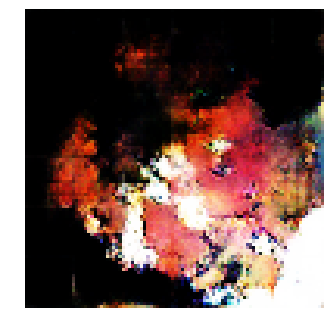


Epoch: 8600, D: -5.271, G: 4.998
Epoch: 8601, D: -6.229, G: 3.242
Epoch: 8602, D: -4.985, G: 3.942
Epoch: 8603, D: -5.694, G: 7.597
Epoch: 8604, D: -6.342, G: 3.499
Epoch: 8605, D: -7.424, G: 3.344
Epoch: 8606, D: -5.609, G: 4.094
Epoch: 8607, D: -5.709, G: 3.158
Epoch: 8608, D: -7.195, G: 3.03
Epoch: 8609, D: -5.974, G: 0.1227
Epoch: 8610, D: -5.89, G: 6.029
Epoch: 8611, D: -5.719, G: 3.95
Epoch: 8612, D: -6.966, G: 0.8548
Epoch: 8613, D: -5.399, G: 0.8157
Epoch: 8614, D: -6.068, G: 5.962
Epoch: 8615, D: -6.462, G: 2.671
Epoch: 8616, D: -5.424, G: 3.884
Epoch: 8617, D: -4.925, G: 3.577
Epoch: 8618, D: -7.448, G: 3.681
Epoch: 8619, D: -5.863, G: 1.218


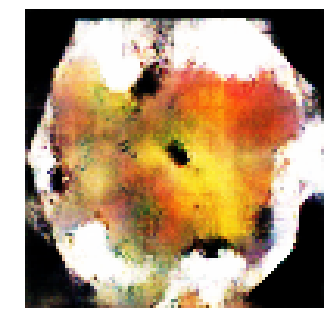


Epoch: 8620, D: -7.171, G: 3.748
Epoch: 8621, D: -6.495, G: 3.932
Epoch: 8622, D: -6.592, G: 4.018
Epoch: 8623, D: -6.17, G: 3.775
Epoch: 8624, D: -4.233, G: 4.08
Epoch: 8625, D: -5.602, G: 5.569
Epoch: 8626, D: -7.252, G: 3.925
Epoch: 8627, D: -5.718, G: 2.682
Epoch: 8628, D: -6.259, G: 5.146
Epoch: 8629, D: -6.638, G: 3.225
Epoch: 8630, D: -6.816, G: 3.737
Epoch: 8631, D: -6.163, G: 3.783
Epoch: 8632, D: -6.418, G: 1.103
Epoch: 8633, D: -7.501, G: 5.392
Epoch: 8634, D: -5.308, G: 4.523
Epoch: 8635, D: -5.68, G: 7.841
Epoch: 8636, D: -6.574, G: 7.269
Epoch: 8637, D: -7.006, G: 7.128
Epoch: 8638, D: -7.113, G: 4.869
Epoch: 8639, D: -6.901, G: 4.53


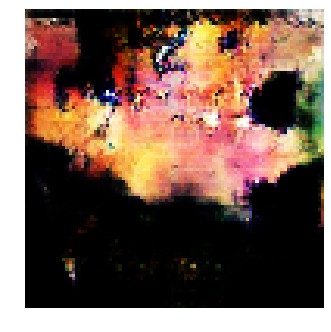


Epoch: 8640, D: -4.981, G: 6.567
Epoch: 8641, D: -5.309, G: 3.609
Epoch: 8642, D: -6.315, G: 2.33
Epoch: 8643, D: -6.71, G: 1.653
Epoch: 8644, D: -7.636, G: 4.594
Epoch: 8645, D: -6.768, G: 3.069
Epoch: 8646, D: -5.458, G: 5.876
Epoch: 8647, D: -6.826, G: 6.256
Epoch: 8648, D: -5.708, G: 4.543
Epoch: 8649, D: -6.851, G: 5.975
Epoch: 8650, D: -6.373, G: 2.96
Epoch: 8651, D: -6.637, G: 2.521
Epoch: 8652, D: -5.592, G: 3.239
Epoch: 8653, D: -6.184, G: 4.017
Epoch: 8654, D: -6.379, G: 5.132
Epoch: 8655, D: -5.904, G: 3.054
Epoch: 8656, D: -6.76, G: 4.899
Epoch: 8657, D: -6.926, G: 2.913
Epoch: 8658, D: -5.785, G: 0.8317
Epoch: 8659, D: -6.639, G: 2.761


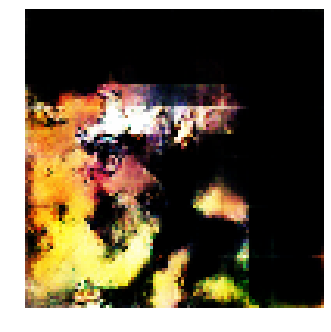


Epoch: 8660, D: -5.117, G: 2.979
Epoch: 8661, D: -6.74, G: 2.861
Epoch: 8662, D: -5.595, G: 0.795
Epoch: 8663, D: -5.908, G: 3.849
Epoch: 8664, D: -6.441, G: 7.294
Epoch: 8665, D: -6.592, G: 4.863
Epoch: 8666, D: -5.959, G: 3.404
Epoch: 8667, D: -5.478, G: 4.814
Epoch: 8668, D: -6.293, G: 4.062
Epoch: 8669, D: -4.775, G: 3.881
Epoch: 8670, D: -7.387, G: 5.021
Epoch: 8671, D: -6.05, G: 3.302
Epoch: 8672, D: -6.468, G: 5.09
Epoch: 8673, D: -6.285, G: 2.662
Epoch: 8674, D: -5.655, G: 1.276
Epoch: 8675, D: -5.789, G: 6.637
Epoch: 8676, D: -6.028, G: 0.9288
Epoch: 8677, D: -6.002, G: 4.642
Epoch: 8678, D: -5.145, G: 5.081
Epoch: 8679, D: -4.384, G: 3.684


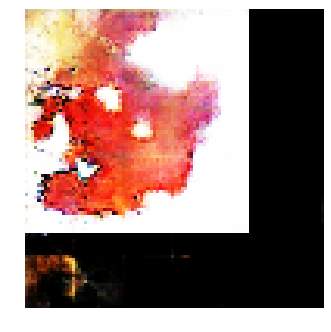


Epoch: 8680, D: -5.378, G: 5.498
Epoch: 8681, D: -6.492, G: 5.175
Epoch: 8682, D: -5.939, G: 5.653
Epoch: 8683, D: -6.773, G: 4.709
Epoch: 8684, D: -6.353, G: 4.609
Epoch: 8685, D: -6.16, G: 4.287
Epoch: 8686, D: -4.447, G: 3.69
Epoch: 8687, D: -6.104, G: 2.247
Epoch: 8688, D: -5.999, G: 5.764
Epoch: 8689, D: -6.056, G: 7.498
Epoch: 8690, D: -6.004, G: 3.41
Epoch: 8691, D: -6.08, G: 4.628
Epoch: 8692, D: -7.496, G: 2.762
Epoch: 8693, D: -6.874, G: 0.9977
Epoch: 8694, D: -6.387, G: 4.971
Epoch: 8695, D: -5.817, G: 2.752
Epoch: 8696, D: -5.65, G: 3.938
Epoch: 8697, D: -6.795, G: 4.113
Epoch: 8698, D: -7.321, G: 2.47
Epoch: 8699, D: -5.661, G: 4.644


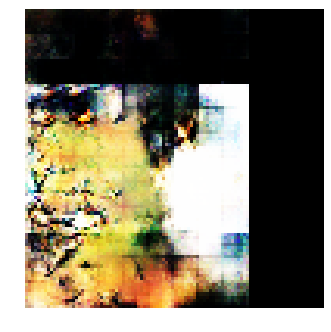


Epoch: 8700, D: -4.694, G: 3.315
Epoch: 8701, D: -5.57, G: 4.847
Epoch: 8702, D: -7.535, G: 3.234
Epoch: 8703, D: -6.458, G: 4.08
Epoch: 8704, D: -4.873, G: 5.497
Epoch: 8705, D: -5.218, G: 3.804
Epoch: 8706, D: -6.13, G: 4.488
Epoch: 8707, D: -6.166, G: 7.651
Epoch: 8708, D: -6.771, G: 4.389
Epoch: 8709, D: -4.551, G: 8.43
Epoch: 8710, D: -8.454, G: 4.472
Epoch: 8711, D: -4.849, G: 7.192
Epoch: 8712, D: -6.266, G: 5.778
Epoch: 8713, D: -5.986, G: 5.849
Epoch: 8714, D: -5.798, G: 3.133
Epoch: 8715, D: -6.013, G: 4.234
Epoch: 8716, D: -5.927, G: 4.85
Epoch: 8717, D: -6.655, G: 2.15
Epoch: 8718, D: -6.271, G: 4.004
Epoch: 8719, D: -5.536, G: 3.694


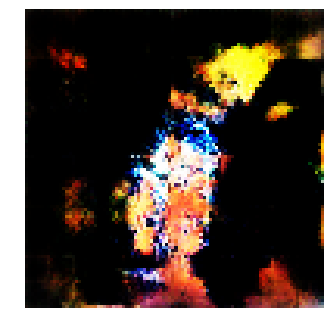


Epoch: 8720, D: -5.819, G: 5.68
Epoch: 8721, D: -6.856, G: 4.133
Epoch: 8722, D: -5.447, G: 4.804
Epoch: 8723, D: -5.461, G: 4.964
Epoch: 8724, D: -6.411, G: 3.737
Epoch: 8725, D: -6.35, G: 2.777
Epoch: 8726, D: -6.21, G: 4.994
Epoch: 8727, D: -5.981, G: 3.199
Epoch: 8728, D: -5.667, G: 5.733
Epoch: 8729, D: -6.07, G: 2.897
Epoch: 8730, D: -5.267, G: 6.729
Epoch: 8731, D: -6.488, G: 6.027
Epoch: 8732, D: -5.424, G: 2.484
Epoch: 8733, D: -5.514, G: 4.379
Epoch: 8734, D: -5.962, G: 3.753
Epoch: 8735, D: -7.488, G: 2.161
Epoch: 8736, D: -6.649, G: 4.474
Epoch: 8737, D: -5.232, G: 2.848
Epoch: 8738, D: -7.117, G: 5.426
Epoch: 8739, D: -6.028, G: 4.86


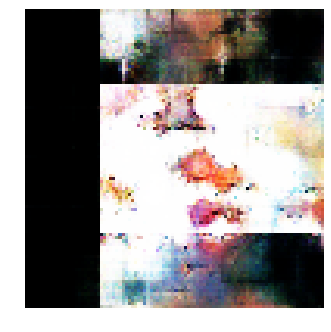


Epoch: 8740, D: -6.178, G: 5.49
Epoch: 8741, D: -5.861, G: 0.1408
Epoch: 8742, D: -6.27, G: 1.799
Epoch: 8743, D: -5.48, G: 4.635
Epoch: 8744, D: -6.223, G: 2.445
Epoch: 8745, D: -5.408, G: 4.663
Epoch: 8746, D: -5.79, G: 3.081
Epoch: 8747, D: -5.746, G: 5.003
Epoch: 8748, D: -5.536, G: 4.029
Epoch: 8749, D: -5.194, G: 7.175
Epoch: 8750, D: -6.203, G: 5.803
Epoch: 8751, D: -7.029, G: 3.588
Epoch: 8752, D: -4.749, G: 4.946
Epoch: 8753, D: -5.846, G: 2.016
Epoch: 8754, D: -5.573, G: 4.935
Epoch: 8755, D: -6.12, G: 7.646
Epoch: 8756, D: -6.632, G: 5.706
Epoch: 8757, D: -6.495, G: 3.765
Epoch: 8758, D: -5.374, G: 5.088
Epoch: 8759, D: -7.166, G: 2.123


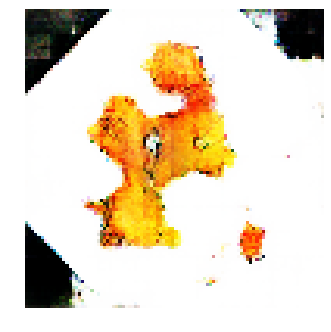


Epoch: 8760, D: -5.631, G: 3.417
Epoch: 8761, D: -6.361, G: 4.043
Epoch: 8762, D: -5.947, G: 8.114
Epoch: 8763, D: -4.327, G: 5.858
Epoch: 8764, D: -7.258, G: 7.392
Epoch: 8765, D: -6.199, G: 2.481
Epoch: 8766, D: -4.977, G: 4.664
Epoch: 8767, D: -6.592, G: 4.896
Epoch: 8768, D: -6.391, G: 5.381
Epoch: 8769, D: -6.427, G: 3.622
Epoch: 8770, D: -5.564, G: 3.795
Epoch: 8771, D: -5.745, G: 4.203
Epoch: 8772, D: -6.274, G: 5.429
Epoch: 8773, D: -6.375, G: 3.565
Epoch: 8774, D: -6.278, G: 5.056
Epoch: 8775, D: -7.288, G: 6.567
Epoch: 8776, D: -6.557, G: 2.855
Epoch: 8777, D: -7.724, G: 5.705
Epoch: 8778, D: -6.089, G: 2.505
Epoch: 8779, D: -5.668, G: 3.086


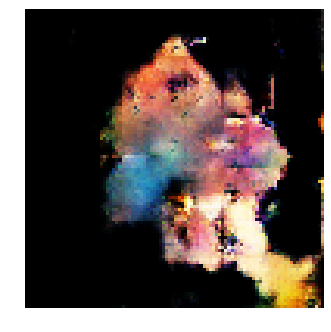


Epoch: 8780, D: -6.124, G: 5.108
Epoch: 8781, D: -5.264, G: 3.669
Epoch: 8782, D: -6.778, G: 3.415
Epoch: 8783, D: -7.419, G: 4.116
Epoch: 8784, D: -5.706, G: 4.017
Epoch: 8785, D: -5.525, G: 3.183
Epoch: 8786, D: -5.092, G: 5.652
Epoch: 8787, D: -7.172, G: 5.735
Epoch: 8788, D: -5.921, G: 5.24
Epoch: 8789, D: -6.802, G: 3.135
Epoch: 8790, D: -5.6, G: 2.487
Epoch: 8791, D: -6.385, G: 4.426
Epoch: 8792, D: -4.905, G: 3.636
Epoch: 8793, D: -6.393, G: 3.848
Epoch: 8794, D: -6.649, G: 4.864
Epoch: 8795, D: -6.426, G: 3.83
Epoch: 8796, D: -6.27, G: 5.613
Epoch: 8797, D: -5.789, G: 1.447
Epoch: 8798, D: -6.57, G: 6.214
Epoch: 8799, D: -6.692, G: 2.995


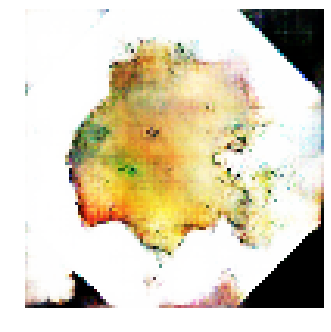


Epoch: 8800, D: -6.93, G: 3.09
Epoch: 8801, D: -5.906, G: 3.143
Epoch: 8802, D: -6.311, G: 6.133
Epoch: 8803, D: -5.998, G: 4.774
Epoch: 8804, D: -5.91, G: 6.6
Epoch: 8805, D: -6.909, G: 1.164
Epoch: 8806, D: -6.461, G: 3.98
Epoch: 8807, D: -6.345, G: 3.383
Epoch: 8808, D: -5.336, G: 6.313
Epoch: 8809, D: -5.848, G: 4.824
Epoch: 8810, D: -5.024, G: 2.983
Epoch: 8811, D: -6.046, G: 2.664
Epoch: 8812, D: -5.872, G: 5.71
Epoch: 8813, D: -6.874, G: 4.126
Epoch: 8814, D: -4.886, G: 2.216
Epoch: 8815, D: -4.362, G: 8.063
Epoch: 8816, D: -6.579, G: 5.145
Epoch: 8817, D: -5.98, G: 1.895
Epoch: 8818, D: -7.646, G: 3.878
Epoch: 8819, D: -6.843, G: 5.65


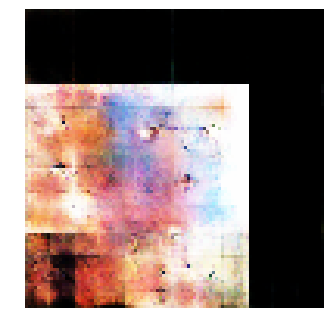


Epoch: 8820, D: -5.557, G: 3.485
Epoch: 8821, D: -5.723, G: 4.452
Epoch: 8822, D: -5.991, G: 2.628
Epoch: 8823, D: -4.715, G: 3.059
Epoch: 8824, D: -7.54, G: 3.853
Epoch: 8825, D: -6.179, G: 4.741
Epoch: 8826, D: -6.03, G: 4.66
Epoch: 8827, D: -6.485, G: 2.133
Epoch: 8828, D: -5.564, G: 4.454
Epoch: 8829, D: -6.08, G: 5.183
Epoch: 8830, D: -5.393, G: 5.627
Epoch: 8831, D: -5.559, G: 3.84
Epoch: 8832, D: -4.581, G: 2.946
Epoch: 8833, D: -6.266, G: 4.24
Epoch: 8834, D: -6.375, G: 4.695
Epoch: 8835, D: -6.948, G: 5.153
Epoch: 8836, D: -8.431, G: 3.366
Epoch: 8837, D: -7.871, G: 3.647
Epoch: 8838, D: -5.296, G: 1.527
Epoch: 8839, D: -7.321, G: 2.6


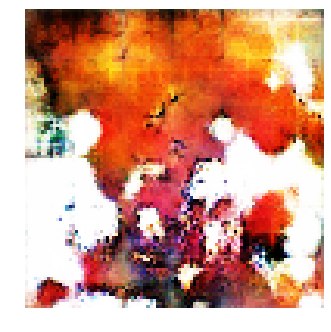


Epoch: 8840, D: -6.102, G: 7.041
Epoch: 8841, D: -7.012, G: 4.062
Epoch: 8842, D: -6.186, G: 3.9
Epoch: 8843, D: -5.714, G: 5.146
Epoch: 8844, D: -5.314, G: 4.234
Epoch: 8845, D: -7.52, G: 4.712
Epoch: 8846, D: -5.761, G: 2.631
Epoch: 8847, D: -6.664, G: 5.396
Epoch: 8848, D: -5.922, G: 2.762
Epoch: 8849, D: -7.103, G: 5.977
Epoch: 8850, D: -6.809, G: 4.354
Epoch: 8851, D: -6.389, G: 3.966
Epoch: 8852, D: -6.015, G: 6.226
Epoch: 8853, D: -6.833, G: 5.423
Epoch: 8854, D: -7.238, G: 6.798
Epoch: 8855, D: -7.254, G: 5.268
Epoch: 8856, D: -5.174, G: 3.197
Epoch: 8857, D: -6.116, G: 5.386
Epoch: 8858, D: -6.653, G: 4.73
Epoch: 8859, D: -6.911, G: 5.302


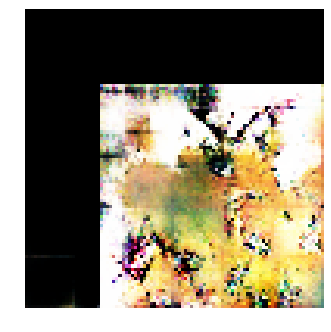


Epoch: 8860, D: -7.67, G: 2.638
Epoch: 8861, D: -5.507, G: 2.607
Epoch: 8862, D: -5.049, G: 4.354
Epoch: 8863, D: -5.255, G: 6.789
Epoch: 8864, D: -5.852, G: 4.959
Epoch: 8865, D: -6.82, G: 4.839
Epoch: 8866, D: -7.448, G: 1.165
Epoch: 8867, D: -5.358, G: 5.021
Epoch: 8868, D: -7.029, G: 4.692
Epoch: 8869, D: -5.087, G: 3.423
Epoch: 8870, D: -7.127, G: 5.19
Epoch: 8871, D: -6.873, G: 4.533
Epoch: 8872, D: -6.981, G: 3.724
Epoch: 8873, D: -6.574, G: 3.141
Epoch: 8874, D: -6.314, G: 5.545
Epoch: 8875, D: -6.6, G: 3.499
Epoch: 8876, D: -7.44, G: 5.704
Epoch: 8877, D: -4.27, G: 3.658
Epoch: 8878, D: -6.062, G: 4.296
Epoch: 8879, D: -6.847, G: 4.207


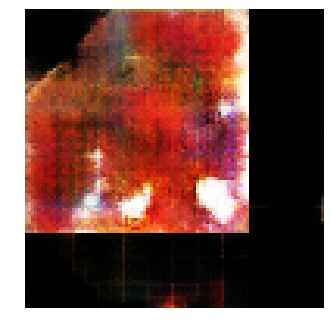


Epoch: 8880, D: -5.659, G: 3.607
Epoch: 8881, D: -6.508, G: 3.939
Epoch: 8882, D: -5.827, G: 2.777
Epoch: 8883, D: -5.344, G: 2.97
Epoch: 8884, D: -6.754, G: 5.185
Epoch: 8885, D: -6.063, G: 4.004
Epoch: 8886, D: -5.237, G: 3.973
Epoch: 8887, D: -6.74, G: 2.831
Epoch: 8888, D: -5.572, G: 1.638
Epoch: 8889, D: -7.129, G: 5.18
Epoch: 8890, D: -5.709, G: 3.715
Epoch: 8891, D: -6.865, G: 6.012
Epoch: 8892, D: -5.813, G: 4.325
Epoch: 8893, D: -6.193, G: 3.687
Epoch: 8894, D: -7.267, G: 3.937
Epoch: 8895, D: -6.512, G: 4.407
Epoch: 8896, D: -6.573, G: 5.884
Epoch: 8897, D: -5.183, G: 2.684
Epoch: 8898, D: -5.883, G: 4.321
Epoch: 8899, D: -6.151, G: 3.158


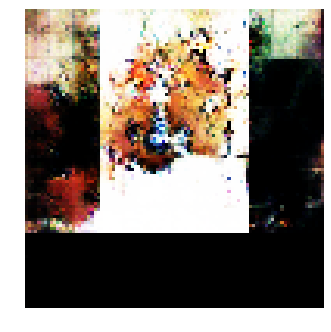


Epoch: 8900, D: -5.186, G: 5.035
Epoch: 8901, D: -6.021, G: 5.306
Epoch: 8902, D: -5.25, G: 3.089
Epoch: 8903, D: -6.529, G: 4.997
Epoch: 8904, D: -7.021, G: 4.905
Epoch: 8905, D: -5.073, G: 2.139
Epoch: 8906, D: -6.687, G: 3.876
Epoch: 8907, D: -6.453, G: 7.27
Epoch: 8908, D: -6.285, G: 2.884
Epoch: 8909, D: -5.514, G: 3.934
Epoch: 8910, D: -6.127, G: 1.554
Epoch: 8911, D: -6.431, G: 1.936
Epoch: 8912, D: -5.544, G: 3.633
Epoch: 8913, D: -6.671, G: 6.959
Epoch: 8914, D: -5.354, G: 3.876
Epoch: 8915, D: -6.29, G: 6.411
Epoch: 8916, D: -6.41, G: 6.012
Epoch: 8917, D: -7.01, G: 5.185
Epoch: 8918, D: -7.431, G: 0.2567
Epoch: 8919, D: -6.239, G: 6.28


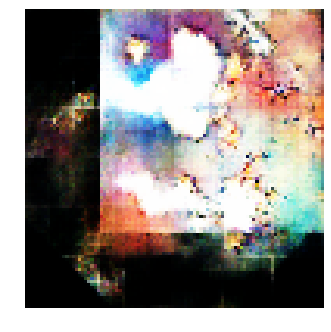


Epoch: 8920, D: -6.981, G: 4.053
Epoch: 8921, D: -7.056, G: 3.948
Epoch: 8922, D: -4.863, G: 2.233
Epoch: 8923, D: -5.956, G: 4.707
Epoch: 8924, D: -5.865, G: 6.031
Epoch: 8925, D: -6.225, G: 4.391
Epoch: 8926, D: -4.941, G: 3.76
Epoch: 8927, D: -8.062, G: 3.549
Epoch: 8928, D: -6.317, G: 3.701
Epoch: 8929, D: -5.893, G: 5.176
Epoch: 8930, D: -6.092, G: 4.255
Epoch: 8931, D: -6.49, G: 2.592
Epoch: 8932, D: -6.348, G: 3.779
Epoch: 8933, D: -6.523, G: 5.117
Epoch: 8934, D: -5.905, G: 3.665
Epoch: 8935, D: -7.693, G: 3.297
Epoch: 8936, D: -6.482, G: 4.332
Epoch: 8937, D: -4.453, G: 2.342
Epoch: 8938, D: -6.959, G: 4.185
Epoch: 8939, D: -5.776, G: 4.084


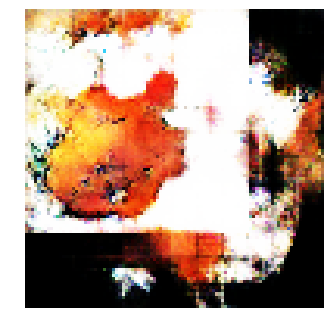


Epoch: 8940, D: -6.479, G: 7.681
Epoch: 8941, D: -5.794, G: 5.248
Epoch: 8942, D: -4.357, G: 5.284
Epoch: 8943, D: -7.329, G: 7.017
Epoch: 8944, D: -6.53, G: 4.209
Epoch: 8945, D: -6.088, G: 4.293
Epoch: 8946, D: -5.88, G: 2.734
Epoch: 8947, D: -6.239, G: 4.345
Epoch: 8948, D: -6.41, G: 5.706
Epoch: 8949, D: -5.997, G: 3.173
Epoch: 8950, D: -6.848, G: 2.257
Epoch: 8951, D: -5.56, G: 2.085
Epoch: 8952, D: -5.36, G: 7.582
Epoch: 8953, D: -4.888, G: 5.459
Epoch: 8954, D: -8.819, G: 4.602
Epoch: 8955, D: -5.857, G: 1.76
Epoch: 8956, D: -5.344, G: 0.8118
Epoch: 8957, D: -6.049, G: 4.665
Epoch: 8958, D: -5.106, G: 4.074
Epoch: 8959, D: -6.018, G: 4.69


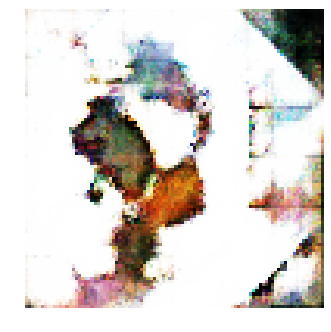


Epoch: 8960, D: -6.838, G: 4.458
Epoch: 8961, D: -6.938, G: 4.784
Epoch: 8962, D: -6.443, G: 2.611
Epoch: 8963, D: -5.294, G: 2.992
Epoch: 8964, D: -6.209, G: 5.147
Epoch: 8965, D: -6.535, G: 3.171
Epoch: 8966, D: -3.991, G: 6.029
Epoch: 8967, D: -6.015, G: 5.476
Epoch: 8968, D: -4.951, G: 5.585
Epoch: 8969, D: -7.169, G: 5.927
Epoch: 8970, D: -6.455, G: 4.141
Epoch: 8971, D: -6.308, G: 2.985
Epoch: 8972, D: -5.808, G: 6.27
Epoch: 8973, D: -6.211, G: 3.654
Epoch: 8974, D: -6.331, G: 3.102
Epoch: 8975, D: -6.749, G: 1.731
Epoch: 8976, D: -6.451, G: 2.983
Epoch: 8977, D: -6.183, G: 3.653
Epoch: 8978, D: -5.929, G: 3.362
Epoch: 8979, D: -7.529, G: 5.513


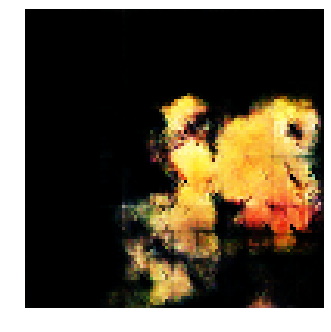


Epoch: 8980, D: -4.655, G: 1.722
Epoch: 8981, D: -6.165, G: 4.452
Epoch: 8982, D: -6.405, G: 6.204
Epoch: 8983, D: -7.34, G: 1.933
Epoch: 8984, D: -7.327, G: 2.474
Epoch: 8985, D: -6.791, G: 0.7792
Epoch: 8986, D: -4.603, G: 6.581
Epoch: 8987, D: -6.323, G: 2.746
Epoch: 8988, D: -8.103, G: 3.045
Epoch: 8989, D: -6.903, G: 3.045
Epoch: 8990, D: -7.019, G: 3.538
Epoch: 8991, D: -6.755, G: 4.665
Epoch: 8992, D: -7.059, G: 5.707
Epoch: 8993, D: -5.8, G: 6.989
Epoch: 8994, D: -6.352, G: 4.805
Epoch: 8995, D: -6.565, G: 3.705
Epoch: 8996, D: -7.095, G: 4.813
Epoch: 8997, D: -6.317, G: 4.48
Epoch: 8998, D: -6.455, G: 5.185
Epoch: 8999, D: -4.73, G: 5.521


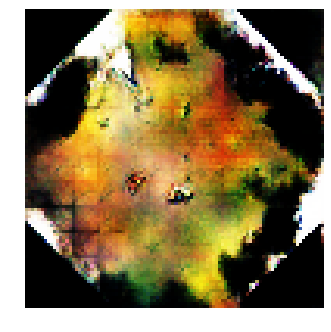


Epoch: 9000, D: -7.074, G: 3.218
Epoch: 9001, D: -4.797, G: 2.593
Epoch: 9002, D: -7.326, G: 3.448
Epoch: 9003, D: -6.401, G: 2.806
Epoch: 9004, D: -5.723, G: 2.095
Epoch: 9005, D: -6.748, G: 5.078
Epoch: 9006, D: -6.47, G: 4.036
Epoch: 9007, D: -4.64, G: 4.18
Epoch: 9008, D: -6.155, G: 3.293
Epoch: 9009, D: -5.874, G: 0.7699
Epoch: 9010, D: -6.842, G: 3.831
Epoch: 9011, D: -6.928, G: 4.709
Epoch: 9012, D: -6.155, G: 2.488
Epoch: 9013, D: -5.593, G: 5.33
Epoch: 9014, D: -5.303, G: 6.642
Epoch: 9015, D: -4.802, G: 5.848
Epoch: 9016, D: -5.634, G: 4.738
Epoch: 9017, D: -4.936, G: 5.804
Epoch: 9018, D: -7.099, G: 4.635
Epoch: 9019, D: -5.584, G: 1.098


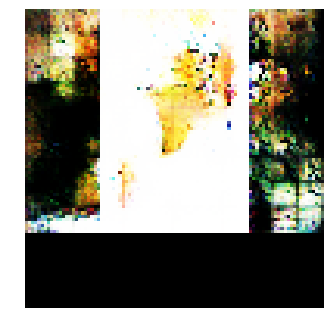


Epoch: 9020, D: -6.925, G: 3.346
Epoch: 9021, D: -6.287, G: 2.196
Epoch: 9022, D: -5.815, G: 1.492
Epoch: 9023, D: -5.449, G: 2.948
Epoch: 9024, D: -6.211, G: 3.075
Epoch: 9025, D: -6.615, G: 5.359
Epoch: 9026, D: -7.314, G: 2.84
Epoch: 9027, D: -5.005, G: 3.797
Epoch: 9028, D: -6.041, G: 5.223
Epoch: 9029, D: -6.86, G: 2.711
Epoch: 9030, D: -5.844, G: 2.455
Epoch: 9031, D: -5.941, G: 5.468
Epoch: 9032, D: -6.408, G: 3.592
Epoch: 9033, D: -5.966, G: 3.077
Epoch: 9034, D: -5.98, G: 2.794
Epoch: 9035, D: -6.347, G: 1.963
Epoch: 9036, D: -7.384, G: 6.157
Epoch: 9037, D: -6.363, G: 6.885
Epoch: 9038, D: -5.494, G: 1.791
Epoch: 9039, D: -5.35, G: 2.94


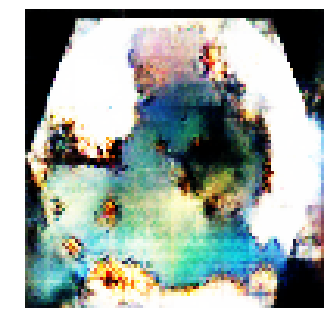


Epoch: 9040, D: -6.847, G: 2.594
Epoch: 9041, D: -5.109, G: 5.105
Epoch: 9042, D: -6.31, G: 1.264
Epoch: 9043, D: -6.414, G: 2.459
Epoch: 9044, D: -6.005, G: 5.46
Epoch: 9045, D: -5.124, G: 5.159
Epoch: 9046, D: -6.734, G: 4.956
Epoch: 9047, D: -5.044, G: 3.535
Epoch: 9048, D: -5.44, G: 3.827
Epoch: 9049, D: -5.476, G: 6.082
Epoch: 9050, D: -7.348, G: 1.836
Epoch: 9051, D: -5.877, G: 3.323
Epoch: 9052, D: -5.893, G: 5.422
Epoch: 9053, D: -5.798, G: 5.782
Epoch: 9054, D: -5.793, G: 2.567
Epoch: 9055, D: -6.509, G: 5.927
Epoch: 9056, D: -5.612, G: 3.499
Epoch: 9057, D: -6.479, G: 4.147
Epoch: 9058, D: -5.562, G: 5.028
Epoch: 9059, D: -6.017, G: 7.145


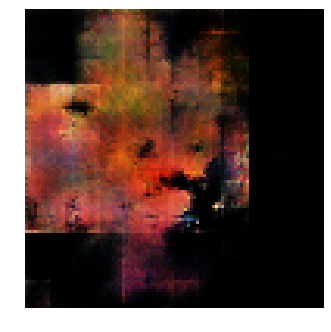


Epoch: 9060, D: -6.11, G: 5.616
Epoch: 9061, D: -5.315, G: 4.881
Epoch: 9062, D: -6.194, G: 3.012
Epoch: 9063, D: -6.283, G: 3.586
Epoch: 9064, D: -5.135, G: 5.612
Epoch: 9065, D: -5.834, G: 4.512
Epoch: 9066, D: -7.735, G: 3.309
Epoch: 9067, D: -7.537, G: 3.879
Epoch: 9068, D: -7.788, G: 4.811
Epoch: 9069, D: -6.352, G: 4.769
Epoch: 9070, D: -5.234, G: 4.075
Epoch: 9071, D: -5.216, G: 4.41
Epoch: 9072, D: -6.163, G: 3.813
Epoch: 9073, D: -5.111, G: 8.747
Epoch: 9074, D: -6.902, G: 4.119
Epoch: 9075, D: -6.591, G: 3.805
Epoch: 9076, D: -6.402, G: 4.802
Epoch: 9077, D: -6.048, G: 2.348
Epoch: 9078, D: -5.901, G: 3.979
Epoch: 9079, D: -6.632, G: 5.069


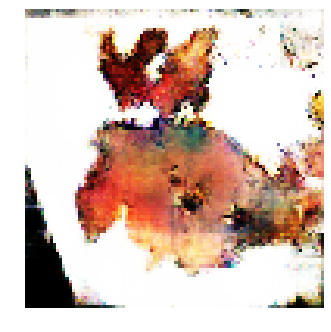


Epoch: 9080, D: -8.131, G: 1.964
Epoch: 9081, D: -5.982, G: 3.469
Epoch: 9082, D: -5.109, G: 4.07
Epoch: 9083, D: -5.972, G: 4.722
Epoch: 9084, D: -6.361, G: 1.945
Epoch: 9085, D: -6.577, G: 4.137
Epoch: 9086, D: -6.444, G: 5.608
Epoch: 9087, D: -6.023, G: 4.121
Epoch: 9088, D: -6.69, G: 5.835
Epoch: 9089, D: -5.914, G: 3.957
Epoch: 9090, D: -6.432, G: 3.431
Epoch: 9091, D: -7.248, G: 5.753
Epoch: 9092, D: -7.167, G: 2.048
Epoch: 9093, D: -6.224, G: 2.687
Epoch: 9094, D: -6.62, G: 4.184
Epoch: 9095, D: -6.388, G: 3.353
Epoch: 9096, D: -7.551, G: 3.209
Epoch: 9097, D: -6.557, G: 0.967
Epoch: 9098, D: -6.021, G: 3.451
Epoch: 9099, D: -6.75, G: 5.555


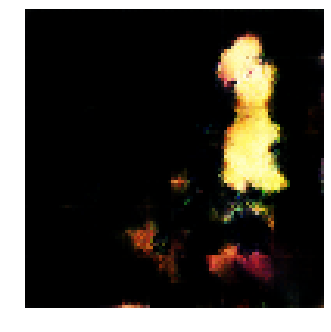


Epoch: 9100, D: -7.109, G: 2.465
Epoch: 9101, D: -6.455, G: 2.625
Epoch: 9102, D: -5.842, G: -0.2912
Epoch: 9103, D: -6.412, G: 4.391
Epoch: 9104, D: -7.16, G: 4.238
Epoch: 9105, D: -4.516, G: 3.651
Epoch: 9106, D: -6.291, G: 2.503
Epoch: 9107, D: -5.978, G: 5.174
Epoch: 9108, D: -6.379, G: 6.984
Epoch: 9109, D: -6.117, G: 3.173
Epoch: 9110, D: -5.358, G: 4.469
Epoch: 9111, D: -6.62, G: 4.18
Epoch: 9112, D: -5.907, G: 5.045
Epoch: 9113, D: -5.872, G: 4.088
Epoch: 9114, D: -5.756, G: 2.321
Epoch: 9115, D: -6.978, G: 5.542
Epoch: 9116, D: -5.786, G: 3.947
Epoch: 9117, D: -5.273, G: 4.809
Epoch: 9118, D: -7.401, G: 2.908
Epoch: 9119, D: -4.975, G: 2.771


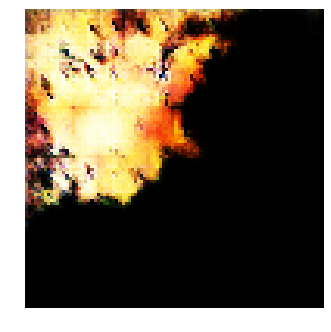


Epoch: 9120, D: -4.679, G: 3.406
Epoch: 9121, D: -6.055, G: 5.531
Epoch: 9122, D: -6.905, G: 6.571
Epoch: 9123, D: -7.06, G: 3.707
Epoch: 9124, D: -6.446, G: 4.785
Epoch: 9125, D: -8.024, G: 5.596
Epoch: 9126, D: -7.965, G: 5.01
Epoch: 9127, D: -6.488, G: 5.581
Epoch: 9128, D: -5.212, G: 6.101
Epoch: 9129, D: -5.407, G: 6.512
Epoch: 9130, D: -5.555, G: 3.107
Epoch: 9131, D: -6.131, G: 4.437
Epoch: 9132, D: -5.753, G: 3.05
Epoch: 9133, D: -6.86, G: 6.48
Epoch: 9134, D: -6.858, G: 1.403
Epoch: 9135, D: -5.972, G: 6.923
Epoch: 9136, D: -5.061, G: 5.326
Epoch: 9137, D: -6.347, G: 2.475
Epoch: 9138, D: -6.558, G: 4.035
Epoch: 9139, D: -6.901, G: 4.345


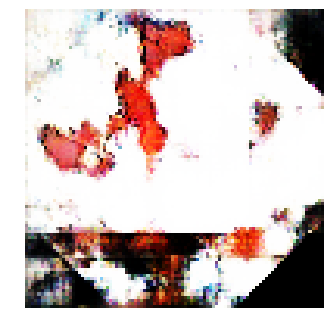


Epoch: 9140, D: -6.106, G: 1.386
Epoch: 9141, D: -5.66, G: 3.861
Epoch: 9142, D: -8.023, G: 5.19
Epoch: 9143, D: -5.44, G: 3.923
Epoch: 9144, D: -5.821, G: 3.695
Epoch: 9145, D: -7.046, G: 5.208
Epoch: 9146, D: -6.605, G: 2.845
Epoch: 9147, D: -5.562, G: 4.891
Epoch: 9148, D: -6.499, G: 5.107
Epoch: 9149, D: -7.648, G: 4.676
Epoch: 9150, D: -5.372, G: 5.282
Epoch: 9151, D: -7.553, G: 4.336
Epoch: 9152, D: -7.267, G: 5.073
Epoch: 9153, D: -5.177, G: 2.841
Epoch: 9154, D: -6.349, G: 6.753
Epoch: 9155, D: -6.431, G: 3.36
Epoch: 9156, D: -7.246, G: 6.12
Epoch: 9157, D: -7.554, G: 3.372
Epoch: 9158, D: -5.933, G: 1.701
Epoch: 9159, D: -7.337, G: 3.837


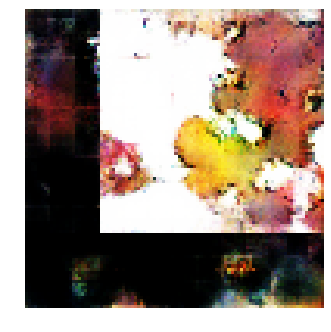


Epoch: 9160, D: -6.027, G: 1.147
Epoch: 9161, D: -7.145, G: 3.973
Epoch: 9162, D: -6.011, G: 4.25
Epoch: 9163, D: -6.018, G: 3.368
Epoch: 9164, D: -5.431, G: 3.6
Epoch: 9165, D: -4.344, G: 4.13
Epoch: 9166, D: -5.485, G: 3.848
Epoch: 9167, D: -6.925, G: 4.099
Epoch: 9168, D: -5.61, G: 3.139
Epoch: 9169, D: -6.298, G: 3.357
Epoch: 9170, D: -6.071, G: 4.824
Epoch: 9171, D: -6.636, G: 2.409
Epoch: 9172, D: -7.204, G: 3.541
Epoch: 9173, D: -5.335, G: 3.452
Epoch: 9174, D: -5.483, G: 5.043
Epoch: 9175, D: -7.181, G: 4.298
Epoch: 9176, D: -5.65, G: 5.013
Epoch: 9177, D: -7.02, G: 2.387
Epoch: 9178, D: -5.764, G: 3.492
Epoch: 9179, D: -6.153, G: 3.074


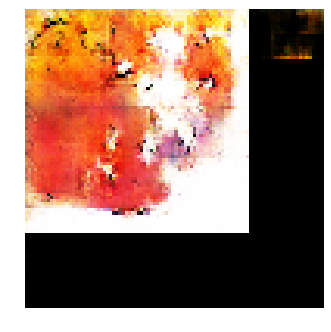


Epoch: 9180, D: -7.23, G: 3.601
Epoch: 9181, D: -7.233, G: 3.723
Epoch: 9182, D: -5.494, G: 3.605
Epoch: 9183, D: -7.396, G: 4.033
Epoch: 9184, D: -6.951, G: 4.011
Epoch: 9185, D: -6.756, G: 5.561
Epoch: 9186, D: -5.725, G: 3.017
Epoch: 9187, D: -6.381, G: 4.227
Epoch: 9188, D: -6.343, G: 4.45
Epoch: 9189, D: -6.382, G: 3.865
Epoch: 9190, D: -5.685, G: 4.746
Epoch: 9191, D: -5.817, G: 4.27
Epoch: 9192, D: -4.505, G: 2.212
Epoch: 9193, D: -5.768, G: 2.831
Epoch: 9194, D: -6.852, G: 5.447
Epoch: 9195, D: -6.49, G: 5.978
Epoch: 9196, D: -7.183, G: 3.689
Epoch: 9197, D: -6.876, G: 2.958
Epoch: 9198, D: -1.215, G: 3.147
Epoch: 9199, D: -6.744, G: 3.751


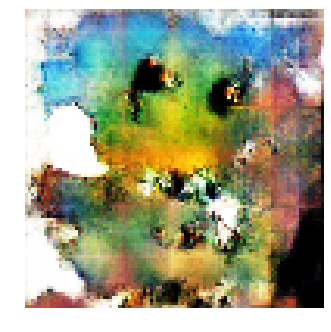


Epoch: 9200, D: -5.362, G: 5.893
Epoch: 9201, D: -6.438, G: 8.26
Epoch: 9202, D: -4.773, G: 3.836
Epoch: 9203, D: -5.805, G: 6.151
Epoch: 9204, D: -4.738, G: 4.217
Epoch: 9205, D: -5.251, G: 3.926
Epoch: 9206, D: -6.157, G: 5.624
Epoch: 9207, D: -6.693, G: 3.093
Epoch: 9208, D: -5.911, G: 5.776
Epoch: 9209, D: -7.065, G: 2.378
Epoch: 9210, D: -5.155, G: 3.697
Epoch: 9211, D: -6.429, G: 1.954
Epoch: 9212, D: -6.692, G: 4.036
Epoch: 9213, D: -1.988, G: 0.9112
Epoch: 9214, D: -6.309, G: 3.282
Epoch: 9215, D: -3.547, G: 4.753
Epoch: 9216, D: -6.88, G: 4.967
Epoch: 9217, D: -5.239, G: 3.993
Epoch: 9218, D: -5.944, G: 6.389
Epoch: 9219, D: -6.1, G: 2.703


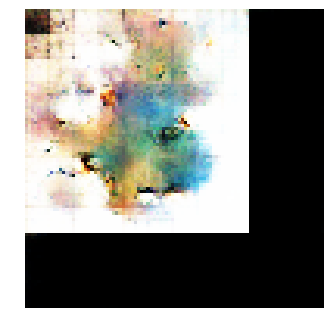


Epoch: 9220, D: -5.428, G: 4.538
Epoch: 9221, D: -6.642, G: 4.174
Epoch: 9222, D: -5.351, G: 4.849
Epoch: 9223, D: -5.385, G: 4.531
Epoch: 9224, D: -6.303, G: 5.547
Epoch: 9225, D: -6.375, G: 2.963
Epoch: 9226, D: 6.714, G: 5.29
Epoch: 9227, D: -5.905, G: 2.732
Epoch: 9228, D: -5.905, G: 3.381
Epoch: 9229, D: -6.842, G: 4.16
Epoch: 9230, D: -6.122, G: 6.276
Epoch: 9231, D: -7.603, G: 3.664
Epoch: 9232, D: -5.707, G: 5.715
Epoch: 9233, D: -4.985, G: 6.186
Epoch: 9234, D: -6.373, G: 4.718
Epoch: 9235, D: -6.617, G: 4.332
Epoch: 9236, D: -5.613, G: 4.922
Epoch: 9237, D: -5.931, G: 3.905
Epoch: 9238, D: -5.704, G: 4.549
Epoch: 9239, D: -5.276, G: 4.752


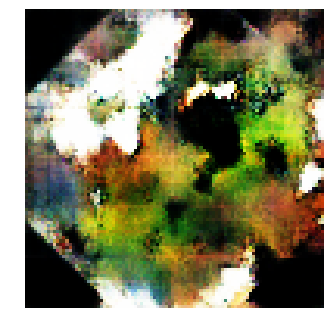


Epoch: 9240, D: -6.292, G: 3.996
Epoch: 9241, D: -5.324, G: 1.726
Epoch: 9242, D: -5.657, G: 4.335
Epoch: 9243, D: -5.918, G: 2.107
Epoch: 9244, D: -6.41, G: 4.265
Epoch: 9245, D: -2.852, G: 3.536
Epoch: 9246, D: -4.446, G: 4.017
Epoch: 9247, D: -5.452, G: 4.949
Epoch: 9248, D: -6.71, G: 1.982
Epoch: 9249, D: -5.535, G: 2.819
Epoch: 9250, D: -6.143, G: 2.879
Epoch: 9251, D: -4.652, G: 4.091
Epoch: 9252, D: -7.451, G: 4.695
Epoch: 9253, D: -6.931, G: 5.638
Epoch: 9254, D: -5.134, G: 8.173
Epoch: 9255, D: -6.549, G: 2.224
Epoch: 9256, D: -6.201, G: 2.898
Epoch: 9257, D: -5.908, G: 4.029
Epoch: 9258, D: -6.355, G: 2.856
Epoch: 9259, D: -3.311, G: 5.135


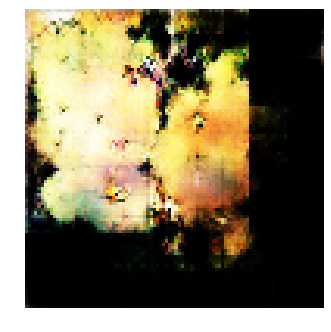


Epoch: 9260, D: -4.191, G: 5.852
Epoch: 9261, D: -5.924, G: 5.349
Epoch: 9262, D: -5.009, G: 3.847
Epoch: 9263, D: -6.447, G: 3.611
Epoch: 9264, D: -6.635, G: 0.02871
Epoch: 9265, D: -6.528, G: 3.949
Epoch: 9266, D: -5.084, G: 1.983
Epoch: 9267, D: -6.219, G: 5.295
Epoch: 9268, D: -7.052, G: 2.667
Epoch: 9269, D: -5.283, G: 3.166
Epoch: 9270, D: -4.745, G: 3.404
Epoch: 9271, D: -5.882, G: 3.616
Epoch: 9272, D: -7.057, G: 2.691
Epoch: 9273, D: -5.98, G: 4.441
Epoch: 9274, D: -5.75, G: 4.557
Epoch: 9275, D: -5.55, G: 2.742
Epoch: 9276, D: -6.018, G: 5.79
Epoch: 9277, D: -6.12, G: 5.748
Epoch: 9278, D: -6.275, G: 3.947
Epoch: 9279, D: -5.753, G: 4.316


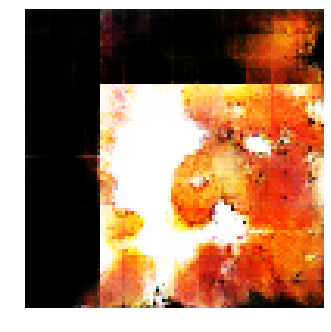


Epoch: 9280, D: -7.117, G: 5.131
Epoch: 9281, D: -5.733, G: 2.822
Epoch: 9282, D: -7.035, G: 4.468
Epoch: 9283, D: -5.972, G: 1.156
Epoch: 9284, D: -6.012, G: 3.21
Epoch: 9285, D: -5.459, G: 3.791
Epoch: 9286, D: -6.47, G: 3.878
Epoch: 9287, D: -6.234, G: 3.227
Epoch: 9288, D: -5.731, G: 5.89
Epoch: 9289, D: -7.459, G: 3.276
Epoch: 9290, D: -6.041, G: 2.736
Epoch: 9291, D: -4.016, G: 2.816
Epoch: 9292, D: -6.977, G: 5.163
Epoch: 9293, D: -6.861, G: 4.424
Epoch: 9294, D: -5.33, G: 6.32
Epoch: 9295, D: -4.753, G: 6.243
Epoch: 9296, D: -6.138, G: 4.478
Epoch: 9297, D: -5.963, G: 3.593
Epoch: 9298, D: -6.023, G: 3.928
Epoch: 9299, D: -7.256, G: 6.98


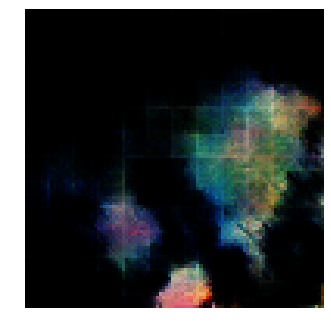


Epoch: 9300, D: -5.938, G: 2.169
Epoch: 9301, D: -6.383, G: 6.193
Epoch: 9302, D: -6.229, G: 3.33
Epoch: 9303, D: -5.757, G: 4.452
Epoch: 9304, D: -6.93, G: 5.899
Epoch: 9305, D: -6.662, G: 2.364
Epoch: 9306, D: -6.178, G: 3.51
Epoch: 9307, D: -5.964, G: 2.005
Epoch: 9308, D: -6.19, G: 3.823
Epoch: 9309, D: -3.337, G: 3.25
Epoch: 9310, D: -7.693, G: 5.267
Epoch: 9311, D: -1.245, G: 4.03
Epoch: 9312, D: -4.097, G: 2.22
Epoch: 9313, D: -5.15, G: 3.257
Epoch: 9314, D: -5.733, G: 4.395
Epoch: 9315, D: -6.388, G: 1.034
Epoch: 9316, D: -5.529, G: 4.103
Epoch: 9317, D: -5.47, G: 6.284
Epoch: 9318, D: -4.28, G: 7.276
Epoch: 9319, D: -4.62, G: 5.308


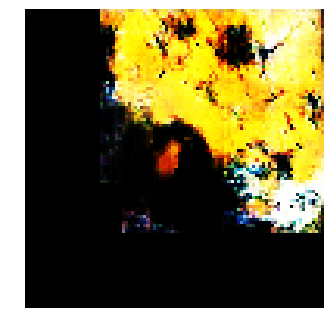


Epoch: 9320, D: -6.548, G: 3.641
Epoch: 9321, D: -6.941, G: 3.791
Epoch: 9322, D: -5.388, G: 4.761
Epoch: 9323, D: -5.601, G: 7.589
Epoch: 9324, D: -5.427, G: 5.301
Epoch: 9325, D: -6.136, G: 3.313
Epoch: 9326, D: -6.544, G: 3.111
Epoch: 9327, D: -6.646, G: 5.714
Epoch: 9328, D: -6.752, G: 2.894
Epoch: 9329, D: -6.291, G: 4.118
Epoch: 9330, D: -5.38, G: 4.344
Epoch: 9331, D: -6.677, G: 4.154
Epoch: 9332, D: -6.095, G: 3.921
Epoch: 9333, D: -6.257, G: 5.494
Epoch: 9334, D: -5.271, G: 3.543
Epoch: 9335, D: -7.691, G: 4.134
Epoch: 9336, D: -6.063, G: 4.943
Epoch: 9337, D: -5.175, G: 3.435
Epoch: 9338, D: -5.883, G: 2.389
Epoch: 9339, D: -5.185, G: 1.783


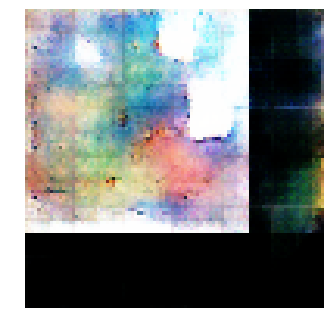


Epoch: 9340, D: -5.188, G: 3.933
Epoch: 9341, D: -4.794, G: 5.974
Epoch: 9342, D: -6.392, G: 4.552
Epoch: 9343, D: -3.921, G: 5.838
Epoch: 9344, D: -5.454, G: 4.113
Epoch: 9345, D: -6.328, G: 4.734
Epoch: 9346, D: -7.805, G: 6.764
Epoch: 9347, D: -4.808, G: 6.368
Epoch: 9348, D: -6.035, G: 6.035
Epoch: 9349, D: -6.172, G: 5.031
Epoch: 9350, D: -5.789, G: 6.93
Epoch: 9351, D: -6.485, G: 5.27
Epoch: 9352, D: -5.473, G: 5.659
Epoch: 9353, D: -4.842, G: 4.846
Epoch: 9354, D: -6.944, G: 8.004
Epoch: 9355, D: -6.64, G: 6.359
Epoch: 9356, D: -5.842, G: 6.18
Epoch: 9357, D: -6.298, G: 8.125
Epoch: 9358, D: -5.215, G: 5.771
Epoch: 9359, D: -6.598, G: 5.182


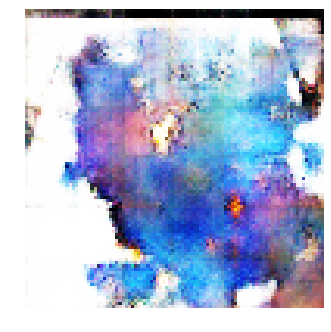


Epoch: 9360, D: -4.835, G: 5.103
Epoch: 9361, D: -6.034, G: 6.294
Epoch: 9362, D: -6.835, G: 5.916
Epoch: 9363, D: -4.753, G: 4.048
Epoch: 9364, D: -6.655, G: 6.45
Epoch: 9365, D: -4.669, G: 3.844
Epoch: 9366, D: -5.244, G: 5.353
Epoch: 9367, D: -5.905, G: 4.948
Epoch: 9368, D: -5.584, G: 5.07
Epoch: 9369, D: -6.729, G: 5.789
Epoch: 9370, D: -5.46, G: 4.477
Epoch: 9371, D: -5.746, G: 3.407
Epoch: 9372, D: -5.433, G: 6.695
Epoch: 9373, D: -6.601, G: 6.806
Epoch: 9374, D: -6.18, G: 4.904
Epoch: 9375, D: -5.276, G: 3.14
Epoch: 9376, D: -4.881, G: 3.918
Epoch: 9377, D: -7.26, G: 4.448
Epoch: 9378, D: -6.994, G: 3.535
Epoch: 9379, D: -6.244, G: 4.117


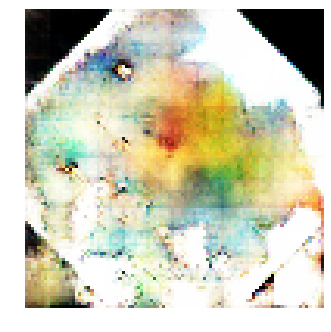


Epoch: 9380, D: -5.811, G: 4.989
Epoch: 9381, D: -5.69, G: 4.148
Epoch: 9382, D: -6.66, G: 2.922
Epoch: 9383, D: -5.756, G: 3.765
Epoch: 9384, D: -5.696, G: 6.163
Epoch: 9385, D: -5.698, G: 3.788
Epoch: 9386, D: -5.325, G: 5.015
Epoch: 9387, D: -5.711, G: 4.145
Epoch: 9388, D: -5.574, G: 4.882
Epoch: 9389, D: -5.694, G: 6.01
Epoch: 9390, D: -6.071, G: 4.755
Epoch: 9391, D: -5.992, G: 6.664
Epoch: 9392, D: -5.492, G: 3.114
Epoch: 9393, D: -6.56, G: 3.983
Epoch: 9394, D: -6.452, G: 2.418
Epoch: 9395, D: -6.259, G: 5.54
Epoch: 9396, D: -4.784, G: 4.557
Epoch: 9397, D: -5.747, G: 4.572
Epoch: 9398, D: -7.143, G: 3.171
Epoch: 9399, D: -5.274, G: 4.038


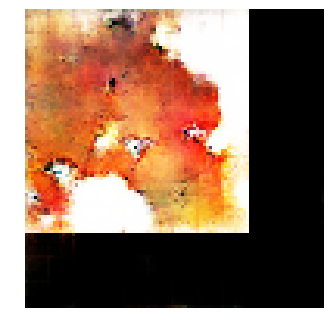


Epoch: 9400, D: -5.873, G: 3.37
Epoch: 9401, D: -6.064, G: 3.695
Epoch: 9402, D: -6.771, G: 0.2936
Epoch: 9403, D: -5.343, G: 5.896
Epoch: 9404, D: -6.075, G: 3.208
Epoch: 9405, D: -5.105, G: 2.998
Epoch: 9406, D: -6.498, G: 4.773
Epoch: 9407, D: -5.316, G: 5.092
Epoch: 9408, D: -6.619, G: 5.999
Epoch: 9409, D: -5.442, G: 4.966
Epoch: 9410, D: -6.433, G: 5.611
Epoch: 9411, D: -6.102, G: 5.071
Epoch: 9412, D: -5.612, G: 6.35
Epoch: 9413, D: -6.116, G: 5.327
Epoch: 9414, D: -5.056, G: 4.868
Epoch: 9415, D: -5.401, G: 2.325
Epoch: 9416, D: -5.158, G: 5.943
Epoch: 9417, D: -6.849, G: 5.398
Epoch: 9418, D: -4.208, G: 3.367
Epoch: 9419, D: -6.656, G: 3.765


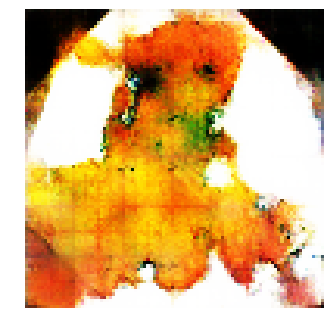


Epoch: 9420, D: -5.972, G: 3.246
Epoch: 9421, D: -6.287, G: 6.246
Epoch: 9422, D: -5.787, G: 4.584
Epoch: 9423, D: -5.681, G: 4.922
Epoch: 9424, D: -6.147, G: 4.055
Epoch: 9425, D: -6.488, G: 4.053
Epoch: 9426, D: -4.531, G: 3.708
Epoch: 9427, D: -4.984, G: 6.064
Epoch: 9428, D: -6.82, G: 6.172
Epoch: 9429, D: -6.136, G: 4.594
Epoch: 9430, D: -5.211, G: 4.36
Epoch: 9431, D: -4.786, G: 3.99
Epoch: 9432, D: -4.554, G: 5.562
Epoch: 9433, D: -6.01, G: 5.285
Epoch: 9434, D: -6.047, G: 3.561
Epoch: 9435, D: -5.28, G: 5.859
Epoch: 9436, D: -6.039, G: 6.867
Epoch: 9437, D: -7.714, G: 4.607
Epoch: 9438, D: -5.609, G: 4.265
Epoch: 9439, D: -6.011, G: 6.163


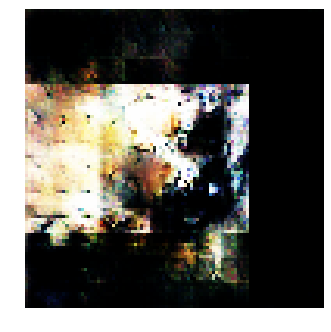


Epoch: 9440, D: -6.033, G: 5.836
Epoch: 9441, D: -6.46, G: 4.083
Epoch: 9442, D: -6.372, G: 0.9054
Epoch: 9443, D: -4.76, G: 5.499
Epoch: 9444, D: -6.132, G: 4.54
Epoch: 9445, D: -5.599, G: 5.081
Epoch: 9446, D: -5.63, G: 4.867
Epoch: 9447, D: -6.563, G: 2.294
Epoch: 9448, D: -4.575, G: 3.487
Epoch: 9449, D: -6.411, G: 5.319
Epoch: 9450, D: -5.91, G: 4.409
Epoch: 9451, D: -5.482, G: 3.511
Epoch: 9452, D: -5.613, G: 4.301
Epoch: 9453, D: -5.555, G: 4.41
Epoch: 9454, D: -6.514, G: 3.599
Epoch: 9455, D: -5.259, G: 3.927
Epoch: 9456, D: -5.185, G: 3.098
Epoch: 9457, D: -5.486, G: 3.44
Epoch: 9458, D: -5.215, G: 3.675
Epoch: 9459, D: -7.028, G: 2.456


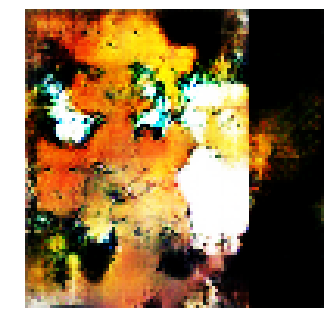


Epoch: 9460, D: -5.747, G: 6.559
Epoch: 9461, D: -5.977, G: 4.41
Epoch: 9462, D: -6.757, G: 4.709
Epoch: 9463, D: -6.382, G: 3.351
Epoch: 9464, D: -6.106, G: 6.117
Epoch: 9465, D: -6.787, G: 2.348
Epoch: 9466, D: -6.814, G: 2.809
Epoch: 9467, D: -7.272, G: 6.274
Epoch: 9468, D: -5.161, G: 4.978
Epoch: 9469, D: -4.362, G: 2.671
Epoch: 9470, D: -6.112, G: 3.464
Epoch: 9471, D: -6.109, G: 4.344
Epoch: 9472, D: -5.228, G: 3.321
Epoch: 9473, D: -5.595, G: 5.156
Epoch: 9474, D: -5.959, G: 4.655
Epoch: 9475, D: -6.33, G: 2.468
Epoch: 9476, D: -4.609, G: 2.982
Epoch: 9477, D: -5.724, G: 3.019
Epoch: 9478, D: -6.58, G: 4.965
Epoch: 9479, D: -6.287, G: 3.428


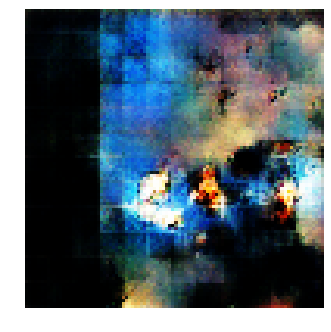


Epoch: 9480, D: -5.548, G: 6.601
Epoch: 9481, D: -5.219, G: 4.302
Epoch: 9482, D: -6.222, G: 3.734
Epoch: 9483, D: -6.855, G: 3.889
Epoch: 9484, D: -6.554, G: 3.648
Epoch: 9485, D: -6.985, G: 3.803
Epoch: 9486, D: -6.673, G: 4.392
Epoch: 9487, D: -6.313, G: 5.546
Epoch: 9488, D: -5.41, G: 3.879
Epoch: 9489, D: -5.724, G: 5.014
Epoch: 9490, D: -5.522, G: 4.743
Epoch: 9491, D: -5.679, G: 4.346
Epoch: 9492, D: -5.771, G: 4.039
Epoch: 9493, D: -6.71, G: 6.323
Epoch: 9494, D: -5.532, G: 1.967
Epoch: 9495, D: -5.771, G: 4.376
Epoch: 9496, D: -5.691, G: 5.09
Epoch: 9497, D: -5.092, G: 7.517
Epoch: 9498, D: -6.306, G: 7.592
Epoch: 9499, D: -5.838, G: 5.885


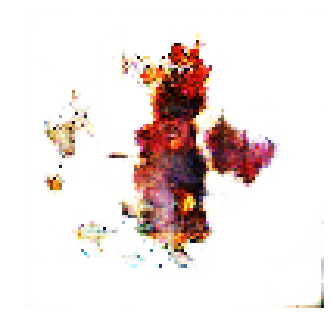


Epoch: 9500, D: -6.476, G: 6.737
Epoch: 9501, D: -5.392, G: 3.215
Epoch: 9502, D: -5.148, G: 4.626
Epoch: 9503, D: -5.489, G: 3.507
Epoch: 9504, D: -5.69, G: 1.737
Epoch: 9505, D: -5.772, G: 4.305
Epoch: 9506, D: -4.833, G: 7.258
Epoch: 9507, D: -6.027, G: 5.346
Epoch: 9508, D: -7.172, G: 3.981
Epoch: 9509, D: -7.542, G: 1.982
Epoch: 9510, D: -5.369, G: 5.149
Epoch: 9511, D: -4.858, G: 3.547
Epoch: 9512, D: -5.064, G: 6.73
Epoch: 9513, D: -4.384, G: 5.439
Epoch: 9514, D: -5.381, G: 7.317
Epoch: 9515, D: -5.927, G: 4.778
Epoch: 9516, D: -5.562, G: 4.817
Epoch: 9517, D: -6.116, G: 3.515
Epoch: 9518, D: -6.503, G: 3.563
Epoch: 9519, D: -6.033, G: 3.087


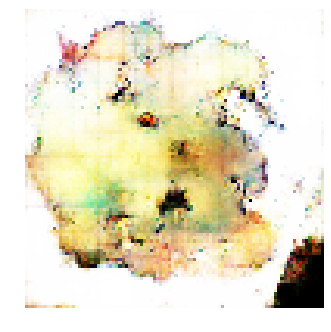


Epoch: 9520, D: -5.944, G: 3.367
Epoch: 9521, D: -6.529, G: 2.196
Epoch: 9522, D: -4.483, G: 2.171
Epoch: 9523, D: -5.204, G: 5.68
Epoch: 9524, D: -5.692, G: 6.651
Epoch: 9525, D: -5.534, G: 3.671
Epoch: 9526, D: -6.341, G: 4.075
Epoch: 9527, D: -6.888, G: 4.721
Epoch: 9528, D: -7.194, G: 3.935
Epoch: 9529, D: -5.604, G: 4.454
Epoch: 9530, D: -5.106, G: 4.369
Epoch: 9531, D: -6.649, G: 3.914
Epoch: 9532, D: -6.183, G: 3.861
Epoch: 9533, D: -6.87, G: 2.594
Epoch: 9534, D: -6.829, G: 3.744
Epoch: 9535, D: -5.352, G: 3.438
Epoch: 9536, D: -6.351, G: 4.955
Epoch: 9537, D: -5.197, G: 9.02
Epoch: 9538, D: -6.09, G: 4.868
Epoch: 9539, D: -6.705, G: 4.242


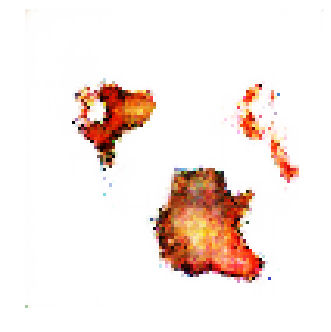


Epoch: 9540, D: -7.574, G: 3.168
Epoch: 9541, D: -6.1, G: 4.592
Epoch: 9542, D: -5.496, G: 3.561
Epoch: 9543, D: -6.857, G: 5.201
Epoch: 9544, D: -5.126, G: 4.275
Epoch: 9545, D: -5.921, G: 3.07
Epoch: 9546, D: -6.762, G: 3.181
Epoch: 9547, D: -7.037, G: 2.312
Epoch: 9548, D: -7.086, G: 2.849
Epoch: 9549, D: -6.55, G: 1.634
Epoch: 9550, D: -5.129, G: 5.273
Epoch: 9551, D: -6.525, G: 4.55
Epoch: 9552, D: -5.108, G: 3.479
Epoch: 9553, D: -5.224, G: 5.149
Epoch: 9554, D: -4.849, G: 4.154
Epoch: 9555, D: -5.881, G: 5.502
Epoch: 9556, D: -5.055, G: 5.429
Epoch: 9557, D: -5.83, G: 4.028
Epoch: 9558, D: -5.288, G: 1.612
Epoch: 9559, D: -5.764, G: 3.487


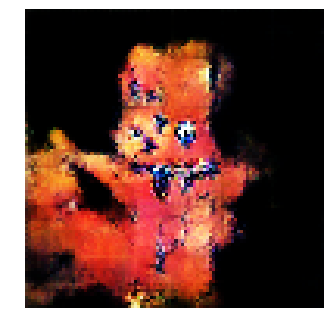


Epoch: 9560, D: -6.122, G: 3.481
Epoch: 9561, D: -6.53, G: 4.804
Epoch: 9562, D: -5.632, G: 4.659
Epoch: 9563, D: -6.331, G: 3.82
Epoch: 9564, D: -6.785, G: 3.272
Epoch: 9565, D: -6.019, G: 2.866
Epoch: 9566, D: -5.202, G: 7.089
Epoch: 9567, D: -4.934, G: 3.708
Epoch: 9568, D: -7.36, G: 5.627
Epoch: 9569, D: -7.669, G: 3.457
Epoch: 9570, D: -7.181, G: 4.505
Epoch: 9571, D: -6.773, G: 2.545
Epoch: 9572, D: -6.706, G: 1.903
Epoch: 9573, D: -5.549, G: 3.682
Epoch: 9574, D: -6.056, G: 7.233
Epoch: 9575, D: -6.009, G: 4.96
Epoch: 9576, D: -7.874, G: 2.555
Epoch: 9577, D: -6.433, G: 4.826
Epoch: 9578, D: -6.953, G: 2.82
Epoch: 9579, D: -5.684, G: 2.377


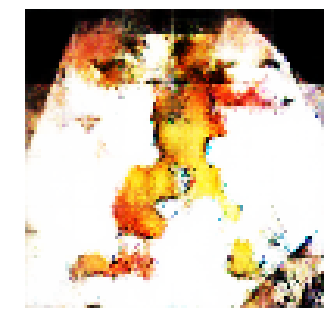


Epoch: 9580, D: -4.795, G: 5.236
Epoch: 9581, D: -5.949, G: 5.548
Epoch: 9582, D: -7.069, G: 4.258
Epoch: 9583, D: -7.278, G: 3.844
Epoch: 9584, D: -5.982, G: 6.462
Epoch: 9585, D: -7.077, G: 3.882
Epoch: 9586, D: -5.913, G: 2.766
Epoch: 9587, D: -6.778, G: 2.787
Epoch: 9588, D: -6.637, G: 5.481
Epoch: 9589, D: -6.899, G: 5.226
Epoch: 9590, D: -6.237, G: 3.89
Epoch: 9591, D: -6.082, G: 2.669
Epoch: 9592, D: -5.433, G: 5.27
Epoch: 9593, D: -7.368, G: 4.529
Epoch: 9594, D: -7.804, G: 4.89
Epoch: 9595, D: -7.275, G: 4.674
Epoch: 9596, D: -4.516, G: 5.171
Epoch: 9597, D: -6.084, G: 3.009
Epoch: 9598, D: -6.67, G: 3.991
Epoch: 9599, D: -7.236, G: 5.76


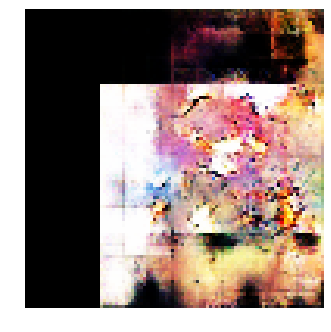


Epoch: 9600, D: -5.548, G: 3.442
Epoch: 9601, D: -6.396, G: 5.695
Epoch: 9602, D: -5.91, G: 4.453
Epoch: 9603, D: -6.175, G: 5.498
Epoch: 9604, D: -4.388, G: 4.712
Epoch: 9605, D: -6.303, G: 6.578
Epoch: 9606, D: -6.295, G: 5.18
Epoch: 9607, D: -6.419, G: 4.378
Epoch: 9608, D: -6.927, G: 2.243
Epoch: 9609, D: -4.334, G: 3.608
Epoch: 9610, D: -4.952, G: 2.263
Epoch: 9611, D: -5.177, G: 4.62
Epoch: 9612, D: -6.038, G: 3.972
Epoch: 9613, D: -5.857, G: 3.791
Epoch: 9614, D: -5.662, G: 4.5
Epoch: 9615, D: -6.043, G: 4.111
Epoch: 9616, D: -4.197, G: 5.23
Epoch: 9617, D: -6.743, G: 4.748
Epoch: 9618, D: -6.934, G: 5.53
Epoch: 9619, D: -4.871, G: 5.201


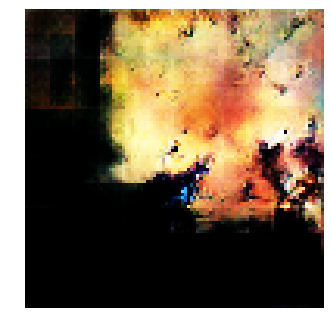


Epoch: 9620, D: -6.129, G: 3.429
Epoch: 9621, D: -6.477, G: 6.698
Epoch: 9622, D: -6.968, G: 1.943
Epoch: 9623, D: -6.703, G: 5.903
Epoch: 9624, D: -6.266, G: 4.344
Epoch: 9625, D: -6.59, G: 2.335
Epoch: 9626, D: -5.277, G: 5.418
Epoch: 9627, D: -7.521, G: 2.062
Epoch: 9628, D: -5.66, G: 3.692
Epoch: 9629, D: -6.791, G: 3.16
Epoch: 9630, D: -5.892, G: 3.254
Epoch: 9631, D: -6.298, G: 2.564
Epoch: 9632, D: -6.601, G: 3.017
Epoch: 9633, D: -6.402, G: 0.2299
Epoch: 9634, D: -5.766, G: 3.299
Epoch: 9635, D: -5.478, G: 4.427
Epoch: 9636, D: -4.275, G: 3.603
Epoch: 9637, D: -6.065, G: 5.717
Epoch: 9638, D: -6.169, G: 3.054
Epoch: 9639, D: -5.643, G: 4.425


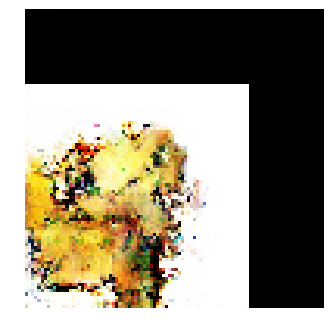


Epoch: 9640, D: -6.35, G: 4.27
Epoch: 9641, D: -6.653, G: 4.026
Epoch: 9642, D: -8.261, G: 2.987
Epoch: 9643, D: -5.498, G: 3.617
Epoch: 9644, D: -6.395, G: 5.918
Epoch: 9645, D: -5.273, G: 5.738
Epoch: 9646, D: -6.247, G: 3.559
Epoch: 9647, D: -4.141, G: 3.439
Epoch: 9648, D: -6.228, G: 4.38
Epoch: 9649, D: -7.035, G: 7.615
Epoch: 9650, D: -5.908, G: 3.92
Epoch: 9651, D: -6.81, G: 3.741
Epoch: 9652, D: -6.669, G: 5.362
Epoch: 9653, D: -6.453, G: 5.539
Epoch: 9654, D: -5.798, G: 3.102
Epoch: 9655, D: -6.25, G: 3.429
Epoch: 9656, D: -6.224, G: 5.431
Epoch: 9657, D: -5.175, G: 4.725
Epoch: 9658, D: -5.853, G: 6.843
Epoch: 9659, D: -6.749, G: 5.107


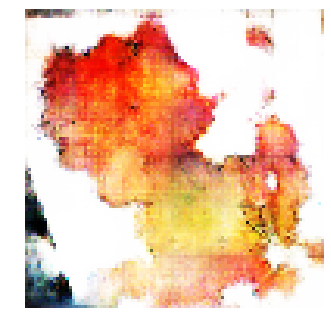


Epoch: 9660, D: -6.046, G: 5.308
Epoch: 9661, D: -6.684, G: 3.781
Epoch: 9662, D: -5.768, G: 7.188
Epoch: 9663, D: -6.049, G: 6.611
Epoch: 9664, D: -5.983, G: 5.25
Epoch: 9665, D: -6.136, G: 5.611
Epoch: 9666, D: -6.556, G: 4.202
Epoch: 9667, D: -4.407, G: 3.963
Epoch: 9668, D: -5.215, G: 3.364
Epoch: 9669, D: -5.823, G: 4.204
Epoch: 9670, D: -6.631, G: 2.61
Epoch: 9671, D: -4.988, G: 5.099
Epoch: 9672, D: -6.804, G: 3.541
Epoch: 9673, D: -6.52, G: 1.565
Epoch: 9674, D: -6.264, G: 3.83
Epoch: 9675, D: -6.941, G: 3.686
Epoch: 9676, D: -6.159, G: 3.8
Epoch: 9677, D: -5.773, G: 4.387
Epoch: 9678, D: -6.205, G: 3.32
Epoch: 9679, D: -5.105, G: 3.147


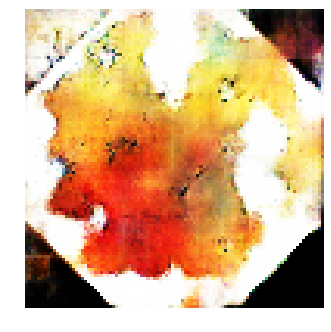


Epoch: 9680, D: -4.817, G: 4.245
Epoch: 9681, D: -5.997, G: 3.877
Epoch: 9682, D: -6.686, G: 5.477
Epoch: 9683, D: -6.065, G: 6.171
Epoch: 9684, D: -6.615, G: 1.181
Epoch: 9685, D: -5.741, G: 3.414
Epoch: 9686, D: -6.9, G: 4.146
Epoch: 9687, D: -6.072, G: 4.089
Epoch: 9688, D: -5.641, G: 2.077
Epoch: 9689, D: -5.491, G: 3.588
Epoch: 9690, D: -5.472, G: 4.886
Epoch: 9691, D: -6.045, G: 6.204
Epoch: 9692, D: -4.94, G: 5.077
Epoch: 9693, D: -5.48, G: 2.135
Epoch: 9694, D: -6.788, G: 4.404
Epoch: 9695, D: -6.967, G: 3.519
Epoch: 9696, D: -5.016, G: 2.05
Epoch: 9697, D: -5.581, G: 2.487
Epoch: 9698, D: -5.921, G: 3.76
Epoch: 9699, D: -6.633, G: 5.535


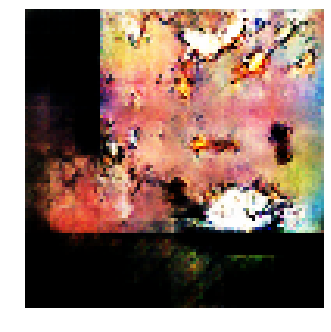


Epoch: 9700, D: -5.913, G: 1.144
Epoch: 9701, D: -7.055, G: 3.741
Epoch: 9702, D: -6.827, G: 2.296
Epoch: 9703, D: -7.24, G: 4.379
Epoch: 9704, D: -4.873, G: 4.218
Epoch: 9705, D: -8.114, G: 4.548
Epoch: 9706, D: -4.887, G: 1.483
Epoch: 9707, D: -7.502, G: 4.266
Epoch: 9708, D: -6.635, G: 4.143
Epoch: 9709, D: -6.659, G: 3.823
Epoch: 9710, D: -5.624, G: 5.915
Epoch: 9711, D: -6.102, G: 3.795
Epoch: 9712, D: -6.315, G: 6.405
Epoch: 9713, D: -4.921, G: 2.941
Epoch: 9714, D: -5.701, G: 3.039
Epoch: 9715, D: -6.068, G: 4.238
Epoch: 9716, D: -5.351, G: 4.446
Epoch: 9717, D: -5.854, G: 4.885
Epoch: 9718, D: -6.63, G: 5.604
Epoch: 9719, D: -5.755, G: 2.935


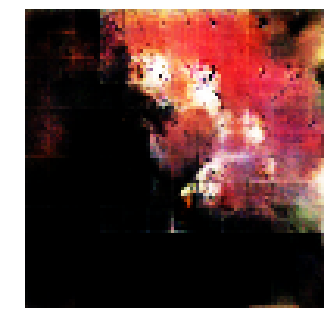


Epoch: 9720, D: -5.813, G: 2.053
Epoch: 9721, D: -7.392, G: 3.822
Epoch: 9722, D: -6.579, G: 3.236
Epoch: 9723, D: -7.262, G: 1.442
Epoch: 9724, D: -6.546, G: 2.791
Epoch: 9725, D: -6.316, G: 5.946
Epoch: 9726, D: -5.719, G: 7.479
Epoch: 9727, D: -6.465, G: 4.645
Epoch: 9728, D: -5.714, G: 3.06
Epoch: 9729, D: -5.762, G: 4.13
Epoch: 9730, D: -6.649, G: 5.035
Epoch: 9731, D: -6.905, G: 2.927
Epoch: 9732, D: -5.355, G: 1.756
Epoch: 9733, D: -7.109, G: 3.092
Epoch: 9734, D: -6.069, G: 2.645
Epoch: 9735, D: -5.808, G: 3.86
Epoch: 9736, D: -5.127, G: 3.776
Epoch: 9737, D: -5.894, G: 4.315
Epoch: 9738, D: -6.76, G: 2.268
Epoch: 9739, D: -5.633, G: 4.437


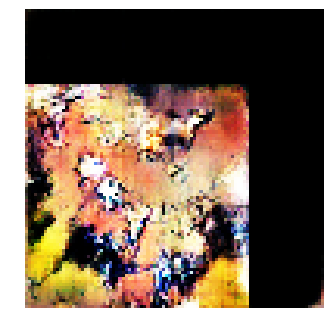


Epoch: 9740, D: -6.138, G: 4.632
Epoch: 9741, D: -7.373, G: 2.288
Epoch: 9742, D: -4.984, G: 2.992
Epoch: 9743, D: -5.583, G: 4.45
Epoch: 9744, D: -6.509, G: 2.766
Epoch: 9745, D: -4.935, G: 2.248
Epoch: 9746, D: -5.43, G: 5.676
Epoch: 9747, D: -6.137, G: 3.942
Epoch: 9748, D: -6.526, G: 3.657
Epoch: 9749, D: -4.674, G: 4.77
Epoch: 9750, D: -6.697, G: 7.767
Epoch: 9751, D: -6.778, G: 5.987
Epoch: 9752, D: -5.468, G: 4.722
Epoch: 9753, D: -5.53, G: 5.193
Epoch: 9754, D: -5.328, G: 7.734
Epoch: 9755, D: -6.975, G: 5.505
Epoch: 9756, D: -6.566, G: 5.579
Epoch: 9757, D: -7.317, G: 5.927
Epoch: 9758, D: -4.759, G: 4.302
Epoch: 9759, D: -6.373, G: 5.014


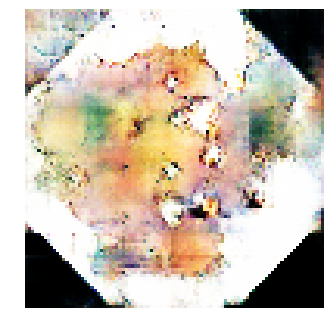


Epoch: 9760, D: -6.502, G: 2.656
Epoch: 9761, D: -5.332, G: 3.98
Epoch: 9762, D: -4.922, G: 3.907
Epoch: 9763, D: -7.089, G: 3.221
Epoch: 9764, D: -6.404, G: 1.993
Epoch: 9765, D: -6.007, G: 2.055
Epoch: 9766, D: -8.04, G: 3.289
Epoch: 9767, D: -7.352, G: 2.766
Epoch: 9768, D: -7.347, G: 3.998
Epoch: 9769, D: -5.295, G: 2.706
Epoch: 9770, D: -6.11, G: 5.609
Epoch: 9771, D: -6.601, G: 3.14
Epoch: 9772, D: -6.648, G: 2.946
Epoch: 9773, D: -5.228, G: 4.274
Epoch: 9774, D: -4.682, G: 1.526
Epoch: 9775, D: -7.314, G: 3.927
Epoch: 9776, D: -5.57, G: 2.149
Epoch: 9777, D: -5.55, G: 1.368
Epoch: 9778, D: -5.364, G: 5.905
Epoch: 9779, D: -4.801, G: 3.826


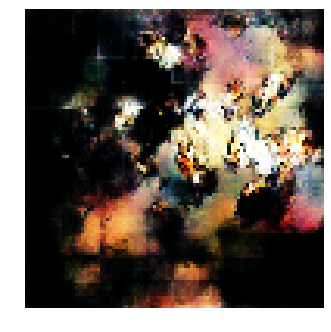


Epoch: 9780, D: -7.33, G: 2.826
Epoch: 9781, D: -5.884, G: 5.062
Epoch: 9782, D: -5.498, G: 5.448
Epoch: 9783, D: -5.623, G: 2.041
Epoch: 9784, D: -6.627, G: 3.5
Epoch: 9785, D: -6.612, G: 2.535
Epoch: 9786, D: -5.011, G: 2.19
Epoch: 9787, D: -6.413, G: 4.248
Epoch: 9788, D: -4.868, G: 2.771
Epoch: 9789, D: -6.571, G: 4.032
Epoch: 9790, D: -6.979, G: 5.834
Epoch: 9791, D: -5.591, G: 4.419
Epoch: 9792, D: -6.139, G: 5.932
Epoch: 9793, D: -7.418, G: 3.216
Epoch: 9794, D: -5.092, G: 3.08
Epoch: 9795, D: -5.848, G: 6.422
Epoch: 9796, D: -6.868, G: 3.174
Epoch: 9797, D: -6.255, G: 1.548
Epoch: 9798, D: -6.013, G: 4.741
Epoch: 9799, D: -4.822, G: 3.076


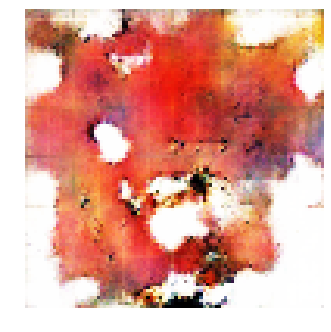


Epoch: 9800, D: -6.946, G: 1.497
Epoch: 9801, D: -5.094, G: 3.355
Epoch: 9802, D: -7.319, G: 5.834
Epoch: 9803, D: -7.137, G: 3.411
Epoch: 9804, D: -5.89, G: 5.604
Epoch: 9805, D: -5.999, G: 3.966
Epoch: 9806, D: -5.439, G: 3.578
Epoch: 9807, D: -5.29, G: 5.863
Epoch: 9808, D: -5.948, G: 6.271
Epoch: 9809, D: -6.337, G: 3.289
Epoch: 9810, D: -4.782, G: 5.933
Epoch: 9811, D: -5.402, G: 2.505
Epoch: 9812, D: -6.553, G: 3.945
Epoch: 9813, D: -6.051, G: 5.829
Epoch: 9814, D: -6.514, G: 3.934
Epoch: 9815, D: -5.334, G: 4.388
Epoch: 9816, D: -4.754, G: 4.204
Epoch: 9817, D: -6.437, G: 3.887
Epoch: 9818, D: -5.264, G: 4.181
Epoch: 9819, D: -6.431, G: 2.289


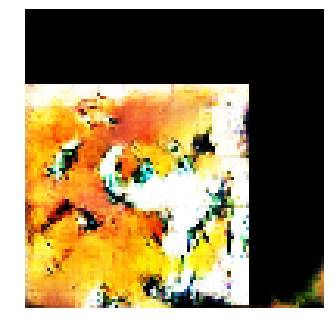


Epoch: 9820, D: -5.952, G: 3.569
Epoch: 9821, D: -5.297, G: 3.272
Epoch: 9822, D: -6.46, G: 4.636
Epoch: 9823, D: -5.501, G: 5.841
Epoch: 9824, D: -5.228, G: 2.595
Epoch: 9825, D: -5.43, G: 4.063
Epoch: 9826, D: -4.767, G: 4.224
Epoch: 9827, D: -6.964, G: 4.342
Epoch: 9828, D: -6.871, G: 3.521
Epoch: 9829, D: -6.574, G: 2.359
Epoch: 9830, D: -5.499, G: 5.377
Epoch: 9831, D: -6.696, G: 5.393
Epoch: 9832, D: -6.017, G: 3.378
Epoch: 9833, D: -6.217, G: 6.134
Epoch: 9834, D: -5.613, G: 5.812
Epoch: 9835, D: -5.647, G: 4.516
Epoch: 9836, D: -5.931, G: 7.622
Epoch: 9837, D: -6.766, G: 2.189
Epoch: 9838, D: -5.508, G: 5.074
Epoch: 9839, D: -5.799, G: 5.657


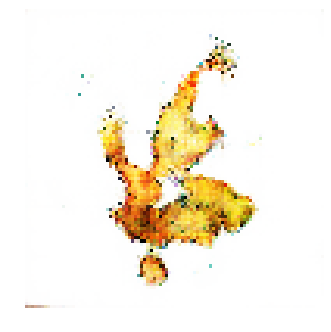


Epoch: 9840, D: -6.463, G: 2.72
Epoch: 9841, D: -6.806, G: 4.771
Epoch: 9842, D: -6.294, G: 1.972
Epoch: 9843, D: -6.504, G: 3.885
Epoch: 9844, D: -5.925, G: 4.628
Epoch: 9845, D: -7.223, G: 3.614
Epoch: 9846, D: -6.528, G: 2.99
Epoch: 9847, D: -6.142, G: 7.319
Epoch: 9848, D: -6.136, G: 6.708
Epoch: 9849, D: -4.123, G: 3.479
Epoch: 9850, D: -6.256, G: 3.742
Epoch: 9851, D: -7.103, G: 3.883
Epoch: 9852, D: -4.237, G: 5.582
Epoch: 9853, D: -5.331, G: 6.714
Epoch: 9854, D: -5.165, G: 3.72
Epoch: 9855, D: -4.904, G: 4.782
Epoch: 9856, D: -6.818, G: 2.79
Epoch: 9857, D: -6.904, G: 3.992
Epoch: 9858, D: -6.163, G: 4.484
Epoch: 9859, D: -6.302, G: 4.171


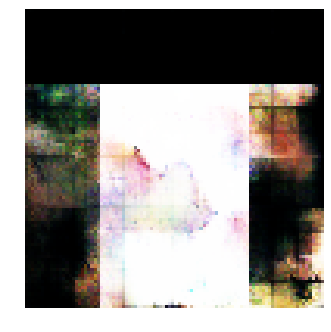


Epoch: 9860, D: -5.316, G: 3.838
Epoch: 9861, D: -5.012, G: 2.664
Epoch: 9862, D: -6.196, G: 5.011
Epoch: 9863, D: -7.187, G: 4.803
Epoch: 9864, D: -6.046, G: 4.033
Epoch: 9865, D: -6.301, G: 2.824
Epoch: 9866, D: -5.287, G: 3.783
Epoch: 9867, D: -6.853, G: 3.424
Epoch: 9868, D: -4.956, G: 3.82
Epoch: 9869, D: -6.458, G: 4.561
Epoch: 9870, D: -6.388, G: 4.169
Epoch: 9871, D: -4.81, G: 3.104
Epoch: 9872, D: -6.676, G: 3.627
Epoch: 9873, D: -4.345, G: 2.455
Epoch: 9874, D: -5.494, G: 4.661
Epoch: 9875, D: -5.983, G: 2.432
Epoch: 9876, D: -5.958, G: 3.184
Epoch: 9877, D: -7.475, G: 4.565
Epoch: 9878, D: -5.761, G: 4.916
Epoch: 9879, D: -6.083, G: 5.784


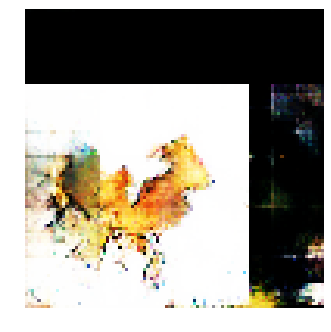


Epoch: 9880, D: -6.091, G: 3.19
Epoch: 9881, D: -6.83, G: 4.685
Epoch: 9882, D: -5.809, G: 9.691
Epoch: 9883, D: -6.543, G: 2.758
Epoch: 9884, D: -6.319, G: 3.029
Epoch: 9885, D: -5.717, G: 2.398
Epoch: 9886, D: -4.848, G: 5.357
Epoch: 9887, D: -5.704, G: 2.969
Epoch: 9888, D: -6.51, G: 6.288
Epoch: 9889, D: -5.825, G: 4.734
Epoch: 9890, D: -5.973, G: 4.851
Epoch: 9891, D: -5.786, G: 6.242
Epoch: 9892, D: -6.054, G: 5.757
Epoch: 9893, D: -6.612, G: 3.807
Epoch: 9894, D: -5.987, G: 2.416
Epoch: 9895, D: -5.985, G: 3.405
Epoch: 9896, D: -6.062, G: 1.855
Epoch: 9897, D: -5.034, G: 3.474
Epoch: 9898, D: -6.028, G: 3.356
Epoch: 9899, D: -5.879, G: 3.049


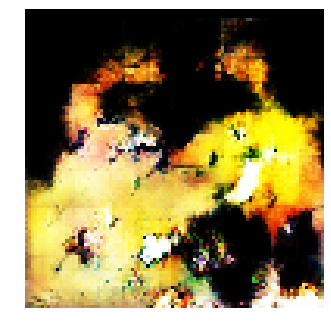


Epoch: 9900, D: -6.162, G: 4.839
Epoch: 9901, D: -6.425, G: 7.211
Epoch: 9902, D: -5.033, G: 2.935
Epoch: 9903, D: -6.147, G: 2.739
Epoch: 9904, D: -6.176, G: 5.807
Epoch: 9905, D: -6.608, G: 5.423
Epoch: 9906, D: -6.077, G: 4.214
Epoch: 9907, D: -6.449, G: 3.509
Epoch: 9908, D: -6.007, G: 5.771
Epoch: 9909, D: -7.077, G: 5.682
Epoch: 9910, D: -5.868, G: 6.316
Epoch: 9911, D: -5.722, G: 2.881
Epoch: 9912, D: -5.238, G: 5.167
Epoch: 9913, D: -5.939, G: 3.495
Epoch: 9914, D: -6.042, G: 5.355
Epoch: 9915, D: -6.082, G: 3.257
Epoch: 9916, D: -5.967, G: 2.594
Epoch: 9917, D: -7.038, G: 4.735
Epoch: 9918, D: -6.842, G: 2.206
Epoch: 9919, D: -5.641, G: 2.78


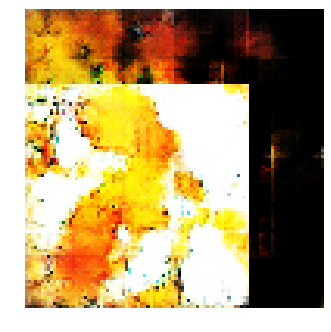


Epoch: 9920, D: -4.702, G: 5.831
Epoch: 9921, D: -8.031, G: 1.873
Epoch: 9922, D: -6.846, G: 5.471
Epoch: 9923, D: -5.571, G: 1.639
Epoch: 9924, D: -7.219, G: 3.59
Epoch: 9925, D: -6.707, G: 3.305
Epoch: 9926, D: -6.933, G: 2.86
Epoch: 9927, D: -5.98, G: 5.467
Epoch: 9928, D: -7.13, G: 2.964
Epoch: 9929, D: -7.342, G: 4.675
Epoch: 9930, D: -5.075, G: 3.52
Epoch: 9931, D: -7.148, G: 3.205
Epoch: 9932, D: -5.353, G: 1.101
Epoch: 9933, D: -5.193, G: 2.831
Epoch: 9934, D: -5.594, G: 3.358
Epoch: 9935, D: -5.9, G: 2.731
Epoch: 9936, D: -6.297, G: 4.591
Epoch: 9937, D: -6.682, G: 5.167
Epoch: 9938, D: -5.99, G: 2.939
Epoch: 9939, D: -6.908, G: 3.317


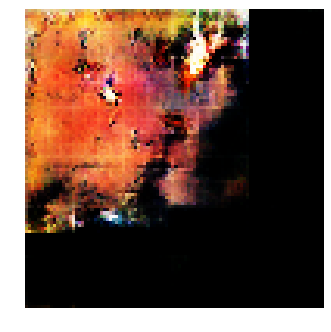


Epoch: 9940, D: -7.453, G: 2.926
Epoch: 9941, D: -7.225, G: 4.709
Epoch: 9942, D: -6.776, G: 1.056
Epoch: 9943, D: -6.413, G: 3.691
Epoch: 9944, D: -4.955, G: 4.154
Epoch: 9945, D: -6.354, G: 3.864
Epoch: 9946, D: -6.821, G: 5.416
Epoch: 9947, D: -7.529, G: 4.275
Epoch: 9948, D: -5.701, G: 3.643
Epoch: 9949, D: -5.703, G: 3.661
Epoch: 9950, D: -4.804, G: 3.36
Epoch: 9951, D: -7.272, G: 3.249
Epoch: 9952, D: -5.514, G: 3.845
Epoch: 9953, D: -6.353, G: 2.477
Epoch: 9954, D: -5.82, G: 3.02
Epoch: 9955, D: -4.734, G: 2.906
Epoch: 9956, D: -5.926, G: 4.549
Epoch: 9957, D: -5.238, G: 6.088
Epoch: 9958, D: -7.187, G: 7.127
Epoch: 9959, D: -4.161, G: 3.176


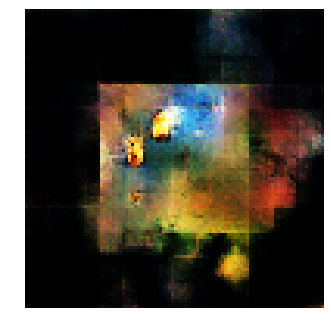


Epoch: 9960, D: -6.544, G: 2.802
Epoch: 9961, D: -5.622, G: 4.991
Epoch: 9962, D: -4.806, G: 5.906
Epoch: 9963, D: -5.7, G: 2.466
Epoch: 9964, D: -5.734, G: 2.622
Epoch: 9965, D: -4.969, G: 5.635
Epoch: 9966, D: -6.024, G: 2.654
Epoch: 9967, D: -7.039, G: 3.202
Epoch: 9968, D: -7.335, G: 2.783
Epoch: 9969, D: -8.173, G: 4.642
Epoch: 9970, D: -6.813, G: 2.902
Epoch: 9971, D: -5.022, G: 3.679
Epoch: 9972, D: -6.326, G: 3.694
Epoch: 9973, D: -6.572, G: 8.11
Epoch: 9974, D: -6.922, G: 3.884
Epoch: 9975, D: -5.547, G: 5.493
Epoch: 9976, D: -6.075, G: 2.934
Epoch: 9977, D: -5.801, G: 2.565
Epoch: 9978, D: -6.907, G: 2.999
Epoch: 9979, D: -6.503, G: 4.514


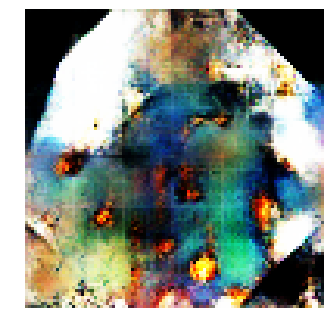


Epoch: 9980, D: -7.514, G: 4.832
Epoch: 9981, D: -6.186, G: 4.875
Epoch: 9982, D: -5.592, G: 4.821
Epoch: 9983, D: -7.514, G: 4.341
Epoch: 9984, D: -5.152, G: 5.217
Epoch: 9985, D: -5.141, G: 5.855
Epoch: 9986, D: -6.696, G: 4.484
Epoch: 9987, D: -5.136, G: 3.754
Epoch: 9988, D: -5.699, G: 4.84
Epoch: 9989, D: -6.681, G: 5.062
Epoch: 9990, D: -6.41, G: 5.599
Epoch: 9991, D: -6.42, G: 3.998
Epoch: 9992, D: -5.527, G: 4.414
Epoch: 9993, D: -5.166, G: 5.797
Epoch: 9994, D: -5.767, G: 4.316
Epoch: 9995, D: -5.319, G: 5.098
Epoch: 9996, D: -6.663, G: 3.686
Epoch: 9997, D: -5.823, G: 1.593
Epoch: 9998, D: -6.018, G: 4.388
Epoch: 9999, D: -5.374, G: 4.613


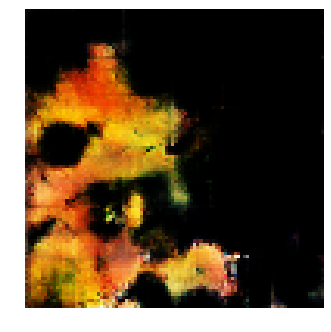

In [0]:
#with tf.Session() as sess:
sess = tf.Session()
saver = tf.train.Saver()
sess.run(tf.global_variables_initializer())
print('Initialization done!')


#Test saving and loading
#save_path = saver.save(sess, 'drive/Pokemon/Checkpoints/model.ckpt')
#ckpt = tf.train.latest_checkpoint('drive/Pokemon_Fire/GP_Checkpoints')
#print(ckpt)
#saver.restore(sess,ckpt)
#print('Restored!')

run_a_gan(sess,G_train_step,G_loss,D_train_step,D_loss,G_extra_step,D_extra_step,saver,num_epoch=12000)
 
save_inputs ={"isTrain":isTrain}
save_outputs = {"generator/generator_out":G_sample}

tf.saved_model.simple_save(sess, 'drive/Pokemon_Fire/Saved_model_Final
                           ',save_inputs,save_outputs)

In [0]:
save_inputs ={"isTrain":isTrain}
save_outputs = {"generator/generator_out":G_sample}

tf.saved_model.simple_save(sess, 'drive/Pokemon/Saved_modelGP',save_inputs,save_outputs)

In [0]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

Gen RAM Free: 10.4 GB  | Proc size: 5.2 GB
GPU RAM Free: 503MB | Used: 10936MB | Util  96% | Total 11439MB


In [0]:
!ps ax | grep python

   82 ?        Sl     0:10 /usr/bin/python2 /usr/local/bin/jupyter-notebook -y --no-browser --log-level=DEBUG --debug --NotebookApp.allow_origin="*" --NotebookApp.log_format="%(message)s" --NotebookApp.disable_check_xsrf=True --NotebookApp.token= --Session.key="" --Session.keyfile="" --ContentsManager.untitled_directory="Untitled Folder" --ContentsManager.untitled_file="Untitled File" --ContentsManager.untitled_notebook="Untitled Notebook" --KernelManager.autorestart=True --MultiKernelManager.default_kernel_name="python2" --ip="172.28.0.2" --port=9000 --port-retries=0 --notebook-dir="/content" --NotebookApp.base_url=/tun/m/gpu-1oh0mpcgklgqc/
   90 ?        Ssl  223:25 /usr/bin/python3 -m ipykernel_launcher -f /content/.local/share/jupyter/runtime/kernel-14d934e3-be51-46ed-9bdb-cf6fa1f8fa07.json
24021 ?        Ssl    0:10 /usr/bin/python3 -m ipykernel_launcher -f /content/.local/share/jupyter/runtime/kernel-bd5eb725-93eb-4089-b928-3dc6365a54c7.json
30723 pts/0    Ss+    0:00 /bin/sh -c 

In [0]:
!kill -9 90

In [0]:
#Clear everything
!kill -9 -1

In [0]:
sess.close()